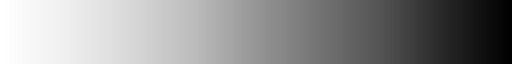

In [1]:
import seaborn as sns
sns.color_palette("Greys", as_cmap=True)

In [6]:
import numpy as np
import pandas as pd

In [13]:
from importlib import reload

In [30]:
from nlp_helper import custom_timer
custom_timer.time_now(asc=True)

'Sun Apr 23 18:32:12 2023'

In [8]:
from nlp_helper import preprocess
from nlp_helper import topic_model
from nlp_helper import classification
from nlp_helper import the_pipeline

In [18]:
df_review = pd.read_csv("df_review_clean.csv")
df_review

,X_raw,y,X_clust,X_class
0,Halo\n blibli. Sedikit saran untuk gratis ong...,pos,halo blibli saran gratis ongkirnya minimum 200...,halo blibli saran gratis ongkirnya minimum 200...
1,So far so good. Respon cepat.,pos,sok far sok bagus respon cepat,sok far sok bagus respon cepat
2,thank,neg,terima kasih,terima kasih
3,Aplikasi sering not responding di hp saya (as...,neg,aplikasi responding telepon genggam asus zenfo...,aplikasi tidak responding telepon genggam asus...
4,Gak ada komentar.,pos,komentar,enggak komentar
...,...,...,...,...
10035,I don't know,neg,i dont know,i dont know
10036,Good app,pos,bagus,bagus
10037,good app,pos,bagus,bagus
10038,Quite great app.,pos,quite great,quite great


## Preprocess

## Topic Model

0    halo blibli saran gratis ongkirnya minimum 200...
1                       sok far sok bagus respon cepat
2                                         terima kasih
3    aplikasi responding telepon genggam asus zenfo...
4                                             komentar
Name: X_clust, dtype: object
corpus_size 10040, chunksize 10, update_every 1000
Start at Sun Apr 23 18:39:54 2023 & will end after 5
(2).....00:00:37 (3).....00:00:38 (4).....00:00:35 (5).....00:00:34


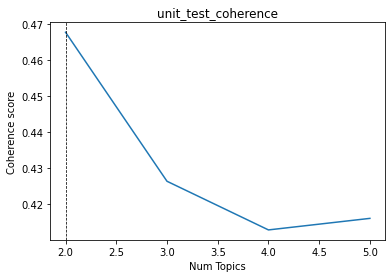

Best number of topics: 2


([2, 3, 4, 5],
 [0.46781474407721657,
  0.42641033637340636,
  0.41289441730890736,
  0.4161018246455085])

In [43]:
%%time
foo = topic_model.compute_coherence_values(df_review['X_clust'], "unit_test_coherence", start=2, limit=5)
foo

In [45]:
%%time
topic_model.show_topics(foo[1])

0    [easy, terbaik, apps, blibli, use, i, pelayana...
1    [blibli, bagus, mudah, belanja, pembayaran, ea...
2    [bagus, oke, kirim, barang, ongkos, blibli, so...
3    [cepat, great, daring, blibli, mantap, belanja...
4    [bagus, blibli, barang, aplikasi, nya, pelayan...
Name: 1, dtype: object

In [46]:
%%time
topic_model.show_topics(foo[1], prob=True)

,easy,terbaik,apps,blibli,use,i,pelayanan,promo,pengiriman,great,...,sok,cinta,customer,cepat,daring,mantap,fre,kasih,terima,nya
0,0.020265,0.018614,0.016256,0.015809,0.013183,0.01029,0.010104,0.008899,0.008628,0.008042,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.009481,0.000000,0.000000,0.024215,0.000000,0.00000,0.000000,0.008999,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.009724,0.000000,0.000000,0.011431,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.010365,0.010006,0.008395,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.016378,0.000000,0.00000,0.000000,0.000000,0.000000,0.016992,...,0.000000,0.000000,0.000000,0.020850,0.016886,0.015871,0.013684,0.012618,0.011766,0.000000
4,0.000000,0.000000,0.008665,0.019647,0.000000,0.00000,0.010449,0.006210,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.006999,0.000000,0.000000,0.000000,0.000000,0.000000,0.013925


In [109]:
%%time
topics_prob_df, topic_series = topic_model.infer_topics(foo[1], df_review['X_clust'])
topics_prob_df

Wall time: 9.48 s


,2,0,1,3,4
0,0.965880,0.008530,0.008530,0.008530,0.008530
1,0.881516,0.028936,0.029377,0.030215,0.029956
2,0.067416,0.066932,0.068043,0.730251,0.067359
3,0.025411,0.025434,0.897753,0.025963,0.025439
4,0.100195,0.100835,0.103332,0.594834,0.100805
...,...,...,...,...,...
10035,0.050734,0.051276,0.050802,0.796679,0.050510
10036,0.100666,0.100150,0.100502,0.100152,0.598531
10037,0.100660,0.100150,0.100500,0.100152,0.598538
10038,0.066765,0.067286,0.066883,0.732186,0.066880


In [70]:
topic_series

0        2
1        2
2        3
3        1
4        3
        ..
10035    3
10036    4
10037    4
10038    3
10039    2
Length: 10040, dtype: int64

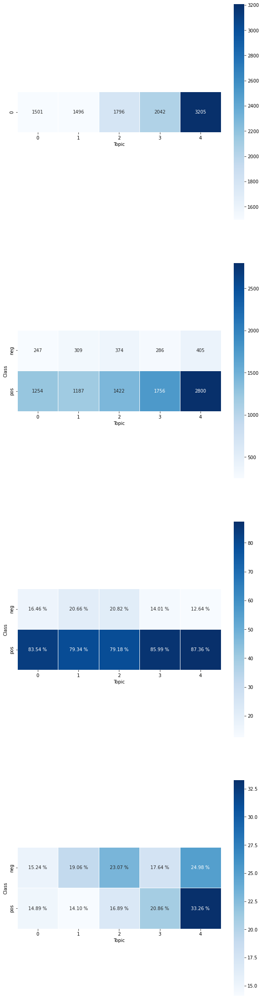

In [47]:
%%time
topic_model.cross_topic_label(foo[1], df_review['X_clust'], df_review['y'])

0    halo blibli saran gratis ongkirnya minimum 200...
1                       sok far sok bagus respon cepat
2                                         terima kasih
3    aplikasi responding telepon genggam asus zenfo...
4                                             komentar
Name: X_clust, dtype: object
corpus_size 10040, chunksize 10, update_every 1000
Start at Sun Apr 23 23:52:03 2023 & will end after 5
(1).....00:00:26 (2).....00:00:38 (3).....00:00:39 (4).....00:00:36 (5).....00:00:35


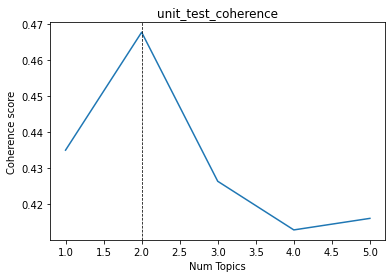

Best number of topics: 2
Wall time: 2min 56s


In [116]:
%%time
lda_model = topic_model.topic_model_fit(df_review['X_clust'], "unit_test_coherence", start=1, limit=5)

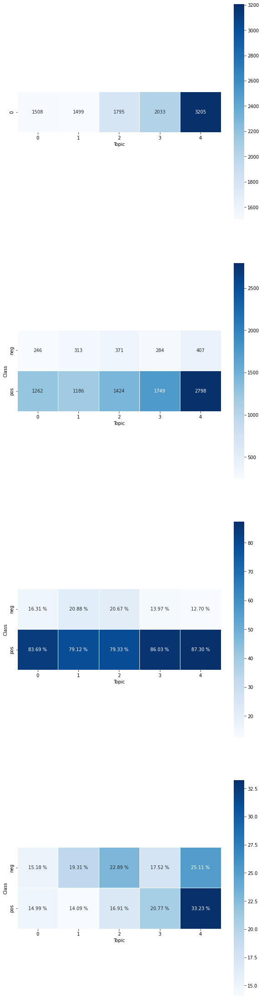

Wall time: 11.5 s


In [129]:
%%time
topics_df = topic_model.topic_model_transform(lda_model, df_review['X_clust'], df_review['y'])

In [130]:
B.head()

,2,0,1,3,4
0,0.965893,0.008527,0.008527,0.008527,0.008527
1,0.881510,0.028936,0.029377,0.030221,0.029956
2,0.067417,0.066932,0.068082,0.730210,0.067360
3,0.025411,0.025434,0.897761,0.025955,0.025439
4,0.100195,0.100834,0.103278,0.594889,0.100805


In [127]:
%%time
topic_model = reload(topic_model)
print(dir(topic_model))

['CoherenceModel', 'Dictionary', 'LdaModel', '__builtins__', '__cached__', '__file__', '__loader__', '__name__', '__package__', '__spec__', 'chain', 'compute_coherence_values', 'cross_topic_label', 'custom_timer', 'fillna_prob', 'generate_gensim_object', 'infer_topics', 'np', 'pd', 'plt', 'show_topics', 'sns', 'topic_model_fit', 'topic_model_transform']
Wall time: 999 µs


## Classification

In [155]:
%%time
A, B, C = classification.feature_extraction(df_review['X_class'], topics_df)

Wall time: 3.09 s


In [158]:
print(df_review.shape)
print(A.shape)
print(B.shape)
print(C.shape)

(10040, 4)
(10040, 7387)
(10040, 5)
(10040, 7392)


In [159]:
A.head(3)

,01,020418,03,0804,08813361264to,0909,0915,0nya,10,100,...,ةلجرط,ثثح,جيد,دبل,ددسن,ددسندمك,ظكظح,ففجرطبج,مزدوج,موديل
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [160]:
B.head(3)

,TOPIC #0,TOPIC #1,TOPIC #2,TOPIC #3,TOPIC #4
0,0.008528,0.008528,0.965888,0.008528,0.008528
1,0.028936,0.029377,0.881536,0.030195,0.029956
2,0.066932,0.068053,0.067416,0.730240,0.067359


In [161]:
C.head(3)

,01,020418,03,0804,08813361264to,0909,0915,0nya,10,100,...,ددسندمك,ظكظح,ففجرطبج,مزدوج,موديل,TOPIC #0,TOPIC #1,TOPIC #2,TOPIC #3,TOPIC #4
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.008528,0.008528,0.965888,0.008528,0.008528
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.028936,0.029377,0.881536,0.030195,0.029956
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.066932,0.068053,0.067416,0.730240,0.067359


In [184]:
pd.Series(np.array(df_review['y'])).value_counts().idxmin()

str

In [204]:
from sklearn.metrics import f1_score
try:
    f1_score([3, 3, 2, 2, 2, 2], [3, 2, 2, 2, 2, 2])
except ValueError as e:
    print(e)

pos_label=1 is not a valid label. It should be one of [2, 3]


In [205]:
from sklearn.metrics import make_scorer
classification.f1_auto([3, 3, 2, 2, 2, 2], [3, 2, 2, 2, 2, 2])

0.6666666666666666

In [211]:
from sklearn.linear_model import LogisticRegression
make_scorer(classification.f1_auto)(LogisticRegression().fit(pd.DataFrame([0, 1, 0, 1, 0, 1]), [3, 3, 2, 2, 2, 2]), pd.DataFrame([0, 1, 0, 1, 0, 1]), [3, 3, 2, 2, 2, 2])

0.0

In [220]:
%%time
lr, da, knn, rf = classification.classification_fit(B, df_review['y'], cv=2)

2
Fitting 2 folds for each of 2304 candidates, totalling 4608 fits
[CV 1/2; 1/2304] START dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1/2304] END dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1/2304] START dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1/2304] END dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 2/2304] START dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 2/2304] END dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none,

[CV 1/2; 28/2304] END dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 28/2304] START dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 28/2304] END dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 29/2304] START dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 29/2304] END dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 29/2304] START dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, sol

[CV 1/2; 55/2304] END dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 55/2304] START dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 55/2304] END dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 56/2304] START dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 56/2304] END dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 56/2304] START dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, pena

[CV 2/2; 83/2304] END dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 84/2304] START dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 84/2304] END dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 84/2304] START dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 84/2304] END dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 85/2304] START dual=True, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=el

[CV 2/2; 112/2304] END dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 113/2304] START dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 113/2304] END dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 113/2304] START dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 113/2304] END dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 114/2304] START dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, 

[CV 1/2; 140/2304] END dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=sag, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 140/2304] START dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 140/2304] END dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=sag, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 141/2304] START dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 141/2304] END dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=sag, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 141/2304] START dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, pen

[CV 1/2; 167/2304] END dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 167/2304] START dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 167/2304] END dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 168/2304] START dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 168/2304] END dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 168/2304] START dual=True, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=mul

[CV 2/2; 195/2304] END dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 196/2304] START dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 196/2304] END dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 196/2304] START dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 196/2304] END dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 197/2304] START dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=no

[CV 2/2; 223/2304] END dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 224/2304] START dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 224/2304] END dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 224/2304] START dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 224/2304] END dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 225/2304] START dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, t

[CV 2/2; 251/2304] END dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 252/2304] START dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 252/2304] END dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 252/2304] START dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 252/2304] END dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 253/2304] START dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_c

[CV 2/2; 280/2304] END dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 281/2304] START dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 281/2304] END dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 281/2304] START dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 281/2304] END dual=True, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 282/2304] START dual=True

[CV 2/2; 308/2304] END dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=sag, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 309/2304] START dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 309/2304] END dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=sag, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 309/2304] START dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 309/2304] END dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=sag, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 310/2304] START dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol

[CV 1/2; 337/2304] END dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 337/2304] START dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 337/2304] END dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 338/2304] START dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 338/2304] END dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 338/2304] START dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, m

[CV 1/2; 365/2304] END dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 365/2304] START dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 365/2304] END dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 366/2304] START dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 366/2304] END dual=True, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 366/2304] START dual=True, fit_intercept=True, l1_ratio=0.6, max_i

[CV 1/2; 394/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 394/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 394/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 395/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 395/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 395/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55

[CV 2/2; 419/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 420/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 420/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 420/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 420/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 421/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, sol

[CV 1/2; 448/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 448/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 448/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 449/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 449/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 449/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_it

[CV 2/2; 462/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 463/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 463/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 463/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 463/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 464/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multi

[CV 1/2; 476/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=sag, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 476/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 476/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=sag, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 477/2304] START dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 477/2304] END dual=True, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=sag, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 477/2304] START dual=True, fit_intercept=True, l1_ratio=

[CV 2/2; 490/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 491/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 491/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 491/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 491/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 492/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=s

[CV 2/2; 507/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 508/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 508/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 508/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 508/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 509/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, sol

[CV 2/2; 529/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 530/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 530/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 530/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 530/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 531/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class

[CV 1/2; 546/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 546/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 546/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 547/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=sag, tol=0.001
[CV 1/2; 547/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=sag, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 547/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multi

[CV 1/2; 569/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 569/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 569/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 570/2304] START dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 570/2304] END dual=True, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 570/2304] START dual=True, fit_inter

[CV 1/2; 593/2304] END dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 593/2304] START dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 593/2304] END dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 594/2304] START dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 594/2304] END dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 594/2304] START dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_

[CV 2/2; 617/2304] END dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 618/2304] START dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 618/2304] END dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 618/2304] START dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 618/2304] END dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 619/2304] START dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000

[CV 2/2; 641/2304] END dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 642/2304] START dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 642/2304] END dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 642/2304] START dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 642/2304] END dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 643/2304] START dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000

[CV 2/2; 663/2304] END dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 664/2304] START dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 664/2304] END dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 664/2304] START dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 664/2304] END dual=True, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 665/2304] START dual=True, fit_interce

[CV 1/2; 688/2304] END dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 688/2304] START dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 688/2304] END dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 689/2304] START dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 689/2304] END dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 689/2304] START dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=

[CV 1/2; 713/2304] END dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 713/2304] START dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 713/2304] END dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 714/2304] START dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 714/2304] END dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 714/2304] START dual=True, fit_intercept=False, l1_ratio=0.2,

[CV 2/2; 739/2304] END dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=sag, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 740/2304] START dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 740/2304] END dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=sag, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 740/2304] START dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 740/2304] END dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=sag, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 741/2304] START dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=m

[CV 2/2; 765/2304] END dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=sag, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 766/2304] START dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001
[CV 1/2; 766/2304] END dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 766/2304] START dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001
[CV 2/2; 766/2304] END dual=True, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 767/2304] START dual=True, fit_intercept=False, l1

[CV 1/2; 791/2304] END dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 791/2304] START dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 791/2304] END dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 792/2304] START dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 792/2304] END dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 792/2304] START dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, sol

[CV 2/2; 817/2304] START dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 817/2304] END dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 818/2304] START dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 818/2304] END dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 818/2304] START dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 818/2304] END dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, 

[CV 1/2; 844/2304] END dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 844/2304] START dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 844/2304] END dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 845/2304] START dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 845/2304] END dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 845/2304] START dual=True, fit_intercept=False, l1_ratio=0.4, 

[CV 1/2; 862/2304] END dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 862/2304] START dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001
[CV 2/2; 862/2304] END dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 863/2304] START dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 863/2304] END dual=True, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 863/2304] START dual=True, fit_intercept=False,

[CV 1/2; 880/2304] END dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 880/2304] START dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 880/2304] END dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 881/2304] START dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 881/2304] END dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 881/2304] START dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=

[CV 1/2; 907/2304] START dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=sag, tol=0.001
[CV 1/2; 907/2304] END dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=sag, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 907/2304] START dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=sag, tol=0.001
[CV 2/2; 907/2304] END dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=sag, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 908/2304] START dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 908/2304] END dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_sta

[CV 1/2; 934/2304] END dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 934/2304] START dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001
[CV 2/2; 934/2304] END dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 935/2304] START dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 935/2304] END dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 935/2304] START dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_clas

[CV 1/2; 949/2304] END dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 949/2304] START dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 949/2304] END dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 950/2304] START dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 950/2304] END dual=True, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 950/2304] START dual=True, fit_intercept=F

[CV 2/2; 967/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 968/2304] START dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 968/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 968/2304] START dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 968/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 969/2304] START dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state

[CV 2/2; 982/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 983/2304] START dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 983/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 983/2304] START dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 983/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 984/2304] START dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, so

[CV 1/2; 1001/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 1001/2304] START dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1001/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 1002/2304] START dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1002/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=newton-cg, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 1002/2304] START dual=True, fit_intercept=False, l1_rati

[CV 1/2; 1025/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 1025/2304] START dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1025/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 1026/2304] START dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1026/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=newton-cg, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 1026/2304] START dual=True, fit_intercept=False, l1_rati

[CV 2/2; 1054/2304] START dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1054/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 1055/2304] START dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1055/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 1055/2304] START dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1055/2304] END dual=True, fit_intercept=False, l1_ratio=0.8, max_iter=

[CV 1/2; 1084/2304] END dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1084/2304] START dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1084/2304] END dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 1085/2304] START dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1085/2304] END dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 1085/2304] START dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, ra

[CV 1/2; 1113/2304] END dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 1113/2304] START dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1113/2304] END dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 1114/2304] START dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1114/2304] END dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1114/2304] START dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class

[CV 2/2; 1141/2304] END dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 1142/2304] START dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1142/2304] END dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 1142/2304] START dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1142/2304] END dual=True, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 1143/2304] START dual=True, fit_intercept=Fal

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1153/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1154/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1154/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1154/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1154/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1155/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1155/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1155/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1155/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1156/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1156/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1156/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1156/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1157/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1157/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1157/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1157/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1158/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=o

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1158/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.9s
[CV 2/2; 1158/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1158/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1159/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1159/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1159/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1159/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1160/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1160/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1160/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1160/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1161/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1161/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1161/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1161/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1162/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1162/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1162/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=5

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1162/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1163/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1163/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1163/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1163/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1164/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1164/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1164/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1164/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1165/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1165/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1165/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, 

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1174/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1175/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1175/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1175/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1175/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1176/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, so

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 1/2; 1176/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1176/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1176/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1177/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1177/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1177/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solv

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1177/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1178/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1178/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1178/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1178/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1179/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=5

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1179/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1179/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1179/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1180/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1180/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1180/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_sta

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1180/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1181/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1181/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1181/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1181/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1182/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalt

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1182/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1182/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1182/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1183/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1183/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1183/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_sta

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1183/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1184/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1184/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1184/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1184/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1185/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1185/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1185/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1185/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1186/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1186/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1186/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sa

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1186/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1187/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1187/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1187/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1187/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1188/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, so

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1188/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1188/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1188/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1189/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1189/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1189/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1198/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1198/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1198/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1199/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1199/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1199/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_clas

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1201/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1201/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1201/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1202/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1202/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1202/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1202/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1203/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1203/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1203/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1203/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1204/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1204/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1204/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1204/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1205/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1205/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1205/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1205/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1206/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1206/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   1.9s
[CV 2/2; 1206/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1206/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1207/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1207/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.1s
[CV 2/2; 1207/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1207/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1208/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1208/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1208/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1208/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1209/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1209/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1209/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1209/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1210/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1210/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1210/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1210/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1211/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, mul

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1211/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1211/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1211/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1212/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1212/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1212/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1212/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1213/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1213/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1213/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1222/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1223/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1223/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1223/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1223/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1224/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1224/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1224/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1224/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1225/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1225/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1225/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1225/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1226/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1226/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1226/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1226/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1227/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1227/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1227/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1227/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1228/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1228/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 2/2; 1228/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1228/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1229/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1229/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1229/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1229/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1230/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1230/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1230/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1230/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1231/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1231/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1231/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1231/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1232/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1232/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1232/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1232/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1233/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1233/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1233/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1233/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1234/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1234/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1234/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1234/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1235/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=m

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1235/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1235/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1235/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1236/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1236/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1236/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1236/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1237/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1237/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1237/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=30

[CV 1/2; 1248/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1248/2304] START dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1248/2304] END dual=False, fit_intercept=True, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1249/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1249/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1249/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_ite

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1249/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1250/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1250/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1250/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1250/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1251/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, pena

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1251/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1251/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1251/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1252/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1252/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1252/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, 

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1252/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1253/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1253/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1253/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1253/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1254/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, m

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1254/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.9s
[CV 2/2; 1254/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1254/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1255/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1255/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1255/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, 

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1255/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1256/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1256/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1256/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1256/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1257/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, 

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1257/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1257/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1257/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1258/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1258/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1258/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1258/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1259/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1259/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1259/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1259/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1260/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=n

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1260/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1260/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1260/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1261/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1261/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1261/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, rando

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 1/2; 1270/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1270/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1270/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1271/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1271/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1271/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_st

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1271/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1272/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1272/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1272/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1272/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1273/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_sta

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1273/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1273/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1273/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1274/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1274/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1274/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, rand

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1274/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1275/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1275/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1275/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1275/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1276/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, rando

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1276/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1276/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1276/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1277/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1277/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1277/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=o

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1277/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1278/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1278/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1278/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1278/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1279/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ov

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1279/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1279/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1279/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1280/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1280/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1280/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=5

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1280/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1281/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1281/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1281/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1281/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1282/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1282/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1282/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1282/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1283/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1283/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1283/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_st

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1283/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1284/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1284/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1284/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1284/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1285/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, ra

[CV 1/2; 1296/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1296/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1296/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1297/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1297/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1297/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1297/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1298/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1298/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1298/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1298/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1299/2304] START dual=False, fit_intercept=True, l1_ratio=0

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1299/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1299/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1299/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1300/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1300/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1300/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1300/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1301/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1301/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1301/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1301/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1302/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1302/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   1.9s
[CV 2/2; 1302/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1302/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1303/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1303/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1303/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1303/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1304/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1304/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1304/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1304/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1305/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1305/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1305/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1305/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1306/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1306/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1306/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1306/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1307/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1307/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1307/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1307/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1308/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1308/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1308/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1308/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1309/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1309/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1309/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1309/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 1310/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1318/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1319/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1319/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1319/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1319/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1320/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1320/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1320/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1320/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1321/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1321/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1321/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1321/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1322/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1322/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1322/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1322/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1323/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1323/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1323/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1323/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1324/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1324/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 2/2; 1324/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1324/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1325/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1325/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1325/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1325/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1326/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1326/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1326/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1326/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1327/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1327/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1327/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1327/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1328/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1328/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1328/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1328/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1329/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1329/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1329/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1329/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1330/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1330/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1330/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1330/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1331/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1331/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1331/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1331/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1332/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1332/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1332/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1332/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1333/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1333/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1333/2304] START dual=False, fit_intercept=True, l1_ratio=0.2,

[CV 2/2; 1343/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1344/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1344/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1344/2304] START dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1344/2304] END dual=False, fit_intercept=True, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1345/2304] START dual=False, fit_inte

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1346/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1346/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1346/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1347/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1347/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1347/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penal

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1347/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1348/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1348/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1348/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1348/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1349/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_cla

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1349/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1349/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1349/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1350/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1350/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.9s
[CV 2/2; 1350/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1350/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1351/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1351/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1351/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, 

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1351/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1352/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1352/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1352/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1352/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1353/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, 

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1353/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1353/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1353/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1354/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1354/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1354/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1354/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1355/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1355/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1355/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1355/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1356/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=n

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1356/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1356/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1356/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1357/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1357/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1357/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, rando

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 1/2; 1366/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1366/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1366/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1367/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1367/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1367/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_st

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1367/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1368/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1368/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1368/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1368/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1369/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_sta

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1369/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1369/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1369/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1370/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1370/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1370/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, rand

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1370/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1371/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1371/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1371/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1371/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1372/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, rando

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1372/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1372/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1372/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1373/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1373/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1373/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=o

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1373/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1374/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1374/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1374/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1374/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1375/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ov

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1375/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1375/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1375/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1376/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1376/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1376/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=5

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1376/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1377/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1377/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1377/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1377/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1378/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1378/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1378/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1378/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1379/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1379/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1379/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_st

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1379/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1380/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1380/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1380/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1380/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1381/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=elasticnet, ra

[CV 1/2; 1392/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1392/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1392/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1393/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1393/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1393/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1393/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1394/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1394/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1394/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1394/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1395/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1395/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1395/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1395/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1396/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1396/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1396/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1396/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1397/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1397/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1397/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1397/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1398/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1398/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   1.9s
[CV 2/2; 1398/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1398/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1399/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1399/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1399/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1399/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1400/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1400/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1400/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1400/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1401/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1401/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1401/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1401/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1402/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1402/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1402/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1402/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1403/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1403/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1403/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1403/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1404/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1404/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1404/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1404/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1405/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1405/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1405/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1414/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1415/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1415/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1415/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1415/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1416/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1416/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1416/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1416/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1417/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1417/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1417/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1417/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1418/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1418/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1418/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1418/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1419/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1419/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1419/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1419/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1420/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1420/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 2/2; 1420/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1420/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1421/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1421/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1421/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1421/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1422/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1422/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1422/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1422/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1423/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1423/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1423/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1423/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1424/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1424/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1424/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1424/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1425/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1425/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1425/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1425/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1426/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1426/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1426/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1426/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1427/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, m

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1427/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1427/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1427/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1428/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1428/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1428/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1428/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1429/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1429/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1429/2304] START dual=False, fit_intercept=True, l1_ratio=0.4,

[CV 2/2; 1439/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1440/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1440/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1440/2304] START dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1440/2304] END dual=False, fit_intercept=True, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1441/2304] START dual=False, fit_inte

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1442/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1442/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1442/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1443/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1443/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1443/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penal

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1443/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1444/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1444/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1444/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1444/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1445/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_cla

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1445/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1445/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1445/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1446/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1446/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.9s
[CV 2/2; 1446/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, mu

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1447/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1448/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1448/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1448/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1448/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1449/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, 

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1449/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1449/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1449/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1450/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1450/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1450/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1450/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1451/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1451/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1451/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1451/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1452/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=n

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1452/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1452/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1452/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1453/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1453/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1453/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, rando

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 1/2; 1462/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1462/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1462/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1463/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1463/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1463/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_st

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1463/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1464/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1464/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1464/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1464/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1465/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_sta

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1465/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1465/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1465/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1466/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1466/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1466/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, rand

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1466/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1467/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1467/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1467/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1467/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1468/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, rando

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1468/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1468/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1468/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1469/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1469/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1469/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=o

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1469/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1470/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1470/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1470/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1470/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1471/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ov

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1471/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1471/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1471/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1472/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1472/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1472/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=5

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1472/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1473/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1473/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1473/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1473/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1474/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1474/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1474/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1474/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1475/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1475/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1475/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_st

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1475/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1476/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1476/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1476/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1476/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1477/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1478/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 1478/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1478/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 1479/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1479/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 1479/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1489/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1490/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1490/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1490/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1490/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1491/2304] START dual=False, fit_intercept=True, l1_ratio=0

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1491/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1491/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1491/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1492/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1492/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1492/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1492/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1493/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1493/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1493/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1493/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1494/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1494/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   1.9s
[CV 2/2; 1494/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1494/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1495/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1495/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1495/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1495/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1496/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1496/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1496/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1496/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1497/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1497/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1497/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1497/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1498/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1498/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1498/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1498/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1499/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1499/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1499/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1499/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1500/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1500/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1500/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1500/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1501/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1501/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1501/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1510/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1511/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1511/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1511/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1511/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1512/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1512/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1512/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1512/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1513/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1513/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1513/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1513/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1514/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1514/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1514/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1514/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1515/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1515/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1515/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1515/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1516/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1516/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 2/2; 1516/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1516/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1517/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1517/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1517/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1517/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1518/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1518/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1518/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1518/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1519/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1519/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1519/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1519/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1520/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1520/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1520/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1520/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1521/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1521/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1521/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1521/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1522/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1522/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1522/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1522/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1523/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, m

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1523/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1523/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1523/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1524/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1524/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1524/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1524/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1525/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1525/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1525/2304] START dual=False, fit_intercept=True, l1_ratio=0.6,

[CV 2/2; 1535/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1536/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1536/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1536/2304] START dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1536/2304] END dual=False, fit_intercept=True, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1537/2304] START dual=False, fit_inte

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1538/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1538/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1538/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1539/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1539/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1539/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penal

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1539/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1540/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1540/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1540/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1540/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1541/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_cla

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1541/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1541/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1541/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1542/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1542/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.9s
[CV 2/2; 1542/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1542/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1543/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1543/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1543/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, 

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1543/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1544/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1544/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1544/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1544/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1545/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, 

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1545/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1545/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1545/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1546/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1546/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1546/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1546/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1547/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1547/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1547/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1547/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1548/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=n

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1548/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1548/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1548/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1549/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1549/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1549/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, rando

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 1/2; 1558/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1558/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1558/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1559/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1559/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1559/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_st

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1559/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1560/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1560/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1560/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1560/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1561/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_sta

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1561/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1561/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1561/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1562/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1562/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1562/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, rand

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1562/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1563/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1563/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1563/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1563/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1564/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, rando

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1564/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1564/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1564/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1565/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1565/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1565/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=o

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1565/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1566/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1566/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1566/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1566/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1567/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ov

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1567/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1567/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1567/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1568/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1568/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1568/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=5

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1568/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1569/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1569/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1569/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1569/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1570/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1570/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1570/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1570/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1571/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1571/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1571/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_st

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1571/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1572/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1572/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1572/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1572/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1573/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1573/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1573/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1573/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 1574/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1574/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 1574/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1585/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1586/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1586/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1586/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1586/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1587/2304] START dual=False, fit_intercept=True, l1_ratio=0

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1587/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1587/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1587/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1588/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1588/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 2/2; 1588/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1588/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1589/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1589/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1589/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1589/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1590/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1590/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   1.9s
[CV 2/2; 1590/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1590/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1591/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1591/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1591/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1591/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1592/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1592/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1592/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1592/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1593/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1593/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1593/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1593/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1594/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1594/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1594/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1594/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1595/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1595/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1595/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1595/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1596/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1596/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1596/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1596/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1597/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1597/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1597/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1606/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1607/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1607/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1607/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1607/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1608/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1608/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1608/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1608/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1609/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1609/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1609/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1609/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1610/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1610/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1610/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1610/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1611/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1611/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1611/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1611/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1612/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1612/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 2/2; 1612/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1612/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1613/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1613/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1613/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1613/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1614/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1614/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1614/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1614/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1615/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1615/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1615/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1615/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1616/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1616/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1616/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1616/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1617/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1617/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1617/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1617/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1618/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1618/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1618/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1618/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1619/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, m

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1619/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1619/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1619/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1620/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1620/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1620/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1620/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1621/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1621/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1621/2304] START dual=False, fit_intercept=True, l1_ratio=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1628/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=sag, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 1629/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1629/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=sag, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 1629/2304] START dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1629/2304] END dual=False, fit_intercept=True, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=sag, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 1630/2304] START dual=False, fit_intercept=True,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1634/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1634/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1634/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1635/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1635/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1635/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, ran

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1635/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1636/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1636/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1636/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1636/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1637/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, pena

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1637/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1637/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1637/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1638/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1638/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.9s
[CV 2/2; 1638/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1638/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1639/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1639/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1639/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1639/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1640/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1640/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1640/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1640/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1641/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1641/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1641/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1641/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1642/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1642/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1642/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=5

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1642/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1643/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1643/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1643/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1643/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1644/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1644/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1644/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1644/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1645/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1645/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1645/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, 

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 1/2; 1654/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1654/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1654/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1655/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1655/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1655/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solv

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1655/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1656/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1656/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1656/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1656/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1657/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solve

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1657/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1657/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1657/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1658/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1658/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1658/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1658/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1659/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1659/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1659/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1659/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1660/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, 

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1660/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1660/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1660/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1661/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1661/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1661/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1661/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1662/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1662/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1662/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1662/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1663/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1663/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1663/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1663/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1664/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1664/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1664/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sa

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1664/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1665/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1665/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1665/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1665/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1666/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1666/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1666/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1666/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1667/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1667/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1667/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solv

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1667/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1668/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1668/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1668/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1668/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1669/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=5

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1670/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001;, score=nan total time=   0.0s
[CV 2/2; 1670/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1670/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 1671/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1671/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 1671/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_clas

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1681/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1682/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1682/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1682/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1682/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1683/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1683/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1683/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1683/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1684/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1684/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 2/2; 1684/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1684/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1685/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1685/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1685/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1685/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1686/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\utils\optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1686/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   1.9s
[CV 2/2; 1686/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1686/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1687/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1687/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1687/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1687/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1688/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1688/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1688/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1688/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1689/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1689/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1689/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1689/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1690/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1690/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1690/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1690/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1691/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, mul

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1691/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1692/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1692/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1692/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1692/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1693/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1693/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1693/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1693/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 1694/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_clas

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1702/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1703/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1703/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1703/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1703/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1704/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1704/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1704/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1704/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1705/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1705/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1705/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1705/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1706/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1706/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1706/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1706/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1707/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1707/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1707/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1707/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1708/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1708/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 2/2; 1708/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1708/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1709/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1709/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1709/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1709/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1710/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1710/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1710/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1710/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1711/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1711/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1711/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1711/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1712/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1712/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1712/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1712/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1713/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=m

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1713/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1713/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1713/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1714/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1714/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1714/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1714/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1715/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1715/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1715/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1715/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1716/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1716/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1716/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1716/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1717/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1717/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1717/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=30

[CV 2/2; 1727/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1728/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1728/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1728/2304] START dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1728/2304] END dual=False, fit_intercept=True, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1729/2304] START dual=False, fit_intercept=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1730/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1730/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1730/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1731/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1731/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1731/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=non

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1731/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1732/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1732/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1732/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1732/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1733/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1733/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1733/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1733/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1734/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1734/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1734/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_cl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1734/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1735/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1735/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1735/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1735/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1736/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, rand

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1736/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1736/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1736/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1737/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1737/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1737/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1737/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1738/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1738/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1738/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1738/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1739/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1739/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1739/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1739/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1740/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1740/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1740/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1740/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1741/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1741/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1741/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1741/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 1742/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1750/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1751/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1751/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1751/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1751/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1752/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 1/2; 1752/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1752/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1752/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1753/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1753/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1753/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1753/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1754/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1754/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1754/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1754/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1755/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\L

[CV 2/2; 1755/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1756/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1756/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1756/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1756/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1757/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1757/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1757/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1757/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1758/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1758/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1758/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, p

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1758/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1759/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1759/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1759/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1759/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1760/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1760/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1760/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1760/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1761/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1761/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1761/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, so

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1761/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1762/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1762/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1762/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1762/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1763/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1763/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1763/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1763/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1764/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1764/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1764/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=5

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1764/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1765/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1765/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1765/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1765/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 1766/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ov

[CV 1/2; 1776/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1776/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1776/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1777/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1777/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1777/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, 

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1777/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1778/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1778/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1778/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1778/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1779/2304] START dual=False, fit_intercept=False, l1_ratio=0, ma

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1779/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1779/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1779/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1780/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1780/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1780/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1780/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1781/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1781/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1781/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1781/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1782/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1782/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1782/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1782/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1783/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1783/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1783/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1783/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1784/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1784/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1784/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1784/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1785/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1785/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1785/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1785/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1786/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1786/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1786/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1786/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1787/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1787/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1787/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1787/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1788/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1788/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1788/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1788/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1789/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1789/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1789/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1789/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 1790/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, mult

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1798/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1799/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1799/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1799/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1799/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1800/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1800/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1800/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1800/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1801/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1801/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1801/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1801/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1802/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, mu

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1802/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1802/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1802/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1803/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1803/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1803/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1803/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1804/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1804/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1804/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1804/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1805/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1805/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1805/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1805/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1806/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1806/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1806/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1806/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1807/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1807/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1807/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1807/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1808/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1808/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1808/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1808/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1809/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1809/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1809/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_cl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1809/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1810/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1810/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1810/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1810/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1811/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_c

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1811/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1811/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1811/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1812/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1812/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1812/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, mul

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1812/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1813/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1813/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1813/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1813/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 1814/2304] START dual=False, fit_intercept=False, l

[CV 1/2; 1824/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1824/2304] START dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1824/2304] END dual=False, fit_intercept=False, l1_ratio=0, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1825/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1825/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1825/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, m

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1825/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1826/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1826/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1826/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1826/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1827/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1827/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1827/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1827/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1828/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1828/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1828/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1828/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1829/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1829/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1829/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1829/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1830/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1830/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1830/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1830/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1831/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1831/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1831/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1831/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1832/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1832/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1832/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1832/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1833/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1833/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1833/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1833/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1834/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1834/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1834/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=no

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1834/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1835/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1835/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1835/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1835/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1836/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, pen

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1836/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1836/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1836/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1837/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1837/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1837/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 1/2; 1846/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1846/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1846/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1847/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1847/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1847/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, ran

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1847/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1848/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1848/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1848/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1848/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1849/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, rand

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1849/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1849/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1849/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1850/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1850/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1850/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1850/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1851/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1851/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1851/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1851/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1852/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1852/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1852/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1852/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1853/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1853/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1853/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_c

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1853/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1854/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1854/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1854/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1854/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1855/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_cl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1855/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1855/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1855/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1856/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1856/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1856/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1856/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1857/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1857/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1857/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1857/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1858/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_st

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1858/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1858/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1858/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1859/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1859/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1859/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, ran

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1859/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1860/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1860/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1860/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1860/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1861/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticn

[CV 1/2; 1871/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1871/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1871/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1872/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1872/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1872/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_it

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1874/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1874/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1874/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1875/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1875/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1875/2304] START dual=False, fit_intercept=False, l1_ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1875/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1876/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1876/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1876/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1876/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1877/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1877/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1877/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1877/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1878/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1878/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1878/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1878/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1879/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1879/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1879/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1879/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.1s
[CV 1/2; 1880/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1880/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1880/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1880/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1881/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1881/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1881/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1881/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1882/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1882/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1882/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1882/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1883/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1883/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1883/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1883/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1884/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1884/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1884/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1884/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1885/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1885/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1885/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1885/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 1886/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_ite

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1894/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1895/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1895/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1895/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1895/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1896/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1896/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1896/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1896/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1897/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1897/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1897/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1897/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1898/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_i

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1898/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1898/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1898/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1899/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1899/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1899/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, m

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1899/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1900/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1900/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1900/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1900/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1901/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1901/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1901/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1901/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1902/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1902/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1902/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1902/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1903/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1903/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1903/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1903/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1904/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1904/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1904/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1904/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1905/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1905/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1905/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=30

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1905/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1906/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1906/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1906/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1906/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1907/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1907/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1907/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1907/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1908/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1908/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1908/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1908/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1909/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1909/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1909/2304] START dual=False, fit_intercept=False, l1_rati

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1918/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1918/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1918/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1919/2304] START dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1919/2304] END dual=False, fit_intercept=False, l1_ratio=0.2, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1919/2304] START dual=False, fi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1922/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1923/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1923/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1923/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1923/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1924/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, p

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1924/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1924/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1924/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1925/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1925/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1925/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=300

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1925/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1926/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1926/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1926/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1926/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1927/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1927/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1927/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1927/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1928/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1928/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1928/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=no

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1928/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1929/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 1929/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1929/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1929/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1930/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=non

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1930/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1930/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1930/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1931/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1931/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1931/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penal

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1931/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1932/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1932/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1932/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1932/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1933/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalt

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1934/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.0001;, score=nan total time=   0.0s
[CV 1/2; 1935/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1935/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=1e-05;, score=nan total time=   0.0s
[CV 2/2; 1935/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1935/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=1e-05;, score=nan total time=   0.0s
[CV 1/2; 1936/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, rando

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1942/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1943/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1943/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1943/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1943/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1944/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, r

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 1/2; 1944/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1944/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1944/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1945/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1945/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1945/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, ran

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1945/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1946/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1946/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1946/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1946/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1947/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1947/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1947/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1947/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1948/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1948/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1948/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, pena

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1948/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1949/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1949/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1949/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1949/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1950/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1950/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1950/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1950/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1951/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1951/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1951/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, pena

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1951/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1952/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 1952/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1952/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1952/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1953/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1953/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1953/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1953/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1954/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 1954/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1954/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1954/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1955/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1955/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1955/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 1955/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1956/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, r

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1956/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1956/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 1956/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1957/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1957/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1957/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, p

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1966/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1966/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1966/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1967/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1967/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1967/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_ite

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1969/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1969/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1969/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1970/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 1970/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1970/2304] START dual=False, fit_intercept=False, l1_rat

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1970/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1971/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1971/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1971/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 1971/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1972/2304] START dual=False, fit_intercept=False, l1_rati

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1972/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1972/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 1972/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1973/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1973/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1973/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 1973/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1974/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1974/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1974/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 1974/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1975/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1975/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1975/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1975/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1976/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1976/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 1976/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 1976/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 1977/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1977/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 1977/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 1977/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 1978/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 1978/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1978/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 1978/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1979/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1979/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1979/2304] START dual=False, fit_intercept=False, l1_ratio=0.

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 1979/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1980/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1980/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1980/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1980/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1981/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1981/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 1981/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1981/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 1982/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_ite

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1990/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1991/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 1991/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1991/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 1991/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1992/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 1992/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1992/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1992/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1993/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 1993/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1993/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 1993/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1994/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_i

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 1994/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1994/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 1994/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1995/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 1995/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1995/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, m

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1995/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1996/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 1996/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1996/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1996/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 1997/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 1997/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 1997/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1997/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 1998/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 1998/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 1998/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 1998/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 1999/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 1999/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 1999/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 1999/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2000/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2000/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2000/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 2000/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2001/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 2001/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2001/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=30

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2001/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2002/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 2002/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2002/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 2002/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2003/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2003/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2003/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 2003/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2004/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2004/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 2004/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 2004/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2005/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2005/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 2005/2304] START dual=False, fit_intercept=False, l1_rati

[CV 1/2; 2016/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2016/2304] START dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 2016/2304] END dual=False, fit_intercept=False, l1_ratio=0.4, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2017/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2017/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2017/2304] START dual=False, fit_intercept=False, l1_ratio=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2017/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2018/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 2018/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2018/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 2018/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2019/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2019/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2020/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 2020/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2020/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 2020/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2021/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, mul

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2021/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2021/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 2021/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2022/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 2022/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2022/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=30

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2022/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2023/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 1/2; 2023/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2023/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 2023/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2024/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalt

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2024/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2024/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 2024/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2025/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 2025/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2025/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=n

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2025/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2026/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 2026/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2026/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 2026/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2027/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2027/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2027/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 2027/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2028/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2028/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2028/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, pena

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 2028/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2029/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2029/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 2029/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 2029/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 2030/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, ran

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 1/2; 2039/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2039/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 2039/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2040/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2040/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2040/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2040/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2041/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2041/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2041/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 2041/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2042/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, r

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2042/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2042/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 2042/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2043/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 2043/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2043/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2043/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2044/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 2044/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2044/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 2044/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2045/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=o

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2045/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2045/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 2045/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2046/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 2046/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2046/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2046/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2047/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 2047/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2047/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 2047/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2048/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, rand

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2048/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2048/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 2048/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2049/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 2049/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2049/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2049/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2050/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 2050/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2050/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 2050/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2051/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2051/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2051/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 2051/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2052/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2052/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2052/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2052/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2053/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2053/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 2053/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 2053/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 2054/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, mu

[CV 1/2; 2064/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2064/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 2064/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2065/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2065/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2065/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2065/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2066/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 2066/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2066/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 2066/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2067/2304] START dual=False, fit_intercept=False, l1_r

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2067/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2067/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 2067/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2068/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2068/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2068/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 2068/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2069/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2069/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2069/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 2069/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2070/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2070/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2070/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 2070/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2071/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2071/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2071/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 2071/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2072/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2072/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 2072/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 2072/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 2073/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2073/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 2073/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 2073/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 2074/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2074/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2074/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 2074/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2075/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 2075/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2075/2304] START dual=False, fit_intercept=False, l1_ratio=0.

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2075/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2076/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2076/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2076/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2076/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2077/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2077/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 2077/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 2077/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 2078/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_ite

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 2086/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2087/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 2087/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2087/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 2087/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2088/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2088/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2088/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 2088/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2089/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2089/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2089/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 2089/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2090/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_i

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2090/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2090/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 2090/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2091/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 2091/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2091/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, m

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2091/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2092/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 2092/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2092/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2092/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2093/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 2093/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2093/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2093/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2094/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 2094/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2094/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2094/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2095/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 2095/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2095/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 2095/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2096/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2096/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2096/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 2096/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2097/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 2097/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2097/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=30

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2097/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2098/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 2098/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2098/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 2098/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2099/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2099/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2099/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 2099/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2100/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2100/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2100/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 2100/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2101/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2101/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 2101/2304] START dual=False, fit_intercept=False, l1_rati

[CV 1/2; 2111/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2111/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 2111/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2112/2304] START dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2112/2304] END dual=False, fit_intercept=False, l1_ratio=0.6, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2112/2304] START dual=False, f

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2113/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2114/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 2114/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2114/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 2114/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2115/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2115/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2115/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 2115/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2116/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 2116/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2116/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2116/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2117/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 2117/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2117/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 2117/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2118/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2118/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2118/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 2118/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2119/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 1/2; 2119/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2119/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2119/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2120/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 2120/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2120/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 2120/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2121/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2121/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2121/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 2121/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2122/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 2122/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2122/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=no

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2122/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2123/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 2123/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2123/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 2123/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2124/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, pen

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2124/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2124/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 2124/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2125/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2125/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 2125/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 1/2; 2134/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2134/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001
[CV 2/2; 2134/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2135/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 2135/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2135/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, ran

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 2135/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2136/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2136/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2136/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 2136/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2137/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, rand

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2137/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2137/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 2137/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2138/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 2138/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2138/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2139/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2139/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 2139/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2140/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 2140/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2140/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, pena

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2140/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2141/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 2141/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2141/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 2141/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2142/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2142/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2142/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 2142/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2143/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 2143/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2143/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, pena

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2143/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2144/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 2144/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2144/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 2144/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2145/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2145/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2145/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 2145/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2146/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 2146/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2146/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2146/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2147/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 2147/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2147/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 2147/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2148/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, r

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2148/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2148/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 2148/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2149/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2149/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 2149/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, p

[CV 2/2; 2159/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2160/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2160/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2160/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 2160/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2161/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2161/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2161/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 2161/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2162/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 2162/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2162/2304] START dual=False, fit_intercept=False, l1_rat

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2162/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2163/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 2163/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2163/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 2163/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2164/2304] START dual=False, fit_intercept=False, l1_rati

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2164/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2164/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 2164/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2165/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2165/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2165/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 2165/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2166/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2166/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2166/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 2166/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2167/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2167/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2167/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 2167/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2168/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2168/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 2168/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 2168/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 2169/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2169/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 2169/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 2169/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 2170/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2170/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2170/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 2170/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2171/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 2171/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2171/2304] START dual=False, fit_intercept=False, l1_ratio=0.

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2171/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2172/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2172/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2172/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2172/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2173/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2173/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 2173/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 2173/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 2174/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_ite

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 2182/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2183/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 2183/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2183/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 2183/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2184/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2184/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2184/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 2184/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2185/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2185/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2185/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 2185/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2186/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_i

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2186/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2186/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 2186/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2187/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 2187/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2187/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, m

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2187/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2188/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 2188/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2188/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2188/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2189/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 2189/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2189/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2189/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2190/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 2190/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2190/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2190/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2191/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 2191/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2191/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 2191/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2192/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2192/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2192/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 2192/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2193/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 2193/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2193/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=30

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2193/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2194/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 2194/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2194/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 2194/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2195/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2195/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2195/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 2195/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2196/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2196/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2196/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 2196/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2197/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2197/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 2197/2304] START dual=False, fit_intercept=False, l1_rati

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2206/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2206/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001
[CV 2/2; 2206/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2207/2304] START dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 2207/2304] END dual=False, fit_intercept=False, l1_ratio=0.8, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2207/2304] START dual=False, fi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2210/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2210/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 2210/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2211/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 2211/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2211/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=non

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2211/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2212/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 2212/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2212/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 2212/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2213/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2213/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2213/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 2213/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2214/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 2214/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2214/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_cl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2214/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2215/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 1/2; 2215/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2215/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 2215/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2216/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, rand

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2216/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2216/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 2216/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2217/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 2217/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2217/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2217/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2218/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 1/2; 2218/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2218/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 2218/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2219/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2219/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2219/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 2219/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2220/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2220/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2220/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2220/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2221/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2221/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 2221/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 2221/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 2222/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 2230/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2231/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 2231/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2231/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 2231/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2232/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 1/2; 2232/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2232/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 2232/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2233/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2233/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2233/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2233/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2234/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 2234/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2234/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 2234/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2235/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2235/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2235/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 2235/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2236/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 2236/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2236/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, rand

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2236/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2237/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 2237/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2237/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 2237/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2238/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, 

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2238/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2238/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 2238/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2239/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 2239/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2239/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, rand

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2239/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2240/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 1/2; 2240/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2240/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 2240/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2241/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2241/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2241/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 2241/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2242/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 2242/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2242/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, sol

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2242/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2243/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 2243/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2243/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 2243/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2244/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2244/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2244/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 2244/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2245/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2245/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 2245/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elast

[CV 2/2; 2255/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2256/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2256/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2256/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 2256/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=ovr, penalty=elasticnet, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2257/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2257/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2257/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 2257/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2258/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001
[CV 1/2; 2258/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2258/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2258/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2259/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 2259/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2259/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05
[CV 2/2; 2259/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2260/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_i

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2260/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2260/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001
[CV 2/2; 2260/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2261/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2261/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2261/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001
[CV 2/2; 2261/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2262/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2262/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2262/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05
[CV 2/2; 2262/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2263/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2263/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2263/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001
[CV 2/2; 2263/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2264/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2264/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 2/2; 2264/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 2264/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.1s
[CV 1/2; 2265/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2265/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 2/2; 2265/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05
[CV 2/2; 2265/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.1s
[CV 1/2; 2266/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 1/2; 2266/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2266/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001
[CV 2/2; 2266/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2267/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 2267/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2267/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(


[CV 2/2; 2267/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2268/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2268/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2268/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 2268/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=none, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2269/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2269/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 2269/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 2269/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 1/2; 2270/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, mult

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 2278/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2279/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 2279/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2279/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


[CV 2/2; 2279/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2280/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05
[CV 1/2; 2280/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2280/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2280/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l1, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2281/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2281/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2281/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001
[CV 2/2; 2281/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2282/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, mu

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2282/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2282/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001
[CV 2/2; 2282/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2283/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05
[CV 1/2; 2283/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2283/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2283/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=lbfgs, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2284/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001
[CV 1/2; 2284/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2284/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2284/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2285/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001
[CV 1/2; 2285/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2285/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2285/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2286/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05
[CV 1/2; 2286/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2286/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2286/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=newton-cg, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2287/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 1/2; 2287/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2287/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001
[CV 2/2; 2287/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2288/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2288/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2288/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001
[CV 2/2; 2288/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2289/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05
[CV 1/2; 2289/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2289/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_cl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 2/2; 2289/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=sag, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2290/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 1/2; 2290/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2290/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001
[CV 2/2; 2290/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2291/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_c

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2291/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2291/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001
[CV 2/2; 2291/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 2292/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2292/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 2292/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05
[CV 2/2; 2292/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=l2, random_state=55, solver=saga, tol=1e-05;, score=0.000 total time=   0.0s
[CV 1/2; 2293/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001
[CV 1/2; 2293/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=lbfgs, tol=0.001;, score=nan total time=   0.0s
[CV 2/2; 2293/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_i

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


[CV 1/2; 2302/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2302/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001
[CV 2/2; 2302/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 2303/2304] START dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001
[CV 1/2; 2303/2304] END dual=False, fit_intercept=False, l1_ratio=1, max_iter=3000, multi_class=multinomial, penalty=elasticnet, random_state=55, solver=saga, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 2303/2304] START dual=False, fit_intercep

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
3168 fits failed out of a total of 4608.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
288 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\model_selection\_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\linear_model\_logistic.py", line 452, in _check_solv

Fitting 2 folds for each of 105 candidates, totalling 210 fits
[CV 1/2; 1/105] START shrinkage=None, solver=svd, tol=0.01......................
[CV 1/2; 1/105] END shrinkage=None, solver=svd, tol=0.01;, score=0.000 total time=   0.0s
[CV 2/2; 1/105] START shrinkage=None, solver=svd, tol=0.01......................
[CV 2/2; 1/105] END shrinkage=None, solver=svd, tol=0.01;, score=0.000 total time=   0.0s
[CV 1/2; 2/105] START shrinkage=None, solver=svd, tol=0.001.....................
[CV 1/2; 2/105] END shrinkage=None, solver=svd, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 2/105] START shrinkage=None, solver=svd, tol=0.001.....................
[CV 2/2; 2/105] END shrinkage=None, solver=svd, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 3/105] START shrinkage=None, solver=svd, tol=0.0001....................
[CV 1/2; 3/105] END shrinkage=None, solver=svd, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 3/105] START shrinkage=None, solver=svd, tol=0.0001..................

[CV 2/2; 25/105] END shrinkage=0.2, solver=lsqr, tol=1e-06;, score=0.000 total time=   0.0s
[CV 1/2; 26/105] START shrinkage=0.2, solver=eigen, tol=0.01....................
[CV 1/2; 26/105] END shrinkage=0.2, solver=eigen, tol=0.01;, score=0.000 total time=   0.0s
[CV 2/2; 26/105] START shrinkage=0.2, solver=eigen, tol=0.01....................
[CV 2/2; 26/105] END shrinkage=0.2, solver=eigen, tol=0.01;, score=0.000 total time=   0.0s
[CV 1/2; 27/105] START shrinkage=0.2, solver=eigen, tol=0.001...................
[CV 1/2; 27/105] END shrinkage=0.2, solver=eigen, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 27/105] START shrinkage=0.2, solver=eigen, tol=0.001...................
[CV 2/2; 27/105] END shrinkage=0.2, solver=eigen, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 28/105] START shrinkage=0.2, solver=eigen, tol=0.0001..................
[CV 1/2; 28/105] END shrinkage=0.2, solver=eigen, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 28/105] START shrinkage=0.2, s

[CV 2/2; 51/105] END shrinkage=0.6, solver=lsqr, tol=0.01;, score=0.000 total time=   0.0s
[CV 1/2; 52/105] START shrinkage=0.6, solver=lsqr, tol=0.001....................
[CV 1/2; 52/105] END shrinkage=0.6, solver=lsqr, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 52/105] START shrinkage=0.6, solver=lsqr, tol=0.001....................
[CV 2/2; 52/105] END shrinkage=0.6, solver=lsqr, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 53/105] START shrinkage=0.6, solver=lsqr, tol=0.0001...................
[CV 1/2; 53/105] END shrinkage=0.6, solver=lsqr, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 53/105] START shrinkage=0.6, solver=lsqr, tol=0.0001...................
[CV 2/2; 53/105] END shrinkage=0.6, solver=lsqr, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 54/105] START shrinkage=0.6, solver=lsqr, tol=1e-05....................
[CV 1/2; 54/105] END shrinkage=0.6, solver=lsqr, tol=1e-05;, score=0.000 total time=   0.0s
[CV 2/2; 54/105] START shrinkage=0.6, solv

[CV 1/2; 81/105] END shrinkage=1, solver=lsqr, tol=0.01;, score=0.000 total time=   0.0s
[CV 2/2; 81/105] START shrinkage=1, solver=lsqr, tol=0.01.......................
[CV 2/2; 81/105] END shrinkage=1, solver=lsqr, tol=0.01;, score=0.000 total time=   0.0s
[CV 1/2; 82/105] START shrinkage=1, solver=lsqr, tol=0.001......................
[CV 1/2; 82/105] END shrinkage=1, solver=lsqr, tol=0.001;, score=0.000 total time=   0.0s
[CV 2/2; 82/105] START shrinkage=1, solver=lsqr, tol=0.001......................
[CV 2/2; 82/105] END shrinkage=1, solver=lsqr, tol=0.001;, score=0.000 total time=   0.0s
[CV 1/2; 83/105] START shrinkage=1, solver=lsqr, tol=0.0001.....................
[CV 1/2; 83/105] END shrinkage=1, solver=lsqr, tol=0.0001;, score=0.000 total time=   0.0s
[CV 2/2; 83/105] START shrinkage=1, solver=lsqr, tol=0.0001.....................
[CV 2/2; 83/105] END shrinkage=1, solver=lsqr, tol=0.0001;, score=0.000 total time=   0.0s
[CV 1/2; 84/105] START shrinkage=1, solver=lsqr, tol=1e

[CV 1/2; 105/105] END shrinkage=auto, solver=eigen, tol=1e-06;, score=0.000 total time=   0.0s
[CV 2/2; 105/105] START shrinkage=auto, solver=eigen, tol=1e-06.................
[CV 2/2; 105/105] END shrinkage=auto, solver=eigen, tol=1e-06;, score=0.000 total time=   0.0s
Fitting 2 folds for each of 140 candidates, totalling 280 fits
[CV 1/2; 1/140] START metric=cosine, n_neighbors=3, weights=uniform.............


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
60 fits failed out of a total of 210.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
60 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\model_selection\_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\discriminant_analysis.py", line 583, in fit
    raise NotImplementedError("shrinkage not supported")
NotImplementedError: shrinkage not supported

  warnings.warn(some_fits_failed_message, FitFailedWarning)
C:\Users\LENOVO\.julia\co

[CV 1/2; 1/140] END metric=cosine, n_neighbors=3, weights=uniform;, score=0.367 total time=   1.0s
[CV 2/2; 1/140] START metric=cosine, n_neighbors=3, weights=uniform.............
[CV 2/2; 1/140] END metric=cosine, n_neighbors=3, weights=uniform;, score=0.354 total time=   1.0s
[CV 1/2; 2/140] START metric=cosine, n_neighbors=3, weights=distance............
[CV 1/2; 2/140] END metric=cosine, n_neighbors=3, weights=distance;, score=0.387 total time=   0.6s
[CV 2/2; 2/140] START metric=cosine, n_neighbors=3, weights=distance............
[CV 2/2; 2/140] END metric=cosine, n_neighbors=3, weights=distance;, score=0.360 total time=   0.7s
[CV 1/2; 3/140] START metric=cosine, n_neighbors=5, weights=uniform.............
[CV 1/2; 3/140] END metric=cosine, n_neighbors=5, weights=uniform;, score=0.328 total time=   1.0s
[CV 2/2; 3/140] START metric=cosine, n_neighbors=5, weights=uniform.............
[CV 2/2; 3/140] END metric=cosine, n_neighbors=5, weights=uniform;, score=0.337 total time=   1.1s

[CV 2/2; 23/140] END metric=euclidean, n_neighbors=11, weights=uniform;, score=0.309 total time=   0.4s
[CV 1/2; 24/140] START metric=euclidean, n_neighbors=11, weights=distance.......
[CV 1/2; 24/140] END metric=euclidean, n_neighbors=11, weights=distance;, score=0.333 total time=   0.0s
[CV 2/2; 24/140] START metric=euclidean, n_neighbors=11, weights=distance.......
[CV 2/2; 24/140] END metric=euclidean, n_neighbors=11, weights=distance;, score=0.340 total time=   0.0s
[CV 1/2; 25/140] START metric=euclidean, n_neighbors=13, weights=uniform........
[CV 1/2; 25/140] END metric=euclidean, n_neighbors=13, weights=uniform;, score=0.303 total time=   0.3s
[CV 2/2; 25/140] START metric=euclidean, n_neighbors=13, weights=uniform........
[CV 2/2; 25/140] END metric=euclidean, n_neighbors=13, weights=uniform;, score=0.303 total time=   0.3s
[CV 1/2; 26/140] START metric=euclidean, n_neighbors=13, weights=distance.......
[CV 1/2; 26/140] END metric=euclidean, n_neighbors=13, weights=distance;,

[CV 1/2; 47/140] END metric=manhattan, n_neighbors=7, weights=uniform;, score=0.318 total time=   0.3s
[CV 2/2; 47/140] START metric=manhattan, n_neighbors=7, weights=uniform.........
[CV 2/2; 47/140] END metric=manhattan, n_neighbors=7, weights=uniform;, score=0.340 total time=   0.3s
[CV 1/2; 48/140] START metric=manhattan, n_neighbors=7, weights=distance........
[CV 1/2; 48/140] END metric=manhattan, n_neighbors=7, weights=distance;, score=0.359 total time=   0.0s
[CV 2/2; 48/140] START metric=manhattan, n_neighbors=7, weights=distance........
[CV 2/2; 48/140] END metric=manhattan, n_neighbors=7, weights=distance;, score=0.367 total time=   0.0s
[CV 1/2; 49/140] START metric=manhattan, n_neighbors=9, weights=uniform.........
[CV 1/2; 49/140] END metric=manhattan, n_neighbors=9, weights=uniform;, score=0.307 total time=   0.3s
[CV 2/2; 49/140] START metric=manhattan, n_neighbors=9, weights=uniform.........
[CV 2/2; 49/140] END metric=manhattan, n_neighbors=9, weights=uniform;, score=

[CV 2/2; 69/140] END metric=chebyshev, n_neighbors=15, weights=uniform;, score=0.289 total time=   0.3s
[CV 1/2; 70/140] START metric=chebyshev, n_neighbors=15, weights=distance.......
[CV 1/2; 70/140] END metric=chebyshev, n_neighbors=15, weights=distance;, score=0.333 total time=   0.0s
[CV 2/2; 70/140] START metric=chebyshev, n_neighbors=15, weights=distance.......
[CV 2/2; 70/140] END metric=chebyshev, n_neighbors=15, weights=distance;, score=0.322 total time=   0.0s
[CV 1/2; 71/140] START metric=hamming, n_neighbors=3, weights=uniform...........
[CV 1/2; 71/140] END metric=hamming, n_neighbors=3, weights=uniform;, score=0.002 total time=   1.0s
[CV 2/2; 71/140] START metric=hamming, n_neighbors=3, weights=uniform...........
[CV 2/2; 71/140] END metric=hamming, n_neighbors=3, weights=uniform;, score=0.000 total time=   1.0s
[CV 1/2; 72/140] START metric=hamming, n_neighbors=3, weights=distance..........
[CV 1/2; 72/140] END metric=hamming, n_neighbors=3, weights=distance;, score=0.

[CV 1/2; 92/140] END metric=jaccard, n_neighbors=9, weights=distance;, score=0.000 total time=   0.8s
[CV 2/2; 92/140] START metric=jaccard, n_neighbors=9, weights=distance..........
[CV 2/2; 92/140] END metric=jaccard, n_neighbors=9, weights=distance;, score=0.000 total time=   0.8s
[CV 1/2; 93/140] START metric=jaccard, n_neighbors=11, weights=uniform..........
[CV 1/2; 93/140] END metric=jaccard, n_neighbors=11, weights=uniform;, score=0.000 total time=   1.1s
[CV 2/2; 93/140] START metric=jaccard, n_neighbors=11, weights=uniform..........
[CV 2/2; 93/140] END metric=jaccard, n_neighbors=11, weights=uniform;, score=0.000 total time=   1.1s
[CV 1/2; 94/140] START metric=jaccard, n_neighbors=11, weights=distance.........
[CV 1/2; 94/140] END metric=jaccard, n_neighbors=11, weights=distance;, score=0.000 total time=   0.8s
[CV 2/2; 94/140] START metric=jaccard, n_neighbors=11, weights=distance.........
[CV 2/2; 94/140] END metric=jaccard, n_neighbors=11, weights=distance;, score=0.000 

[CV 1/2; 122/140] END metric=mahalanobis, n_neighbors=11, weights=distance;, score=nan total time=   0.0s
[CV 2/2; 122/140] START metric=mahalanobis, n_neighbors=11, weights=distance....
[CV 2/2; 122/140] END metric=mahalanobis, n_neighbors=11, weights=distance;, score=nan total time=   0.0s
[CV 1/2; 123/140] START metric=mahalanobis, n_neighbors=13, weights=uniform.....
[CV 1/2; 123/140] END metric=mahalanobis, n_neighbors=13, weights=uniform;, score=nan total time=   0.0s
[CV 2/2; 123/140] START metric=mahalanobis, n_neighbors=13, weights=uniform.....
[CV 2/2; 123/140] END metric=mahalanobis, n_neighbors=13, weights=uniform;, score=nan total time=   0.0s
[CV 1/2; 124/140] START metric=mahalanobis, n_neighbors=13, weights=distance....
[CV 1/2; 124/140] END metric=mahalanobis, n_neighbors=13, weights=distance;, score=nan total time=   0.0s
[CV 2/2; 124/140] START metric=mahalanobis, n_neighbors=13, weights=distance....
[CV 2/2; 124/140] END metric=mahalanobis, n_neighbors=13, weights=d

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
56 fits failed out of a total of 280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
28 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\model_selection\_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\neighbors\_classification.py", line 198, in fit
    return self._fit(X, y)
  File "C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\neighbors\_base.py", line 546, in _fit
    self._tree = BallTree(
  File "sklearn\neighbors\

[CV 1/2; 1/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.348 total time=   0.3s
[CV 2/2; 1/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.334 total time=   0.3s
[CV 1/2; 2/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.348 total time=   0.2s
[CV 2/2; 2/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 3/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.343 total time=   0.7s
[CV 2/2; 3/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 3/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.326 total time=   0.7s
[CV 1/2; 4/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.343 total time=   0.5s
[CV 2/2; 4/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.332 total time=   1.4s
[CV 2/2; 5/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.344 total time=   1.8s
[CV 1/2; 6/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.332 total time=   1.2s
[CV 2/2; 6/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.369 total time=   0.3s
[CV 2/2; 7/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.396 total time=   0.3s
[CV 1/2; 8/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.369 total time=   0.2s
[CV 2/2; 8/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 9/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.378 total time=   0.7s
[CV 2/2; 9/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 9/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.390 total time=   0.7s
[CV 1/2; 10/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 10/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.378 total time=   0.5s
[CV 2/2; 10/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 10/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, ran

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 11/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.372 total time=   1.4s
[CV 2/2; 11/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 11/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.385 total time=   1.4s
[CV 1/2; 12/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 12/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.372 total time=   1.1s
[CV 2/2; 12/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 12/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 13/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.435 total time=   0.3s
[CV 2/2; 13/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 13/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.463 total time=   0.3s
[CV 1/2; 14/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 14/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.435 total time=   0.2s
[CV 2/2; 14/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 14/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 15/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.435 total time=   0.7s
[CV 2/2; 15/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 15/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   0.7s
[CV 1/2; 16/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 16/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.435 total time=   0.5s
[CV 2/2; 16/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 16/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 17/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.429 total time=   1.4s
[CV 2/2; 17/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 17/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.460 total time=   1.4s
[CV 1/2; 18/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 18/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.429 total time=   1.0s
[CV 2/2; 18/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 18/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 19/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.3s
[CV 2/2; 19/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 19/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.3s
[CV 1/2; 20/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 20/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.457 total time=   0.2s
[CV 2/2; 20/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 20/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 21/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 21/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 21/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.7s
[CV 1/2; 22/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 22/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   0.5s
[CV 2/2; 22/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 22/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 23/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   1.3s
[CV 2/2; 23/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 23/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.486 total time=   1.3s
[CV 1/2; 24/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 24/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 24/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 24/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 25/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.3s
[CV 2/2; 25/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 25/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.3s
[CV 1/2; 26/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 26/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.2s
[CV 2/2; 26/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 26/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 27/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 27/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 27/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.505 total time=   0.6s
[CV 1/2; 28/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 28/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 28/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 28/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 29/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.3s
[CV 2/2; 29/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 29/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.3s
[CV 1/2; 30/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 30/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   1.0s
[CV 2/2; 30/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 30/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 31/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.421 total time=   0.3s
[CV 2/2; 31/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 31/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.422 total time=   0.3s
[CV 1/2; 32/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 32/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.421 total time=   0.2s
[CV 2/2; 32/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 32/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 33/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.417 total time=   0.7s
[CV 2/2; 33/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 33/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.420 total time=   0.7s
[CV 1/2; 34/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 34/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.417 total time=   0.5s
[CV 2/2; 34/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 34/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 35/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.422 total time=   1.4s
[CV 2/2; 35/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 35/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.422 total time=   1.4s
[CV 1/2; 36/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 36/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.422 total time=   1.0s
[CV 2/2; 36/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 36/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 37/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.421 total time=   0.3s
[CV 2/2; 37/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 37/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.422 total time=   0.3s
[CV 1/2; 38/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 38/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.421 total time=   0.2s
[CV 2/2; 38/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 38/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 39/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.417 total time=   0.7s
[CV 2/2; 39/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 39/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.420 total time=   0.7s
[CV 1/2; 40/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 40/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.417 total time=   0.5s
[CV 2/2; 40/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 40/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 41/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.422 total time=   1.4s
[CV 2/2; 41/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 41/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.422 total time=   1.4s
[CV 1/2; 42/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 42/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.422 total time=   1.0s
[CV 2/2; 42/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 42/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 43/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.449 total time=   0.3s
[CV 2/2; 43/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 43/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.3s
[CV 1/2; 44/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 44/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.449 total time=   0.2s
[CV 2/2; 44/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 44/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 45/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.445 total time=   0.7s
[CV 2/2; 45/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 45/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 1/2; 46/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 46/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.445 total time=   0.5s
[CV 2/2; 46/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 46/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 47/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.441 total time=   1.3s
[CV 2/2; 47/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 47/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.4s
[CV 1/2; 48/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 48/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.441 total time=   1.0s
[CV 2/2; 48/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 48/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 49/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.3s
[CV 2/2; 49/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 49/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.484 total time=   0.3s
[CV 1/2; 50/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 50/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.2s
[CV 2/2; 50/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 50/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 51/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.452 total time=   0.6s
[CV 2/2; 51/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 51/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.495 total time=   0.7s
[CV 1/2; 52/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 52/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.452 total time=   0.5s
[CV 2/2; 52/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 52/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 53/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.452 total time=   1.3s
[CV 2/2; 53/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 53/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   1.3s
[CV 1/2; 54/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 54/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.452 total time=   1.0s
[CV 2/2; 54/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 54/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 55/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.3s
[CV 2/2; 55/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 55/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.3s
[CV 1/2; 56/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 56/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.2s
[CV 2/2; 56/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 56/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 57/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 57/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 57/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.504 total time=   0.6s
[CV 1/2; 58/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 58/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 58/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 58/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 59/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.3s
[CV 2/2; 59/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 59/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.3s
[CV 1/2; 60/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 60/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 60/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 60/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 61/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.3s
[CV 2/2; 61/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 61/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 1/2; 62/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 62/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.2s
[CV 2/2; 62/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 62/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 63/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   0.6s
[CV 2/2; 63/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 63/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   0.7s
[CV 1/2; 64/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 64/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.458 total time=   0.5s
[CV 2/2; 64/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 64/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 65/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   1.3s
[CV 2/2; 65/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 65/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.3s
[CV 1/2; 66/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 66/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.448 total time=   1.0s
[CV 2/2; 66/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 66/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 67/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.3s
[CV 2/2; 67/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 67/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 1/2; 68/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 68/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.2s
[CV 2/2; 68/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 68/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 69/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   0.6s
[CV 2/2; 69/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 69/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   0.7s
[CV 1/2; 70/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 70/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.458 total time=   0.5s
[CV 2/2; 70/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 70/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 71/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   1.3s
[CV 2/2; 71/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 71/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.3s
[CV 1/2; 72/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 72/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.448 total time=   1.0s
[CV 2/2; 72/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 72/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 73/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.3s
[CV 2/2; 73/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 73/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 1/2; 74/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 74/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.2s
[CV 2/2; 74/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 74/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 75/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   0.7s
[CV 2/2; 75/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 75/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   0.7s
[CV 1/2; 76/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 76/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.458 total time=   0.5s
[CV 2/2; 76/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 76/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 77/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   1.3s
[CV 2/2; 77/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 77/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.3s
[CV 1/2; 78/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 78/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.448 total time=   1.0s
[CV 2/2; 78/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 78/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 79/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.3s
[CV 2/2; 79/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 79/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.504 total time=   0.3s
[CV 1/2; 80/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 80/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.455 total time=   0.2s
[CV 2/2; 80/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 80/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 81/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   0.6s
[CV 2/2; 81/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 81/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.6s
[CV 1/2; 82/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 82/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.454 total time=   0.5s
[CV 2/2; 82/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 82/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 83/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.462 total time=   1.6s
[CV 2/2; 83/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 83/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.498 total time=   1.5s
[CV 1/2; 84/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 84/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.462 total time=   1.0s
[CV 2/2; 84/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 84/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 85/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 85/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 85/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.504 total time=   0.3s
[CV 1/2; 86/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 86/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.2s
[CV 2/2; 86/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 86/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 87/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 87/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 87/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.6s
[CV 1/2; 88/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 88/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   0.5s
[CV 2/2; 88/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 88/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 89/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   1.3s
[CV 2/2; 89/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 89/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   1.3s
[CV 1/2; 90/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 90/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   0.9s
[CV 2/2; 90/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 90/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 91/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.3s
[CV 2/2; 91/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 91/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.3s
[CV 1/2; 92/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 92/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.2s
[CV 2/2; 92/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 92/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 93/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 93/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 93/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.509 total time=   0.6s
[CV 1/2; 94/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 94/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 94/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 94/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 95/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   1.3s
[CV 2/2; 95/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 95/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.3s
[CV 1/2; 96/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 96/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   0.9s
[CV 2/2; 96/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 96/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 97/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.3s
[CV 2/2; 97/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 97/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.3s
[CV 1/2; 98/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 98/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.2s
[CV 2/2; 98/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 98/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 99/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 99/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 99/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.509 total time=   0.6s
[CV 1/2; 100/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 100/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 100/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 100/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 101/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   1.3s
[CV 2/2; 101/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 101/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.3s
[CV 1/2; 102/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 102/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   0.9s
[CV 2/2; 102/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 102/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 103/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.3s
[CV 2/2; 103/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 103/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.3s
[CV 1/2; 104/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 104/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.2s
[CV 2/2; 104/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 104/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 105/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 105/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 105/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.509 total time=   0.6s
[CV 1/2; 106/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 106/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 106/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 106/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 107/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   1.3s
[CV 2/2; 107/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 107/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.3s
[CV 1/2; 108/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 108/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   0.9s
[CV 2/2; 108/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 108/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 109/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.3s
[CV 2/2; 109/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 109/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.3s
[CV 1/2; 110/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 110/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.2s
[CV 2/2; 110/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 110/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 111/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 111/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 111/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.509 total time=   0.6s
[CV 1/2; 112/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 112/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 112/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 112/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 113/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   1.3s
[CV 2/2; 113/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 113/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.3s
[CV 1/2; 114/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 114/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   0.9s
[CV 2/2; 114/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 114/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 115/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.3s
[CV 2/2; 115/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 115/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.504 total time=   0.3s
[CV 1/2; 116/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 116/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.2s
[CV 2/2; 116/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 116/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 117/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   0.6s
[CV 2/2; 117/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 117/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   0.6s
[CV 1/2; 118/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 118/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.460 total time=   0.4s
[CV 2/2; 118/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 118/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 119/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 119/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 119/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.501 total time=   1.2s
[CV 1/2; 120/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 120/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 120/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 120/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 121/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.3s
[CV 2/2; 121/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 121/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.3s
[CV 1/2; 122/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 122/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.2s
[CV 2/2; 122/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 122/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 123/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 123/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 123/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.6s
[CV 1/2; 124/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 124/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 124/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 124/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 125/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 125/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 125/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 126/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 126/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 126/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 126/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 127/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.3s
[CV 2/2; 127/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 127/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.3s
[CV 1/2; 128/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 128/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.2s
[CV 2/2; 128/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 128/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 129/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 129/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 129/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.6s
[CV 1/2; 130/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 130/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 130/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 130/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 131/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 131/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 131/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 132/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 132/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 132/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 132/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 133/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.3s
[CV 2/2; 133/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 133/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.3s
[CV 1/2; 134/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 134/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.2s
[CV 2/2; 134/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 134/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 135/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 135/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 135/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.6s
[CV 1/2; 136/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 136/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 136/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 136/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 137/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 137/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 137/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 138/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 138/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 138/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 138/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 139/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.3s
[CV 2/2; 139/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 139/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.3s
[CV 1/2; 140/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 140/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.2s
[CV 2/2; 140/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 140/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 141/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 141/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 141/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.6s
[CV 1/2; 142/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 142/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 142/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 142/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 143/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 143/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 143/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 144/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 144/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 144/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 144/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 145/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.3s
[CV 2/2; 145/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 145/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.3s
[CV 1/2; 146/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 146/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.2s
[CV 2/2; 146/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 146/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 147/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 147/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 147/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.6s
[CV 1/2; 148/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 148/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 148/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 148/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 149/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 149/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 149/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 150/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 150/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 150/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 150/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 151/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.346 total time=   0.4s
[CV 2/2; 151/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 151/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.365 total time=   0.5s
[CV 1/2; 152/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 152/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.346 total time=   0.4s
[CV 2/2; 152/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 152/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 153/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.339 total time=   0.9s
[CV 2/2; 153/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 153/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.352 total time=   0.9s
[CV 1/2; 154/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 154/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.339 total time=   0.7s
[CV 2/2; 154/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 154/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 155/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.334 total time=   1.8s
[CV 2/2; 155/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 155/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.355 total time=   1.9s
[CV 1/2; 156/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 156/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.334 total time=   1.5s
[CV 2/2; 156/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 156/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 157/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.367 total time=   0.4s
[CV 2/2; 157/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 157/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.395 total time=   0.4s
[CV 1/2; 158/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 158/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.367 total time=   0.4s
[CV 2/2; 158/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 158/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 159/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.375 total time=   0.9s
[CV 2/2; 159/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 159/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.395 total time=   0.9s
[CV 1/2; 160/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 160/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.375 total time=   0.7s
[CV 2/2; 160/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 160/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 161/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.368 total time=   2.4s
[CV 2/2; 161/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 161/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.398 total time=   2.1s
[CV 1/2; 162/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 162/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.368 total time=   1.5s
[CV 2/2; 162/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 162/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 163/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.434 total time=   0.4s
[CV 2/2; 163/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 163/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   0.4s
[CV 1/2; 164/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 164/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.434 total time=   0.4s
[CV 2/2; 164/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 164/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 165/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.432 total time=   0.9s
[CV 2/2; 165/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 165/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   0.9s
[CV 1/2; 166/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 166/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.432 total time=   0.7s
[CV 2/2; 166/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 166/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 167/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.432 total time=   1.8s
[CV 2/2; 167/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 167/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.462 total time=   1.8s
[CV 1/2; 168/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 168/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.432 total time=   1.5s
[CV 2/2; 168/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 168/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 169/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.459 total time=   0.4s
[CV 2/2; 169/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 169/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.4s
[CV 1/2; 170/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 170/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.459 total time=   0.3s
[CV 2/2; 170/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 170/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 171/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 171/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 171/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   0.9s
[CV 1/2; 172/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 172/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.7s
[CV 2/2; 172/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 172/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 173/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.460 total time=   1.8s
[CV 2/2; 173/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 173/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   1.8s
[CV 1/2; 174/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 174/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.460 total time=   1.4s
[CV 2/2; 174/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 174/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 175/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.4s
[CV 2/2; 175/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 175/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.505 total time=   0.4s
[CV 1/2; 176/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 176/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.469 total time=   0.3s
[CV 2/2; 176/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 176/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 177/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   0.8s
[CV 2/2; 177/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 177/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   0.8s
[CV 1/2; 178/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 178/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   0.7s
[CV 2/2; 178/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 178/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 179/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.7s
[CV 2/2; 179/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 179/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   1.7s
[CV 1/2; 180/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 180/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   1.4s
[CV 2/2; 180/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 180/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 181/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.396 total time=   0.4s
[CV 2/2; 181/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 181/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.445 total time=   0.4s
[CV 1/2; 182/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 182/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.396 total time=   0.4s
[CV 2/2; 182/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 182/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 183/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.397 total time=   0.9s
[CV 2/2; 183/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 183/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.433 total time=   0.9s
[CV 1/2; 184/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 184/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.397 total time=   0.7s
[CV 2/2; 184/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 184/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 185/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.398 total time=   1.8s
[CV 2/2; 185/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 185/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.437 total time=   1.8s
[CV 1/2; 186/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 186/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.398 total time=   1.5s
[CV 2/2; 186/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 186/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 187/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.396 total time=   0.4s
[CV 2/2; 187/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 187/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.445 total time=   0.4s
[CV 1/2; 188/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 188/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.396 total time=   0.4s
[CV 2/2; 188/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 188/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 189/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.397 total time=   0.9s
[CV 2/2; 189/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 189/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.433 total time=   0.9s
[CV 1/2; 190/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 190/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.397 total time=   0.7s
[CV 2/2; 190/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 190/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 191/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.398 total time=   1.8s
[CV 2/2; 191/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 191/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.437 total time=   1.8s
[CV 1/2; 192/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 192/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.398 total time=   1.5s
[CV 2/2; 192/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 192/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 193/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.435 total time=   0.4s
[CV 2/2; 193/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 193/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.4s
[CV 1/2; 194/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 194/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.435 total time=   0.3s
[CV 2/2; 194/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 194/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 195/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.444 total time=   0.9s
[CV 2/2; 195/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 195/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   0.9s
[CV 1/2; 196/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 196/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.444 total time=   0.7s
[CV 2/2; 196/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 196/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 197/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.440 total time=   1.8s
[CV 2/2; 197/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 197/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   1.8s
[CV 1/2; 198/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 198/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.440 total time=   1.5s
[CV 2/2; 198/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 198/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 199/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 199/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 199/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.483 total time=   0.4s
[CV 1/2; 200/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 200/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.3s
[CV 2/2; 200/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 200/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 201/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   0.8s
[CV 2/2; 201/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 201/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   0.9s
[CV 1/2; 202/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 202/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 202/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 202/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 203/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.457 total time=   1.7s
[CV 2/2; 203/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 203/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.484 total time=   1.8s
[CV 1/2; 204/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 204/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.457 total time=   1.4s
[CV 2/2; 204/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 204/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 205/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.4s
[CV 2/2; 205/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 205/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.4s
[CV 1/2; 206/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 206/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 206/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 206/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 207/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.8s
[CV 2/2; 207/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 207/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.8s
[CV 1/2; 208/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 208/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 208/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 208/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 209/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.6s
[CV 2/2; 209/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 209/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   1.7s
[CV 1/2; 210/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 210/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   1.3s
[CV 2/2; 210/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 210/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 211/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.4s
[CV 2/2; 211/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 211/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 1/2; 212/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 212/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.3s
[CV 2/2; 212/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 212/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 213/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.445 total time=   0.8s
[CV 2/2; 213/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 213/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   0.9s
[CV 1/2; 214/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 214/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.445 total time=   0.7s
[CV 2/2; 214/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 214/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 215/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.447 total time=   1.7s
[CV 2/2; 215/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 215/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.7s
[CV 1/2; 216/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 216/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.447 total time=   1.4s
[CV 2/2; 216/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 216/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 217/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.4s
[CV 2/2; 217/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 217/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 1/2; 218/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 218/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.3s
[CV 2/2; 218/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 218/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 219/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.445 total time=   1.1s
[CV 2/2; 219/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 219/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.1s
[CV 1/2; 220/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 220/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.445 total time=   0.8s
[CV 2/2; 220/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 220/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 221/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.447 total time=   1.7s
[CV 2/2; 221/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 221/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.8s
[CV 1/2; 222/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 222/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.447 total time=   1.4s
[CV 2/2; 222/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 222/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 223/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.4s
[CV 2/2; 223/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 223/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 1/2; 224/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 224/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.3s
[CV 2/2; 224/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 224/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 225/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.445 total time=   0.9s
[CV 2/2; 225/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 225/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   0.9s
[CV 1/2; 226/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 226/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.445 total time=   0.7s
[CV 2/2; 226/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 226/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 227/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.447 total time=   1.7s
[CV 2/2; 227/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 227/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.8s
[CV 1/2; 228/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 228/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.447 total time=   1.4s
[CV 2/2; 228/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 228/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 229/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.456 total time=   0.4s
[CV 2/2; 229/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 229/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   0.4s
[CV 1/2; 230/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 230/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.456 total time=   0.3s
[CV 2/2; 230/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 230/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 231/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 2/2; 231/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 231/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   0.8s
[CV 1/2; 232/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 232/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.462 total time=   0.7s
[CV 2/2; 232/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 232/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 233/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   1.7s
[CV 2/2; 233/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 233/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.490 total time=   1.7s
[CV 1/2; 234/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 234/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.459 total time=   1.4s
[CV 2/2; 234/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 234/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 235/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 235/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 235/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.504 total time=   0.4s
[CV 1/2; 236/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 236/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 236/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 236/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 237/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   0.8s
[CV 2/2; 237/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 237/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.509 total time=   0.8s
[CV 1/2; 238/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 238/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 238/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 238/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 239/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.6s
[CV 2/2; 239/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 239/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.510 total time=   1.7s
[CV 1/2; 240/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 240/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.3s
[CV 2/2; 240/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 240/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 241/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 241/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 241/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 242/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 242/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 242/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 242/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 243/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 243/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 243/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.501 total time=   0.8s
[CV 1/2; 244/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 244/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 244/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 244/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 245/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.6s
[CV 2/2; 245/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 245/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.7s
[CV 1/2; 246/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 246/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.3s
[CV 2/2; 246/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 246/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 247/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 247/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 247/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 248/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 248/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 248/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 248/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 249/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 249/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 249/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.501 total time=   0.8s
[CV 1/2; 250/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 250/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 250/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 250/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 251/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.6s
[CV 2/2; 251/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 251/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.7s
[CV 1/2; 252/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 252/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.3s
[CV 2/2; 252/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 252/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 253/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 253/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 253/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 254/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 254/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 254/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 254/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 255/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 255/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 255/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.501 total time=   0.8s
[CV 1/2; 256/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 256/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.7s
[CV 2/2; 256/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 256/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 257/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.6s
[CV 2/2; 257/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 257/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.7s
[CV 1/2; 258/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 258/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.3s
[CV 2/2; 258/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 258/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 259/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 259/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 259/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 260/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 260/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 260/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 260/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 261/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 261/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 261/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.501 total time=   0.8s
[CV 1/2; 262/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 262/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 262/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 262/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 263/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.6s
[CV 2/2; 263/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 263/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.7s
[CV 1/2; 264/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 264/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.3s
[CV 2/2; 264/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 264/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 265/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 265/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 265/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.4s
[CV 1/2; 266/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 266/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 266/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 266/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 267/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 267/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 267/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.8s
[CV 1/2; 268/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 268/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 268/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 268/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 269/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.6s
[CV 2/2; 269/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 269/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   1.8s
[CV 1/2; 270/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 270/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.3s
[CV 2/2; 270/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 270/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 271/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 2/2; 271/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 271/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.4s
[CV 1/2; 272/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 272/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.3s
[CV 2/2; 272/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 272/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 273/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 273/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 273/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.8s
[CV 1/2; 274/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 274/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 274/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 274/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 275/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 275/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 275/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.6s
[CV 1/2; 276/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 276/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 276/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 276/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 277/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 2/2; 277/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 277/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.4s
[CV 1/2; 278/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 278/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.3s
[CV 2/2; 278/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 278/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 279/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 279/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 279/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.8s
[CV 1/2; 280/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 280/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 280/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 280/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 281/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.1s
[CV 2/2; 281/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 281/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.7s
[CV 1/2; 282/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 282/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 282/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 282/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 283/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 2/2; 283/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 283/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.4s
[CV 1/2; 284/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 284/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.3s
[CV 2/2; 284/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 284/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 285/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 285/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 285/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.8s
[CV 1/2; 286/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 286/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 286/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 286/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 287/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 287/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 287/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.6s
[CV 1/2; 288/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 288/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 288/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 288/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 289/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 2/2; 289/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 289/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.4s
[CV 1/2; 290/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 290/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.3s
[CV 2/2; 290/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 290/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 291/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 291/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 291/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.8s
[CV 1/2; 292/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 292/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 292/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 292/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 293/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 293/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 293/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.6s
[CV 1/2; 294/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 294/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.3s
[CV 2/2; 294/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 294/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 295/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 2/2; 295/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 295/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.4s
[CV 1/2; 296/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 296/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.3s
[CV 2/2; 296/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 296/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 297/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 297/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 297/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.8s
[CV 1/2; 298/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 298/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 298/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 298/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 299/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 299/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 299/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.6s
[CV 1/2; 300/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 300/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.3s
[CV 2/2; 300/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 300/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 301/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.347 total time=   0.5s
[CV 2/2; 301/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 301/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.359 total time=   0.6s
[CV 1/2; 302/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 302/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.347 total time=   0.5s
[CV 2/2; 302/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 302/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 303/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.342 total time=   1.1s
[CV 2/2; 303/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 303/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.348 total time=   1.1s
[CV 1/2; 304/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 304/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.342 total time=   1.0s
[CV 2/2; 304/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 304/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 305/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.338 total time=   2.3s
[CV 2/2; 305/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 305/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.350 total time=   2.4s
[CV 1/2; 306/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 306/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.338 total time=   1.9s
[CV 2/2; 306/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 306/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 307/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.373 total time=   0.5s
[CV 2/2; 307/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 307/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.399 total time=   0.5s
[CV 1/2; 308/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 308/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.373 total time=   0.5s
[CV 2/2; 308/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 308/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 309/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.368 total time=   1.1s
[CV 2/2; 309/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 309/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.398 total time=   1.1s
[CV 1/2; 310/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 310/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.368 total time=   0.9s
[CV 2/2; 310/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 310/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 311/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.368 total time=   2.3s
[CV 2/2; 311/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 311/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.405 total time=   2.3s
[CV 1/2; 312/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 312/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.368 total time=   2.0s
[CV 2/2; 312/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 312/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 313/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.412 total time=   0.5s
[CV 2/2; 313/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 313/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.431 total time=   0.6s
[CV 1/2; 314/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 314/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.412 total time=   0.5s
[CV 2/2; 314/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 314/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 315/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.417 total time=   1.1s
[CV 2/2; 315/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 315/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.452 total time=   1.1s
[CV 1/2; 316/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 316/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.417 total time=   0.9s
[CV 2/2; 316/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 316/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 317/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.419 total time=   2.2s
[CV 2/2; 317/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 317/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.456 total time=   2.2s
[CV 1/2; 318/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 318/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.419 total time=   1.9s
[CV 2/2; 318/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 318/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 319/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.5s
[CV 2/2; 319/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 319/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.5s
[CV 1/2; 320/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 320/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.5s
[CV 2/2; 320/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 320/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 321/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   1.1s
[CV 2/2; 321/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 321/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.482 total time=   1.2s
[CV 1/2; 322/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 322/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.453 total time=   0.9s
[CV 2/2; 322/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 322/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 323/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.2s
[CV 2/2; 323/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 323/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.2s
[CV 1/2; 324/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 324/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   1.8s
[CV 2/2; 324/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 324/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 325/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.5s
[CV 2/2; 325/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 325/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.5s
[CV 1/2; 326/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 326/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.4s
[CV 2/2; 326/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 326/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 327/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 327/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 327/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.0s
[CV 1/2; 328/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 328/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   0.9s
[CV 2/2; 328/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 328/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 329/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.0s
[CV 2/2; 329/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 329/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.498 total time=   2.1s
[CV 1/2; 330/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 330/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.7s
[CV 2/2; 330/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 330/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 331/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.399 total time=   0.5s
[CV 2/2; 331/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 331/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.418 total time=   0.5s
[CV 1/2; 332/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 332/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.399 total time=   0.4s
[CV 2/2; 332/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 332/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 333/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.409 total time=   1.4s
[CV 2/2; 333/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 333/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.434 total time=   1.4s
[CV 1/2; 334/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 334/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.409 total time=   0.9s
[CV 2/2; 334/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 334/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 335/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.392 total time=   2.2s
[CV 2/2; 335/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 335/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.435 total time=   2.2s
[CV 1/2; 336/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 336/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.392 total time=   1.9s
[CV 2/2; 336/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 336/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 337/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.399 total time=   0.5s
[CV 2/2; 337/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 337/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.418 total time=   0.5s
[CV 1/2; 338/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 338/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.399 total time=   0.4s
[CV 2/2; 338/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 338/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 339/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.409 total time=   1.1s
[CV 2/2; 339/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 339/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.434 total time=   1.1s
[CV 1/2; 340/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 340/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.409 total time=   0.9s
[CV 2/2; 340/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 340/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 341/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.392 total time=   2.2s
[CV 2/2; 341/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 341/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.435 total time=   2.2s
[CV 1/2; 342/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 342/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.392 total time=   1.9s
[CV 2/2; 342/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 342/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 343/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.435 total time=   0.5s
[CV 2/2; 343/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 343/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.5s
[CV 1/2; 344/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 344/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.435 total time=   0.4s
[CV 2/2; 344/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 344/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 345/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.426 total time=   1.1s
[CV 2/2; 345/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 345/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.1s
[CV 1/2; 346/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 346/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.426 total time=   0.9s
[CV 2/2; 346/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 346/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 347/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.427 total time=   2.1s
[CV 2/2; 347/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 347/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.463 total time=   2.2s
[CV 1/2; 348/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 348/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.427 total time=   1.8s
[CV 2/2; 348/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 348/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 349/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.463 total time=   0.5s
[CV 2/2; 349/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 349/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.482 total time=   0.5s
[CV 1/2; 350/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 350/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.463 total time=   0.4s
[CV 2/2; 350/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 350/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 351/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.461 total time=   1.0s
[CV 2/2; 351/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 351/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.481 total time=   1.0s
[CV 1/2; 352/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 352/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.461 total time=   0.9s
[CV 2/2; 352/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 352/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 353/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.1s
[CV 2/2; 353/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 353/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   2.1s
[CV 1/2; 354/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 354/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.8s
[CV 2/2; 354/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 354/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 355/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 355/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 355/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.5s
[CV 1/2; 356/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 356/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 356/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 356/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 357/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.0s
[CV 2/2; 357/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 357/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.0s
[CV 1/2; 358/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 358/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   0.8s
[CV 2/2; 358/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 358/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 359/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   2.0s
[CV 2/2; 359/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 359/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.499 total time=   2.0s
[CV 1/2; 360/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 360/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   1.7s
[CV 2/2; 360/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 360/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 361/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.446 total time=   0.5s
[CV 2/2; 361/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 361/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 1/2; 362/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 362/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.446 total time=   0.4s
[CV 2/2; 362/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 362/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 363/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.0s
[CV 2/2; 363/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 363/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   1.0s
[CV 1/2; 364/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 364/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   0.9s
[CV 2/2; 364/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 364/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 365/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.1s
[CV 2/2; 365/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 365/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   2.1s
[CV 1/2; 366/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 366/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   1.8s
[CV 2/2; 366/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 366/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 367/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.446 total time=   0.5s
[CV 2/2; 367/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 367/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 1/2; 368/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 368/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.446 total time=   0.4s
[CV 2/2; 368/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 368/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 369/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.0s
[CV 2/2; 369/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 369/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   1.0s
[CV 1/2; 370/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 370/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   0.9s
[CV 2/2; 370/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 370/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 371/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.1s
[CV 2/2; 371/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 371/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   2.1s
[CV 1/2; 372/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 372/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   1.8s
[CV 2/2; 372/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 372/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 373/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.446 total time=   0.5s
[CV 2/2; 373/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 373/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 1/2; 374/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 374/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.446 total time=   0.4s
[CV 2/2; 374/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 374/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 375/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.0s
[CV 2/2; 375/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 375/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   1.0s
[CV 1/2; 376/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 376/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   0.9s
[CV 2/2; 376/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 376/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 377/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.1s
[CV 2/2; 377/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 377/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   2.1s
[CV 1/2; 378/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 378/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   1.8s
[CV 2/2; 378/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 378/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 379/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.5s
[CV 2/2; 379/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 379/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.5s
[CV 1/2; 380/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 380/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.455 total time=   0.4s
[CV 2/2; 380/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 380/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 381/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.2s
[CV 2/2; 381/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 381/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.5s
[CV 1/2; 382/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 382/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   0.9s
[CV 2/2; 382/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 382/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 383/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   2.0s
[CV 2/2; 383/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 383/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   2.1s
[CV 1/2; 384/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 384/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.458 total time=   1.7s
[CV 2/2; 384/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 384/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 385/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 385/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 385/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.5s
[CV 1/2; 386/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 386/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.4s
[CV 2/2; 386/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 386/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 387/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.0s
[CV 2/2; 387/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 387/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.496 total time=   1.0s
[CV 1/2; 388/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 388/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   0.8s
[CV 2/2; 388/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 388/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 389/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.0s
[CV 2/2; 389/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 389/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   2.0s
[CV 1/2; 390/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 390/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.7s
[CV 2/2; 390/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 390/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 391/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 391/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 391/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 392/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 392/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 392/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 392/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 393/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 393/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 393/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.0s
[CV 1/2; 394/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 394/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 394/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 394/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 395/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 395/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 395/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   2.0s
[CV 1/2; 396/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 396/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.7s
[CV 2/2; 396/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 396/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 397/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 397/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 397/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 398/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 398/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 398/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 398/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 399/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 399/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 399/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.0s
[CV 1/2; 400/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 400/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 400/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 400/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 401/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 401/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 401/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   2.0s
[CV 1/2; 402/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 402/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.7s
[CV 2/2; 402/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 402/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 403/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 403/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 403/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 404/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 404/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 404/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 404/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 405/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 405/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 405/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.0s
[CV 1/2; 406/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 406/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 406/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 406/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 407/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 407/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 407/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   2.0s
[CV 1/2; 408/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 408/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.7s
[CV 2/2; 408/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 408/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 409/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 409/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 409/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 410/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 410/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 410/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 410/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 411/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 411/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 411/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.0s
[CV 1/2; 412/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 412/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 412/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 412/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 413/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 413/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 413/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   2.0s
[CV 1/2; 414/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 414/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.7s
[CV 2/2; 414/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 414/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 415/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 415/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 415/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.5s
[CV 1/2; 416/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 416/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.469 total time=   0.4s
[CV 2/2; 416/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 416/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 417/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   0.9s
[CV 2/2; 417/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 417/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.499 total time=   1.0s
[CV 1/2; 418/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 418/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   0.8s
[CV 2/2; 418/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 418/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 419/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.9s
[CV 2/2; 419/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 419/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.9s
[CV 1/2; 420/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 420/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.6s
[CV 2/2; 420/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 420/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 421/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 421/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 421/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.5s
[CV 1/2; 422/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 422/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 422/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 422/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 423/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.0s
[CV 2/2; 423/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 423/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   0.9s
[CV 1/2; 424/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 424/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.7s
[CV 2/2; 424/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 424/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 425/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 425/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 425/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.9s
[CV 1/2; 426/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 426/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 426/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 426/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 427/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 427/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 427/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 428/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 428/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 428/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 428/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 429/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 429/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 429/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   0.9s
[CV 1/2; 430/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 430/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 430/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 430/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 431/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 431/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 431/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.9s
[CV 1/2; 432/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 432/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.6s
[CV 2/2; 432/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 432/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 433/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 433/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 433/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.5s
[CV 1/2; 434/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 434/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 434/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 434/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 435/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 435/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 435/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   0.9s
[CV 1/2; 436/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 436/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 436/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 436/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 437/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 437/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 437/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.9s
[CV 1/2; 438/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 438/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 438/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 438/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 439/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 439/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 439/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.5s
[CV 1/2; 440/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 440/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 440/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 440/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 441/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 441/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 441/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   0.9s
[CV 1/2; 442/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 442/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 442/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 442/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 443/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 443/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 443/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.9s
[CV 1/2; 444/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 444/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 444/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 444/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 445/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 445/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 445/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 446/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 446/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 446/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 446/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 447/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 447/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 447/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   0.9s
[CV 1/2; 448/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 448/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.7s
[CV 2/2; 448/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 448/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 449/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 449/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 449/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.9s
[CV 1/2; 450/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 450/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 450/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 450/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 451/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.354 total time=   0.6s
[CV 2/2; 451/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 451/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.377 total time=   0.6s
[CV 1/2; 452/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 452/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.354 total time=   0.6s
[CV 2/2; 452/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 452/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 453/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.337 total time=   1.3s
[CV 2/2; 453/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 453/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.367 total time=   1.3s
[CV 1/2; 454/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 454/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.337 total time=   1.1s
[CV 2/2; 454/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 454/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 455/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.348 total time=   2.6s
[CV 2/2; 455/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 455/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.367 total time=   2.6s
[CV 1/2; 456/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 456/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.348 total time=   2.3s
[CV 2/2; 456/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 456/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 457/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.372 total time=   0.6s
[CV 2/2; 457/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 457/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.408 total time=   0.6s
[CV 1/2; 458/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 458/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.372 total time=   0.5s
[CV 2/2; 458/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 458/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 459/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.366 total time=   1.2s
[CV 2/2; 459/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 459/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.405 total time=   1.3s
[CV 1/2; 460/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 460/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.366 total time=   1.1s
[CV 2/2; 460/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 460/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 461/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.366 total time=   2.5s
[CV 2/2; 461/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 461/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.410 total time=   2.6s
[CV 1/2; 462/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 462/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.366 total time=   2.3s
[CV 2/2; 462/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 462/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 463/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.411 total time=   0.6s
[CV 2/2; 463/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 463/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   0.6s
[CV 1/2; 464/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 464/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.411 total time=   0.5s
[CV 2/2; 464/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 464/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 465/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.409 total time=   1.2s
[CV 2/2; 465/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 465/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   1.3s
[CV 1/2; 466/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 466/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.409 total time=   1.1s
[CV 2/2; 466/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 466/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 467/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.407 total time=   2.5s
[CV 2/2; 467/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 467/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.457 total time=   2.5s
[CV 1/2; 468/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 468/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.407 total time=   2.2s
[CV 2/2; 468/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 468/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 469/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.453 total time=   0.6s
[CV 2/2; 469/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 469/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 1/2; 470/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 470/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.453 total time=   0.5s
[CV 2/2; 470/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 470/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 471/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   1.2s
[CV 2/2; 471/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 471/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.2s
[CV 1/2; 472/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 472/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   1.0s
[CV 2/2; 472/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 472/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 473/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.4s
[CV 2/2; 473/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 473/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.4s
[CV 1/2; 474/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 474/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   2.1s
[CV 2/2; 474/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 474/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 475/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 475/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 475/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.6s
[CV 1/2; 476/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 476/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 476/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 476/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 477/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.1s
[CV 2/2; 477/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 477/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   1.2s
[CV 1/2; 478/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 478/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.0s
[CV 2/2; 478/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 478/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 479/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   3.0s
[CV 2/2; 479/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 479/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   2.4s
[CV 1/2; 480/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 480/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   2.1s
[CV 2/2; 480/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 480/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 481/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.393 total time=   0.6s
[CV 2/2; 481/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 481/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.438 total time=   0.6s
[CV 1/2; 482/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 482/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.393 total time=   0.5s
[CV 2/2; 482/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 482/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 483/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   1.2s
[CV 2/2; 483/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 483/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.439 total time=   1.3s
[CV 1/2; 484/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 484/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.394 total time=   1.1s
[CV 2/2; 484/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 484/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 485/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.388 total time=   2.5s
[CV 2/2; 485/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 485/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.432 total time=   2.5s
[CV 1/2; 486/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 486/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.388 total time=   2.2s
[CV 2/2; 486/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 486/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 487/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.393 total time=   0.6s
[CV 2/2; 487/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 487/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.438 total time=   0.6s
[CV 1/2; 488/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 488/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.393 total time=   0.5s
[CV 2/2; 488/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 488/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 489/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   1.2s
[CV 2/2; 489/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 489/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.439 total time=   1.2s
[CV 1/2; 490/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 490/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.394 total time=   1.1s
[CV 2/2; 490/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 490/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 491/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.388 total time=   2.5s
[CV 2/2; 491/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 491/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.432 total time=   2.5s
[CV 1/2; 492/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 492/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.388 total time=   2.2s
[CV 2/2; 492/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 492/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 493/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.425 total time=   0.6s
[CV 2/2; 493/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 493/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.6s
[CV 1/2; 494/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 494/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.425 total time=   0.5s
[CV 2/2; 494/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 494/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 495/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.428 total time=   1.2s
[CV 2/2; 495/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 495/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.2s
[CV 1/2; 496/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 496/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.428 total time=   1.1s
[CV 2/2; 496/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 496/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 497/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.424 total time=   2.4s
[CV 2/2; 497/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 497/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.463 total time=   2.5s
[CV 1/2; 498/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 498/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.424 total time=   2.2s
[CV 2/2; 498/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 498/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 499/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.454 total time=   0.6s
[CV 2/2; 499/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 499/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.485 total time=   0.6s
[CV 1/2; 500/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 500/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.454 total time=   0.5s
[CV 2/2; 500/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 500/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 501/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.448 total time=   1.2s
[CV 2/2; 501/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 501/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.2s
[CV 1/2; 502/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 502/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.448 total time=   1.0s
[CV 2/2; 502/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 502/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 503/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.454 total time=   2.4s
[CV 2/2; 503/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 503/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   2.4s
[CV 1/2; 504/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 504/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.454 total time=   2.1s
[CV 2/2; 504/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 504/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 505/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.6s
[CV 2/2; 505/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 505/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.6s
[CV 1/2; 506/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 506/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.5s
[CV 2/2; 506/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 506/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 507/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.1s
[CV 2/2; 507/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 507/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 508/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 508/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.0s
[CV 2/2; 508/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 508/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 509/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.3s
[CV 2/2; 509/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 509/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.3s
[CV 1/2; 510/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 510/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   2.0s
[CV 2/2; 510/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 510/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 511/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 511/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 511/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.6s
[CV 1/2; 512/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 512/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 512/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 512/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 513/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 513/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 513/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 1/2; 514/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 514/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 514/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 514/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 515/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   2.4s
[CV 2/2; 515/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 515/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.4s
[CV 1/2; 516/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 516/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   2.1s
[CV 2/2; 516/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 516/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 517/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 517/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 517/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.6s
[CV 1/2; 518/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 518/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 518/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 518/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 519/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 519/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 519/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 1/2; 520/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 520/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 520/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 520/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 521/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   3.2s
[CV 2/2; 521/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 521/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.8s
[CV 1/2; 522/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 522/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   2.1s
[CV 2/2; 522/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 522/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 523/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 523/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 523/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.6s
[CV 1/2; 524/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 524/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 524/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 524/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 525/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 525/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 525/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 1/2; 526/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 526/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 526/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 526/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 527/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   2.4s
[CV 2/2; 527/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 527/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.4s
[CV 1/2; 528/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 528/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   2.1s
[CV 2/2; 528/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 528/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 529/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 529/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 529/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.484 total time=   0.6s
[CV 1/2; 530/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 530/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.5s
[CV 2/2; 530/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 530/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 531/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   1.1s
[CV 2/2; 531/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 531/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.2s
[CV 1/2; 532/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 532/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   1.0s
[CV 2/2; 532/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 532/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 533/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   2.3s
[CV 2/2; 533/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 533/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.481 total time=   2.4s
[CV 1/2; 534/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 534/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   2.0s
[CV 2/2; 534/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 534/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 535/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 535/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 535/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.6s
[CV 1/2; 536/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 536/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 536/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 536/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 537/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.1s
[CV 2/2; 537/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 537/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.1s
[CV 1/2; 538/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 538/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.0s
[CV 2/2; 538/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 538/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 539/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   2.2s
[CV 2/2; 539/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 539/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.492 total time=   2.3s
[CV 1/2; 540/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 540/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   2.0s
[CV 2/2; 540/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 540/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 541/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 541/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 541/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.491 total time=   0.6s
[CV 1/2; 542/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 542/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 542/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 542/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 543/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.1s
[CV 2/2; 543/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 543/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.1s
[CV 1/2; 544/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 544/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.0s
[CV 2/2; 544/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 544/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 545/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.2s
[CV 2/2; 545/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 545/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   2.3s
[CV 1/2; 546/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 546/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.9s
[CV 2/2; 546/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 546/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 547/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 547/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 547/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.491 total time=   0.5s
[CV 1/2; 548/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 548/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 548/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 548/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 549/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.1s
[CV 2/2; 549/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 549/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.1s
[CV 1/2; 550/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 550/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.0s
[CV 2/2; 550/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 550/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 551/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.2s
[CV 2/2; 551/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 551/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   2.3s
[CV 1/2; 552/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 552/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 552/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 552/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 553/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 553/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 553/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.491 total time=   0.5s
[CV 1/2; 554/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 554/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 554/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 554/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 555/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.1s
[CV 2/2; 555/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 555/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.1s
[CV 1/2; 556/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 556/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.0s
[CV 2/2; 556/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 556/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 557/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.2s
[CV 2/2; 557/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 557/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   2.3s
[CV 1/2; 558/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 558/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.9s
[CV 2/2; 558/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 558/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 559/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 559/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 559/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.491 total time=   0.5s
[CV 1/2; 560/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 560/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 560/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 560/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 561/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.1s
[CV 2/2; 561/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 561/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.1s
[CV 1/2; 562/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 562/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.0s
[CV 2/2; 562/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 562/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 563/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.2s
[CV 2/2; 563/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 563/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   2.3s
[CV 1/2; 564/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 564/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.3s
[CV 2/2; 564/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 564/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 565/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.7s
[CV 2/2; 565/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 565/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.6s
[CV 1/2; 566/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 566/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.461 total time=   0.5s
[CV 2/2; 566/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 566/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 567/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.1s
[CV 2/2; 567/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 567/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.1s
[CV 1/2; 568/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 568/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.9s
[CV 2/2; 568/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 568/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 569/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   2.2s
[CV 2/2; 569/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 569/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.2s
[CV 1/2; 570/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 570/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   1.9s
[CV 2/2; 570/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 570/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 571/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.5s
[CV 2/2; 571/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 571/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.5s
[CV 1/2; 572/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 572/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.4s
[CV 2/2; 572/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 572/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 573/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 2/2; 573/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 573/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.0s
[CV 1/2; 574/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 574/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   0.9s
[CV 2/2; 574/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 574/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 575/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.1s
[CV 2/2; 575/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 575/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.3s
[CV 1/2; 576/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 576/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 576/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 576/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 577/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.5s
[CV 2/2; 577/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 577/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.5s
[CV 1/2; 578/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 578/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.4s
[CV 2/2; 578/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 578/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 579/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 2/2; 579/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 579/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.0s
[CV 1/2; 580/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 580/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   0.9s
[CV 2/2; 580/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 580/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 581/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.1s
[CV 2/2; 581/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 581/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.1s
[CV 1/2; 582/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 582/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 582/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 582/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 583/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.5s
[CV 2/2; 583/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 583/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.5s
[CV 1/2; 584/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 584/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.4s
[CV 2/2; 584/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 584/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 585/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 2/2; 585/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 585/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.0s
[CV 1/2; 586/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 586/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   0.9s
[CV 2/2; 586/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 586/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 587/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.1s
[CV 2/2; 587/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 587/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.1s
[CV 1/2; 588/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 588/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 588/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 588/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 589/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.5s
[CV 2/2; 589/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 589/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.5s
[CV 1/2; 590/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 590/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.4s
[CV 2/2; 590/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 590/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 591/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 2/2; 591/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 591/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.0s
[CV 1/2; 592/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 592/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   0.9s
[CV 2/2; 592/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 592/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 593/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.1s
[CV 2/2; 593/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 593/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.1s
[CV 1/2; 594/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 594/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 594/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 594/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 595/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.5s
[CV 2/2; 595/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 595/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.5s
[CV 1/2; 596/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 596/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.4s
[CV 2/2; 596/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 596/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 597/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 2/2; 597/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 597/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.0s
[CV 1/2; 598/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 598/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   0.9s
[CV 2/2; 598/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 598/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 599/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.1s
[CV 2/2; 599/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 599/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.1s
[CV 1/2; 600/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 600/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 600/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 600/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 601/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 601/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 601/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 602/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 602/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 602/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 602/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 603/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 603/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 603/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 604/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 604/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 604/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 604/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 605/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 605/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 605/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 606/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 606/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 606/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 606/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 607/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 607/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 607/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 608/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 608/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 608/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 608/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 609/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 609/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 609/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 610/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 610/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 610/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 610/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 611/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 611/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 611/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 612/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 612/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 612/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 612/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 613/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 613/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 613/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 614/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 614/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 614/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 614/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 615/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 615/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 615/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 616/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 616/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 616/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 616/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 617/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 617/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 617/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 618/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 618/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 618/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 618/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 619/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 619/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 619/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 620/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 620/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 620/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 620/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 621/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 621/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 621/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 622/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 622/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 622/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 622/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 623/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 623/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 623/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 624/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 624/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 624/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 624/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 625/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 625/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 625/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 626/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 626/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 626/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 626/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 627/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 627/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 627/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 628/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 628/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 628/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 628/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 629/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.9s
[CV 2/2; 629/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 629/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 630/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 630/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 630/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 630/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 631/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 631/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 631/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 632/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 632/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 632/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 632/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 633/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 633/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 633/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 634/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 634/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 634/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 634/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 635/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 635/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 635/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 636/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 636/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 636/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 636/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 637/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 637/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 637/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 638/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 638/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 638/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 638/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 639/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 639/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 639/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 640/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 640/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 640/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 640/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 641/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 641/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 641/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 642/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 642/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 642/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 642/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 643/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 643/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 643/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 644/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 644/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 644/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 644/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 645/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 645/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 645/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 646/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 646/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 646/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 646/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 647/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 647/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 647/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 648/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 648/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 648/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 648/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 649/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 649/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 649/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 650/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 650/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 650/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 650/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 651/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 651/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 651/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 652/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 652/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 652/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 652/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 653/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 653/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 653/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 654/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 654/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 654/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 654/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 655/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 655/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 655/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 656/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 656/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 656/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 656/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 657/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 657/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 657/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 658/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 658/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 658/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 658/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 659/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 659/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 659/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 660/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 660/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 660/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 660/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 661/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 661/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 661/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 662/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 662/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 662/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 662/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 663/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 663/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 663/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 664/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 664/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 664/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 664/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 665/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 665/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 665/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 666/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 666/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 666/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 666/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 667/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 667/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 667/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 668/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 668/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 668/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 668/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 669/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 669/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 669/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 670/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 670/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 670/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 670/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 671/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 671/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 671/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 672/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 672/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 672/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 672/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 673/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 673/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 673/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 674/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 674/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 674/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 674/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 675/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 675/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 675/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 676/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 676/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 676/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 676/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 677/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 677/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 677/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 678/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 678/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 678/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 678/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 679/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 679/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 679/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 680/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 680/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 680/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 680/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 681/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 681/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 681/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 682/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 682/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 682/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 682/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 683/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 683/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 683/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 684/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 684/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 684/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 684/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 685/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 685/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 685/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 686/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 686/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 686/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 686/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 687/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 687/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 687/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 688/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 688/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 688/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 688/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 689/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 689/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 689/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 690/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 690/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 690/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 690/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 691/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 691/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 691/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 692/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 692/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 692/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 692/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 693/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 693/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 693/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 694/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 694/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 694/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 694/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 695/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 695/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 695/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 696/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 696/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 696/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 696/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 697/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 697/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 697/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 698/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 698/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 698/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 698/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 699/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 699/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 699/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 700/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 700/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 700/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 700/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 701/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 701/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 701/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 702/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 702/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 702/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 702/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 703/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 703/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 703/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 704/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 704/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 704/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 704/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 705/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 705/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 705/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 706/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 706/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 706/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 706/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 707/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 707/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 707/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 708/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 708/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 708/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 708/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 709/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 709/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 709/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 710/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 710/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 710/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 710/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 711/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 711/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 711/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 712/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 712/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 712/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 712/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 713/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 713/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 713/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 714/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 714/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 714/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 714/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 715/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 715/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 715/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 716/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 716/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 716/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 716/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 717/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 717/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 717/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 718/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 718/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 718/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 718/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 719/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 719/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 719/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 720/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 720/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 720/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 720/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 721/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 721/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 721/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 722/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 722/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 722/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 722/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 723/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 723/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 723/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 724/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 724/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 724/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 724/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 725/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 725/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 725/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 726/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 726/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 726/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 726/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 727/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 727/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 727/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 728/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 728/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 728/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 728/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 729/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 729/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 729/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 730/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 730/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 730/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 730/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 731/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 731/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 731/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 732/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 732/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 732/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 732/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 733/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 733/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 733/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 734/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 734/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 734/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 734/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 735/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 735/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 735/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 736/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 736/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 736/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 736/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 737/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 737/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 737/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 738/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 738/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 738/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 738/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 739/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 739/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 739/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 740/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 740/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 740/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 740/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 741/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 741/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 741/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 742/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 742/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 742/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 742/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 743/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 743/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 743/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 744/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 744/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 744/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 744/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 745/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 745/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 745/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 746/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 746/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 746/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 746/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 747/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 747/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 747/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 748/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 748/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 748/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 748/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 749/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 749/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 749/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 750/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 750/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 750/9000] START class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 750/9000] END class_weight=balanced, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 751/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.348 total time=   0.3s
[CV 2/2; 751/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 751/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.334 total time=   0.3s
[CV 1/2; 752/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 752/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.348 total time=   0.3s
[CV 2/2; 752/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 752/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 753/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.343 total time=   0.9s
[CV 2/2; 753/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 753/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.326 total time=   1.0s
[CV 1/2; 754/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 754/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.343 total time=   0.7s
[CV 2/2; 754/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 754/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 755/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.332 total time=   1.5s
[CV 2/2; 755/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 755/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.344 total time=   1.4s
[CV 1/2; 756/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 756/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.332 total time=   1.1s
[CV 2/2; 756/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 756/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 757/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.369 total time=   0.3s
[CV 2/2; 757/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 757/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.396 total time=   0.3s
[CV 1/2; 758/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 758/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.369 total time=   0.3s
[CV 2/2; 758/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 758/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 759/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.378 total time=   0.7s
[CV 2/2; 759/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 759/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.390 total time=   0.7s
[CV 1/2; 760/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 760/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.378 total time=   0.5s
[CV 2/2; 760/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 760/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 761/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.372 total time=   1.4s
[CV 2/2; 761/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 761/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.385 total time=   1.4s
[CV 1/2; 762/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 762/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.372 total time=   1.1s
[CV 2/2; 762/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 762/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 763/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.435 total time=   0.3s
[CV 2/2; 763/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 763/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.463 total time=   0.3s
[CV 1/2; 764/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 764/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.435 total time=   0.3s
[CV 2/2; 764/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 764/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 765/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.435 total time=   0.7s
[CV 2/2; 765/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 765/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   0.7s
[CV 1/2; 766/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 766/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.435 total time=   0.5s
[CV 2/2; 766/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 766/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 767/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.429 total time=   1.4s
[CV 2/2; 767/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 767/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.460 total time=   1.4s
[CV 1/2; 768/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 768/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.429 total time=   1.0s
[CV 2/2; 768/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 768/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 769/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.3s
[CV 2/2; 769/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 769/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.3s
[CV 1/2; 770/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 770/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.457 total time=   0.2s
[CV 2/2; 770/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 770/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 771/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 771/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 771/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.7s
[CV 1/2; 772/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 772/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   0.5s
[CV 2/2; 772/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 772/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 773/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   1.3s
[CV 2/2; 773/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 773/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.486 total time=   1.4s
[CV 1/2; 774/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 774/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 774/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 774/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 775/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.3s
[CV 2/2; 775/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 775/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.3s
[CV 1/2; 776/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 776/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.2s
[CV 2/2; 776/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 776/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 777/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 777/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 777/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.505 total time=   0.6s
[CV 1/2; 778/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 778/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 778/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 778/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 779/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.3s
[CV 2/2; 779/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 779/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.3s
[CV 1/2; 780/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 780/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   1.0s
[CV 2/2; 780/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 780/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 781/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.421 total time=   0.3s
[CV 2/2; 781/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 781/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.422 total time=   0.3s
[CV 1/2; 782/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 782/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.421 total time=   0.3s
[CV 2/2; 782/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 782/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 783/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.417 total time=   0.7s
[CV 2/2; 783/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 783/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.420 total time=   0.7s
[CV 1/2; 784/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 784/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.417 total time=   0.5s
[CV 2/2; 784/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 784/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 785/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.422 total time=   1.4s
[CV 2/2; 785/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 785/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.422 total time=   1.4s
[CV 1/2; 786/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 786/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.422 total time=   1.0s
[CV 2/2; 786/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 786/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 787/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.421 total time=   0.3s
[CV 2/2; 787/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 787/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.422 total time=   0.3s
[CV 1/2; 788/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 788/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.421 total time=   0.2s
[CV 2/2; 788/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 788/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 789/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.417 total time=   0.7s
[CV 2/2; 789/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 789/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.420 total time=   0.7s
[CV 1/2; 790/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 790/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.417 total time=   0.5s
[CV 2/2; 790/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 790/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 791/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.422 total time=   1.4s
[CV 2/2; 791/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 791/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.422 total time=   1.4s
[CV 1/2; 792/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 792/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.422 total time=   1.0s
[CV 2/2; 792/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 792/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 793/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.449 total time=   0.3s
[CV 2/2; 793/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 793/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.3s
[CV 1/2; 794/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 794/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.449 total time=   0.2s
[CV 2/2; 794/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 794/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 795/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.445 total time=   0.7s
[CV 2/2; 795/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 795/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 1/2; 796/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 796/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.445 total time=   0.5s
[CV 2/2; 796/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 796/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 797/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.441 total time=   1.4s
[CV 2/2; 797/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 797/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.4s
[CV 1/2; 798/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 798/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.441 total time=   1.0s
[CV 2/2; 798/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 798/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 799/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.3s
[CV 2/2; 799/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 799/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.484 total time=   0.3s
[CV 1/2; 800/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 800/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.2s
[CV 2/2; 800/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 800/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 801/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.452 total time=   0.7s
[CV 2/2; 801/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 801/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.495 total time=   0.7s
[CV 1/2; 802/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 802/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.452 total time=   0.5s
[CV 2/2; 802/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 802/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 803/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.452 total time=   1.3s
[CV 2/2; 803/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 803/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   1.4s
[CV 1/2; 804/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 804/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.452 total time=   1.0s
[CV 2/2; 804/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 804/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 805/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.3s
[CV 2/2; 805/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 805/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.3s
[CV 1/2; 806/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 806/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.2s
[CV 2/2; 806/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 806/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 807/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 807/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 807/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.504 total time=   0.6s
[CV 1/2; 808/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 808/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 808/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 808/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 809/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.3s
[CV 2/2; 809/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 809/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.3s
[CV 1/2; 810/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 810/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 810/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 810/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 811/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.3s
[CV 2/2; 811/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 811/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 1/2; 812/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 812/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.2s
[CV 2/2; 812/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 812/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 813/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   0.7s
[CV 2/2; 813/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 813/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   0.7s
[CV 1/2; 814/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 814/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.458 total time=   0.5s
[CV 2/2; 814/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 814/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 815/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   1.3s
[CV 2/2; 815/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 815/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.3s
[CV 1/2; 816/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 816/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.448 total time=   1.0s
[CV 2/2; 816/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 816/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 817/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.3s
[CV 2/2; 817/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 817/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 1/2; 818/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 818/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.2s
[CV 2/2; 818/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 818/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 819/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   0.7s
[CV 2/2; 819/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 819/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   0.7s
[CV 1/2; 820/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 820/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.458 total time=   0.5s
[CV 2/2; 820/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 820/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 821/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   1.3s
[CV 2/2; 821/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 821/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.3s
[CV 1/2; 822/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 822/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.448 total time=   1.2s
[CV 2/2; 822/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 822/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 823/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.3s
[CV 2/2; 823/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 823/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 1/2; 824/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 824/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.2s
[CV 2/2; 824/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 824/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 825/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   0.7s
[CV 2/2; 825/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 825/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   0.7s
[CV 1/2; 826/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 826/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.458 total time=   0.5s
[CV 2/2; 826/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 826/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 827/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   1.3s
[CV 2/2; 827/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 827/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.5s
[CV 1/2; 828/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 828/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.448 total time=   1.4s
[CV 2/2; 828/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 828/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 829/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.3s
[CV 2/2; 829/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 829/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.504 total time=   0.3s
[CV 1/2; 830/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 830/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.455 total time=   0.2s
[CV 2/2; 830/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 830/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 831/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   0.6s
[CV 2/2; 831/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 831/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.7s
[CV 1/2; 832/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 832/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.454 total time=   0.5s
[CV 2/2; 832/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 832/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 833/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.462 total time=   1.4s
[CV 2/2; 833/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 833/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.498 total time=   1.3s
[CV 1/2; 834/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 834/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.462 total time=   1.0s
[CV 2/2; 834/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 834/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 835/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 835/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 835/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.504 total time=   0.3s
[CV 1/2; 836/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 836/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.2s
[CV 2/2; 836/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 836/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 837/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 837/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 837/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.6s
[CV 1/2; 838/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 838/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   0.5s
[CV 2/2; 838/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 838/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 839/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   1.3s
[CV 2/2; 839/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 839/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   1.3s
[CV 1/2; 840/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 840/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   0.9s
[CV 2/2; 840/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 840/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 841/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.3s
[CV 2/2; 841/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 841/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.3s
[CV 1/2; 842/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 842/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.2s
[CV 2/2; 842/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 842/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 843/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 843/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 843/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.509 total time=   0.9s
[CV 1/2; 844/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 844/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 844/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 844/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 845/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   1.4s
[CV 2/2; 845/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 845/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.7s
[CV 1/2; 846/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 846/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   1.1s
[CV 2/2; 846/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 846/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 847/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.3s
[CV 2/2; 847/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 847/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.4s
[CV 1/2; 848/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 848/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.2s
[CV 2/2; 848/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 848/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 849/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.7s
[CV 2/2; 849/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 849/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.509 total time=   0.6s
[CV 1/2; 850/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 850/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 850/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 850/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 851/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   1.3s
[CV 2/2; 851/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 851/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.3s
[CV 1/2; 852/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 852/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   1.0s
[CV 2/2; 852/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 852/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 853/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.3s
[CV 2/2; 853/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 853/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.3s
[CV 1/2; 854/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 854/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.2s
[CV 2/2; 854/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 854/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 855/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 855/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 855/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.509 total time=   0.6s
[CV 1/2; 856/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 856/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 856/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 856/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 857/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   1.3s
[CV 2/2; 857/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 857/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.3s
[CV 1/2; 858/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 858/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   0.9s
[CV 2/2; 858/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 858/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 859/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.3s
[CV 2/2; 859/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 859/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.3s
[CV 1/2; 860/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 860/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.2s
[CV 2/2; 860/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 860/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 861/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 861/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 861/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.509 total time=   0.6s
[CV 1/2; 862/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 862/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 862/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 862/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 863/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   1.3s
[CV 2/2; 863/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 863/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.3s
[CV 1/2; 864/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 864/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   0.9s
[CV 2/2; 864/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 864/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 865/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.3s
[CV 2/2; 865/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 865/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.504 total time=   0.3s
[CV 1/2; 866/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 866/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.2s
[CV 2/2; 866/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 866/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 867/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   0.6s
[CV 2/2; 867/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 867/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   0.6s
[CV 1/2; 868/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 868/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.460 total time=   0.4s
[CV 2/2; 868/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 868/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 869/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 869/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 869/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.501 total time=   1.3s
[CV 1/2; 870/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 870/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 870/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 870/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 871/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.3s
[CV 2/2; 871/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 871/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.3s
[CV 1/2; 872/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 872/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.2s
[CV 2/2; 872/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 872/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 873/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 873/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 873/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.6s
[CV 1/2; 874/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 874/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 874/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 874/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 875/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 875/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 875/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 876/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 876/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 876/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 876/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 877/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.3s
[CV 2/2; 877/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 877/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.3s
[CV 1/2; 878/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 878/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.2s
[CV 2/2; 878/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 878/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 879/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 879/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 879/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.6s
[CV 1/2; 880/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 880/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 880/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 880/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 881/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 881/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 881/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 882/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 882/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 882/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 882/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 883/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.3s
[CV 2/2; 883/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 883/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.3s
[CV 1/2; 884/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 884/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.2s
[CV 2/2; 884/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 884/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 885/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 885/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 885/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.6s
[CV 1/2; 886/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 886/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 886/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 886/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 887/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 887/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 887/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 888/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 888/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 888/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 888/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 889/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.3s
[CV 2/2; 889/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 889/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.3s
[CV 1/2; 890/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 890/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.2s
[CV 2/2; 890/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 890/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 891/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 891/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 891/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.6s
[CV 1/2; 892/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 892/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 892/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 892/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 893/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 893/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 893/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 894/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 894/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 894/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 894/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 895/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.3s
[CV 2/2; 895/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 895/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.3s
[CV 1/2; 896/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 896/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.2s
[CV 2/2; 896/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 896/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 897/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 897/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 897/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.6s
[CV 1/2; 898/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 898/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 898/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 898/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 899/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 899/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 899/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 900/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 900/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 900/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 900/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 901/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.346 total time=   0.4s
[CV 2/2; 901/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 901/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.365 total time=   0.5s
[CV 1/2; 902/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 902/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.346 total time=   0.4s
[CV 2/2; 902/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 902/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 903/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.339 total time=   0.9s
[CV 2/2; 903/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 903/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.352 total time=   0.9s
[CV 1/2; 904/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 904/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.339 total time=   0.8s
[CV 2/2; 904/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 904/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 905/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.334 total time=   1.8s
[CV 2/2; 905/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 905/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.355 total time=   2.1s
[CV 1/2; 906/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 906/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.334 total time=   2.2s
[CV 2/2; 906/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 906/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 907/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.367 total time=   0.5s
[CV 2/2; 907/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 907/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.395 total time=   0.5s
[CV 1/2; 908/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 908/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.367 total time=   0.4s
[CV 2/2; 908/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 908/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 909/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.375 total time=   1.0s
[CV 2/2; 909/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 909/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.395 total time=   1.0s
[CV 1/2; 910/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 910/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.375 total time=   0.7s
[CV 2/2; 910/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 910/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 911/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.368 total time=   1.9s
[CV 2/2; 911/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 911/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.398 total time=   1.9s
[CV 1/2; 912/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 912/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.368 total time=   1.5s
[CV 2/2; 912/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 912/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 913/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.434 total time=   0.4s
[CV 2/2; 913/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 913/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   0.4s
[CV 1/2; 914/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 914/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.434 total time=   0.4s
[CV 2/2; 914/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 914/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 915/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.432 total time=   0.9s
[CV 2/2; 915/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 915/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   0.9s
[CV 1/2; 916/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 916/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.432 total time=   0.7s
[CV 2/2; 916/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 916/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 917/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.432 total time=   1.8s
[CV 2/2; 917/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 917/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.462 total time=   1.8s
[CV 1/2; 918/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 918/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.432 total time=   1.5s
[CV 2/2; 918/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 918/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 919/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.459 total time=   0.4s
[CV 2/2; 919/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 919/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.4s
[CV 1/2; 920/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 920/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.459 total time=   0.3s
[CV 2/2; 920/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 920/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 921/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 921/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 921/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   0.9s
[CV 1/2; 922/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 922/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.7s
[CV 2/2; 922/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 922/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 923/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.460 total time=   1.8s
[CV 2/2; 923/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 923/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   1.8s
[CV 1/2; 924/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 924/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.460 total time=   1.4s
[CV 2/2; 924/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 924/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 925/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.4s
[CV 2/2; 925/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 925/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.505 total time=   0.4s
[CV 1/2; 926/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 926/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.469 total time=   0.3s
[CV 2/2; 926/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 926/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 927/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   0.8s
[CV 2/2; 927/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 927/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   0.8s
[CV 1/2; 928/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 928/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   0.7s
[CV 2/2; 928/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 928/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 929/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.7s
[CV 2/2; 929/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 929/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   1.7s
[CV 1/2; 930/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 930/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   1.4s
[CV 2/2; 930/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 930/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 931/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.396 total time=   0.4s
[CV 2/2; 931/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 931/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.445 total time=   0.5s
[CV 1/2; 932/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 932/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.396 total time=   0.4s
[CV 2/2; 932/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 932/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 933/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.397 total time=   0.9s
[CV 2/2; 933/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 933/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.433 total time=   0.9s
[CV 1/2; 934/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 934/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.397 total time=   0.7s
[CV 2/2; 934/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 934/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 935/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.398 total time=   1.8s
[CV 2/2; 935/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 935/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.437 total time=   1.8s
[CV 1/2; 936/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 936/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.398 total time=   1.5s
[CV 2/2; 936/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 936/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 937/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.396 total time=   0.4s
[CV 2/2; 937/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 937/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.445 total time=   0.4s
[CV 1/2; 938/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 938/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.396 total time=   0.4s
[CV 2/2; 938/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 938/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 939/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.397 total time=   0.9s
[CV 2/2; 939/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 939/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.433 total time=   0.9s
[CV 1/2; 940/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 940/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.397 total time=   0.7s
[CV 2/2; 940/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 940/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 941/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.398 total time=   1.8s
[CV 2/2; 941/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 941/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.437 total time=   1.8s
[CV 1/2; 942/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 942/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.398 total time=   1.5s
[CV 2/2; 942/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 942/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 943/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.435 total time=   0.4s
[CV 2/2; 943/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 943/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.4s
[CV 1/2; 944/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 944/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.435 total time=   0.4s
[CV 2/2; 944/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 944/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 945/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.444 total time=   0.9s
[CV 2/2; 945/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 945/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   0.9s
[CV 1/2; 946/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 946/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.444 total time=   0.7s
[CV 2/2; 946/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 946/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 947/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.440 total time=   1.8s
[CV 2/2; 947/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 947/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   1.8s
[CV 1/2; 948/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 948/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.440 total time=   1.5s
[CV 2/2; 948/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 948/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 949/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 949/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 949/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.483 total time=   0.4s
[CV 1/2; 950/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 950/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.3s
[CV 2/2; 950/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 950/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 951/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   0.9s
[CV 2/2; 951/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 951/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   0.9s
[CV 1/2; 952/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 952/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 952/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 952/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 953/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.457 total time=   1.7s
[CV 2/2; 953/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 953/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.484 total time=   1.8s
[CV 1/2; 954/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 954/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.457 total time=   1.4s
[CV 2/2; 954/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 954/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 955/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.4s
[CV 2/2; 955/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 955/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.4s
[CV 1/2; 956/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 956/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 956/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 956/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 957/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.0s
[CV 2/2; 957/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 957/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.8s
[CV 1/2; 958/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 958/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 958/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 958/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 959/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.7s
[CV 2/2; 959/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 959/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   1.7s
[CV 1/2; 960/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 960/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   1.4s
[CV 2/2; 960/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 960/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 961/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.4s
[CV 2/2; 961/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 961/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 1/2; 962/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 962/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.3s
[CV 2/2; 962/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 962/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 963/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.445 total time=   1.0s
[CV 2/2; 963/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 963/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.1s
[CV 1/2; 964/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 964/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.445 total time=   1.0s
[CV 2/2; 964/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 964/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 965/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.447 total time=   2.0s
[CV 2/2; 965/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 965/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.8s
[CV 1/2; 966/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 966/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.447 total time=   1.4s
[CV 2/2; 966/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 966/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 967/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.4s
[CV 2/2; 967/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 967/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 1/2; 968/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 968/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.3s
[CV 2/2; 968/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 968/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 969/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.445 total time=   0.9s
[CV 2/2; 969/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 969/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   0.9s
[CV 1/2; 970/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 970/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.445 total time=   0.7s
[CV 2/2; 970/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 970/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 971/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.447 total time=   1.7s
[CV 2/2; 971/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 971/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.8s
[CV 1/2; 972/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 972/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.447 total time=   1.4s
[CV 2/2; 972/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 972/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 973/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.4s
[CV 2/2; 973/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 973/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 1/2; 974/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 974/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.3s
[CV 2/2; 974/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 974/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 975/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.445 total time=   0.8s
[CV 2/2; 975/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 975/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   0.9s
[CV 1/2; 976/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 976/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.445 total time=   0.7s
[CV 2/2; 976/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 976/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 977/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.447 total time=   1.7s
[CV 2/2; 977/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 977/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.8s
[CV 1/2; 978/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 978/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.447 total time=   1.4s
[CV 2/2; 978/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 978/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 979/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.456 total time=   0.4s
[CV 2/2; 979/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 979/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   0.4s
[CV 1/2; 980/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 980/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.456 total time=   0.3s
[CV 2/2; 980/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 980/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 981/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 2/2; 981/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 981/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   0.8s
[CV 1/2; 982/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 982/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.462 total time=   0.7s
[CV 2/2; 982/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 982/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 983/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   1.7s
[CV 2/2; 983/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 983/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.490 total time=   1.7s
[CV 1/2; 984/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 984/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.459 total time=   1.4s
[CV 2/2; 984/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 984/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 985/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 985/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 985/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.504 total time=   0.4s
[CV 1/2; 986/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 986/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 986/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 986/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 987/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   0.8s
[CV 2/2; 987/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 987/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.509 total time=   0.8s
[CV 1/2; 988/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 988/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 988/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 988/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 989/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.6s
[CV 2/2; 989/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 989/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.510 total time=   1.7s
[CV 1/2; 990/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 990/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.3s
[CV 2/2; 990/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 990/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 991/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 991/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 991/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 992/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 992/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 992/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 992/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 993/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 993/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 993/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.501 total time=   0.8s
[CV 1/2; 994/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 994/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.7s
[CV 2/2; 994/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 994/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 995/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.6s
[CV 2/2; 995/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 995/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.7s
[CV 1/2; 996/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 996/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.3s
[CV 2/2; 996/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 996/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 997/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 997/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 997/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 998/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 998/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 998/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 998/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 999/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 999/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 999/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.501 total time=   0.8s
[CV 1/2; 1000/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1000/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.7s
[CV 2/2; 1000/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1000/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1001/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.6s
[CV 2/2; 1001/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1001/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.7s
[CV 1/2; 1002/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1002/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.3s
[CV 2/2; 1002/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1002/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1003/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 1003/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1003/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 1004/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1004/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 1004/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1004/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1005/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 1005/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1005/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.501 total time=   0.8s
[CV 1/2; 1006/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1006/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 1006/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1006/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1007/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.6s
[CV 2/2; 1007/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1007/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.7s
[CV 1/2; 1008/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1008/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.3s
[CV 2/2; 1008/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1008/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1009/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 1009/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1009/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 1010/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1010/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 1010/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1010/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1011/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 1011/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1011/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.501 total time=   0.8s
[CV 1/2; 1012/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1012/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.7s
[CV 2/2; 1012/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1012/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1013/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.6s
[CV 2/2; 1013/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1013/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.7s
[CV 1/2; 1014/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1014/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.3s
[CV 2/2; 1014/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1014/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1015/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 1015/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1015/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.4s
[CV 1/2; 1016/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1016/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 1016/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1016/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1017/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 1017/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1017/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.8s
[CV 1/2; 1018/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1018/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 1018/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1018/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1019/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.6s
[CV 2/2; 1019/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1019/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   1.6s
[CV 1/2; 1020/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1020/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.3s
[CV 2/2; 1020/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1020/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1021/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 2/2; 1021/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1021/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.4s
[CV 1/2; 1022/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1022/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.3s
[CV 2/2; 1022/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1022/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1023/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 1023/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1023/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   1.0s
[CV 1/2; 1024/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1024/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 1024/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1024/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1025/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.1s
[CV 2/2; 1025/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1025/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.7s
[CV 1/2; 1026/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1026/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 1026/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1026/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1027/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 2/2; 1027/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1027/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.4s
[CV 1/2; 1028/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1028/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.3s
[CV 2/2; 1028/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1028/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1029/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 1029/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1029/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.8s
[CV 1/2; 1030/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1030/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 1030/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1030/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1031/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.6s
[CV 2/2; 1031/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1031/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.6s
[CV 1/2; 1032/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1032/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 1032/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1032/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1033/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 2/2; 1033/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1033/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.4s
[CV 1/2; 1034/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1034/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.3s
[CV 2/2; 1034/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1034/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1035/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 1035/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1035/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.8s
[CV 1/2; 1036/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1036/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 1036/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1036/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1037/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 1037/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1037/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.6s
[CV 1/2; 1038/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1038/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 1038/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1038/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1039/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 2/2; 1039/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1039/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.4s
[CV 1/2; 1040/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1040/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.3s
[CV 2/2; 1040/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1040/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1041/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 1041/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1041/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.8s
[CV 1/2; 1042/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1042/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 1042/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1042/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1043/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 1043/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1043/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.6s
[CV 1/2; 1044/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1044/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 1044/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1044/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1045/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.4s
[CV 2/2; 1045/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1045/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.4s
[CV 1/2; 1046/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1046/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.3s
[CV 2/2; 1046/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1046/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1047/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 1047/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1047/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.8s
[CV 1/2; 1048/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1048/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 1048/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1048/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1049/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 1049/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1049/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.505 total time=   1.6s
[CV 1/2; 1050/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1050/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 1050/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1050/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1051/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.347 total time=   0.5s
[CV 2/2; 1051/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1051/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.359 total time=   0.6s
[CV 1/2; 1052/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1052/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.347 total time=   0.5s
[CV 2/2; 1052/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1052/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1053/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.342 total time=   1.1s
[CV 2/2; 1053/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1053/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.348 total time=   1.1s
[CV 1/2; 1054/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1054/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.342 total time=   1.0s
[CV 2/2; 1054/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1054/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1055/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.338 total time=   2.3s
[CV 2/2; 1055/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1055/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.350 total time=   2.3s
[CV 1/2; 1056/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1056/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.338 total time=   2.1s
[CV 2/2; 1056/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1056/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1057/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.373 total time=   0.5s
[CV 2/2; 1057/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1057/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.399 total time=   0.5s
[CV 1/2; 1058/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1058/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.373 total time=   0.5s
[CV 2/2; 1058/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1058/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1059/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.368 total time=   1.1s
[CV 2/2; 1059/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1059/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.398 total time=   1.1s
[CV 1/2; 1060/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1060/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.368 total time=   0.9s
[CV 2/2; 1060/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1060/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1061/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.368 total time=   2.2s
[CV 2/2; 1061/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1061/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.405 total time=   2.3s
[CV 1/2; 1062/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1062/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.368 total time=   1.9s
[CV 2/2; 1062/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1062/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1063/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.412 total time=   0.5s
[CV 2/2; 1063/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1063/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.431 total time=   0.5s
[CV 1/2; 1064/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1064/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.412 total time=   0.5s
[CV 2/2; 1064/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1064/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1065/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.417 total time=   1.1s
[CV 2/2; 1065/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1065/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.452 total time=   1.1s
[CV 1/2; 1066/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1066/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.417 total time=   0.9s
[CV 2/2; 1066/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1066/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1067/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.419 total time=   2.2s
[CV 2/2; 1067/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1067/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.456 total time=   2.2s
[CV 1/2; 1068/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1068/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.419 total time=   1.9s
[CV 2/2; 1068/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1068/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1069/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.5s
[CV 2/2; 1069/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1069/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.5s
[CV 1/2; 1070/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1070/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.4s
[CV 2/2; 1070/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1070/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1071/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   1.0s
[CV 2/2; 1071/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1071/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.482 total time=   1.1s
[CV 1/2; 1072/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1072/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.453 total time=   0.9s
[CV 2/2; 1072/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1072/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1073/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.1s
[CV 2/2; 1073/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1073/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.2s
[CV 1/2; 1074/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1074/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   1.8s
[CV 2/2; 1074/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1074/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1075/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.5s
[CV 2/2; 1075/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1075/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.5s
[CV 1/2; 1076/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1076/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.4s
[CV 2/2; 1076/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1076/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1077/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 1077/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1077/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.0s
[CV 1/2; 1078/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1078/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 1078/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1078/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1079/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.8s
[CV 2/2; 1079/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1079/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.498 total time=   2.4s
[CV 1/2; 1080/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1080/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.7s
[CV 2/2; 1080/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1080/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1081/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.399 total time=   0.6s
[CV 2/2; 1081/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1081/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.418 total time=   0.5s
[CV 1/2; 1082/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1082/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.399 total time=   0.5s
[CV 2/2; 1082/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1082/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1083/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.409 total time=   1.1s
[CV 2/2; 1083/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1083/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.434 total time=   1.1s
[CV 1/2; 1084/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1084/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.409 total time=   0.9s
[CV 2/2; 1084/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1084/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1085/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.392 total time=   2.2s
[CV 2/2; 1085/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1085/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.435 total time=   2.2s
[CV 1/2; 1086/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1086/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.392 total time=   1.9s
[CV 2/2; 1086/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1086/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1087/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.399 total time=   0.5s
[CV 2/2; 1087/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1087/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.418 total time=   0.5s
[CV 1/2; 1088/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1088/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.399 total time=   0.5s
[CV 2/2; 1088/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1088/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1089/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.409 total time=   1.1s
[CV 2/2; 1089/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1089/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.434 total time=   1.1s
[CV 1/2; 1090/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1090/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.409 total time=   0.9s
[CV 2/2; 1090/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1090/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1091/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.392 total time=   2.2s
[CV 2/2; 1091/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1091/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.435 total time=   2.2s
[CV 1/2; 1092/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1092/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.392 total time=   1.9s
[CV 2/2; 1092/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1092/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1093/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.435 total time=   0.5s
[CV 2/2; 1093/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1093/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.5s
[CV 1/2; 1094/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1094/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.435 total time=   0.4s
[CV 2/2; 1094/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1094/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1095/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.426 total time=   1.1s
[CV 2/2; 1095/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1095/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.1s
[CV 1/2; 1096/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1096/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.426 total time=   0.9s
[CV 2/2; 1096/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1096/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1097/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.427 total time=   2.1s
[CV 2/2; 1097/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1097/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.463 total time=   2.2s
[CV 1/2; 1098/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1098/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.427 total time=   1.8s
[CV 2/2; 1098/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1098/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1099/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.463 total time=   0.5s
[CV 2/2; 1099/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1099/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.482 total time=   0.5s
[CV 1/2; 1100/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1100/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.463 total time=   0.4s
[CV 2/2; 1100/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1100/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1101/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.461 total time=   1.0s
[CV 2/2; 1101/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1101/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.481 total time=   1.1s
[CV 1/2; 1102/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1102/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.461 total time=   0.9s
[CV 2/2; 1102/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1102/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1103/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.1s
[CV 2/2; 1103/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1103/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   2.1s
[CV 1/2; 1104/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1104/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.8s
[CV 2/2; 1104/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1104/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1105/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 1105/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1105/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.5s
[CV 1/2; 1106/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1106/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 1106/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1106/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1107/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.0s
[CV 2/2; 1107/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1107/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.0s
[CV 1/2; 1108/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1108/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   0.8s
[CV 2/2; 1108/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1108/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1109/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   2.0s
[CV 2/2; 1109/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1109/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.499 total time=   2.0s
[CV 1/2; 1110/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1110/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   1.7s
[CV 2/2; 1110/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1110/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1111/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.446 total time=   0.5s
[CV 2/2; 1111/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1111/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 1/2; 1112/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1112/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.446 total time=   0.4s
[CV 2/2; 1112/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1112/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1113/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.0s
[CV 2/2; 1113/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1113/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   1.2s
[CV 1/2; 1114/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1114/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   0.9s
[CV 2/2; 1114/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1114/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1115/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.1s
[CV 2/2; 1115/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1115/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   2.2s
[CV 1/2; 1116/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1116/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   1.8s
[CV 2/2; 1116/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1116/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1117/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.446 total time=   0.5s
[CV 2/2; 1117/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1117/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 1/2; 1118/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1118/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.446 total time=   0.4s
[CV 2/2; 1118/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1118/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1119/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.1s
[CV 2/2; 1119/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1119/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   1.0s
[CV 1/2; 1120/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1120/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   0.9s
[CV 2/2; 1120/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1120/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1121/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.1s
[CV 2/2; 1121/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1121/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   2.1s
[CV 1/2; 1122/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1122/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   1.8s
[CV 2/2; 1122/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1122/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1123/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.446 total time=   0.5s
[CV 2/2; 1123/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1123/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 1/2; 1124/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1124/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.446 total time=   0.4s
[CV 2/2; 1124/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1124/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1125/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.0s
[CV 2/2; 1125/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1125/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   1.2s
[CV 1/2; 1126/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1126/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   1.0s
[CV 2/2; 1126/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1126/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1127/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.7s
[CV 2/2; 1127/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1127/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   2.2s
[CV 1/2; 1128/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1128/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   1.8s
[CV 2/2; 1128/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1128/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1129/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.5s
[CV 2/2; 1129/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1129/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.5s
[CV 1/2; 1130/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1130/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.455 total time=   0.4s
[CV 2/2; 1130/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1130/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1131/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.0s
[CV 2/2; 1131/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1131/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.0s
[CV 1/2; 1132/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1132/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   0.9s
[CV 2/2; 1132/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1132/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1133/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   2.0s
[CV 2/2; 1133/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1133/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   2.1s
[CV 1/2; 1134/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1134/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.458 total time=   1.7s
[CV 2/2; 1134/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1134/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1135/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 1135/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1135/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.5s
[CV 1/2; 1136/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1136/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.4s
[CV 2/2; 1136/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1136/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1137/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.0s
[CV 2/2; 1137/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1137/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.496 total time=   1.0s
[CV 1/2; 1138/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1138/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   0.8s
[CV 2/2; 1138/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1138/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1139/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.0s
[CV 2/2; 1139/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1139/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   2.0s
[CV 1/2; 1140/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1140/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.7s
[CV 2/2; 1140/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1140/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1141/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 1141/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1141/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 1142/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1142/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 1142/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1142/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1143/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 1143/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1143/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.0s
[CV 1/2; 1144/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1144/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 1144/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1144/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1145/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 1145/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1145/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   2.0s
[CV 1/2; 1146/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1146/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.7s
[CV 2/2; 1146/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1146/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1147/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 1147/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1147/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 1148/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1148/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 1148/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1148/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1149/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 1149/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1149/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.0s
[CV 1/2; 1150/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1150/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 1150/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1150/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1151/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 1151/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1151/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   2.0s
[CV 1/2; 1152/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1152/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.7s
[CV 2/2; 1152/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1152/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1153/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 1153/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1153/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 1154/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1154/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 1154/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1154/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1155/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 1155/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1155/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.0s
[CV 1/2; 1156/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1156/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 1156/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1156/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1157/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 1157/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1157/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   2.0s
[CV 1/2; 1158/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1158/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.7s
[CV 2/2; 1158/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1158/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1159/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 1159/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1159/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 1160/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1160/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 1160/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1160/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1161/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 1161/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1161/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.0s
[CV 1/2; 1162/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1162/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 1162/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1162/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1163/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 1163/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1163/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   2.0s
[CV 1/2; 1164/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1164/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.7s
[CV 2/2; 1164/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1164/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1165/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 1165/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1165/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.5s
[CV 1/2; 1166/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1166/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.469 total time=   0.4s
[CV 2/2; 1166/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1166/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1167/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.0s
[CV 2/2; 1167/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1167/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.499 total time=   1.0s
[CV 1/2; 1168/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1168/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   0.8s
[CV 2/2; 1168/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1168/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1169/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.9s
[CV 2/2; 1169/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1169/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   2.0s
[CV 1/2; 1170/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1170/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.6s
[CV 2/2; 1170/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1170/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1171/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 1171/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1171/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.5s
[CV 1/2; 1172/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1172/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 1172/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1172/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1173/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 1173/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1173/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   0.9s
[CV 1/2; 1174/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1174/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.7s
[CV 2/2; 1174/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1174/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1175/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 1175/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1175/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.9s
[CV 1/2; 1176/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1176/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 1176/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1176/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1177/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.7s
[CV 2/2; 1177/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1177/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.6s
[CV 1/2; 1178/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1178/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 1178/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1178/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1179/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 1179/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1179/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   0.9s
[CV 1/2; 1180/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1180/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 1180/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1180/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1181/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 1181/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1181/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.9s
[CV 1/2; 1182/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1182/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 1182/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1182/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1183/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 1183/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1183/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.5s
[CV 1/2; 1184/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1184/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 1184/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1184/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1185/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 1185/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1185/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   0.9s
[CV 1/2; 1186/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1186/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 1186/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1186/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1187/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 1187/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1187/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.9s
[CV 1/2; 1188/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1188/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 1188/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1188/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1189/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 1189/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1189/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.5s
[CV 1/2; 1190/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1190/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 1190/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1190/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1191/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 1191/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1191/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   0.9s
[CV 1/2; 1192/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1192/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.7s
[CV 2/2; 1192/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1192/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1193/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 1193/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1193/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.9s
[CV 1/2; 1194/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1194/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 1194/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1194/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1195/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 1195/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1195/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.5s
[CV 1/2; 1196/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1196/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.4s
[CV 2/2; 1196/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1196/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1197/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 1197/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1197/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   0.9s
[CV 1/2; 1198/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1198/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.7s
[CV 2/2; 1198/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1198/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1199/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 1199/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1199/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.9s
[CV 1/2; 1200/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1200/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 1200/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1200/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1201/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.354 total time=   0.6s
[CV 2/2; 1201/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1201/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.377 total time=   0.6s
[CV 1/2; 1202/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1202/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.354 total time=   0.6s
[CV 2/2; 1202/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1202/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1203/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.337 total time=   1.3s
[CV 2/2; 1203/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1203/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.367 total time=   1.3s
[CV 1/2; 1204/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1204/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.337 total time=   1.1s
[CV 2/2; 1204/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1204/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1205/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.348 total time=   2.6s
[CV 2/2; 1205/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1205/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.367 total time=   2.6s
[CV 1/2; 1206/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1206/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.348 total time=   2.3s
[CV 2/2; 1206/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1206/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1207/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.372 total time=   0.6s
[CV 2/2; 1207/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1207/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.408 total time=   0.6s
[CV 1/2; 1208/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1208/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.372 total time=   0.5s
[CV 2/2; 1208/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1208/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1209/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.366 total time=   1.2s
[CV 2/2; 1209/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1209/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.405 total time=   1.3s
[CV 1/2; 1210/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1210/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.366 total time=   1.1s
[CV 2/2; 1210/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1210/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1211/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.366 total time=   2.5s
[CV 2/2; 1211/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1211/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.410 total time=   2.6s
[CV 1/2; 1212/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1212/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.366 total time=   2.2s
[CV 2/2; 1212/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1212/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1213/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.411 total time=   0.6s
[CV 2/2; 1213/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1213/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   0.6s
[CV 1/2; 1214/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1214/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.411 total time=   0.5s
[CV 2/2; 1214/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1214/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1215/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.409 total time=   1.2s
[CV 2/2; 1215/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1215/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   1.2s
[CV 1/2; 1216/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1216/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.409 total time=   1.1s
[CV 2/2; 1216/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1216/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1217/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.407 total time=   2.5s
[CV 2/2; 1217/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1217/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.457 total time=   2.5s
[CV 1/2; 1218/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1218/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.407 total time=   2.2s
[CV 2/2; 1218/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1218/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1219/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.453 total time=   0.6s
[CV 2/2; 1219/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1219/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 1/2; 1220/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1220/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.453 total time=   0.5s
[CV 2/2; 1220/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1220/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1221/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   1.2s
[CV 2/2; 1221/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1221/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.2s
[CV 1/2; 1222/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1222/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   1.1s
[CV 2/2; 1222/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1222/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1223/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.4s
[CV 2/2; 1223/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1223/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   3.2s
[CV 1/2; 1224/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1224/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   2.8s
[CV 2/2; 1224/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1224/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1225/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 1225/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1225/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.6s
[CV 1/2; 1226/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1226/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 1226/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1226/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1227/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.2s
[CV 2/2; 1227/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1227/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   1.2s
[CV 1/2; 1228/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1228/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.0s
[CV 2/2; 1228/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1228/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1229/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   2.3s
[CV 2/2; 1229/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1229/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   2.3s
[CV 1/2; 1230/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1230/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   2.0s
[CV 2/2; 1230/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1230/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1231/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.393 total time=   0.6s
[CV 2/2; 1231/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1231/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.438 total time=   0.6s
[CV 1/2; 1232/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1232/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.393 total time=   0.5s
[CV 2/2; 1232/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1232/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1233/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   1.2s
[CV 2/2; 1233/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1233/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.439 total time=   1.2s
[CV 1/2; 1234/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1234/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.394 total time=   1.1s
[CV 2/2; 1234/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1234/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1235/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.388 total time=   2.5s
[CV 2/2; 1235/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1235/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.432 total time=   2.5s
[CV 1/2; 1236/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1236/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.388 total time=   2.2s
[CV 2/2; 1236/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1236/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1237/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.393 total time=   0.6s
[CV 2/2; 1237/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1237/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.438 total time=   0.6s
[CV 1/2; 1238/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1238/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.393 total time=   0.5s
[CV 2/2; 1238/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1238/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1239/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   1.2s
[CV 2/2; 1239/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1239/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.439 total time=   1.2s
[CV 1/2; 1240/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1240/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.394 total time=   1.1s
[CV 2/2; 1240/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1240/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1241/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.388 total time=   2.5s
[CV 2/2; 1241/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1241/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.432 total time=   2.5s
[CV 1/2; 1242/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1242/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.388 total time=   2.2s
[CV 2/2; 1242/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1242/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1243/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.425 total time=   0.6s
[CV 2/2; 1243/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1243/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.6s
[CV 1/2; 1244/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1244/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.425 total time=   0.5s
[CV 2/2; 1244/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1244/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1245/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.428 total time=   1.2s
[CV 2/2; 1245/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1245/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.2s
[CV 1/2; 1246/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1246/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.428 total time=   1.1s
[CV 2/2; 1246/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1246/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1247/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.424 total time=   2.4s
[CV 2/2; 1247/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1247/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.463 total time=   2.5s
[CV 1/2; 1248/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1248/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.424 total time=   2.2s
[CV 2/2; 1248/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1248/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1249/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.454 total time=   0.6s
[CV 2/2; 1249/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1249/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.485 total time=   0.6s
[CV 1/2; 1250/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1250/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.454 total time=   0.5s
[CV 2/2; 1250/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1250/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1251/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.448 total time=   1.2s
[CV 2/2; 1251/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1251/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.2s
[CV 1/2; 1252/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1252/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.448 total time=   1.0s
[CV 2/2; 1252/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1252/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1253/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.454 total time=   2.4s
[CV 2/2; 1253/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1253/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   2.4s
[CV 1/2; 1254/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1254/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.454 total time=   2.1s
[CV 2/2; 1254/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1254/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1255/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.6s
[CV 2/2; 1255/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1255/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.6s
[CV 1/2; 1256/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1256/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.5s
[CV 2/2; 1256/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1256/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1257/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.1s
[CV 2/2; 1257/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1257/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 1258/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1258/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.0s
[CV 2/2; 1258/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1258/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1259/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.3s
[CV 2/2; 1259/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1259/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.3s
[CV 1/2; 1260/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1260/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   2.0s
[CV 2/2; 1260/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1260/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1261/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 1261/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1261/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.6s
[CV 1/2; 1262/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1262/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 1262/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1262/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1263/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 1263/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1263/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 1/2; 1264/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1264/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 1264/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1264/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1265/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   2.5s
[CV 2/2; 1265/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1265/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   3.3s
[CV 1/2; 1266/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1266/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   2.6s
[CV 2/2; 1266/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1266/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1267/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 1267/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1267/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.6s
[CV 1/2; 1268/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1268/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 1268/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1268/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1269/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 1269/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1269/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 1/2; 1270/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1270/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 1270/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1270/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1271/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   2.4s
[CV 2/2; 1271/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1271/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.4s
[CV 1/2; 1272/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1272/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   2.1s
[CV 2/2; 1272/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1272/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1273/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 1273/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1273/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.6s
[CV 1/2; 1274/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1274/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 1274/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1274/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1275/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 1275/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1275/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 1/2; 1276/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1276/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 1276/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1276/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1277/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   2.4s
[CV 2/2; 1277/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1277/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.4s
[CV 1/2; 1278/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1278/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   2.1s
[CV 2/2; 1278/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1278/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1279/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 1279/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1279/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.484 total time=   0.6s
[CV 1/2; 1280/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1280/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.5s
[CV 2/2; 1280/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1280/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1281/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   1.1s
[CV 2/2; 1281/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1281/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.2s
[CV 1/2; 1282/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1282/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   1.0s
[CV 2/2; 1282/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1282/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1283/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   2.3s
[CV 2/2; 1283/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1283/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.481 total time=   2.4s
[CV 1/2; 1284/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1284/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   2.0s
[CV 2/2; 1284/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1284/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1285/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 1285/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1285/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.6s
[CV 1/2; 1286/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1286/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 1286/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1286/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1287/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.1s
[CV 2/2; 1287/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1287/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.1s
[CV 1/2; 1288/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1288/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.0s
[CV 2/2; 1288/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1288/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1289/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   2.3s
[CV 2/2; 1289/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1289/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.492 total time=   2.3s
[CV 1/2; 1290/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1290/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   2.0s
[CV 2/2; 1290/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1290/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1291/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 1291/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1291/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.491 total time=   0.5s
[CV 1/2; 1292/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1292/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 1292/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1292/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1293/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.1s
[CV 2/2; 1293/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1293/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.1s
[CV 1/2; 1294/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1294/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.0s
[CV 2/2; 1294/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1294/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1295/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.2s
[CV 2/2; 1295/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1295/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   2.3s
[CV 1/2; 1296/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1296/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 1296/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1296/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1297/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 1297/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1297/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.491 total time=   0.5s
[CV 1/2; 1298/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1298/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 1298/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1298/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1299/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.1s
[CV 2/2; 1299/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1299/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.1s
[CV 1/2; 1300/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1300/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.0s
[CV 2/2; 1300/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1300/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1301/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.2s
[CV 2/2; 1301/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1301/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   2.3s
[CV 1/2; 1302/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1302/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 1302/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1302/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1303/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 1303/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1303/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.491 total time=   0.5s
[CV 1/2; 1304/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1304/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.5s
[CV 2/2; 1304/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1304/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1305/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.1s
[CV 2/2; 1305/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1305/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.1s
[CV 1/2; 1306/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1306/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.0s
[CV 2/2; 1306/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1306/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1307/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.2s
[CV 2/2; 1307/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1307/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   2.3s
[CV 1/2; 1308/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1308/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.1s
[CV 2/2; 1308/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1308/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1309/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.8s
[CV 2/2; 1309/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1309/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.491 total time=   0.7s
[CV 1/2; 1310/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1310/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 1310/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1310/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1311/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.1s
[CV 2/2; 1311/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1311/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.1s
[CV 1/2; 1312/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1312/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.0s
[CV 2/2; 1312/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1312/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1313/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.2s
[CV 2/2; 1313/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1313/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   2.3s
[CV 1/2; 1314/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1314/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 1314/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1314/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1315/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.5s
[CV 2/2; 1315/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1315/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.5s
[CV 1/2; 1316/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1316/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.461 total time=   0.5s
[CV 2/2; 1316/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1316/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1317/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.1s
[CV 2/2; 1317/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1317/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.1s
[CV 1/2; 1318/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1318/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.9s
[CV 2/2; 1318/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1318/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1319/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   2.2s
[CV 2/2; 1319/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1319/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.2s
[CV 1/2; 1320/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1320/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   1.9s
[CV 2/2; 1320/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1320/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1321/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.5s
[CV 2/2; 1321/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1321/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.5s
[CV 1/2; 1322/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1322/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.4s
[CV 2/2; 1322/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1322/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1323/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 2/2; 1323/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1323/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.0s
[CV 1/2; 1324/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1324/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   0.9s
[CV 2/2; 1324/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1324/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1325/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.1s
[CV 2/2; 1325/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1325/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.1s
[CV 1/2; 1326/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1326/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 1326/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1326/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1327/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.5s
[CV 2/2; 1327/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1327/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.5s
[CV 1/2; 1328/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1328/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.4s
[CV 2/2; 1328/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1328/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1329/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 2/2; 1329/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1329/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.0s
[CV 1/2; 1330/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1330/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   0.9s
[CV 2/2; 1330/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1330/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1331/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.1s
[CV 2/2; 1331/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1331/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.1s
[CV 1/2; 1332/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1332/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 1332/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1332/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1333/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.5s
[CV 2/2; 1333/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1333/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.5s
[CV 1/2; 1334/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1334/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.4s
[CV 2/2; 1334/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1334/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1335/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 2/2; 1335/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1335/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.0s
[CV 1/2; 1336/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1336/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   0.9s
[CV 2/2; 1336/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1336/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1337/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.1s
[CV 2/2; 1337/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1337/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.1s
[CV 1/2; 1338/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1338/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 1338/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1338/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1339/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.5s
[CV 2/2; 1339/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1339/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.5s
[CV 1/2; 1340/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1340/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.4s
[CV 2/2; 1340/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1340/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1341/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 2/2; 1341/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1341/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.0s
[CV 1/2; 1342/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1342/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   0.9s
[CV 2/2; 1342/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1342/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1343/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.1s
[CV 2/2; 1343/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1343/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.1s
[CV 1/2; 1344/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1344/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 1344/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1344/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1345/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.5s
[CV 2/2; 1345/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1345/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.5s
[CV 1/2; 1346/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1346/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.4s
[CV 2/2; 1346/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1346/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1347/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 2/2; 1347/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1347/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.0s
[CV 1/2; 1348/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1348/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   0.9s
[CV 2/2; 1348/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1348/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1349/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.1s
[CV 2/2; 1349/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1349/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.1s
[CV 1/2; 1350/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1350/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 1350/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1350/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1351/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1351/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1351/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1352/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1352/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1352/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1352/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1353/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1353/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1353/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1354/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1354/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1354/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1354/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1355/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1355/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1355/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1356/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1356/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1356/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1356/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1357/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1357/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1357/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1358/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1358/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1358/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1358/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1359/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1359/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1359/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 1360/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1360/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1360/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1360/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1361/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1361/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1361/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1362/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1362/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 1362/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1362/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1363/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1363/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1363/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 1364/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1364/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1364/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1364/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1365/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 1365/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1365/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 1366/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1366/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1366/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1366/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1367/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1367/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1367/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1368/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1368/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 1368/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1368/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1369/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1369/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1369/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1370/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1370/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1370/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1370/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1371/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1371/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1371/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1372/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1372/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1372/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1372/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1373/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1373/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1373/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1374/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1374/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1374/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1374/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1375/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1375/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1375/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1376/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1376/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1376/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1376/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1377/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1377/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1377/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1378/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1378/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1378/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1378/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1379/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1379/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1379/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1380/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1380/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1380/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1380/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1381/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1381/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1381/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1382/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1382/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1382/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1382/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1383/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1383/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1383/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1384/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1384/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1384/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1384/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1385/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1385/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1385/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1386/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1386/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1386/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1386/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1387/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1387/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1387/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1388/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1388/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1388/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1388/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1389/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1389/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1389/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1390/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1390/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1390/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1390/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1391/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1391/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1391/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1392/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1392/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1392/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1392/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1393/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1393/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1393/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1394/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1394/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1394/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1394/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1395/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1395/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1395/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1396/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1396/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1396/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1396/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1397/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1397/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1397/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.9s
[CV 1/2; 1398/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1398/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1398/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1398/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1399/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1399/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1399/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1400/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1400/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1400/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1400/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1401/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1401/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1401/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1402/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1402/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1402/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1402/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1403/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1403/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1403/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1404/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1404/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1404/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1404/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1405/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1405/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1405/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1406/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1406/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1406/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1406/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1407/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1407/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1407/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1408/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1408/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1408/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1408/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1409/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1409/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1409/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1410/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1410/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1410/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1410/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1411/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1411/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1411/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1412/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1412/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1412/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1412/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1413/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1413/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1413/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1414/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1414/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1414/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1414/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1415/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1415/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1415/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1416/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1416/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1416/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1416/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1417/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1417/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1417/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1418/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1418/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1418/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1418/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1419/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1419/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1419/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1420/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1420/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1420/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1420/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1421/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1421/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1421/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1422/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1422/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1422/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1422/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1423/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1423/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1423/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1424/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1424/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1424/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1424/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1425/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1425/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1425/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1426/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1426/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1426/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1426/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1427/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1427/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1427/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1428/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1428/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1428/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1428/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1429/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1429/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1429/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1430/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1430/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1430/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1430/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1431/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1431/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1431/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1432/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1432/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1432/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1432/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1433/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1433/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1433/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1434/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1434/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1434/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1434/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1435/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1435/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1435/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1436/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1436/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1436/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1436/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1437/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1437/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1437/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1438/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1438/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1438/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1438/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1439/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1439/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1439/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1440/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1440/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1440/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1440/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1441/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1441/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1441/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1442/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1442/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1442/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1442/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1443/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1443/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1443/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1444/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1444/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1444/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1444/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1445/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1445/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1445/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1446/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1446/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1446/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1446/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1447/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1447/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1447/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1448/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1448/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1448/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1448/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1449/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1449/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1449/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1450/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1450/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1450/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1450/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1451/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1451/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1451/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1452/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1452/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1452/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1452/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1453/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1453/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1453/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1454/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1454/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1454/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1454/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1455/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1455/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1455/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1456/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1456/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1456/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1456/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1457/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1457/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1457/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1458/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1458/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1458/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1458/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1459/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1459/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1459/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1460/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1460/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1460/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1460/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1461/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1461/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1461/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1462/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1462/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1462/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1462/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1463/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1463/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1463/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1464/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1464/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1464/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1464/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1465/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1465/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1465/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1466/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1466/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1466/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1466/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1467/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1467/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1467/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1468/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1468/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1468/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1468/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1469/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1469/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1469/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1470/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1470/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1470/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1470/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1471/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1471/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1471/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1472/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1472/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1472/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1472/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1473/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1473/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1473/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1474/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1474/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1474/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1474/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1475/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1475/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1475/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.9s
[CV 1/2; 1476/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1476/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1476/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1476/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1477/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1477/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1477/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1478/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1478/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1478/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1478/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1479/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1479/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1479/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1480/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1480/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1480/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1480/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1481/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.9s
[CV 2/2; 1481/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1481/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.9s
[CV 1/2; 1482/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1482/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1482/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1482/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1483/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1483/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1483/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 1484/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1484/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1484/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1484/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, ra

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1485/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 1485/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1485/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 1486/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1486/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1486/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1486/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1487/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 1487/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1487/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 1488/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1488/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1488/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1488/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1489/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1489/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1489/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1490/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1490/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1490/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1490/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1491/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1491/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1491/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1492/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1492/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1492/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1492/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1493/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1493/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1493/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1494/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1494/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1494/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1494/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1495/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 1495/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1495/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 1496/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1496/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 1496/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1496/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=Fals

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1497/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 1497/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1497/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 1498/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1498/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 1498/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1498/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1499/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 1499/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1499/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 1500/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1500/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 1500/9000] START class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1500/9000] END class_weight=balanced, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1501/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.351 total time=   0.4s
[CV 2/2; 1501/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1501/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.357 total time=   0.5s
[CV 1/2; 1502/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1502/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.351 total time=   0.4s
[CV 2/2; 1502/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1502/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1503/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.341 total time=   0.9s
[CV 2/2; 1503/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1503/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.321 total time=   0.9s
[CV 1/2; 1504/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1504/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.341 total time=   0.7s
[CV 2/2; 1504/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1504/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1505/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.330 total time=   1.9s
[CV 2/2; 1505/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1505/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.335 total time=   1.9s
[CV 1/2; 1506/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1506/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.330 total time=   1.5s
[CV 2/2; 1506/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1506/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1507/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.383 total time=   0.4s
[CV 2/2; 1507/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1507/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.383 total time=   0.5s
[CV 1/2; 1508/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1508/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.383 total time=   0.4s
[CV 2/2; 1508/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1508/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1509/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.379 total time=   0.9s
[CV 2/2; 1509/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1509/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.376 total time=   0.9s
[CV 1/2; 1510/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1510/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.379 total time=   0.7s
[CV 2/2; 1510/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1510/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1511/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.374 total time=   1.8s
[CV 2/2; 1511/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1511/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.381 total time=   1.9s
[CV 1/2; 1512/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1512/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.374 total time=   1.5s
[CV 2/2; 1512/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1512/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1513/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.411 total time=   0.4s
[CV 2/2; 1513/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1513/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.438 total time=   0.5s
[CV 1/2; 1514/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1514/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.411 total time=   0.4s
[CV 2/2; 1514/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1514/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1515/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.421 total time=   0.9s
[CV 2/2; 1515/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1515/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.444 total time=   0.9s
[CV 1/2; 1516/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1516/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.421 total time=   0.7s
[CV 2/2; 1516/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1516/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1517/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.422 total time=   1.8s
[CV 2/2; 1517/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1517/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.444 total time=   1.9s
[CV 1/2; 1518/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1518/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.422 total time=   1.5s
[CV 2/2; 1518/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1518/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1519/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.4s
[CV 2/2; 1519/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1519/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.486 total time=   0.5s
[CV 1/2; 1520/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1520/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.3s
[CV 2/2; 1520/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1520/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1521/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   0.9s
[CV 2/2; 1521/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1521/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.9s
[CV 1/2; 1522/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1522/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   0.7s
[CV 2/2; 1522/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1522/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1523/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   1.8s
[CV 2/2; 1523/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1523/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   1.8s
[CV 1/2; 1524/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1524/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.459 total time=   1.4s
[CV 2/2; 1524/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1524/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1525/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 1525/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1525/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.4s
[CV 1/2; 1526/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1526/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 1526/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1526/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1527/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   0.8s
[CV 2/2; 1527/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1527/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   0.9s
[CV 1/2; 1528/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1528/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   0.7s
[CV 2/2; 1528/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1528/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1529/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.7s
[CV 2/2; 1529/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1529/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.509 total time=   1.7s
[CV 1/2; 1530/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1530/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   1.4s
[CV 2/2; 1530/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1530/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1531/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.416 total time=   0.4s
[CV 2/2; 1531/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1531/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.425 total time=   0.4s
[CV 1/2; 1532/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1532/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.416 total time=   0.4s
[CV 2/2; 1532/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1532/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1533/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.410 total time=   0.9s
[CV 2/2; 1533/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1533/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.420 total time=   0.9s
[CV 1/2; 1534/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1534/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.410 total time=   0.7s
[CV 2/2; 1534/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1534/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1535/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.417 total time=   1.8s
[CV 2/2; 1535/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1535/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.416 total time=   1.9s
[CV 1/2; 1536/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1536/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.417 total time=   1.5s
[CV 2/2; 1536/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1536/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1537/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.416 total time=   0.4s
[CV 2/2; 1537/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1537/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.425 total time=   0.5s
[CV 1/2; 1538/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1538/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.416 total time=   0.4s
[CV 2/2; 1538/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1538/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1539/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.410 total time=   0.9s
[CV 2/2; 1539/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1539/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.420 total time=   0.9s
[CV 1/2; 1540/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1540/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.410 total time=   0.7s
[CV 2/2; 1540/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1540/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1541/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.417 total time=   1.8s
[CV 2/2; 1541/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1541/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.416 total time=   1.9s
[CV 1/2; 1542/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1542/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.417 total time=   1.4s
[CV 2/2; 1542/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1542/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1543/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.4s
[CV 2/2; 1543/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1543/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.454 total time=   0.4s
[CV 1/2; 1544/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1544/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   0.3s
[CV 2/2; 1544/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1544/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1545/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 1545/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1545/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.447 total time=   0.9s
[CV 1/2; 1546/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1546/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.439 total time=   0.7s
[CV 2/2; 1546/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1546/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1547/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.439 total time=   1.8s
[CV 2/2; 1547/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1547/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   1.8s
[CV 1/2; 1548/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1548/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.439 total time=   1.4s
[CV 2/2; 1548/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1548/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1549/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 1549/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1549/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.5s
[CV 1/2; 1550/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1550/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 1550/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1550/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1551/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   1.1s
[CV 2/2; 1551/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1551/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.0s
[CV 1/2; 1552/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1552/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.459 total time=   0.8s
[CV 2/2; 1552/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1552/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1553/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.460 total time=   1.8s
[CV 2/2; 1553/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1553/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   1.9s
[CV 1/2; 1554/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1554/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.460 total time=   1.4s
[CV 2/2; 1554/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1554/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1555/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.4s
[CV 2/2; 1555/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1555/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.4s
[CV 1/2; 1556/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1556/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 1556/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1556/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1557/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   0.8s
[CV 2/2; 1557/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1557/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.511 total time=   0.8s
[CV 1/2; 1558/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1558/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.7s
[CV 2/2; 1558/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1558/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1559/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   1.7s
[CV 2/2; 1559/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1559/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.512 total time=   1.7s
[CV 1/2; 1560/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1560/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   1.3s
[CV 2/2; 1560/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1560/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1561/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   0.4s
[CV 2/2; 1561/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1561/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.4s
[CV 1/2; 1562/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1562/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.452 total time=   0.3s
[CV 2/2; 1562/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1562/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1563/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   0.8s
[CV 2/2; 1563/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1563/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 1/2; 1564/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1564/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.456 total time=   0.7s
[CV 2/2; 1564/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1564/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1565/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   1.7s
[CV 2/2; 1565/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1565/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.9s
[CV 1/2; 1566/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1566/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.448 total time=   1.4s
[CV 2/2; 1566/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1566/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1567/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   0.4s
[CV 2/2; 1567/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1567/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.4s
[CV 1/2; 1568/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1568/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.452 total time=   0.3s
[CV 2/2; 1568/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1568/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1569/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   0.8s
[CV 2/2; 1569/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1569/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 1/2; 1570/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1570/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.456 total time=   0.7s
[CV 2/2; 1570/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1570/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1571/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   1.7s
[CV 2/2; 1571/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1571/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.7s
[CV 1/2; 1572/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1572/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.448 total time=   1.4s
[CV 2/2; 1572/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1572/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1573/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   0.4s
[CV 2/2; 1573/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1573/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.4s
[CV 1/2; 1574/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1574/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.452 total time=   0.3s
[CV 2/2; 1574/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1574/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1575/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   0.8s
[CV 2/2; 1575/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1575/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 1/2; 1576/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1576/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.456 total time=   0.7s
[CV 2/2; 1576/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1576/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1577/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   1.7s
[CV 2/2; 1577/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1577/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.7s
[CV 1/2; 1578/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1578/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.448 total time=   1.4s
[CV 2/2; 1578/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1578/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1579/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.4s
[CV 2/2; 1579/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1579/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.4s
[CV 1/2; 1580/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1580/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.457 total time=   0.3s
[CV 2/2; 1580/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1580/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1581/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   0.8s
[CV 2/2; 1581/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1581/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.502 total time=   0.8s
[CV 1/2; 1582/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1582/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.7s
[CV 2/2; 1582/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1582/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1583/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.460 total time=   1.7s
[CV 2/2; 1583/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1583/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   1.7s
[CV 1/2; 1584/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1584/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.460 total time=   1.3s
[CV 2/2; 1584/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1584/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1585/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 1585/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1585/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.4s
[CV 1/2; 1586/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1586/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 1586/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1586/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1587/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   0.8s
[CV 2/2; 1587/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1587/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.504 total time=   0.8s
[CV 1/2; 1588/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1588/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.6s
[CV 2/2; 1588/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1588/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1589/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   1.6s
[CV 2/2; 1589/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1589/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   1.7s
[CV 1/2; 1590/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1590/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   1.3s
[CV 2/2; 1590/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1590/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1591/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 1591/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1591/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.4s
[CV 1/2; 1592/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1592/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.3s
[CV 2/2; 1592/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1592/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1593/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 1593/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1593/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.8s
[CV 1/2; 1594/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1594/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 1594/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1594/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1595/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 1595/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1595/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.511 total time=   1.6s
[CV 1/2; 1596/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1596/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 1596/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1596/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1597/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 1597/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1597/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.4s
[CV 1/2; 1598/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1598/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.3s
[CV 2/2; 1598/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1598/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1599/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 1599/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1599/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.8s
[CV 1/2; 1600/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1600/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 1600/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1600/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1601/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 1601/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1601/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.511 total time=   1.6s
[CV 1/2; 1602/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1602/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 1602/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1602/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1603/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 1603/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1603/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.4s
[CV 1/2; 1604/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1604/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.3s
[CV 2/2; 1604/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1604/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1605/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 1605/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1605/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.8s
[CV 1/2; 1606/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1606/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 1606/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1606/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1607/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 1607/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1607/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.511 total time=   1.6s
[CV 1/2; 1608/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1608/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 1608/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1608/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1609/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 1609/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1609/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.4s
[CV 1/2; 1610/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1610/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.3s
[CV 2/2; 1610/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1610/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1611/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 1611/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1611/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   1.0s
[CV 1/2; 1612/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1612/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 1612/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1612/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1613/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.0s
[CV 2/2; 1613/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1613/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.511 total time=   1.6s
[CV 1/2; 1614/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1614/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 1614/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1614/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1615/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.4s
[CV 2/2; 1615/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1615/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.4s
[CV 1/2; 1616/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1616/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.469 total time=   0.3s
[CV 2/2; 1616/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1616/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1617/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.8s
[CV 2/2; 1617/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1617/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   0.8s
[CV 1/2; 1618/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1618/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 1618/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1618/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1619/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.6s
[CV 2/2; 1619/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1619/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.502 total time=   1.6s
[CV 1/2; 1620/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1620/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 1620/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1620/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1621/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 1621/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1621/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 1622/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1622/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 1622/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1622/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1623/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 1623/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1623/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.7s
[CV 1/2; 1624/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1624/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 1624/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1624/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1625/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   1.5s
[CV 2/2; 1625/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1625/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   1.5s
[CV 1/2; 1626/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1626/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   1.1s
[CV 2/2; 1626/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1626/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1627/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 1627/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1627/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 1628/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1628/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 1628/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1628/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1629/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 1629/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1629/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.7s
[CV 1/2; 1630/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1630/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 1630/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1630/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1631/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   1.5s
[CV 2/2; 1631/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1631/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   1.5s
[CV 1/2; 1632/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1632/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   1.1s
[CV 2/2; 1632/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1632/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1633/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 1633/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1633/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 1634/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1634/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 1634/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1634/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1635/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 1635/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1635/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.7s
[CV 1/2; 1636/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1636/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 1636/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1636/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1637/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   1.5s
[CV 2/2; 1637/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1637/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   1.5s
[CV 1/2; 1638/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1638/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   1.1s
[CV 2/2; 1638/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1638/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1639/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 1639/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1639/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 1640/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1640/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 1640/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1640/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1641/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 1641/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1641/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.8s
[CV 1/2; 1642/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1642/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 1642/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1642/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1643/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   1.5s
[CV 2/2; 1643/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1643/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   1.5s
[CV 1/2; 1644/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1644/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   1.1s
[CV 2/2; 1644/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1644/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1645/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 1645/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1645/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 1646/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1646/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 1646/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1646/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1647/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 1647/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1647/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.7s
[CV 1/2; 1648/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1648/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 1648/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1648/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1649/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   1.5s
[CV 2/2; 1649/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1649/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   1.5s
[CV 1/2; 1650/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1650/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   1.3s
[CV 2/2; 1650/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1650/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1651/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.339 total time=   0.7s
[CV 2/2; 1651/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1651/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.375 total time=   0.7s
[CV 1/2; 1652/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1652/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.339 total time=   0.6s
[CV 2/2; 1652/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1652/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1653/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.333 total time=   1.4s
[CV 2/2; 1653/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1653/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.360 total time=   1.4s
[CV 1/2; 1654/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1654/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.333 total time=   1.2s
[CV 2/2; 1654/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1654/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1655/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.335 total time=   2.8s
[CV 2/2; 1655/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1655/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.358 total time=   2.9s
[CV 1/2; 1656/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1656/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.335 total time=   2.4s
[CV 2/2; 1656/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1656/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1657/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.360 total time=   0.7s
[CV 2/2; 1657/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1657/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.385 total time=   0.7s
[CV 1/2; 1658/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1658/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.360 total time=   0.6s
[CV 2/2; 1658/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1658/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1659/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.364 total time=   1.4s
[CV 2/2; 1659/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1659/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.392 total time=   1.4s
[CV 1/2; 1660/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1660/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.364 total time=   1.2s
[CV 2/2; 1660/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1660/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1661/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.365 total time=   2.7s
[CV 2/2; 1661/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1661/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.387 total time=   2.8s
[CV 1/2; 1662/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1662/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.365 total time=   2.4s
[CV 2/2; 1662/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1662/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1663/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.415 total time=   0.7s
[CV 2/2; 1663/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1663/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.456 total time=   0.7s
[CV 1/2; 1664/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1664/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.415 total time=   0.6s
[CV 2/2; 1664/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1664/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1665/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.415 total time=   1.3s
[CV 2/2; 1665/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1665/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   1.4s
[CV 1/2; 1666/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1666/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.415 total time=   1.2s
[CV 2/2; 1666/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1666/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1667/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.417 total time=   3.1s
[CV 2/2; 1667/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1667/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   3.0s
[CV 1/2; 1668/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1668/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.417 total time=   2.5s
[CV 2/2; 1668/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1668/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1669/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.6s
[CV 2/2; 1669/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1669/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.7s
[CV 1/2; 1670/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1670/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   0.6s
[CV 2/2; 1670/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1670/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1671/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.449 total time=   1.3s
[CV 2/2; 1671/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1671/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.3s
[CV 1/2; 1672/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1672/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.449 total time=   1.2s
[CV 2/2; 1672/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1672/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1673/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.6s
[CV 2/2; 1673/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1673/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.7s
[CV 1/2; 1674/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1674/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   2.3s
[CV 2/2; 1674/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1674/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1675/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.6s
[CV 2/2; 1675/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1675/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.6s
[CV 1/2; 1676/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1676/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.5s
[CV 2/2; 1676/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1676/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1677/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 1677/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1677/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   1.3s
[CV 1/2; 1678/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1678/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.1s
[CV 2/2; 1678/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1678/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1679/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   2.5s
[CV 2/2; 1679/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1679/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.507 total time=   2.6s
[CV 1/2; 1680/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1680/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   2.2s
[CV 2/2; 1680/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1680/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1681/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.393 total time=   0.7s
[CV 2/2; 1681/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1681/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.433 total time=   0.7s
[CV 1/2; 1682/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1682/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.393 total time=   0.6s
[CV 2/2; 1682/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1682/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1683/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.396 total time=   1.3s
[CV 2/2; 1683/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1683/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.436 total time=   1.4s
[CV 1/2; 1684/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1684/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.396 total time=   1.2s
[CV 2/2; 1684/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1684/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1685/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.398 total time=   2.7s
[CV 2/2; 1685/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1685/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.434 total time=   2.8s
[CV 1/2; 1686/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1686/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.398 total time=   2.4s
[CV 2/2; 1686/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1686/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1687/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.393 total time=   0.7s
[CV 2/2; 1687/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1687/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.433 total time=   0.7s
[CV 1/2; 1688/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1688/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.393 total time=   0.6s
[CV 2/2; 1688/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1688/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1689/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.396 total time=   1.4s
[CV 2/2; 1689/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1689/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.436 total time=   1.4s
[CV 1/2; 1690/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1690/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.396 total time=   1.2s
[CV 2/2; 1690/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1690/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1691/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.398 total time=   2.7s
[CV 2/2; 1691/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1691/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.434 total time=   2.8s
[CV 1/2; 1692/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1692/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.398 total time=   2.3s
[CV 2/2; 1692/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1692/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1693/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.431 total time=   0.6s
[CV 2/2; 1693/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1693/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.7s
[CV 1/2; 1694/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1694/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.431 total time=   0.6s
[CV 2/2; 1694/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1694/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1695/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.426 total time=   1.3s
[CV 2/2; 1695/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1695/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.3s
[CV 1/2; 1696/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1696/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.426 total time=   1.1s
[CV 2/2; 1696/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1696/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1697/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.434 total time=   2.6s
[CV 2/2; 1697/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1697/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.461 total time=   2.7s
[CV 1/2; 1698/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1698/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.434 total time=   2.3s
[CV 2/2; 1698/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1698/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1699/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.450 total time=   0.6s
[CV 2/2; 1699/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1699/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.475 total time=   0.7s
[CV 1/2; 1700/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1700/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.450 total time=   0.6s
[CV 2/2; 1700/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1700/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1701/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   1.3s
[CV 2/2; 1701/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1701/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.3s
[CV 1/2; 1702/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1702/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.454 total time=   1.1s
[CV 2/2; 1702/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1702/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1703/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   2.6s
[CV 2/2; 1703/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1703/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   2.7s
[CV 1/2; 1704/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1704/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.450 total time=   2.5s
[CV 2/2; 1704/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1704/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1705/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.7s
[CV 2/2; 1705/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1705/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.501 total time=   0.6s
[CV 1/2; 1706/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1706/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.479 total time=   0.5s
[CV 2/2; 1706/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1706/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1707/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 1707/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1707/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.3s
[CV 1/2; 1708/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1708/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.1s
[CV 2/2; 1708/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1708/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1709/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   2.5s
[CV 2/2; 1709/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1709/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.508 total time=   2.6s
[CV 1/2; 1710/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1710/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   2.1s
[CV 2/2; 1710/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1710/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1711/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 1711/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1711/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.6s
[CV 1/2; 1712/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1712/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 1712/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1712/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1713/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.446 total time=   1.2s
[CV 2/2; 1713/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1713/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.3s
[CV 1/2; 1714/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1714/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.446 total time=   1.1s
[CV 2/2; 1714/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1714/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1715/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.5s
[CV 2/2; 1715/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1715/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.6s
[CV 1/2; 1716/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1716/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.2s
[CV 2/2; 1716/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1716/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1717/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 1717/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1717/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.6s
[CV 1/2; 1718/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1718/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 1718/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1718/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1719/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.446 total time=   1.4s
[CV 2/2; 1719/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1719/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.3s
[CV 1/2; 1720/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1720/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.446 total time=   1.1s
[CV 2/2; 1720/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1720/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1721/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.5s
[CV 2/2; 1721/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1721/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.6s
[CV 1/2; 1722/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1722/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.2s
[CV 2/2; 1722/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1722/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1723/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 1723/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1723/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.7s
[CV 1/2; 1724/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1724/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 1724/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1724/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1725/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.446 total time=   1.2s
[CV 2/2; 1725/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1725/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.3s
[CV 1/2; 1726/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1726/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.446 total time=   1.1s
[CV 2/2; 1726/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1726/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1727/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.5s
[CV 2/2; 1727/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1727/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.6s
[CV 1/2; 1728/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1728/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.2s
[CV 2/2; 1728/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1728/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1729/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.6s
[CV 2/2; 1729/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1729/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.483 total time=   0.6s
[CV 1/2; 1730/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1730/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.5s
[CV 2/2; 1730/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1730/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1731/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   1.2s
[CV 2/2; 1731/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1731/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   1.3s
[CV 1/2; 1732/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1732/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.460 total time=   1.1s
[CV 2/2; 1732/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1732/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1733/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   2.4s
[CV 2/2; 1733/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1733/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   2.5s
[CV 1/2; 1734/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1734/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.459 total time=   2.1s
[CV 2/2; 1734/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1734/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1735/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.6s
[CV 2/2; 1735/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1735/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.6s
[CV 1/2; 1736/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1736/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.5s
[CV 2/2; 1736/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1736/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1737/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.2s
[CV 2/2; 1737/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1737/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.2s
[CV 1/2; 1738/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1738/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.0s
[CV 2/2; 1738/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1738/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1739/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.4s
[CV 2/2; 1739/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1739/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.512 total time=   2.5s
[CV 1/2; 1740/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1740/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.1s
[CV 2/2; 1740/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1740/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1741/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 1741/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1741/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.6s
[CV 1/2; 1742/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1742/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 1742/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1742/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1743/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.1s
[CV 2/2; 1743/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1743/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 1744/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1744/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.0s
[CV 2/2; 1744/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1744/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1745/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.3s
[CV 2/2; 1745/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1745/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   2.9s
[CV 1/2; 1746/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1746/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   2.4s
[CV 2/2; 1746/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1746/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1747/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 1747/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1747/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.6s
[CV 1/2; 1748/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1748/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 1748/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1748/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1749/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.2s
[CV 2/2; 1749/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1749/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 1750/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1750/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.0s
[CV 2/2; 1750/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1750/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1751/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.3s
[CV 2/2; 1751/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1751/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   2.4s
[CV 1/2; 1752/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1752/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   2.0s
[CV 2/2; 1752/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1752/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1753/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 1753/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1753/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.6s
[CV 1/2; 1754/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1754/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 1754/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1754/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1755/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.1s
[CV 2/2; 1755/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1755/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 1756/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1756/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.0s
[CV 2/2; 1756/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1756/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1757/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.3s
[CV 2/2; 1757/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1757/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   2.4s
[CV 1/2; 1758/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1758/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   2.0s
[CV 2/2; 1758/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1758/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1759/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 1759/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1759/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.6s
[CV 1/2; 1760/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1760/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 1760/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1760/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1761/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.1s
[CV 2/2; 1761/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1761/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 1762/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1762/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.0s
[CV 2/2; 1762/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1762/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1763/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.3s
[CV 2/2; 1763/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1763/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   2.4s
[CV 1/2; 1764/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1764/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   2.0s
[CV 2/2; 1764/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1764/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1765/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 1765/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1765/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.6s
[CV 1/2; 1766/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1766/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 1766/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1766/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1767/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   1.1s
[CV 2/2; 1767/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1767/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.1s
[CV 1/2; 1768/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1768/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.479 total time=   1.0s
[CV 2/2; 1768/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1768/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1769/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.2s
[CV 2/2; 1769/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1769/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.508 total time=   2.3s
[CV 1/2; 1770/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1770/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.9s
[CV 2/2; 1770/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1770/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1771/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.5s
[CV 2/2; 1771/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1771/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.5s
[CV 1/2; 1772/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1772/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.479 total time=   0.4s
[CV 2/2; 1772/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1772/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1773/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 2/2; 1773/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1773/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.1s
[CV 1/2; 1774/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1774/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.480 total time=   0.9s
[CV 2/2; 1774/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1774/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1775/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   2.1s
[CV 2/2; 1775/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1775/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.2s
[CV 1/2; 1776/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1776/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.480 total time=   1.8s
[CV 2/2; 1776/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1776/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1777/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.5s
[CV 2/2; 1777/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1777/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.5s
[CV 1/2; 1778/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1778/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.479 total time=   0.4s
[CV 2/2; 1778/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1778/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1779/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 2/2; 1779/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1779/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.1s
[CV 1/2; 1780/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1780/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.480 total time=   0.9s
[CV 2/2; 1780/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1780/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1781/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   2.1s
[CV 2/2; 1781/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1781/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.2s
[CV 1/2; 1782/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1782/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.480 total time=   1.8s
[CV 2/2; 1782/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1782/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1783/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.5s
[CV 2/2; 1783/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1783/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.5s
[CV 1/2; 1784/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1784/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.479 total time=   0.4s
[CV 2/2; 1784/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1784/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1785/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 2/2; 1785/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1785/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.1s
[CV 1/2; 1786/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1786/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.480 total time=   0.9s
[CV 2/2; 1786/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1786/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1787/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   2.1s
[CV 2/2; 1787/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1787/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.2s
[CV 1/2; 1788/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1788/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.480 total time=   1.8s
[CV 2/2; 1788/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1788/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1789/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.5s
[CV 2/2; 1789/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1789/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.5s
[CV 1/2; 1790/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1790/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.479 total time=   0.4s
[CV 2/2; 1790/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1790/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1791/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.3s
[CV 2/2; 1791/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1791/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.3s
[CV 1/2; 1792/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1792/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.480 total time=   1.1s
[CV 2/2; 1792/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1792/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1793/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   2.2s
[CV 2/2; 1793/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1793/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.2s
[CV 1/2; 1794/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1794/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.480 total time=   1.8s
[CV 2/2; 1794/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1794/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1795/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.5s
[CV 2/2; 1795/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1795/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.5s
[CV 1/2; 1796/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1796/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.479 total time=   0.4s
[CV 2/2; 1796/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1796/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1797/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 2/2; 1797/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1797/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.1s
[CV 1/2; 1798/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1798/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.480 total time=   0.9s
[CV 2/2; 1798/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1798/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1799/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   2.1s
[CV 2/2; 1799/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1799/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.2s
[CV 1/2; 1800/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1800/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.480 total time=   1.8s
[CV 2/2; 1800/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1800/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1801/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.345 total time=   0.9s
[CV 2/2; 1801/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1801/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.368 total time=   0.9s
[CV 1/2; 1802/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1802/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.345 total time=   0.8s
[CV 2/2; 1802/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1802/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1803/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.342 total time=   1.8s
[CV 2/2; 1803/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1803/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.359 total time=   1.8s
[CV 1/2; 1804/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1804/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.342 total time=   1.6s
[CV 2/2; 1804/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1804/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1805/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.348 total time=   3.5s
[CV 2/2; 1805/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1805/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.367 total time=   3.7s
[CV 1/2; 1806/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1806/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.348 total time=   3.2s
[CV 2/2; 1806/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1806/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1807/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.353 total time=   0.9s
[CV 2/2; 1807/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1807/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.389 total time=   0.9s
[CV 1/2; 1808/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1808/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.353 total time=   0.8s
[CV 2/2; 1808/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1808/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1809/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.358 total time=   1.7s
[CV 2/2; 1809/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1809/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.403 total time=   1.8s
[CV 1/2; 1810/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1810/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.358 total time=   1.6s
[CV 2/2; 1810/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1810/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1811/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.372 total time=   3.5s
[CV 2/2; 1811/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1811/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.397 total time=   3.7s
[CV 1/2; 1812/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1812/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.372 total time=   3.2s
[CV 2/2; 1812/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1812/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1813/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.390 total time=   0.8s
[CV 2/2; 1813/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1813/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.441 total time=   0.9s
[CV 1/2; 1814/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1814/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.390 total time=   0.8s
[CV 2/2; 1814/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1814/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1815/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.402 total time=   1.7s
[CV 2/2; 1815/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1815/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   1.8s
[CV 1/2; 1816/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1816/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.402 total time=   1.6s
[CV 2/2; 1816/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1816/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1817/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.409 total time=   3.5s
[CV 2/2; 1817/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1817/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   3.6s
[CV 1/2; 1818/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1818/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.409 total time=   3.1s
[CV 2/2; 1818/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1818/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1819/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.8s
[CV 2/2; 1819/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1819/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.9s
[CV 1/2; 1820/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1820/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.8s
[CV 2/2; 1820/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1820/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1821/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   1.7s
[CV 2/2; 1821/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1821/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.7s
[CV 1/2; 1822/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1822/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.456 total time=   1.5s
[CV 2/2; 1822/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1822/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1823/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.442 total time=   3.4s
[CV 2/2; 1823/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1823/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   3.7s
[CV 1/2; 1824/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1824/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.442 total time=   3.8s
[CV 2/2; 1824/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1824/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1825/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.8s
[CV 2/2; 1825/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1825/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.8s
[CV 1/2; 1826/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1826/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 1826/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1826/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1827/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.6s
[CV 2/2; 1827/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1827/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.7s
[CV 1/2; 1828/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1828/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   1.4s
[CV 2/2; 1828/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1828/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1829/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.2s
[CV 2/2; 1829/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1829/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.3s
[CV 1/2; 1830/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1830/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   2.9s
[CV 2/2; 1830/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1830/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1831/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.383 total time=   0.8s
[CV 2/2; 1831/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1831/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.425 total time=   0.9s
[CV 1/2; 1832/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1832/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.383 total time=   0.8s
[CV 2/2; 1832/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1832/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1833/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.391 total time=   1.7s
[CV 2/2; 1833/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1833/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.438 total time=   1.7s
[CV 1/2; 1834/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1834/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.391 total time=   1.5s
[CV 2/2; 1834/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1834/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1835/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.396 total time=   3.4s
[CV 2/2; 1835/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1835/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.430 total time=   3.5s
[CV 1/2; 1836/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1836/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.396 total time=   3.1s
[CV 2/2; 1836/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1836/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1837/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.383 total time=   0.8s
[CV 2/2; 1837/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1837/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.425 total time=   0.9s
[CV 1/2; 1838/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1838/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.383 total time=   0.8s
[CV 2/2; 1838/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1838/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1839/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.391 total time=   1.7s
[CV 2/2; 1839/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1839/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.438 total time=   1.8s
[CV 1/2; 1840/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1840/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.391 total time=   1.5s
[CV 2/2; 1840/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1840/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1841/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.396 total time=   3.4s
[CV 2/2; 1841/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1841/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.430 total time=   3.5s
[CV 1/2; 1842/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1842/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.396 total time=   3.1s
[CV 2/2; 1842/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1842/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1843/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.413 total time=   0.8s
[CV 2/2; 1843/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1843/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.453 total time=   0.8s
[CV 1/2; 1844/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1844/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.413 total time=   0.8s
[CV 2/2; 1844/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1844/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1845/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.416 total time=   1.7s
[CV 2/2; 1845/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1845/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.7s
[CV 1/2; 1846/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1846/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.416 total time=   1.5s
[CV 2/2; 1846/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1846/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1847/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.415 total time=   3.4s
[CV 2/2; 1847/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1847/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   3.5s
[CV 1/2; 1848/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1848/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.415 total time=   3.1s
[CV 2/2; 1848/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1848/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1849/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.8s
[CV 2/2; 1849/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1849/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.8s
[CV 1/2; 1850/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1850/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.460 total time=   0.7s
[CV 2/2; 1850/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1850/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1851/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   1.6s
[CV 2/2; 1851/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1851/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.7s
[CV 1/2; 1852/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1852/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.454 total time=   1.5s
[CV 2/2; 1852/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1852/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1853/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.452 total time=   3.3s
[CV 2/2; 1853/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1853/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   3.7s
[CV 1/2; 1854/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1854/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.452 total time=   3.5s
[CV 2/2; 1854/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1854/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1855/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.8s
[CV 2/2; 1855/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1855/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.8s
[CV 1/2; 1856/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1856/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.7s
[CV 2/2; 1856/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1856/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1857/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 2/2; 1857/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1857/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.499 total time=   1.6s
[CV 1/2; 1858/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1858/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.4s
[CV 2/2; 1858/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1858/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1859/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   3.1s
[CV 2/2; 1859/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1859/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.3s
[CV 1/2; 1860/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1860/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   2.8s
[CV 2/2; 1860/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1860/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1861/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.444 total time=   0.8s
[CV 2/2; 1861/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1861/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 1/2; 1862/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1862/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.444 total time=   0.7s
[CV 2/2; 1862/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1862/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1863/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.6s
[CV 2/2; 1863/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1863/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 1/2; 1864/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1864/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   1.4s
[CV 2/2; 1864/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1864/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1865/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.443 total time=   3.2s
[CV 2/2; 1865/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1865/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   3.3s
[CV 1/2; 1866/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1866/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.443 total time=   2.9s
[CV 2/2; 1866/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1866/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1867/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.444 total time=   0.8s
[CV 2/2; 1867/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1867/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 1/2; 1868/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1868/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.444 total time=   0.7s
[CV 2/2; 1868/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1868/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1869/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.6s
[CV 2/2; 1869/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1869/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 1/2; 1870/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1870/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   1.4s
[CV 2/2; 1870/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1870/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1871/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.443 total time=   3.2s
[CV 2/2; 1871/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1871/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   3.3s
[CV 1/2; 1872/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1872/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.443 total time=   2.9s
[CV 2/2; 1872/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1872/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1873/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.444 total time=   0.8s
[CV 2/2; 1873/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1873/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 1/2; 1874/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1874/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.444 total time=   0.7s
[CV 2/2; 1874/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1874/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1875/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.6s
[CV 2/2; 1875/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1875/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 1/2; 1876/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1876/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   1.4s
[CV 2/2; 1876/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1876/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1877/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.443 total time=   3.2s
[CV 2/2; 1877/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1877/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   3.4s
[CV 1/2; 1878/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1878/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.443 total time=   3.0s
[CV 2/2; 1878/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1878/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1879/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.8s
[CV 2/2; 1879/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1879/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   0.8s
[CV 1/2; 1880/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1880/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.460 total time=   0.7s
[CV 2/2; 1880/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1880/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1881/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.5s
[CV 2/2; 1881/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1881/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.6s
[CV 1/2; 1882/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1882/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.4s
[CV 2/2; 1882/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1882/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1883/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   3.1s
[CV 2/2; 1883/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1883/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.487 total time=   3.3s
[CV 1/2; 1884/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1884/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   2.8s
[CV 2/2; 1884/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1884/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1885/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.8s
[CV 2/2; 1885/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1885/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.8s
[CV 1/2; 1886/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1886/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.8s
[CV 2/2; 1886/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1886/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1887/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   1.5s
[CV 2/2; 1887/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1887/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.497 total time=   1.6s
[CV 1/2; 1888/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1888/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   1.4s
[CV 2/2; 1888/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1888/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1889/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   3.0s
[CV 2/2; 1889/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1889/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   3.2s
[CV 1/2; 1890/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1890/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   2.7s
[CV 2/2; 1890/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1890/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1891/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 1891/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1891/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.7s
[CV 1/2; 1892/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1892/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.457 total time=   0.6s
[CV 2/2; 1892/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1892/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1893/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.4s
[CV 2/2; 1893/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1893/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.5s
[CV 1/2; 1894/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1894/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.3s
[CV 2/2; 1894/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1894/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1895/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 1895/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1895/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.0s
[CV 1/2; 1896/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1896/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 1896/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1896/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1897/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 1897/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1897/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.7s
[CV 1/2; 1898/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1898/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 1898/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1898/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1899/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.5s
[CV 2/2; 1899/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1899/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.5s
[CV 1/2; 1900/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1900/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.3s
[CV 2/2; 1900/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1900/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1901/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 1901/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1901/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.0s
[CV 1/2; 1902/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1902/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 1902/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1902/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1903/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 1903/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1903/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.8s
[CV 1/2; 1904/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1904/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 1904/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1904/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1905/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.4s
[CV 2/2; 1905/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1905/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.5s
[CV 1/2; 1906/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1906/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.3s
[CV 2/2; 1906/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1906/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1907/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 1907/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1907/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.0s
[CV 1/2; 1908/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1908/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 1908/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1908/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1909/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 1909/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1909/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.7s
[CV 1/2; 1910/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1910/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 1910/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1910/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1911/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.5s
[CV 2/2; 1911/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1911/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.5s
[CV 1/2; 1912/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1912/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.3s
[CV 2/2; 1912/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1912/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1913/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 1913/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1913/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.1s
[CV 1/2; 1914/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1914/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 1914/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1914/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1915/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.7s
[CV 2/2; 1915/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1915/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.7s
[CV 1/2; 1916/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1916/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.6s
[CV 2/2; 1916/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1916/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1917/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.4s
[CV 2/2; 1917/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1917/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.499 total time=   1.5s
[CV 1/2; 1918/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1918/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.3s
[CV 2/2; 1918/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1918/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1919/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.8s
[CV 2/2; 1919/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1919/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.497 total time=   3.4s
[CV 1/2; 1920/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1920/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.8s
[CV 2/2; 1920/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1920/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1921/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 1921/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1921/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.7s
[CV 1/2; 1922/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1922/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 1922/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1922/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1923/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.3s
[CV 2/2; 1923/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1923/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   1.3s
[CV 1/2; 1924/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1924/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 1924/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1924/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1925/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.6s
[CV 2/2; 1925/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1925/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   2.7s
[CV 1/2; 1926/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1926/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   2.3s
[CV 2/2; 1926/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1926/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1927/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 1927/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1927/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.7s
[CV 1/2; 1928/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1928/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 1928/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1928/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1929/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.3s
[CV 2/2; 1929/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1929/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   1.3s
[CV 1/2; 1930/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1930/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 1930/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1930/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1931/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.6s
[CV 2/2; 1931/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1931/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   2.7s
[CV 1/2; 1932/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1932/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   2.3s
[CV 2/2; 1932/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1932/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1933/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 1933/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1933/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.7s
[CV 1/2; 1934/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1934/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 1934/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1934/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1935/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.3s
[CV 2/2; 1935/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1935/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   1.3s
[CV 1/2; 1936/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1936/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 1936/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1936/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1937/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.6s
[CV 2/2; 1937/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1937/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   2.7s
[CV 1/2; 1938/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1938/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   2.3s
[CV 2/2; 1938/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1938/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1939/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 1939/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1939/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.7s
[CV 1/2; 1940/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1940/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 1940/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1940/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1941/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.3s
[CV 2/2; 1941/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1941/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   1.4s
[CV 1/2; 1942/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1942/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 1942/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1942/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1943/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.7s
[CV 2/2; 1943/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1943/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   2.7s
[CV 1/2; 1944/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1944/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   2.3s
[CV 2/2; 1944/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1944/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1945/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 1945/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1945/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.7s
[CV 1/2; 1946/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1946/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 1946/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1946/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1947/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.3s
[CV 2/2; 1947/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1947/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   1.4s
[CV 1/2; 1948/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1948/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 1948/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1948/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1949/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.6s
[CV 2/2; 1949/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1949/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   2.7s
[CV 1/2; 1950/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1950/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   2.3s
[CV 2/2; 1950/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1950/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1951/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.341 total time=   1.0s
[CV 2/2; 1951/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1951/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.382 total time=   1.1s
[CV 1/2; 1952/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1952/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.341 total time=   1.0s
[CV 2/2; 1952/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1952/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1953/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.347 total time=   2.1s
[CV 2/2; 1953/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1953/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.377 total time=   2.2s
[CV 1/2; 1954/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1954/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.347 total time=   2.0s
[CV 2/2; 1954/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1954/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1955/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.349 total time=   4.3s
[CV 2/2; 1955/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1955/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.374 total time=   5.0s
[CV 1/2; 1956/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1956/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.349 total time=   3.9s
[CV 2/2; 1956/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1956/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1957/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.375 total time=   1.0s
[CV 2/2; 1957/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1957/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.401 total time=   1.1s
[CV 1/2; 1958/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1958/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.375 total time=   1.0s
[CV 2/2; 1958/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1958/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1959/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.364 total time=   2.1s
[CV 2/2; 1959/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1959/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.404 total time=   2.1s
[CV 1/2; 1960/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1960/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.364 total time=   1.9s
[CV 2/2; 1960/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1960/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1961/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.368 total time=   4.2s
[CV 2/2; 1961/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1961/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.401 total time=   4.3s
[CV 1/2; 1962/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1962/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.368 total time=   3.9s
[CV 2/2; 1962/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1962/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1963/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.401 total time=   1.0s
[CV 2/2; 1963/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1963/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.454 total time=   1.0s
[CV 1/2; 1964/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1964/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.401 total time=   1.0s
[CV 2/2; 1964/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1964/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1965/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.401 total time=   2.0s
[CV 2/2; 1965/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1965/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   2.1s
[CV 1/2; 1966/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1966/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.401 total time=   1.9s
[CV 2/2; 1966/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1966/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1967/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.407 total time=   4.1s
[CV 2/2; 1967/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1967/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   4.3s
[CV 1/2; 1968/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1968/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.407 total time=   3.8s
[CV 2/2; 1968/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1968/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1969/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   1.0s
[CV 2/2; 1969/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1969/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   1.0s
[CV 1/2; 1970/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1970/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.452 total time=   0.9s
[CV 2/2; 1970/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1970/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1971/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.452 total time=   2.0s
[CV 2/2; 1971/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1971/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   2.0s
[CV 1/2; 1972/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1972/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.452 total time=   1.8s
[CV 2/2; 1972/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1972/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1973/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.452 total time=   4.0s
[CV 2/2; 1973/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1973/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   4.1s
[CV 1/2; 1974/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1974/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.452 total time=   3.7s
[CV 2/2; 1974/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1974/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1975/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.9s
[CV 2/2; 1975/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1975/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   1.0s
[CV 1/2; 1976/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1976/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.9s
[CV 2/2; 1976/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1976/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1977/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   1.9s
[CV 2/2; 1977/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1977/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   1.9s
[CV 1/2; 1978/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1978/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   1.7s
[CV 2/2; 1978/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1978/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1979/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.462 total time=   3.8s
[CV 2/2; 1979/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1979/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.486 total time=   4.2s
[CV 1/2; 1980/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1980/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.462 total time=   4.3s
[CV 2/2; 1980/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1980/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1981/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.399 total time=   1.0s
[CV 2/2; 1981/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1981/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.440 total time=   1.1s
[CV 1/2; 1982/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1982/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.399 total time=   0.9s
[CV 2/2; 1982/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1982/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1983/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   2.0s
[CV 2/2; 1983/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1983/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.434 total time=   2.1s
[CV 1/2; 1984/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1984/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.394 total time=   1.9s
[CV 2/2; 1984/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1984/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1985/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.387 total time=   4.1s
[CV 2/2; 1985/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1985/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.440 total time=   4.2s
[CV 1/2; 1986/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1986/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.387 total time=   3.8s
[CV 2/2; 1986/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1986/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1987/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.399 total time=   1.0s
[CV 2/2; 1987/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1987/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.440 total time=   1.0s
[CV 1/2; 1988/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1988/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.399 total time=   0.9s
[CV 2/2; 1988/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1988/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1989/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   2.0s
[CV 2/2; 1989/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1989/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.434 total time=   2.1s
[CV 1/2; 1990/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1990/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.394 total time=   2.1s
[CV 2/2; 1990/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1990/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1991/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.387 total time=   4.1s
[CV 2/2; 1991/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1991/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.440 total time=   4.6s
[CV 1/2; 1992/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1992/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.387 total time=   3.8s
[CV 2/2; 1992/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1992/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1993/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.409 total time=   1.0s
[CV 2/2; 1993/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1993/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   1.0s
[CV 1/2; 1994/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 1994/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.409 total time=   0.9s
[CV 2/2; 1994/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 1994/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1995/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.411 total time=   2.0s
[CV 2/2; 1995/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1995/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   2.1s
[CV 1/2; 1996/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 1996/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.411 total time=   1.8s
[CV 2/2; 1996/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 1996/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1997/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.415 total time=   4.0s
[CV 2/2; 1997/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1997/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   4.1s
[CV 1/2; 1998/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 1998/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.415 total time=   3.7s
[CV 2/2; 1998/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 1998/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 1999/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.9s
[CV 2/2; 1999/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 1999/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   1.0s
[CV 1/2; 2000/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2000/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.461 total time=   0.9s
[CV 2/2; 2000/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2000/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2001/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   1.9s
[CV 2/2; 2001/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2001/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   2.0s
[CV 1/2; 2002/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2002/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.458 total time=   1.8s
[CV 2/2; 2002/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2002/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2003/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   3.9s
[CV 2/2; 2003/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2003/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.476 total time=   4.0s
[CV 1/2; 2004/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2004/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   3.8s
[CV 2/2; 2004/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2004/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2005/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   1.0s
[CV 2/2; 2005/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2005/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   1.0s
[CV 1/2; 2006/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2006/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 2006/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2006/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2007/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   1.8s
[CV 2/2; 2007/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2007/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.9s
[CV 1/2; 2008/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2008/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.460 total time=   1.7s
[CV 2/2; 2008/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2008/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2009/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.461 total time=   3.7s
[CV 2/2; 2009/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2009/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   3.8s
[CV 1/2; 2010/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2010/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.461 total time=   3.4s
[CV 2/2; 2010/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2010/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2011/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 2011/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2011/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   1.0s
[CV 1/2; 2012/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2012/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 2012/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2012/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2013/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.438 total time=   1.9s
[CV 2/2; 2013/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2013/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   2.0s
[CV 1/2; 2014/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2014/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.438 total time=   1.7s
[CV 2/2; 2014/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2014/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2015/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.446 total time=   3.8s
[CV 2/2; 2015/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2015/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   3.9s
[CV 1/2; 2016/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2016/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.446 total time=   3.5s
[CV 2/2; 2016/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2016/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2017/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 2017/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2017/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   1.0s
[CV 1/2; 2018/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2018/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 2018/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2018/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2019/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.438 total time=   1.9s
[CV 2/2; 2019/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2019/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   2.0s
[CV 1/2; 2020/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2020/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.438 total time=   1.7s
[CV 2/2; 2020/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2020/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2021/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.446 total time=   3.8s
[CV 2/2; 2021/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2021/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   3.9s
[CV 1/2; 2022/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2022/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.446 total time=   3.5s
[CV 2/2; 2022/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2022/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2023/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 2023/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2023/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   1.0s
[CV 1/2; 2024/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2024/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 2024/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2024/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2025/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.438 total time=   1.9s
[CV 2/2; 2025/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2025/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   2.0s
[CV 1/2; 2026/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2026/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.438 total time=   1.7s
[CV 2/2; 2026/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2026/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2027/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.446 total time=   3.8s
[CV 2/2; 2027/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2027/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   3.9s
[CV 1/2; 2028/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2028/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.446 total time=   3.5s
[CV 2/2; 2028/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2028/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2029/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.458 total time=   0.9s
[CV 2/2; 2029/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2029/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.9s
[CV 1/2; 2030/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2030/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.458 total time=   0.9s
[CV 2/2; 2030/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2030/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2031/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   1.8s
[CV 2/2; 2031/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2031/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.484 total time=   2.1s
[CV 1/2; 2032/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2032/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.460 total time=   2.1s
[CV 2/2; 2032/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2032/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2033/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   3.7s
[CV 2/2; 2033/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2033/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   3.8s
[CV 1/2; 2034/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2034/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   3.4s
[CV 2/2; 2034/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2034/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2035/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.9s
[CV 2/2; 2035/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2035/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.9s
[CV 1/2; 2036/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2036/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 2036/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2036/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2037/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.8s
[CV 2/2; 2037/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2037/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.9s
[CV 1/2; 2038/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2038/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.6s
[CV 2/2; 2038/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2038/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2039/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   3.6s
[CV 2/2; 2039/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2039/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.484 total time=   3.7s
[CV 1/2; 2040/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2040/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.470 total time=   3.3s
[CV 2/2; 2040/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2040/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2041/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2041/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2041/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.485 total time=   0.9s
[CV 1/2; 2042/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2042/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2042/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2042/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2043/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.7s
[CV 2/2; 2043/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2043/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.8s
[CV 1/2; 2044/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2044/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 2044/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2044/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2045/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   3.4s
[CV 2/2; 2045/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2045/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   3.6s
[CV 1/2; 2046/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2046/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   3.2s
[CV 2/2; 2046/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2046/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2047/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2047/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2047/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.485 total time=   0.9s
[CV 1/2; 2048/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2048/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2048/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2048/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2049/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.7s
[CV 2/2; 2049/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2049/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.8s
[CV 1/2; 2050/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2050/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 2050/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2050/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2051/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   3.4s
[CV 2/2; 2051/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2051/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   3.6s
[CV 1/2; 2052/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2052/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   3.2s
[CV 2/2; 2052/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2052/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2053/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2053/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2053/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.485 total time=   0.9s
[CV 1/2; 2054/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2054/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2054/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2054/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2055/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.7s
[CV 2/2; 2055/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2055/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.8s
[CV 1/2; 2056/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2056/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 2056/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2056/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2057/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   3.4s
[CV 2/2; 2057/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2057/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   3.6s
[CV 1/2; 2058/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2058/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   3.2s
[CV 2/2; 2058/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2058/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2059/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 2059/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2059/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.485 total time=   1.0s
[CV 1/2; 2060/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2060/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.9s
[CV 2/2; 2060/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2060/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2061/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.8s
[CV 2/2; 2061/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2061/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.8s
[CV 1/2; 2062/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2062/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 2062/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2062/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2063/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   3.4s
[CV 2/2; 2063/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2063/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   3.6s
[CV 1/2; 2064/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2064/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   3.2s
[CV 2/2; 2064/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2064/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2065/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.8s
[CV 2/2; 2065/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2065/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.9s
[CV 1/2; 2066/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2066/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.7s
[CV 2/2; 2066/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2066/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2067/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.7s
[CV 2/2; 2067/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2067/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.7s
[CV 1/2; 2068/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2068/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 2068/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2068/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2069/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   3.3s
[CV 2/2; 2069/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2069/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.5s
[CV 1/2; 2070/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2070/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.470 total time=   3.1s
[CV 2/2; 2070/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2070/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2071/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2071/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2071/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.8s
[CV 1/2; 2072/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2072/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2072/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2072/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2073/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 2073/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2073/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.6s
[CV 1/2; 2074/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2074/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.4s
[CV 2/2; 2074/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2074/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2075/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.1s
[CV 2/2; 2075/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2075/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   3.2s
[CV 1/2; 2076/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2076/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   2.8s
[CV 2/2; 2076/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2076/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2077/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2077/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2077/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.8s
[CV 1/2; 2078/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2078/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2078/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2078/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2079/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 2079/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2079/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.6s
[CV 1/2; 2080/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2080/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.4s
[CV 2/2; 2080/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2080/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2081/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.1s
[CV 2/2; 2081/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2081/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   3.2s
[CV 1/2; 2082/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2082/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   2.8s
[CV 2/2; 2082/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2082/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2083/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2083/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2083/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.8s
[CV 1/2; 2084/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2084/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2084/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2084/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2085/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 2085/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2085/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.6s
[CV 1/2; 2086/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2086/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.4s
[CV 2/2; 2086/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2086/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2087/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.1s
[CV 2/2; 2087/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2087/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   3.2s
[CV 1/2; 2088/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2088/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   2.8s
[CV 2/2; 2088/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2088/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2089/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2089/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2089/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.8s
[CV 1/2; 2090/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2090/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2090/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2090/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2091/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.9s
[CV 2/2; 2091/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2091/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.9s
[CV 1/2; 2092/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2092/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.7s
[CV 2/2; 2092/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2092/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2093/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.2s
[CV 2/2; 2093/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2093/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   3.2s
[CV 1/2; 2094/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2094/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   2.8s
[CV 2/2; 2094/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2094/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2095/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2095/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2095/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.8s
[CV 1/2; 2096/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2096/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2096/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2096/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2097/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 2097/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2097/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.6s
[CV 1/2; 2098/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2098/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.4s
[CV 2/2; 2098/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2098/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2099/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.1s
[CV 2/2; 2099/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2099/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   3.3s
[CV 1/2; 2100/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2100/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   2.8s
[CV 2/2; 2100/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2100/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2101/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2101/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2101/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2102/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2102/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2102/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2102/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2103/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2103/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2103/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2104/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2104/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2104/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2104/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2105/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2105/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2105/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2106/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2106/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2106/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2106/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2107/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2107/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2107/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2108/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2108/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2108/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2108/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2109/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2109/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2109/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2110/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2110/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2110/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2110/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2111/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2111/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2111/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2112/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2112/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2112/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2112/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2113/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2113/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2113/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2114/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2114/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2114/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2114/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2115/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2115/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2115/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2116/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2116/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2116/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2116/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2117/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2117/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2117/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2118/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2118/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2118/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2118/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2119/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2119/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2119/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2120/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2120/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2120/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2120/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2121/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2121/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2121/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2122/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2122/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2122/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2122/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2123/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2123/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2123/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2124/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2124/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2124/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2124/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2125/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2125/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2125/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2126/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2126/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2126/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2126/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2127/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2127/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2127/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2128/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2128/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2128/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2128/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2129/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2129/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2129/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2130/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2130/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2130/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2130/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2131/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2131/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2131/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2132/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2132/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2132/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2132/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2133/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2133/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2133/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2134/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2134/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2134/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2134/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2135/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2135/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2135/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2136/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2136/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2136/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2136/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2137/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2137/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2137/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2138/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2138/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2138/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2138/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2139/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2139/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2139/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2140/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2140/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2140/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2140/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2141/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2141/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2141/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2142/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2142/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2142/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2142/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2143/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2143/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2143/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2144/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2144/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2144/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2144/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2145/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2145/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2145/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2146/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2146/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2146/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2146/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2147/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2147/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2147/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2148/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2148/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2148/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2148/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2149/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2149/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2149/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2150/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2150/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2150/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2150/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2151/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2151/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2151/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2152/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2152/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2152/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2152/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2153/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2153/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2153/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2154/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2154/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2154/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2154/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2155/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2155/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2155/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2156/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2156/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2156/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2156/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2157/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2157/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2157/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2158/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2158/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2158/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2158/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2159/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2159/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2159/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2160/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2160/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2160/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2160/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2161/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2161/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2161/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2162/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2162/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2162/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2162/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2163/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2163/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2163/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2164/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2164/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2164/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2164/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2165/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2165/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2165/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2166/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2166/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2166/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2166/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2167/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2167/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2167/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2168/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2168/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2168/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2168/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2169/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2169/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2169/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2170/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2170/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2170/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2170/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2171/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2171/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2171/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2172/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2172/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2172/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2172/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2173/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2173/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2173/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2174/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2174/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2174/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2174/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2175/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2175/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2175/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2176/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2176/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2176/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2176/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2177/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2177/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2177/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2178/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2178/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2178/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2178/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2179/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2179/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2179/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2180/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2180/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2180/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2180/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2181/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2181/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2181/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 2182/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2182/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2182/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2182/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2183/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 2183/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2183/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 2184/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2184/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 2184/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2184/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2185/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2185/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2185/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2186/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2186/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2186/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2186/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2187/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2187/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2187/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2188/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2188/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2188/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2188/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2189/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.9s
[CV 2/2; 2189/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2189/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2190/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2190/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2190/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2190/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2191/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2191/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2191/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2192/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2192/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2192/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2192/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2193/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2193/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2193/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2194/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2194/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2194/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2194/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2195/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2195/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2195/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2196/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2196/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2196/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2196/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2197/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2197/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2197/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2198/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2198/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2198/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2198/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2199/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2199/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2199/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2200/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2200/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2200/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2200/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2201/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2201/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2201/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2202/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2202/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2202/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2202/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2203/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2203/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2203/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2204/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2204/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2204/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2204/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2205/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2205/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2205/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2206/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2206/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2206/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2206/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2207/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2207/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2207/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2208/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2208/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2208/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2208/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2209/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2209/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2209/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2210/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2210/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2210/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2210/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2211/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2211/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2211/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2212/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2212/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2212/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2212/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2213/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2213/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2213/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2214/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2214/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2214/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2214/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2215/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2215/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2215/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2216/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2216/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2216/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2216/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2217/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2217/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2217/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2218/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2218/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2218/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2218/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2219/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2219/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2219/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2220/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2220/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2220/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2220/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2221/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2221/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2221/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2222/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2222/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2222/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2222/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2223/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2223/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2223/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2224/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2224/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2224/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2224/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2225/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2225/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2225/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2226/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2226/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2226/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2226/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2227/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2227/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2227/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2228/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2228/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2228/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2228/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2229/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2229/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2229/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2230/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2230/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2230/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2230/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2231/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2231/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2231/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2232/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2232/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2232/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2232/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2233/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2233/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2233/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2234/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2234/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2234/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2234/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2235/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2235/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2235/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2236/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2236/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2236/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2236/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2237/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2237/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2237/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2238/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2238/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2238/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2238/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2239/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2239/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2239/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2240/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2240/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2240/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2240/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2241/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2241/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2241/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 2242/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2242/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2242/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2242/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2243/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2243/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2243/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2244/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2244/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2244/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2244/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2245/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2245/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2245/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2246/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2246/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2246/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2246/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2247/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2247/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2247/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2248/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2248/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2248/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2248/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2249/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2249/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2249/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2250/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2250/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2250/9000] START class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2250/9000] END class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2251/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.351 total time=   0.5s
[CV 2/2; 2251/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2251/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.357 total time=   0.5s
[CV 1/2; 2252/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2252/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.351 total time=   0.4s
[CV 2/2; 2252/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2252/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2253/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.341 total time=   0.9s
[CV 2/2; 2253/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2253/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.321 total time=   0.9s
[CV 1/2; 2254/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2254/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.341 total time=   0.8s
[CV 2/2; 2254/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2254/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2255/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.330 total time=   1.9s
[CV 2/2; 2255/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2255/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.335 total time=   1.9s
[CV 1/2; 2256/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2256/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.330 total time=   1.5s
[CV 2/2; 2256/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2256/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2257/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.383 total time=   0.4s
[CV 2/2; 2257/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2257/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.383 total time=   0.5s
[CV 1/2; 2258/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2258/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.383 total time=   0.4s
[CV 2/2; 2258/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2258/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2259/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.379 total time=   0.9s
[CV 2/2; 2259/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2259/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.376 total time=   0.9s
[CV 1/2; 2260/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2260/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.379 total time=   0.7s
[CV 2/2; 2260/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2260/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2261/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.374 total time=   1.8s
[CV 2/2; 2261/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2261/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.381 total time=   1.9s
[CV 1/2; 2262/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2262/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.374 total time=   1.5s
[CV 2/2; 2262/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2262/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2263/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.411 total time=   0.4s
[CV 2/2; 2263/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2263/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.438 total time=   0.5s
[CV 1/2; 2264/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2264/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.411 total time=   0.4s
[CV 2/2; 2264/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2264/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2265/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.421 total time=   0.9s
[CV 2/2; 2265/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2265/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.444 total time=   0.9s
[CV 1/2; 2266/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2266/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.421 total time=   0.7s
[CV 2/2; 2266/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2266/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2267/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.422 total time=   1.8s
[CV 2/2; 2267/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2267/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.444 total time=   1.9s
[CV 1/2; 2268/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2268/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.422 total time=   1.5s
[CV 2/2; 2268/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2268/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2269/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.4s
[CV 2/2; 2269/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2269/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.486 total time=   0.4s
[CV 1/2; 2270/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2270/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.4s
[CV 2/2; 2270/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2270/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2271/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   0.9s
[CV 2/2; 2271/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2271/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.9s
[CV 1/2; 2272/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2272/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   0.7s
[CV 2/2; 2272/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2272/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2273/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   1.8s
[CV 2/2; 2273/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2273/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   1.8s
[CV 1/2; 2274/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2274/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.459 total time=   1.7s
[CV 2/2; 2274/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2274/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2275/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 2275/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2275/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.5s
[CV 1/2; 2276/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2276/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 2276/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2276/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2277/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   0.9s
[CV 2/2; 2277/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2277/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   0.9s
[CV 1/2; 2278/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2278/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   0.7s
[CV 2/2; 2278/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2278/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2279/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.8s
[CV 2/2; 2279/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2279/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.509 total time=   1.8s
[CV 1/2; 2280/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2280/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   1.4s
[CV 2/2; 2280/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2280/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2281/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.416 total time=   0.4s
[CV 2/2; 2281/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2281/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.425 total time=   0.5s
[CV 1/2; 2282/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2282/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.416 total time=   0.4s
[CV 2/2; 2282/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2282/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2283/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.410 total time=   0.9s
[CV 2/2; 2283/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2283/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.420 total time=   0.9s
[CV 1/2; 2284/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2284/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.410 total time=   0.7s
[CV 2/2; 2284/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2284/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2285/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.417 total time=   1.8s
[CV 2/2; 2285/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2285/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.416 total time=   1.9s
[CV 1/2; 2286/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2286/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.417 total time=   1.5s
[CV 2/2; 2286/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2286/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2287/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.416 total time=   0.4s
[CV 2/2; 2287/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2287/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.425 total time=   0.5s
[CV 1/2; 2288/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2288/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.416 total time=   0.4s
[CV 2/2; 2288/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2288/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2289/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.410 total time=   0.9s
[CV 2/2; 2289/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2289/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.420 total time=   0.9s
[CV 1/2; 2290/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2290/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.410 total time=   0.7s
[CV 2/2; 2290/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2290/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2291/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.417 total time=   1.8s
[CV 2/2; 2291/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2291/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.416 total time=   1.9s
[CV 1/2; 2292/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2292/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.417 total time=   1.4s
[CV 2/2; 2292/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2292/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2293/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.4s
[CV 2/2; 2293/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2293/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.454 total time=   0.4s
[CV 1/2; 2294/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2294/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   0.4s
[CV 2/2; 2294/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2294/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2295/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 2295/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2295/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.447 total time=   0.9s
[CV 1/2; 2296/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2296/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.439 total time=   0.7s
[CV 2/2; 2296/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2296/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2297/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.439 total time=   1.8s
[CV 2/2; 2297/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2297/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   1.8s
[CV 1/2; 2298/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2298/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.439 total time=   1.4s
[CV 2/2; 2298/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2298/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2299/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 2299/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2299/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.4s
[CV 1/2; 2300/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2300/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 2300/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2300/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2301/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   0.9s
[CV 2/2; 2301/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2301/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   0.9s
[CV 1/2; 2302/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2302/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.459 total time=   0.7s
[CV 2/2; 2302/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2302/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2303/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.460 total time=   1.7s
[CV 2/2; 2303/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2303/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   1.8s
[CV 1/2; 2304/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2304/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.460 total time=   1.4s
[CV 2/2; 2304/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2304/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2305/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.4s
[CV 2/2; 2305/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2305/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.5s
[CV 1/2; 2306/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2306/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 2306/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2306/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2307/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   0.8s
[CV 2/2; 2307/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2307/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.511 total time=   0.8s
[CV 1/2; 2308/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2308/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.7s
[CV 2/2; 2308/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2308/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2309/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   1.7s
[CV 2/2; 2309/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2309/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.512 total time=   1.7s
[CV 1/2; 2310/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2310/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   1.3s
[CV 2/2; 2310/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2310/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2311/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   0.4s
[CV 2/2; 2311/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2311/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.4s
[CV 1/2; 2312/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2312/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.452 total time=   0.3s
[CV 2/2; 2312/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2312/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2313/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   0.9s
[CV 2/2; 2313/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2313/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 1/2; 2314/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2314/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.456 total time=   0.7s
[CV 2/2; 2314/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2314/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2315/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   1.7s
[CV 2/2; 2315/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2315/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.8s
[CV 1/2; 2316/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2316/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.448 total time=   1.4s
[CV 2/2; 2316/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2316/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2317/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   0.4s
[CV 2/2; 2317/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2317/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.4s
[CV 1/2; 2318/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2318/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.452 total time=   0.4s
[CV 2/2; 2318/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2318/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2319/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   0.8s
[CV 2/2; 2319/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2319/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 1/2; 2320/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2320/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.456 total time=   0.7s
[CV 2/2; 2320/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2320/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2321/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   1.7s
[CV 2/2; 2321/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2321/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.7s
[CV 1/2; 2322/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2322/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.448 total time=   1.4s
[CV 2/2; 2322/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2322/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2323/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   0.4s
[CV 2/2; 2323/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2323/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.4s
[CV 1/2; 2324/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2324/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.452 total time=   0.3s
[CV 2/2; 2324/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2324/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2325/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   0.8s
[CV 2/2; 2325/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2325/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 1/2; 2326/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2326/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.456 total time=   0.7s
[CV 2/2; 2326/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2326/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2327/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   1.7s
[CV 2/2; 2327/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2327/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.7s
[CV 1/2; 2328/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2328/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.448 total time=   1.5s
[CV 2/2; 2328/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2328/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2329/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.4s
[CV 2/2; 2329/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2329/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.4s
[CV 1/2; 2330/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2330/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.457 total time=   0.3s
[CV 2/2; 2330/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2330/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2331/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 2331/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2331/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.502 total time=   0.9s
[CV 1/2; 2332/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2332/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.7s
[CV 2/2; 2332/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2332/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2333/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.460 total time=   2.0s
[CV 2/2; 2333/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2333/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   2.0s
[CV 1/2; 2334/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2334/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.460 total time=   1.6s
[CV 2/2; 2334/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2334/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2335/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 2335/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2335/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.4s
[CV 1/2; 2336/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2336/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 2336/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2336/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2337/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   0.8s
[CV 2/2; 2337/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2337/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.504 total time=   0.8s
[CV 1/2; 2338/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2338/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.6s
[CV 2/2; 2338/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2338/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2339/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   1.6s
[CV 2/2; 2339/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2339/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   1.7s
[CV 1/2; 2340/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2340/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   1.3s
[CV 2/2; 2340/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2340/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2341/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 2341/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2341/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.4s
[CV 1/2; 2342/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2342/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.3s
[CV 2/2; 2342/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2342/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2343/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 2343/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2343/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.8s
[CV 1/2; 2344/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2344/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 2344/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2344/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2345/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 2345/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2345/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.511 total time=   1.6s
[CV 1/2; 2346/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2346/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 2346/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2346/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2347/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 2347/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2347/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.4s
[CV 1/2; 2348/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2348/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.3s
[CV 2/2; 2348/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2348/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2349/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 2349/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2349/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.8s
[CV 1/2; 2350/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2350/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 2350/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2350/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2351/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 2351/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2351/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.511 total time=   1.6s
[CV 1/2; 2352/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2352/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 2352/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2352/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2353/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 2353/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2353/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.4s
[CV 1/2; 2354/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2354/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.3s
[CV 2/2; 2354/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2354/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2355/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 2355/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2355/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.8s
[CV 1/2; 2356/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2356/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 2356/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2356/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2357/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 2357/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2357/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.511 total time=   1.6s
[CV 1/2; 2358/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2358/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 2358/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2358/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2359/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.4s
[CV 2/2; 2359/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2359/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.4s
[CV 1/2; 2360/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2360/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.3s
[CV 2/2; 2360/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2360/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2361/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 2361/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2361/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.8s
[CV 1/2; 2362/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2362/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 2362/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2362/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2363/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 2363/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2363/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.511 total time=   1.6s
[CV 1/2; 2364/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2364/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 2364/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2364/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2365/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.4s
[CV 2/2; 2365/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2365/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.4s
[CV 1/2; 2366/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2366/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.469 total time=   0.3s
[CV 2/2; 2366/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2366/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2367/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.8s
[CV 2/2; 2367/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2367/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   0.8s
[CV 1/2; 2368/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2368/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 2368/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2368/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2369/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.6s
[CV 2/2; 2369/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2369/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.502 total time=   1.6s
[CV 1/2; 2370/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2370/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 2370/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2370/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2371/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 2371/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2371/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 2372/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2372/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 2372/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2372/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2373/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 2373/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2373/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.8s
[CV 1/2; 2374/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2374/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 2374/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2374/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2375/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   1.5s
[CV 2/2; 2375/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2375/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   1.5s
[CV 1/2; 2376/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2376/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   1.1s
[CV 2/2; 2376/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2376/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2377/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 2377/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2377/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 2378/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2378/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 2378/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2378/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2379/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 2379/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2379/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.8s
[CV 1/2; 2380/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2380/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 2380/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2380/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2381/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   1.5s
[CV 2/2; 2381/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2381/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   1.5s
[CV 1/2; 2382/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2382/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   1.1s
[CV 2/2; 2382/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2382/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2383/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 2383/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2383/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 2384/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2384/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 2384/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2384/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2385/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 2385/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2385/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.8s
[CV 1/2; 2386/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2386/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 2386/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2386/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2387/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   1.5s
[CV 2/2; 2387/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2387/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   1.5s
[CV 1/2; 2388/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2388/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   1.1s
[CV 2/2; 2388/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2388/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2389/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 2389/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2389/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 2390/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2390/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 2390/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2390/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2391/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 2391/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2391/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.8s
[CV 1/2; 2392/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2392/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 2392/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2392/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2393/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   1.5s
[CV 2/2; 2393/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2393/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   1.5s
[CV 1/2; 2394/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2394/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   1.2s
[CV 2/2; 2394/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2394/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2395/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 2395/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2395/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.4s
[CV 1/2; 2396/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2396/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 2396/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2396/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2397/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 2397/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2397/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   0.7s
[CV 1/2; 2398/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2398/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.8s
[CV 2/2; 2398/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2398/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2399/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   1.8s
[CV 2/2; 2399/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2399/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   1.9s
[CV 1/2; 2400/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2400/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   1.3s
[CV 2/2; 2400/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2400/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2401/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.339 total time=   0.7s
[CV 2/2; 2401/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2401/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.375 total time=   0.7s
[CV 1/2; 2402/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2402/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.339 total time=   0.6s
[CV 2/2; 2402/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2402/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2403/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.333 total time=   1.4s
[CV 2/2; 2403/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2403/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.360 total time=   1.4s
[CV 1/2; 2404/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2404/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.333 total time=   1.2s
[CV 2/2; 2404/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2404/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2405/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.335 total time=   2.8s
[CV 2/2; 2405/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2405/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.358 total time=   2.9s
[CV 1/2; 2406/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2406/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.335 total time=   2.4s
[CV 2/2; 2406/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2406/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2407/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.360 total time=   0.7s
[CV 2/2; 2407/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2407/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.385 total time=   0.7s
[CV 1/2; 2408/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2408/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.360 total time=   0.6s
[CV 2/2; 2408/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2408/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2409/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.364 total time=   1.4s
[CV 2/2; 2409/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2409/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.392 total time=   1.4s
[CV 1/2; 2410/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2410/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.364 total time=   1.2s
[CV 2/2; 2410/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2410/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2411/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.365 total time=   2.7s
[CV 2/2; 2411/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2411/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.387 total time=   2.8s
[CV 1/2; 2412/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2412/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.365 total time=   2.4s
[CV 2/2; 2412/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2412/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2413/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.415 total time=   0.7s
[CV 2/2; 2413/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2413/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.456 total time=   0.7s
[CV 1/2; 2414/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2414/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.415 total time=   0.6s
[CV 2/2; 2414/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2414/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2415/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.415 total time=   1.4s
[CV 2/2; 2415/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2415/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   1.4s
[CV 1/2; 2416/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2416/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.415 total time=   1.2s
[CV 2/2; 2416/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2416/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2417/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.417 total time=   2.7s
[CV 2/2; 2417/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2417/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   2.8s
[CV 1/2; 2418/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2418/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.417 total time=   2.4s
[CV 2/2; 2418/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2418/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2419/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.7s
[CV 2/2; 2419/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2419/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.7s
[CV 1/2; 2420/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2420/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   0.6s
[CV 2/2; 2420/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2420/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2421/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.449 total time=   1.3s
[CV 2/2; 2421/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2421/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.4s
[CV 1/2; 2422/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2422/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.449 total time=   1.1s
[CV 2/2; 2422/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2422/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2423/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.6s
[CV 2/2; 2423/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2423/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.7s
[CV 1/2; 2424/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2424/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   2.3s
[CV 2/2; 2424/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2424/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2425/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.6s
[CV 2/2; 2425/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2425/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.6s
[CV 1/2; 2426/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2426/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.5s
[CV 2/2; 2426/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2426/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2427/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.3s
[CV 2/2; 2427/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2427/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   1.3s
[CV 1/2; 2428/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2428/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.1s
[CV 2/2; 2428/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2428/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2429/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   2.5s
[CV 2/2; 2429/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2429/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.507 total time=   2.6s
[CV 1/2; 2430/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2430/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   2.2s
[CV 2/2; 2430/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2430/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2431/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.393 total time=   0.7s
[CV 2/2; 2431/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2431/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.433 total time=   0.7s
[CV 1/2; 2432/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2432/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.393 total time=   0.6s
[CV 2/2; 2432/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2432/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2433/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.396 total time=   1.3s
[CV 2/2; 2433/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2433/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.436 total time=   1.4s
[CV 1/2; 2434/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2434/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.396 total time=   1.2s
[CV 2/2; 2434/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2434/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2435/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.398 total time=   2.7s
[CV 2/2; 2435/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2435/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.434 total time=   2.8s
[CV 1/2; 2436/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2436/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.398 total time=   2.5s
[CV 2/2; 2436/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2436/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2437/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.393 total time=   0.8s
[CV 2/2; 2437/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2437/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.433 total time=   0.9s
[CV 1/2; 2438/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2438/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.393 total time=   0.7s
[CV 2/2; 2438/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2438/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2439/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.396 total time=   1.4s
[CV 2/2; 2439/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2439/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.436 total time=   1.5s
[CV 1/2; 2440/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2440/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.396 total time=   1.2s
[CV 2/2; 2440/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2440/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2441/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.398 total time=   2.7s
[CV 2/2; 2441/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2441/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.434 total time=   2.8s
[CV 1/2; 2442/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2442/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.398 total time=   2.4s
[CV 2/2; 2442/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2442/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2443/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.431 total time=   0.6s
[CV 2/2; 2443/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2443/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.7s
[CV 1/2; 2444/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2444/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.431 total time=   0.6s
[CV 2/2; 2444/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2444/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2445/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.426 total time=   1.3s
[CV 2/2; 2445/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2445/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.4s
[CV 1/2; 2446/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2446/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.426 total time=   1.1s
[CV 2/2; 2446/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2446/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2447/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.434 total time=   2.6s
[CV 2/2; 2447/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2447/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.461 total time=   2.8s
[CV 1/2; 2448/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2448/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.434 total time=   2.3s
[CV 2/2; 2448/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2448/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2449/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.450 total time=   0.6s
[CV 2/2; 2449/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2449/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.475 total time=   0.6s
[CV 1/2; 2450/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2450/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.450 total time=   0.6s
[CV 2/2; 2450/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2450/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2451/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   1.3s
[CV 2/2; 2451/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2451/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.3s
[CV 1/2; 2452/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2452/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.454 total time=   1.1s
[CV 2/2; 2452/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2452/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2453/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   2.6s
[CV 2/2; 2453/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2453/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   2.7s
[CV 1/2; 2454/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2454/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.450 total time=   2.2s
[CV 2/2; 2454/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2454/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2455/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.6s
[CV 2/2; 2455/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2455/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.501 total time=   0.6s
[CV 1/2; 2456/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2456/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.479 total time=   0.5s
[CV 2/2; 2456/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2456/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2457/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 2457/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2457/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.3s
[CV 1/2; 2458/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2458/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.1s
[CV 2/2; 2458/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2458/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2459/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   2.5s
[CV 2/2; 2459/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2459/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.508 total time=   2.6s
[CV 1/2; 2460/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2460/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   2.2s
[CV 2/2; 2460/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2460/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2461/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 2461/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2461/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.6s
[CV 1/2; 2462/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2462/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 2462/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2462/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2463/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.446 total time=   1.2s
[CV 2/2; 2463/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2463/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.3s
[CV 1/2; 2464/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2464/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.446 total time=   1.1s
[CV 2/2; 2464/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2464/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2465/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.5s
[CV 2/2; 2465/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2465/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.6s
[CV 1/2; 2466/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2466/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.2s
[CV 2/2; 2466/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2466/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2467/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 2467/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2467/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.6s
[CV 1/2; 2468/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2468/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 2468/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2468/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2469/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.446 total time=   1.2s
[CV 2/2; 2469/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2469/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.3s
[CV 1/2; 2470/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2470/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.446 total time=   1.1s
[CV 2/2; 2470/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2470/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2471/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.5s
[CV 2/2; 2471/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2471/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.6s
[CV 1/2; 2472/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2472/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.2s
[CV 2/2; 2472/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2472/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2473/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 2473/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2473/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.7s
[CV 1/2; 2474/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2474/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 2474/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2474/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2475/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.446 total time=   1.2s
[CV 2/2; 2475/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2475/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.3s
[CV 1/2; 2476/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2476/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.446 total time=   1.2s
[CV 2/2; 2476/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2476/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2477/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.8s
[CV 2/2; 2477/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2477/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.8s
[CV 1/2; 2478/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2478/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.2s
[CV 2/2; 2478/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2478/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2479/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   0.6s
[CV 2/2; 2479/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2479/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.483 total time=   0.6s
[CV 1/2; 2480/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2480/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.478 total time=   0.5s
[CV 2/2; 2480/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2480/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2481/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   1.3s
[CV 2/2; 2481/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2481/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   1.3s
[CV 1/2; 2482/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2482/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.460 total time=   1.1s
[CV 2/2; 2482/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2482/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2483/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   2.5s
[CV 2/2; 2483/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2483/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   2.5s
[CV 1/2; 2484/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2484/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.459 total time=   2.1s
[CV 2/2; 2484/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2484/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2485/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.6s
[CV 2/2; 2485/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2485/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.6s
[CV 1/2; 2486/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2486/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.5s
[CV 2/2; 2486/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2486/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2487/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.2s
[CV 2/2; 2487/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2487/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.2s
[CV 1/2; 2488/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2488/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.0s
[CV 2/2; 2488/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2488/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2489/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.4s
[CV 2/2; 2489/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2489/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.512 total time=   2.5s
[CV 1/2; 2490/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2490/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.0s
[CV 2/2; 2490/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2490/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2491/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 2491/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2491/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.6s
[CV 1/2; 2492/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2492/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 2492/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2492/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2493/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.1s
[CV 2/2; 2493/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2493/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 2494/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2494/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.0s
[CV 2/2; 2494/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2494/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2495/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.3s
[CV 2/2; 2495/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2495/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   2.4s
[CV 1/2; 2496/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2496/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   2.0s
[CV 2/2; 2496/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2496/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2497/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 2497/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2497/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.6s
[CV 1/2; 2498/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2498/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 2498/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2498/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2499/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.2s
[CV 2/2; 2499/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2499/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 2500/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2500/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.0s
[CV 2/2; 2500/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2500/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2501/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.3s
[CV 2/2; 2501/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2501/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   2.4s
[CV 1/2; 2502/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2502/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   2.0s
[CV 2/2; 2502/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2502/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2503/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 2503/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2503/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.6s
[CV 1/2; 2504/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2504/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 2504/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2504/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2505/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.1s
[CV 2/2; 2505/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2505/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 2506/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2506/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.0s
[CV 2/2; 2506/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2506/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2507/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.3s
[CV 2/2; 2507/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2507/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   2.4s
[CV 1/2; 2508/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2508/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   2.0s
[CV 2/2; 2508/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2508/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2509/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 2509/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2509/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.6s
[CV 1/2; 2510/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2510/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 2510/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2510/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2511/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.2s
[CV 2/2; 2511/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2511/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.2s
[CV 1/2; 2512/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2512/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.0s
[CV 2/2; 2512/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2512/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2513/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.3s
[CV 2/2; 2513/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2513/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   2.4s
[CV 1/2; 2514/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2514/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   2.0s
[CV 2/2; 2514/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2514/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2515/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 2515/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2515/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.6s
[CV 1/2; 2516/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2516/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 2516/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2516/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2517/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   1.1s
[CV 2/2; 2517/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2517/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.1s
[CV 1/2; 2518/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2518/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.479 total time=   1.0s
[CV 2/2; 2518/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2518/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2519/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.5s
[CV 2/2; 2519/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2519/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.508 total time=   2.6s
[CV 1/2; 2520/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2520/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 2520/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2520/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2521/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.5s
[CV 2/2; 2521/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2521/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.5s
[CV 1/2; 2522/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2522/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.479 total time=   0.4s
[CV 2/2; 2522/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2522/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2523/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 2/2; 2523/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2523/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.1s
[CV 1/2; 2524/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2524/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.480 total time=   0.9s
[CV 2/2; 2524/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2524/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2525/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   2.2s
[CV 2/2; 2525/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2525/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.2s
[CV 1/2; 2526/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2526/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.480 total time=   1.8s
[CV 2/2; 2526/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2526/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2527/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.5s
[CV 2/2; 2527/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2527/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.5s
[CV 1/2; 2528/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2528/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.479 total time=   0.4s
[CV 2/2; 2528/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2528/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2529/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 2/2; 2529/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2529/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.1s
[CV 1/2; 2530/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2530/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.480 total time=   0.9s
[CV 2/2; 2530/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2530/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2531/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   2.1s
[CV 2/2; 2531/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2531/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.2s
[CV 1/2; 2532/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2532/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.480 total time=   1.8s
[CV 2/2; 2532/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2532/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2533/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.5s
[CV 2/2; 2533/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2533/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.5s
[CV 1/2; 2534/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2534/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.479 total time=   0.4s
[CV 2/2; 2534/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2534/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2535/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 2/2; 2535/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2535/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.1s
[CV 1/2; 2536/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2536/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.480 total time=   0.9s
[CV 2/2; 2536/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2536/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2537/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   2.1s
[CV 2/2; 2537/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2537/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.2s
[CV 1/2; 2538/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2538/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.480 total time=   1.8s
[CV 2/2; 2538/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2538/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2539/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.5s
[CV 2/2; 2539/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2539/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.5s
[CV 1/2; 2540/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2540/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.479 total time=   0.4s
[CV 2/2; 2540/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2540/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2541/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 2/2; 2541/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2541/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.1s
[CV 1/2; 2542/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2542/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.480 total time=   0.9s
[CV 2/2; 2542/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2542/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2543/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   2.1s
[CV 2/2; 2543/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2543/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.2s
[CV 1/2; 2544/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2544/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.480 total time=   1.8s
[CV 2/2; 2544/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2544/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2545/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   0.5s
[CV 2/2; 2545/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2545/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.5s
[CV 1/2; 2546/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2546/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.479 total time=   0.4s
[CV 2/2; 2546/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2546/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2547/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 2/2; 2547/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2547/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.1s
[CV 1/2; 2548/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2548/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.480 total time=   0.9s
[CV 2/2; 2548/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2548/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2549/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   2.1s
[CV 2/2; 2549/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2549/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.2s
[CV 1/2; 2550/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2550/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.480 total time=   1.8s
[CV 2/2; 2550/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2550/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2551/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.345 total time=   0.9s
[CV 2/2; 2551/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2551/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.368 total time=   0.9s
[CV 1/2; 2552/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2552/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.345 total time=   0.8s
[CV 2/2; 2552/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2552/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2553/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.342 total time=   1.8s
[CV 2/2; 2553/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2553/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.359 total time=   1.8s
[CV 1/2; 2554/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2554/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.342 total time=   1.7s
[CV 2/2; 2554/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2554/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2555/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.348 total time=   3.6s
[CV 2/2; 2555/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2555/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.367 total time=   3.7s
[CV 1/2; 2556/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2556/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.348 total time=   3.2s
[CV 2/2; 2556/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2556/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2557/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.353 total time=   0.9s
[CV 2/2; 2557/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2557/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.389 total time=   0.9s
[CV 1/2; 2558/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2558/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.353 total time=   0.8s
[CV 2/2; 2558/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2558/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2559/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.358 total time=   1.8s
[CV 2/2; 2559/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2559/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.403 total time=   1.8s
[CV 1/2; 2560/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2560/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.358 total time=   1.6s
[CV 2/2; 2560/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2560/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2561/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.372 total time=   4.0s
[CV 2/2; 2561/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2561/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.397 total time=   3.9s
[CV 1/2; 2562/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2562/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.372 total time=   3.2s
[CV 2/2; 2562/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2562/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2563/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.390 total time=   0.9s
[CV 2/2; 2563/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2563/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.441 total time=   0.9s
[CV 1/2; 2564/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2564/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.390 total time=   0.8s
[CV 2/2; 2564/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2564/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2565/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.402 total time=   1.7s
[CV 2/2; 2565/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2565/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   1.8s
[CV 1/2; 2566/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2566/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.402 total time=   1.6s
[CV 2/2; 2566/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2566/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2567/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.409 total time=   3.5s
[CV 2/2; 2567/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2567/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   3.6s
[CV 1/2; 2568/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2568/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.409 total time=   3.1s
[CV 2/2; 2568/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2568/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2569/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.8s
[CV 2/2; 2569/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2569/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.9s
[CV 1/2; 2570/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2570/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.8s
[CV 2/2; 2570/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2570/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2571/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   1.7s
[CV 2/2; 2571/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2571/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.7s
[CV 1/2; 2572/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2572/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.456 total time=   1.5s
[CV 2/2; 2572/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2572/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2573/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.442 total time=   3.4s
[CV 2/2; 2573/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2573/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   3.5s
[CV 1/2; 2574/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2574/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.442 total time=   3.1s
[CV 2/2; 2574/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2574/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2575/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.8s
[CV 2/2; 2575/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2575/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.8s
[CV 1/2; 2576/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2576/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2576/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2576/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2577/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.6s
[CV 2/2; 2577/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2577/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.7s
[CV 1/2; 2578/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2578/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.477 total time=   1.5s
[CV 2/2; 2578/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2578/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2579/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.2s
[CV 2/2; 2579/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2579/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.3s
[CV 1/2; 2580/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2580/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   2.9s
[CV 2/2; 2580/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2580/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2581/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.383 total time=   0.8s
[CV 2/2; 2581/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2581/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.425 total time=   0.9s
[CV 1/2; 2582/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2582/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.383 total time=   0.8s
[CV 2/2; 2582/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2582/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2583/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.391 total time=   1.7s
[CV 2/2; 2583/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2583/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.438 total time=   1.8s
[CV 1/2; 2584/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2584/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.391 total time=   1.5s
[CV 2/2; 2584/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2584/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2585/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.396 total time=   3.4s
[CV 2/2; 2585/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2585/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.430 total time=   3.5s
[CV 1/2; 2586/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2586/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.396 total time=   3.1s
[CV 2/2; 2586/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2586/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2587/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.383 total time=   0.8s
[CV 2/2; 2587/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2587/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.425 total time=   0.9s
[CV 1/2; 2588/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2588/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.383 total time=   0.8s
[CV 2/2; 2588/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2588/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2589/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.391 total time=   1.7s
[CV 2/2; 2589/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2589/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.438 total time=   1.9s
[CV 1/2; 2590/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2590/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.391 total time=   2.0s
[CV 2/2; 2590/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2590/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2591/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.396 total time=   4.0s
[CV 2/2; 2591/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2591/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.430 total time=   3.6s
[CV 1/2; 2592/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2592/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.396 total time=   3.1s
[CV 2/2; 2592/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2592/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2593/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.413 total time=   0.8s
[CV 2/2; 2593/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2593/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.453 total time=   0.9s
[CV 1/2; 2594/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2594/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.413 total time=   0.8s
[CV 2/2; 2594/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2594/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2595/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.416 total time=   1.7s
[CV 2/2; 2595/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2595/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.7s
[CV 1/2; 2596/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2596/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.416 total time=   1.5s
[CV 2/2; 2596/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2596/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2597/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.415 total time=   3.4s
[CV 2/2; 2597/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2597/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   3.5s
[CV 1/2; 2598/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2598/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.415 total time=   3.1s
[CV 2/2; 2598/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2598/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2599/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.8s
[CV 2/2; 2599/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2599/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.8s
[CV 1/2; 2600/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2600/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.460 total time=   0.7s
[CV 2/2; 2600/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2600/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2601/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   1.6s
[CV 2/2; 2601/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2601/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.7s
[CV 1/2; 2602/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2602/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.454 total time=   1.5s
[CV 2/2; 2602/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2602/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2603/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.452 total time=   3.3s
[CV 2/2; 2603/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2603/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   3.4s
[CV 1/2; 2604/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2604/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.452 total time=   3.0s
[CV 2/2; 2604/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2604/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2605/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.8s
[CV 2/2; 2605/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2605/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.8s
[CV 1/2; 2606/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2606/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.7s
[CV 2/2; 2606/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2606/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2607/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 2/2; 2607/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2607/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.499 total time=   1.6s
[CV 1/2; 2608/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2608/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.4s
[CV 2/2; 2608/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2608/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2609/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   3.1s
[CV 2/2; 2609/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2609/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.3s
[CV 1/2; 2610/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2610/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   2.8s
[CV 2/2; 2610/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2610/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2611/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.444 total time=   0.8s
[CV 2/2; 2611/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2611/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 1/2; 2612/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2612/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.444 total time=   0.7s
[CV 2/2; 2612/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2612/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2613/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.6s
[CV 2/2; 2613/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2613/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 1/2; 2614/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2614/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   1.4s
[CV 2/2; 2614/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2614/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2615/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.443 total time=   3.2s
[CV 2/2; 2615/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2615/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   3.3s
[CV 1/2; 2616/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2616/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.443 total time=   2.9s
[CV 2/2; 2616/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2616/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2617/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.444 total time=   0.8s
[CV 2/2; 2617/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2617/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 1/2; 2618/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2618/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.444 total time=   0.8s
[CV 2/2; 2618/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2618/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2619/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.6s
[CV 2/2; 2619/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2619/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 1/2; 2620/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2620/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   1.4s
[CV 2/2; 2620/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2620/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2621/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.443 total time=   3.8s
[CV 2/2; 2621/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2621/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   3.6s
[CV 1/2; 2622/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2622/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.443 total time=   2.9s
[CV 2/2; 2622/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2622/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2623/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.444 total time=   0.8s
[CV 2/2; 2623/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2623/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 1/2; 2624/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2624/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.444 total time=   0.7s
[CV 2/2; 2624/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2624/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2625/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.6s
[CV 2/2; 2625/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2625/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 1/2; 2626/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2626/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   1.4s
[CV 2/2; 2626/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2626/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2627/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.443 total time=   3.2s
[CV 2/2; 2627/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2627/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   3.3s
[CV 1/2; 2628/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2628/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.443 total time=   2.9s
[CV 2/2; 2628/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2628/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2629/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.8s
[CV 2/2; 2629/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2629/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   0.8s
[CV 1/2; 2630/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2630/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.460 total time=   0.7s
[CV 2/2; 2630/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2630/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2631/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 2631/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2631/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.6s
[CV 1/2; 2632/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2632/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.4s
[CV 2/2; 2632/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2632/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2633/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   3.1s
[CV 2/2; 2633/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2633/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.487 total time=   3.3s
[CV 1/2; 2634/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2634/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   2.8s
[CV 2/2; 2634/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2634/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2635/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.8s
[CV 2/2; 2635/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2635/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.8s
[CV 1/2; 2636/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2636/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 2636/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2636/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2637/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   1.5s
[CV 2/2; 2637/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2637/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.497 total time=   1.6s
[CV 1/2; 2638/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2638/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   1.4s
[CV 2/2; 2638/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2638/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2639/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   3.0s
[CV 2/2; 2639/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2639/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   3.2s
[CV 1/2; 2640/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2640/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   2.7s
[CV 2/2; 2640/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2640/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2641/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 2641/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2641/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.7s
[CV 1/2; 2642/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2642/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 2642/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2642/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2643/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.5s
[CV 2/2; 2643/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2643/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.5s
[CV 1/2; 2644/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2644/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.3s
[CV 2/2; 2644/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2644/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2645/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 2645/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2645/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.0s
[CV 1/2; 2646/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2646/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 2646/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2646/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2647/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 2647/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2647/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.7s
[CV 1/2; 2648/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2648/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 2648/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2648/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2649/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.5s
[CV 2/2; 2649/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2649/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.5s
[CV 1/2; 2650/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2650/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.3s
[CV 2/2; 2650/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2650/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2651/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 2651/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2651/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.0s
[CV 1/2; 2652/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2652/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   3.1s
[CV 2/2; 2652/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2652/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2653/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.9s
[CV 2/2; 2653/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2653/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.9s
[CV 1/2; 2654/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2654/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 2654/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2654/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2655/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.5s
[CV 2/2; 2655/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2655/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.5s
[CV 1/2; 2656/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2656/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.3s
[CV 2/2; 2656/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2656/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2657/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   3.1s
[CV 2/2; 2657/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2657/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.0s
[CV 1/2; 2658/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2658/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 2658/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2658/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2659/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 2659/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2659/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.7s
[CV 1/2; 2660/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2660/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.457 total time=   0.7s
[CV 2/2; 2660/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2660/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2661/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.4s
[CV 2/2; 2661/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2661/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.5s
[CV 1/2; 2662/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2662/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.3s
[CV 2/2; 2662/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2662/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2663/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 2663/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2663/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.0s
[CV 1/2; 2664/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2664/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 2664/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2664/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2665/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.7s
[CV 2/2; 2665/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2665/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.7s
[CV 1/2; 2666/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2666/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.6s
[CV 2/2; 2666/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2666/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2667/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.4s
[CV 2/2; 2667/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2667/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.499 total time=   1.5s
[CV 1/2; 2668/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2668/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.3s
[CV 2/2; 2668/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2668/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2669/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.8s
[CV 2/2; 2669/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2669/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.497 total time=   3.0s
[CV 1/2; 2670/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2670/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.5s
[CV 2/2; 2670/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2670/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2671/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 2671/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2671/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.7s
[CV 1/2; 2672/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2672/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 2672/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2672/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2673/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.3s
[CV 2/2; 2673/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2673/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   1.4s
[CV 1/2; 2674/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2674/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 2674/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2674/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2675/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.6s
[CV 2/2; 2675/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2675/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   2.7s
[CV 1/2; 2676/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2676/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   2.3s
[CV 2/2; 2676/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2676/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2677/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 2677/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2677/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.7s
[CV 1/2; 2678/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2678/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 2678/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2678/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2679/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.3s
[CV 2/2; 2679/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2679/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   1.3s
[CV 1/2; 2680/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2680/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 2680/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2680/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2681/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.6s
[CV 2/2; 2681/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2681/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   2.7s
[CV 1/2; 2682/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2682/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   2.3s
[CV 2/2; 2682/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2682/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2683/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 2683/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2683/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.7s
[CV 1/2; 2684/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2684/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 2684/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2684/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2685/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.3s
[CV 2/2; 2685/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2685/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   1.4s
[CV 1/2; 2686/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2686/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 2686/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2686/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2687/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.6s
[CV 2/2; 2687/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2687/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   2.7s
[CV 1/2; 2688/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2688/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   2.7s
[CV 2/2; 2688/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2688/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2689/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.7s
[CV 2/2; 2689/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2689/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.7s
[CV 1/2; 2690/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2690/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 2690/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2690/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2691/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.3s
[CV 2/2; 2691/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2691/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   1.4s
[CV 1/2; 2692/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2692/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 2692/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2692/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2693/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.7s
[CV 2/2; 2693/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2693/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   2.8s
[CV 1/2; 2694/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2694/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   2.3s
[CV 2/2; 2694/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2694/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2695/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 2695/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2695/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.7s
[CV 1/2; 2696/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2696/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 2696/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2696/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2697/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.3s
[CV 2/2; 2697/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2697/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   1.4s
[CV 1/2; 2698/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2698/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 2698/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2698/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2699/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.6s
[CV 2/2; 2699/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2699/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   2.7s
[CV 1/2; 2700/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2700/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   2.3s
[CV 2/2; 2700/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2700/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2701/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.341 total time=   1.0s
[CV 2/2; 2701/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2701/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.382 total time=   1.1s
[CV 1/2; 2702/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2702/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.341 total time=   1.0s
[CV 2/2; 2702/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2702/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2703/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.347 total time=   2.1s
[CV 2/2; 2703/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2703/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.377 total time=   2.2s
[CV 1/2; 2704/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2704/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.347 total time=   1.9s
[CV 2/2; 2704/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2704/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2705/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.349 total time=   4.2s
[CV 2/2; 2705/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2705/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.374 total time=   4.4s
[CV 1/2; 2706/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2706/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.349 total time=   3.9s
[CV 2/2; 2706/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2706/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2707/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.375 total time=   1.0s
[CV 2/2; 2707/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2707/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.401 total time=   1.1s
[CV 1/2; 2708/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2708/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.375 total time=   1.0s
[CV 2/2; 2708/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2708/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2709/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.364 total time=   2.1s
[CV 2/2; 2709/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2709/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.404 total time=   2.1s
[CV 1/2; 2710/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2710/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.364 total time=   1.9s
[CV 2/2; 2710/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2710/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2711/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.368 total time=   4.2s
[CV 2/2; 2711/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2711/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.401 total time=   4.3s
[CV 1/2; 2712/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2712/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.368 total time=   3.9s
[CV 2/2; 2712/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2712/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2713/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.401 total time=   1.0s
[CV 2/2; 2713/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2713/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.454 total time=   1.1s
[CV 1/2; 2714/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2714/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.401 total time=   0.9s
[CV 2/2; 2714/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2714/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2715/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.401 total time=   2.1s
[CV 2/2; 2715/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2715/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   2.1s
[CV 1/2; 2716/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2716/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.401 total time=   1.9s
[CV 2/2; 2716/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2716/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2717/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.407 total time=   4.4s
[CV 2/2; 2717/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2717/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   5.2s
[CV 1/2; 2718/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2718/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.407 total time=   4.2s
[CV 2/2; 2718/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2718/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2719/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   1.0s
[CV 2/2; 2719/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2719/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   1.0s
[CV 1/2; 2720/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2720/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.452 total time=   0.9s
[CV 2/2; 2720/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2720/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2721/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.452 total time=   2.0s
[CV 2/2; 2721/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2721/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   2.0s
[CV 1/2; 2722/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2722/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.452 total time=   1.8s
[CV 2/2; 2722/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2722/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2723/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.452 total time=   4.0s
[CV 2/2; 2723/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2723/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   4.1s
[CV 1/2; 2724/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2724/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.452 total time=   3.7s
[CV 2/2; 2724/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2724/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2725/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.9s
[CV 2/2; 2725/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2725/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   1.0s
[CV 1/2; 2726/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2726/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.9s
[CV 2/2; 2726/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2726/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2727/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   1.9s
[CV 2/2; 2727/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2727/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   2.0s
[CV 1/2; 2728/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2728/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   1.7s
[CV 2/2; 2728/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2728/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2729/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.462 total time=   3.8s
[CV 2/2; 2729/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2729/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.486 total time=   3.9s
[CV 1/2; 2730/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2730/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.462 total time=   3.5s
[CV 2/2; 2730/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2730/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2731/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.399 total time=   1.0s
[CV 2/2; 2731/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2731/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.440 total time=   1.0s
[CV 1/2; 2732/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2732/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.399 total time=   0.9s
[CV 2/2; 2732/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2732/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2733/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   2.0s
[CV 2/2; 2733/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2733/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.434 total time=   2.1s
[CV 1/2; 2734/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2734/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.394 total time=   1.9s
[CV 2/2; 2734/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2734/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2735/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.387 total time=   4.1s
[CV 2/2; 2735/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2735/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.440 total time=   4.2s
[CV 1/2; 2736/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2736/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.387 total time=   3.8s
[CV 2/2; 2736/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2736/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2737/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.399 total time=   1.0s
[CV 2/2; 2737/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2737/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.440 total time=   1.0s
[CV 1/2; 2738/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2738/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.399 total time=   0.9s
[CV 2/2; 2738/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2738/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2739/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   2.0s
[CV 2/2; 2739/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2739/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.434 total time=   2.1s
[CV 1/2; 2740/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2740/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.394 total time=   1.9s
[CV 2/2; 2740/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2740/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2741/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.387 total time=   4.1s
[CV 2/2; 2741/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2741/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.440 total time=   4.5s
[CV 1/2; 2742/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2742/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.387 total time=   4.6s
[CV 2/2; 2742/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2742/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2743/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.409 total time=   1.0s
[CV 2/2; 2743/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2743/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   1.0s
[CV 1/2; 2744/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2744/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.409 total time=   0.9s
[CV 2/2; 2744/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2744/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2745/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.411 total time=   2.0s
[CV 2/2; 2745/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2745/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   2.1s
[CV 1/2; 2746/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2746/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.411 total time=   1.8s
[CV 2/2; 2746/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2746/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2747/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.415 total time=   4.0s
[CV 2/2; 2747/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2747/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   4.2s
[CV 1/2; 2748/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2748/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.415 total time=   3.7s
[CV 2/2; 2748/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2748/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2749/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.9s
[CV 2/2; 2749/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2749/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.478 total time=   1.0s
[CV 1/2; 2750/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2750/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.461 total time=   0.9s
[CV 2/2; 2750/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2750/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2751/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   1.9s
[CV 2/2; 2751/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2751/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   2.0s
[CV 1/2; 2752/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2752/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.458 total time=   1.8s
[CV 2/2; 2752/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2752/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2753/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   3.9s
[CV 2/2; 2753/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2753/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.476 total time=   4.0s
[CV 1/2; 2754/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2754/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   3.6s
[CV 2/2; 2754/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2754/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2755/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 2755/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2755/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   1.0s
[CV 1/2; 2756/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2756/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.8s
[CV 2/2; 2756/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2756/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2757/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   1.8s
[CV 2/2; 2757/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2757/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.9s
[CV 1/2; 2758/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2758/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.460 total time=   1.7s
[CV 2/2; 2758/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2758/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2759/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.461 total time=   3.7s
[CV 2/2; 2759/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2759/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   3.8s
[CV 1/2; 2760/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2760/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.461 total time=   3.4s
[CV 2/2; 2760/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2760/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2761/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 2761/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2761/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   1.0s
[CV 1/2; 2762/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2762/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 2762/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2762/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2763/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.438 total time=   1.9s
[CV 2/2; 2763/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2763/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   2.0s
[CV 1/2; 2764/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2764/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.438 total time=   1.7s
[CV 2/2; 2764/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2764/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2765/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.446 total time=   3.8s
[CV 2/2; 2765/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2765/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   3.9s
[CV 1/2; 2766/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2766/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.446 total time=   3.5s
[CV 2/2; 2766/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2766/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2767/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   1.1s
[CV 2/2; 2767/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2767/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   1.1s
[CV 1/2; 2768/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2768/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   1.0s
[CV 2/2; 2768/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2768/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2769/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.438 total time=   2.1s
[CV 2/2; 2769/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2769/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   2.1s
[CV 1/2; 2770/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2770/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.438 total time=   1.9s
[CV 2/2; 2770/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2770/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2771/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.446 total time=   3.8s
[CV 2/2; 2771/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2771/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   3.9s
[CV 1/2; 2772/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2772/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.446 total time=   3.5s
[CV 2/2; 2772/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2772/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2773/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 2773/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2773/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   1.0s
[CV 1/2; 2774/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2774/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 2774/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2774/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2775/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.438 total time=   1.9s
[CV 2/2; 2775/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2775/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.9s
[CV 1/2; 2776/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2776/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.438 total time=   1.8s
[CV 2/2; 2776/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2776/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2777/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.446 total time=   3.8s
[CV 2/2; 2777/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2777/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   3.9s
[CV 1/2; 2778/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2778/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.446 total time=   3.5s
[CV 2/2; 2778/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2778/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2779/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.458 total time=   0.9s
[CV 2/2; 2779/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2779/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   1.0s
[CV 1/2; 2780/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2780/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.458 total time=   0.8s
[CV 2/2; 2780/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2780/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2781/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   1.8s
[CV 2/2; 2781/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2781/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.484 total time=   1.9s
[CV 1/2; 2782/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2782/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.460 total time=   1.7s
[CV 2/2; 2782/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2782/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2783/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   3.7s
[CV 2/2; 2783/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2783/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   3.9s
[CV 1/2; 2784/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2784/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   3.4s
[CV 2/2; 2784/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2784/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2785/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.9s
[CV 2/2; 2785/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2785/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.9s
[CV 1/2; 2786/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2786/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 2786/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2786/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2787/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.8s
[CV 2/2; 2787/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2787/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.9s
[CV 1/2; 2788/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2788/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.6s
[CV 2/2; 2788/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2788/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2789/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   3.6s
[CV 2/2; 2789/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2789/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.484 total time=   3.7s
[CV 1/2; 2790/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2790/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.470 total time=   3.3s
[CV 2/2; 2790/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2790/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2791/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2791/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2791/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.485 total time=   0.9s
[CV 1/2; 2792/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2792/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2792/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2792/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2793/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.7s
[CV 2/2; 2793/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2793/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.8s
[CV 1/2; 2794/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2794/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 2794/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2794/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2795/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   3.8s
[CV 2/2; 2795/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2795/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   4.5s
[CV 1/2; 2796/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2796/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   3.6s
[CV 2/2; 2796/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2796/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2797/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2797/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2797/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.485 total time=   0.9s
[CV 1/2; 2798/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2798/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2798/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2798/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2799/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.7s
[CV 2/2; 2799/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2799/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.8s
[CV 1/2; 2800/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2800/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 2800/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2800/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2801/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   3.4s
[CV 2/2; 2801/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2801/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   3.6s
[CV 1/2; 2802/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2802/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   3.2s
[CV 2/2; 2802/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2802/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2803/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2803/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2803/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.485 total time=   0.9s
[CV 1/2; 2804/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2804/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2804/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2804/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2805/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.7s
[CV 2/2; 2805/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2805/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.8s
[CV 1/2; 2806/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2806/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 2806/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2806/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2807/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   3.4s
[CV 2/2; 2807/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2807/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   3.6s
[CV 1/2; 2808/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2808/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   3.2s
[CV 2/2; 2808/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2808/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2809/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2809/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2809/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.485 total time=   0.9s
[CV 1/2; 2810/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2810/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 2810/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2810/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2811/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.7s
[CV 2/2; 2811/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2811/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.8s
[CV 1/2; 2812/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2812/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 2812/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2812/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2813/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   3.5s
[CV 2/2; 2813/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2813/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   3.6s
[CV 1/2; 2814/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2814/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   3.2s
[CV 2/2; 2814/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2814/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2815/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.8s
[CV 2/2; 2815/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2815/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.498 total time=   0.9s
[CV 1/2; 2816/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2816/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.8s
[CV 2/2; 2816/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2816/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2817/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.7s
[CV 2/2; 2817/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2817/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.7s
[CV 1/2; 2818/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2818/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 2818/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2818/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2819/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   3.4s
[CV 2/2; 2819/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2819/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.5s
[CV 1/2; 2820/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2820/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.470 total time=   3.1s
[CV 2/2; 2820/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2820/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2821/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2821/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2821/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.8s
[CV 1/2; 2822/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2822/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2822/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2822/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2823/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 2823/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2823/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.6s
[CV 1/2; 2824/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2824/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.4s
[CV 2/2; 2824/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2824/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2825/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.4s
[CV 2/2; 2825/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2825/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   3.4s
[CV 1/2; 2826/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2826/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   2.9s
[CV 2/2; 2826/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2826/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2827/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.8s
[CV 2/2; 2827/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2827/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.9s
[CV 1/2; 2828/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2828/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.8s
[CV 2/2; 2828/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2828/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2829/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 2829/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2829/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.6s
[CV 1/2; 2830/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2830/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.4s
[CV 2/2; 2830/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2830/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2831/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.1s
[CV 2/2; 2831/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2831/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   3.2s
[CV 1/2; 2832/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2832/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   2.8s
[CV 2/2; 2832/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2832/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2833/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2833/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2833/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.8s
[CV 1/2; 2834/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2834/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2834/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2834/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimator

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2835/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 2835/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2835/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.6s
[CV 1/2; 2836/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2836/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.4s
[CV 2/2; 2836/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2836/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2837/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.1s
[CV 2/2; 2837/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2837/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   3.2s
[CV 1/2; 2838/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2838/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   2.8s
[CV 2/2; 2838/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2838/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estim

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2839/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.8s
[CV 2/2; 2839/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2839/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.8s
[CV 1/2; 2840/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2840/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2840/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2840/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2841/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 2841/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2841/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.6s
[CV 1/2; 2842/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2842/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.4s
[CV 2/2; 2842/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2842/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2843/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.1s
[CV 2/2; 2843/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2843/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   3.2s
[CV 1/2; 2844/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2844/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   2.8s
[CV 2/2; 2844/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2844/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2845/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2845/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2845/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.8s
[CV 1/2; 2846/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2846/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 2846/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2846/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_esti

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2847/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 2847/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2847/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.6s
[CV 1/2; 2848/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2848/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.4s
[CV 2/2; 2848/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2848/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2849/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.1s
[CV 2/2; 2849/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2849/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   3.2s
[CV 1/2; 2850/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2850/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   2.8s
[CV 2/2; 2850/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2850/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2851/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2851/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2851/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2852/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2852/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2852/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2852/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2853/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2853/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2853/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2854/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2854/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2854/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2854/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2855/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.9s
[CV 2/2; 2855/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2855/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2856/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2856/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2856/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2856/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2857/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2857/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2857/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2858/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2858/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2858/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2858/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2859/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2859/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2859/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2860/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2860/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2860/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2860/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2861/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2861/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2861/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2862/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2862/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2862/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2862/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2863/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2863/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2863/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2864/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2864/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2864/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2864/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2865/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2865/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2865/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2866/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2866/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2866/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2866/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2867/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2867/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2867/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 2868/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2868/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 2868/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2868/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2869/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2869/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2869/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2870/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2870/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2870/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2870/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2871/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2871/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2871/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2872/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2872/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2872/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2872/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2873/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 2873/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2873/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 2874/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2874/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 2874/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2874/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2875/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2875/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2875/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2876/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2876/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2876/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2876/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2877/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2877/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2877/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2878/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2878/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2878/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2878/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2879/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2879/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2879/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2880/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2880/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2880/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2880/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2881/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2881/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2881/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2882/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2882/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2882/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2882/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2883/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2883/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2883/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 2884/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2884/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2884/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2884/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2885/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2885/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2885/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2886/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2886/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2886/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2886/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2887/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2887/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2887/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2888/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2888/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2888/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2888/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2889/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2889/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2889/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2890/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2890/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2890/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2890/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2891/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2891/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2891/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2892/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2892/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2892/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2892/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2893/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2893/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2893/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2894/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2894/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2894/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2894/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2895/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2895/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2895/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2896/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2896/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2896/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2896/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2897/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2897/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2897/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2898/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2898/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2898/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2898/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2899/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2899/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2899/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2900/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2900/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2900/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2900/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2901/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2901/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2901/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2902/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2902/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2902/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2902/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2903/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2903/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2903/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2904/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2904/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2904/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2904/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2905/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2905/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2905/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2906/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2906/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2906/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2906/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2907/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2907/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2907/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2908/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2908/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2908/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2908/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2909/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2909/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2909/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.9s
[CV 1/2; 2910/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2910/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2910/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2910/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2911/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2911/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2911/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 2912/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2912/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2912/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2912/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2913/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2913/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2913/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2914/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2914/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2914/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2914/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2915/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2915/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2915/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2916/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2916/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2916/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2916/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2917/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2917/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2917/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2918/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2918/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2918/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2918/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2919/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2919/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2919/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2920/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2920/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2920/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2920/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2921/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2921/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2921/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2922/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2922/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 2922/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2922/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2923/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2923/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2923/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2924/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2924/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2924/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2924/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2925/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2925/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2925/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2926/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2926/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2926/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2926/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2927/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.9s
[CV 2/2; 2927/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2927/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 2928/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2928/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2928/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2928/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2929/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2929/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2929/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2930/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2930/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2930/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2930/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2931/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2931/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2931/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2932/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2932/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2932/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2932/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2933/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.9s
[CV 2/2; 2933/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2933/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2934/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2934/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 2934/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2934/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2935/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2935/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2935/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2936/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2936/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2936/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2936/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2937/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2937/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2937/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2938/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2938/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2938/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2938/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2939/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2939/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2939/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2940/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2940/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2940/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2940/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2941/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2941/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2941/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2942/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2942/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2942/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2942/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2943/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2943/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2943/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 2944/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2944/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2944/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2944/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2945/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2945/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2945/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2946/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2946/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2946/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2946/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2947/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2947/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2947/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2948/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2948/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2948/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2948/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2949/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2949/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2949/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2950/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2950/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2950/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2950/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2951/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2951/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2951/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2952/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2952/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2952/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2952/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2953/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2953/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2953/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2954/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2954/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2954/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2954/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2955/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2955/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2955/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2956/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2956/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2956/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2956/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2957/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2957/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2957/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2958/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2958/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2958/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2958/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2959/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2959/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2959/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2960/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2960/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2960/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2960/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2961/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2961/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2961/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2962/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2962/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2962/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2962/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2963/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2963/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2963/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2964/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2964/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 2964/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2964/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2965/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2965/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2965/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2966/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2966/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2966/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2966/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2967/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2967/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2967/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2968/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2968/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2968/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2968/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2969/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2969/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2969/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2970/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2970/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2970/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2970/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2971/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2971/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2971/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2972/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2972/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2972/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2972/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2973/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2973/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2973/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2974/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2974/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2974/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2974/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2975/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2975/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2975/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 2976/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2976/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2976/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2976/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2977/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2977/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2977/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2978/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2978/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2978/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2978/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2979/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2979/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2979/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2980/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2980/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2980/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2980/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2981/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2981/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2981/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.9s
[CV 1/2; 2982/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2982/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 2982/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2982/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2983/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2983/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2983/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2984/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2984/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2984/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2984/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2985/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2985/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2985/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2986/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2986/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2986/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2986/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2987/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2987/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2987/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 2988/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2988/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 2988/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2988/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2989/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2989/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2989/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 2990/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2990/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2990/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2990/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2991/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2991/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2991/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2992/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2992/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2992/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2992/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2993/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 2993/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2993/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.9s
[CV 1/2; 2994/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 2994/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 2994/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 2994/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2995/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 2995/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2995/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 2996/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 2996/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.1s
[CV 2/2; 2996/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 2996/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2997/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 2997/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2997/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 2998/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 2998/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 2998/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 2998/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 2999/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 2999/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 2999/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 1/2; 3000/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3000/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 3000/9000] START class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3000/9000] END class_weight=balanced, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators

[CV 2/2; 3010/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3011/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 3011/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3011/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3011/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=

[CV 1/2; 3021/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3021/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3021/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3022/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3022/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estima

[CV 2/2; 3031/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3032/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3032/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3032/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3032/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50

[CV 1/2; 3042/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3042/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3042/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3043/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3043/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators

[CV 1/2; 3053/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3053/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3053/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3054/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3054/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estima

[CV 2/2; 3063/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3064/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3064/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3064/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3064/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimator

[CV 2/2; 3073/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3074/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3074/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3074/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3074/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50

[CV 1/2; 3084/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3084/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3084/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3085/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3085/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estim

[CV 1/2; 3095/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3095/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3095/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3096/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3096/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=

[CV 2/2; 3105/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3106/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3106/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3106/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3106/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimator

[CV 2/2; 3115/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3116/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3116/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3116/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3116/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimato

[CV 1/2; 3126/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3126/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3126/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 3127/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3127/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estim

[CV 1/2; 3137/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3137/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3137/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3138/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3138/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estima

[CV 2/2; 3147/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3148/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3148/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3148/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3148/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n

[CV 2/2; 3157/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3158/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3158/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3158/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3158/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50

[CV 1/2; 3168/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3168/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3168/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3169/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3169/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimato

[CV 1/2; 3179/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3179/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3179/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 3180/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3180/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estima

[CV 2/2; 3189/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3190/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3190/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3190/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3190/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimator

[CV 2/2; 3199/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3200/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3200/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3200/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3200/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimato

[CV 1/2; 3210/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3210/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3210/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3211/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3211/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimat

[CV 1/2; 3221/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3221/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3221/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3222/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3222/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=

[CV 2/2; 3231/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3232/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3232/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3232/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3232/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_esti

[CV 2/2; 3241/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3242/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3242/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3242/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3242/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50

[CV 1/2; 3252/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3252/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3252/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3253/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3253/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators

[CV 1/2; 3263/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3263/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3263/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3264/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3264/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estima

[CV 2/2; 3273/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3274/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3274/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3274/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3274/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_esti

[CV 1/2; 3285/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3285/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3285/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3286/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3286/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estima

[CV 1/2; 3297/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3297/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3297/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3298/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3298/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_e

[CV 1/2; 3309/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3309/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3309/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3310/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3310/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=

[CV 2/2; 3320/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3321/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55
[CV 1/2; 3321/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3321/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3321/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimat

[CV 2/2; 3331/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3332/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3332/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3332/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3332/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50

[CV 1/2; 3342/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3342/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3342/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3343/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3343/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators

[CV 1/2; 3353/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3353/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3353/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3354/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3354/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estima

[CV 2/2; 3363/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3364/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3364/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3364/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3364/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimator

[CV 2/2; 3373/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3374/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3374/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3374/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3374/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50

[CV 2/2; 3383/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3384/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3384/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3384/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3384/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_esti

[CV 2/2; 3394/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3395/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 3395/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3395/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3395/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=

[CV 1/2; 3405/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3405/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3405/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3406/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3406/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=

[CV 1/2; 3417/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3417/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3417/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3418/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3418/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estima

[CV 2/2; 3427/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3428/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3428/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3428/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3428/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimato

[CV 1/2; 3438/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3438/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3438/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3439/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3439/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_est

[CV 1/2; 3449/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3449/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3449/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3450/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3450/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_e

[CV 2/2; 3459/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3460/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3460/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3460/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3460/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimator

[CV 2/2; 3469/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3470/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3470/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3470/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3470/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimato

[CV 1/2; 3480/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3480/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3480/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3481/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3481/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimat

[CV 1/2; 3491/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 3491/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3491/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3492/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3492/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=

[CV 2/2; 3501/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3502/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3502/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3502/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3502/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_esti

[CV 2/2; 3511/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3512/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3512/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3512/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3512/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50

[CV 1/2; 3522/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3522/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3522/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3523/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3523/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators

[CV 1/2; 3533/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3533/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3533/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3534/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3534/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estima

[CV 2/2; 3543/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3544/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3544/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3544/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3544/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimator

[CV 1/2; 3555/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3555/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3555/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3556/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3556/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=

[CV 2/2; 3565/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3566/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3566/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3566/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3566/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimato

[CV 1/2; 3576/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3576/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3576/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3577/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3577/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estim

[CV 1/2; 3587/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3587/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3587/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3588/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3588/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estima

[CV 2/2; 3597/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3598/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3598/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3598/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3598/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n

[CV 2/2; 3608/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3609/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 1/2; 3609/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3609/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3609/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_sc

[CV 2/2; 3619/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3620/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3620/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3620/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3620/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob

[CV 2/2; 3629/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 3630/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3630/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3630/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3630/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200

[CV 2/2; 3639/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3640/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3640/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3640/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3640/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob

[CV 1/2; 3651/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3651/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3651/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3652/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3652/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, 

[CV 1/2; 3663/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3663/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3663/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3664/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3664/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_s

[CV 2/2; 3674/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3675/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 1/2; 3675/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3675/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3675/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_sc

[CV 2/2; 3685/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3686/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3686/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3686/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3686/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob

[CV 1/2; 3696/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3696/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3696/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3697/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3697/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_s

[CV 1/2; 3707/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3707/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3707/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3708/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3708/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_s

[CV 2/2; 3717/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3718/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3718/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3718/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3718/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100

[CV 2/2; 3727/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3728/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3728/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3728/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3728/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob

[CV 1/2; 3738/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3738/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3738/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3739/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3739/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50

[CV 1/2; 3749/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3749/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3749/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3750/9000] START class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3750/9000] END class_weight=balanced, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=

[CV 2/2; 3759/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3760/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3760/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3760/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3760/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimator

[CV 2/2; 3769/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3770/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3770/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3770/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3770/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimato

[CV 1/2; 3780/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3780/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3780/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3781/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3781/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimat

[CV 1/2; 3791/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3791/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3791/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3792/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3792/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=

[CV 2/2; 3801/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3802/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3802/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3802/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3802/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_esti

[CV 2/2; 3811/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3812/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3812/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3812/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3812/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50

[CV 1/2; 3822/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3822/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3822/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3823/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3823/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators

[CV 1/2; 3833/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3833/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3833/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3834/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3834/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estima

[CV 1/2; 3843/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3843/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3843/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3844/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3844/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=

[CV 1/2; 3855/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3855/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3855/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3856/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3856/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=

[CV 1/2; 3867/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3867/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3867/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3868/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3868/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estima

[CV 2/2; 3877/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3878/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3878/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3878/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3878/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimato

[CV 1/2; 3888/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3888/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3888/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3889/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 3889/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_est

[CV 1/2; 3899/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3899/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 3899/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3900/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3900/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_e

[CV 2/2; 3909/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3910/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3910/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3910/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3910/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimator

[CV 2/2; 3919/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3920/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3920/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3920/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3920/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimato

[CV 2/2; 3929/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3930/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 3930/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3930/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 3930/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_esti

[CV 1/2; 3940/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3940/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3940/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3941/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 3941/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimator

[CV 2/2; 3951/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3952/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3952/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3952/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 3952/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_esti

[CV 1/2; 3963/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3963/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3963/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3964/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3964/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=

[CV 1/2; 3975/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3975/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3975/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3976/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 3976/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=

[CV 2/2; 3986/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3987/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 1/2; 3987/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3987/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 3987/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimat

[CV 2/2; 3997/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 3998/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 3998/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 3998/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 3998/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50

[CV 1/2; 4008/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4008/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4008/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4009/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 4009/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimato

[CV 1/2; 4019/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4019/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 4019/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4020/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4020/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estima

[CV 2/2; 4029/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4030/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4030/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4030/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4030/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_esti

[CV 2/2; 4039/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4040/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4040/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4040/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4040/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_est

[CV 1/2; 4050/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4050/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4050/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4051/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 4051/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_esti

[CV 1/2; 4061/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4061/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 4061/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4062/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4062/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=

[CV 1/2; 4071/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4071/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4071/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4072/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4072/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estima

[CV 1/2; 4083/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4083/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4083/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4084/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4084/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=

[CV 1/2; 4095/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4095/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4095/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4096/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4096/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=

[CV 1/2; 4107/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4107/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4107/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4108/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4108/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estima

[CV 1/2; 4119/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4119/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4119/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4120/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4120/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=

[CV 1/2; 4131/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4131/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4131/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4132/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4132/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estima

[CV 1/2; 4143/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4143/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4143/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4144/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4144/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=

[CV 2/2; 4154/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4155/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 1/2; 4155/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4155/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4155/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=1

[CV 2/2; 4165/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4166/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4166/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4166/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4166/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimato

[CV 2/2; 4175/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4176/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4176/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4176/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4176/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_esti

[CV 2/2; 4186/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4187/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 4187/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4187/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 4187/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estima

[CV 1/2; 4197/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4197/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4197/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4198/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4198/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_e

[CV 1/2; 4209/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4209/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4209/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4210/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4210/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=

[CV 1/2; 4221/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4221/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4221/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4222/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4222/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estima

[CV 2/2; 4231/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4232/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4232/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4232/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4232/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50

[CV 1/2; 4242/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4242/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4242/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4243/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 4243/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators

[CV 1/2; 4252/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4252/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4252/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4253/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 4253/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_esti

[CV 1/2; 4263/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4263/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4263/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4264/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4264/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=

[CV 2/2; 4274/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4275/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 1/2; 4275/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4275/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4275/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=1

[CV 2/2; 4284/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 4285/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 4285/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4285/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 4285/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimator

[CV 1/2; 4295/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4295/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 4295/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 4296/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4296/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=

[CV 2/2; 4305/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4306/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4306/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4306/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4306/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimator

[CV 2/2; 4316/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4317/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 1/2; 4317/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4317/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4317/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimat

[CV 2/2; 4327/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4328/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4328/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4328/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4328/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimato

[CV 2/2; 4337/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4338/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4338/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4338/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4338/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_esti

[CV 2/2; 4348/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4349/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 4349/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4349/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 4349/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_e

[CV 1/2; 4359/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4359/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4359/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4360/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4360/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_s

[CV 1/2; 4371/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4371/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4371/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4372/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4372/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, 

[CV 1/2; 4383/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4383/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4383/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4384/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4384/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_s

[CV 1/2; 4395/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4395/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4395/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4396/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4396/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_s

[CV 1/2; 4407/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4407/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4407/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4408/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4408/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, 

[CV 1/2; 4419/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4419/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4419/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4420/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4420/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_s

[CV 1/2; 4431/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4431/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4431/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4432/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4432/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, 

[CV 1/2; 4443/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4443/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4443/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4444/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4444/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_s

[CV 1/2; 4455/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4455/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4455/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4456/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4456/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_s

[CV 1/2; 4467/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4467/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 4467/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4468/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4468/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, 

[CV 2/2; 4477/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4478/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4478/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4478/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4478/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob

[CV 1/2; 4488/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4488/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4488/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4489/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 4489/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50

[CV 1/2; 4499/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 4499/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 4499/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 4500/9000] START class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4500/9000] END class_weight=balanced, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4501/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.345 total time=   0.4s
[CV 2/2; 4501/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4501/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.335 total time=   0.4s
[CV 1/2; 4502/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4502/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.345 total time=   0.3s
[CV 2/2; 4502/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4502/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4503/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.334 total time=   0.8s
[CV 2/2; 4503/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4503/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.322 total time=   0.8s
[CV 1/2; 4504/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4504/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.334 total time=   0.6s
[CV 2/2; 4504/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4504/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4505/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.325 total time=   1.6s
[CV 2/2; 4505/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4505/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.322 total time=   1.6s
[CV 1/2; 4506/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4506/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.325 total time=   1.3s
[CV 2/2; 4506/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4506/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4507/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.389 total time=   0.4s
[CV 2/2; 4507/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4507/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.382 total time=   0.4s
[CV 1/2; 4508/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4508/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.389 total time=   0.3s
[CV 2/2; 4508/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4508/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4509/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.384 total time=   0.8s
[CV 2/2; 4509/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4509/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.393 total time=   0.9s
[CV 1/2; 4510/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4510/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.384 total time=   0.6s
[CV 2/2; 4510/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4510/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4511/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.383 total time=   1.6s
[CV 2/2; 4511/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4511/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.395 total time=   1.6s
[CV 1/2; 4512/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4512/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.383 total time=   1.3s
[CV 2/2; 4512/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4512/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4513/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.4s
[CV 2/2; 4513/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4513/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.454 total time=   0.4s
[CV 1/2; 4514/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4514/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   0.3s
[CV 2/2; 4514/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4514/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4515/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.438 total time=   0.8s
[CV 2/2; 4515/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4515/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   0.8s
[CV 1/2; 4516/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4516/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.438 total time=   0.6s
[CV 2/2; 4516/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4516/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4517/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.441 total time=   1.6s
[CV 2/2; 4517/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4517/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.454 total time=   1.6s
[CV 1/2; 4518/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4518/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.441 total time=   1.2s
[CV 2/2; 4518/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4518/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4519/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.450 total time=   0.4s
[CV 2/2; 4519/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4519/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 1/2; 4520/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4520/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.450 total time=   0.3s
[CV 2/2; 4520/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4520/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4521/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   0.8s
[CV 2/2; 4521/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4521/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   0.8s
[CV 1/2; 4522/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4522/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.454 total time=   0.6s
[CV 2/2; 4522/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4522/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4523/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   1.5s
[CV 2/2; 4523/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4523/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.485 total time=   1.6s
[CV 1/2; 4524/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4524/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   1.2s
[CV 2/2; 4524/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4524/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4525/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 4525/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4525/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.4s
[CV 1/2; 4526/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4526/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 4526/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4526/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4527/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 4527/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4527/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.511 total time=   0.8s
[CV 1/2; 4528/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4528/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 4528/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4528/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4529/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.5s
[CV 2/2; 4529/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4529/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.509 total time=   1.5s
[CV 1/2; 4530/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4530/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.2s
[CV 2/2; 4530/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4530/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4531/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.410 total time=   0.4s
[CV 2/2; 4531/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4531/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.414 total time=   0.4s
[CV 1/2; 4532/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4532/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.410 total time=   0.3s
[CV 2/2; 4532/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4532/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4533/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.419 total time=   0.8s
[CV 2/2; 4533/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4533/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.427 total time=   0.8s
[CV 1/2; 4534/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4534/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.419 total time=   0.6s
[CV 2/2; 4534/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4534/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4535/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.414 total time=   1.6s
[CV 2/2; 4535/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4535/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.420 total time=   1.6s
[CV 1/2; 4536/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4536/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.414 total time=   1.2s
[CV 2/2; 4536/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4536/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4537/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.410 total time=   0.4s
[CV 2/2; 4537/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4537/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.414 total time=   0.4s
[CV 1/2; 4538/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4538/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.410 total time=   0.3s
[CV 2/2; 4538/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4538/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4539/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.419 total time=   0.8s
[CV 2/2; 4539/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4539/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.427 total time=   0.8s
[CV 1/2; 4540/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4540/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.419 total time=   0.6s
[CV 2/2; 4540/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4540/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4541/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.414 total time=   1.6s
[CV 2/2; 4541/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4541/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.420 total time=   1.9s
[CV 1/2; 4542/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4542/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.414 total time=   1.6s
[CV 2/2; 4542/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4542/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4543/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.443 total time=   0.4s
[CV 2/2; 4543/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4543/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.4s
[CV 1/2; 4544/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4544/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.443 total time=   0.4s
[CV 2/2; 4544/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4544/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4545/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.444 total time=   0.9s
[CV 2/2; 4545/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4545/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.0s
[CV 1/2; 4546/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4546/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.444 total time=   0.6s
[CV 2/2; 4546/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4546/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4547/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.443 total time=   1.6s
[CV 2/2; 4547/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4547/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.464 total time=   1.6s
[CV 1/2; 4548/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4548/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.443 total time=   1.2s
[CV 2/2; 4548/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4548/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4549/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.4s
[CV 2/2; 4549/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4549/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   0.4s
[CV 1/2; 4550/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4550/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.460 total time=   0.4s
[CV 2/2; 4550/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4550/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4551/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 2/2; 4551/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4551/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.486 total time=   0.8s
[CV 1/2; 4552/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4552/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.462 total time=   0.6s
[CV 2/2; 4552/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4552/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4553/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   1.5s
[CV 2/2; 4553/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4553/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.486 total time=   1.6s
[CV 1/2; 4554/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4554/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.459 total time=   1.2s
[CV 2/2; 4554/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4554/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4555/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.4s
[CV 2/2; 4555/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4555/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.4s
[CV 1/2; 4556/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4556/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.461 total time=   0.3s
[CV 2/2; 4556/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4556/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4557/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 4557/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4557/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.504 total time=   0.7s
[CV 1/2; 4558/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4558/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 4558/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4558/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4559/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.5s
[CV 2/2; 4559/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4559/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.5s
[CV 1/2; 4560/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4560/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.2s
[CV 2/2; 4560/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4560/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4561/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.450 total time=   0.4s
[CV 2/2; 4561/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4561/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 1/2; 4562/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4562/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.450 total time=   0.3s
[CV 2/2; 4562/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4562/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4563/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.461 total time=   0.8s
[CV 2/2; 4563/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4563/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 1/2; 4564/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4564/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.461 total time=   0.6s
[CV 2/2; 4564/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4564/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4565/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   1.5s
[CV 2/2; 4565/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4565/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.6s
[CV 1/2; 4566/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4566/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   1.2s
[CV 2/2; 4566/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4566/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4567/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.450 total time=   0.4s
[CV 2/2; 4567/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4567/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 1/2; 4568/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4568/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.450 total time=   0.3s
[CV 2/2; 4568/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4568/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4569/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.461 total time=   0.8s
[CV 2/2; 4569/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4569/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 1/2; 4570/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4570/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.461 total time=   0.6s
[CV 2/2; 4570/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4570/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4571/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   1.5s
[CV 2/2; 4571/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4571/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.6s
[CV 1/2; 4572/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4572/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   1.2s
[CV 2/2; 4572/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4572/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4573/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.450 total time=   0.4s
[CV 2/2; 4573/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4573/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 1/2; 4574/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4574/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.450 total time=   0.3s
[CV 2/2; 4574/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4574/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4575/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.461 total time=   0.8s
[CV 2/2; 4575/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4575/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 1/2; 4576/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4576/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.461 total time=   0.6s
[CV 2/2; 4576/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4576/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4577/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   1.5s
[CV 2/2; 4577/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4577/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.6s
[CV 1/2; 4578/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4578/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   1.2s
[CV 2/2; 4578/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4578/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4579/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.4s
[CV 2/2; 4579/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4579/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 4580/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4580/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.460 total time=   0.3s
[CV 2/2; 4580/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4580/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4581/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   0.7s
[CV 2/2; 4581/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4581/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.501 total time=   0.8s
[CV 1/2; 4582/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4582/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.6s
[CV 2/2; 4582/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4582/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4583/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.457 total time=   1.5s
[CV 2/2; 4583/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4583/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.5s
[CV 1/2; 4584/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4584/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.457 total time=   1.2s
[CV 2/2; 4584/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4584/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4585/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 4585/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4585/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.504 total time=   0.4s
[CV 1/2; 4586/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4586/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 4586/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4586/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4587/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 4587/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4587/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.7s
[CV 1/2; 4588/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4588/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 4588/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4588/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4589/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 4589/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4589/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.5s
[CV 1/2; 4590/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4590/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.2s
[CV 2/2; 4590/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4590/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4591/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.4s
[CV 2/2; 4591/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4591/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.4s
[CV 1/2; 4592/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4592/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 4592/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4592/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4593/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   0.7s
[CV 2/2; 4593/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4593/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.7s
[CV 1/2; 4594/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4594/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 4594/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4594/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4595/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.5s
[CV 2/2; 4595/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4595/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   1.5s
[CV 1/2; 4596/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4596/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.3s
[CV 2/2; 4596/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4596/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4597/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 4597/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4597/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.4s
[CV 1/2; 4598/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4598/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 4598/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4598/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4599/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   0.7s
[CV 2/2; 4599/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4599/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.7s
[CV 1/2; 4600/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4600/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 4600/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4600/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4601/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.5s
[CV 2/2; 4601/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4601/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   1.5s
[CV 1/2; 4602/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4602/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.1s
[CV 2/2; 4602/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4602/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4603/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.4s
[CV 2/2; 4603/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4603/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.4s
[CV 1/2; 4604/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4604/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 4604/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4604/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4605/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   0.8s
[CV 2/2; 4605/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4605/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.7s
[CV 1/2; 4606/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4606/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 4606/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4606/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4607/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.5s
[CV 2/2; 4607/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4607/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   1.5s
[CV 1/2; 4608/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4608/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.4s
[CV 2/2; 4608/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4608/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4609/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.4s
[CV 2/2; 4609/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4609/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.4s
[CV 1/2; 4610/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4610/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 4610/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4610/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4611/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   0.8s
[CV 2/2; 4611/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4611/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.9s
[CV 1/2; 4612/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4612/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 4612/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4612/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4613/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.5s
[CV 2/2; 4613/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4613/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   1.5s
[CV 1/2; 4614/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4614/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.5s
[CV 2/2; 4614/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4614/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4615/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.4s
[CV 2/2; 4615/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4615/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.4s
[CV 1/2; 4616/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4616/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.469 total time=   0.3s
[CV 2/2; 4616/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4616/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4617/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   0.8s
[CV 2/2; 4617/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4617/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.499 total time=   0.8s
[CV 1/2; 4618/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4618/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.5s
[CV 2/2; 4618/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4618/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4619/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 4619/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4619/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   1.5s
[CV 1/2; 4620/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4620/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.1s
[CV 2/2; 4620/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4620/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4621/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 4621/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4621/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 4622/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4622/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 4622/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4622/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4623/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.7s
[CV 2/2; 4623/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4623/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.7s
[CV 1/2; 4624/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4624/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 4624/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4624/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4625/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   1.6s
[CV 2/2; 4625/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4625/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.5s
[CV 1/2; 4626/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4626/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.2s
[CV 2/2; 4626/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4626/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4627/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 4627/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4627/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 4628/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4628/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 4628/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4628/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4629/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.8s
[CV 2/2; 4629/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4629/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.7s
[CV 1/2; 4630/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4630/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 4630/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4630/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4631/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   1.4s
[CV 2/2; 4631/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4631/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.5s
[CV 1/2; 4632/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4632/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.2s
[CV 2/2; 4632/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4632/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4633/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 4633/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4633/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 4634/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4634/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 4634/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4634/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4635/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.7s
[CV 2/2; 4635/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4635/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.8s
[CV 1/2; 4636/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4636/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 4636/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4636/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4637/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   1.4s
[CV 2/2; 4637/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4637/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.4s
[CV 1/2; 4638/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4638/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 4638/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4638/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4639/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 4639/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4639/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 4640/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4640/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 4640/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4640/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4641/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.7s
[CV 2/2; 4641/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4641/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.7s
[CV 1/2; 4642/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4642/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 4642/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4642/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4643/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   1.4s
[CV 2/2; 4643/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4643/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.4s
[CV 1/2; 4644/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4644/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 4644/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4644/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4645/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 4645/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4645/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 4646/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4646/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 4646/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4646/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4647/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.7s
[CV 2/2; 4647/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4647/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.7s
[CV 1/2; 4648/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4648/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 4648/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4648/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4649/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   1.4s
[CV 2/2; 4649/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4649/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.4s
[CV 1/2; 4650/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4650/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 4650/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4650/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.2, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4651/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.331 total time=   0.5s
[CV 2/2; 4651/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4651/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.365 total time=   0.5s
[CV 1/2; 4652/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4652/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.331 total time=   0.4s
[CV 2/2; 4652/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4652/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4653/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.329 total time=   1.0s
[CV 2/2; 4653/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4653/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.362 total time=   1.1s
[CV 1/2; 4654/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4654/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.329 total time=   0.9s
[CV 2/2; 4654/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4654/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4655/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.328 total time=   2.1s
[CV 2/2; 4655/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4655/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.347 total time=   2.1s
[CV 1/2; 4656/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4656/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.328 total time=   1.8s
[CV 2/2; 4656/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4656/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4657/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.369 total time=   0.5s
[CV 2/2; 4657/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4657/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.404 total time=   0.5s
[CV 1/2; 4658/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4658/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.369 total time=   0.4s
[CV 2/2; 4658/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4658/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4659/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.373 total time=   1.0s
[CV 2/2; 4659/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4659/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.405 total time=   1.0s
[CV 1/2; 4660/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4660/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.373 total time=   0.9s
[CV 2/2; 4660/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4660/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4661/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.375 total time=   2.1s
[CV 2/2; 4661/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4661/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.404 total time=   2.5s
[CV 1/2; 4662/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4662/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.375 total time=   2.1s
[CV 2/2; 4662/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4662/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4663/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.435 total time=   0.6s
[CV 2/2; 4663/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4663/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.7s
[CV 1/2; 4664/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4664/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.435 total time=   0.4s
[CV 2/2; 4664/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4664/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4665/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.427 total time=   1.0s
[CV 2/2; 4665/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4665/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   1.0s
[CV 1/2; 4666/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4666/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.427 total time=   0.8s
[CV 2/2; 4666/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4666/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4667/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.432 total time=   2.1s
[CV 2/2; 4667/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4667/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.461 total time=   2.1s
[CV 1/2; 4668/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4668/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.432 total time=   1.7s
[CV 2/2; 4668/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4668/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4669/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.5s
[CV 2/2; 4669/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4669/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.6s
[CV 1/2; 4670/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4670/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.460 total time=   0.4s
[CV 2/2; 4670/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4670/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4671/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   1.1s
[CV 2/2; 4671/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4671/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.2s
[CV 1/2; 4672/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4672/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.462 total time=   1.0s
[CV 2/2; 4672/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4672/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4673/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   2.0s
[CV 2/2; 4673/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4673/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.484 total time=   2.0s
[CV 1/2; 4674/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4674/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.459 total time=   1.7s
[CV 2/2; 4674/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4674/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4675/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.463 total time=   0.5s
[CV 2/2; 4675/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4675/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.504 total time=   0.5s
[CV 1/2; 4676/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4676/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.463 total time=   0.4s
[CV 2/2; 4676/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4676/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4677/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.0s
[CV 2/2; 4677/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4677/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.0s
[CV 1/2; 4678/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4678/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   0.8s
[CV 2/2; 4678/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4678/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4679/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.9s
[CV 2/2; 4679/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4679/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.0s
[CV 1/2; 4680/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4680/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.6s
[CV 2/2; 4680/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4680/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4681/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.401 total time=   0.5s
[CV 2/2; 4681/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4681/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.435 total time=   0.5s
[CV 1/2; 4682/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4682/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.401 total time=   0.4s
[CV 2/2; 4682/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4682/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4683/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.405 total time=   1.0s
[CV 2/2; 4683/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4683/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.436 total time=   1.0s
[CV 1/2; 4684/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4684/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.405 total time=   0.9s
[CV 2/2; 4684/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4684/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4685/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.405 total time=   2.1s
[CV 2/2; 4685/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4685/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.436 total time=   2.1s
[CV 1/2; 4686/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4686/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.405 total time=   1.7s
[CV 2/2; 4686/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4686/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4687/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.401 total time=   0.5s
[CV 2/2; 4687/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4687/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.435 total time=   0.5s
[CV 1/2; 4688/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4688/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.401 total time=   0.4s
[CV 2/2; 4688/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4688/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4689/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.405 total time=   1.0s
[CV 2/2; 4689/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4689/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.436 total time=   1.0s
[CV 1/2; 4690/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4690/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.405 total time=   0.8s
[CV 2/2; 4690/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4690/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4691/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.405 total time=   2.1s
[CV 2/2; 4691/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4691/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.436 total time=   2.1s
[CV 1/2; 4692/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4692/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.405 total time=   1.7s
[CV 2/2; 4692/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4692/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4693/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.431 total time=   0.5s
[CV 2/2; 4693/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4693/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.5s
[CV 1/2; 4694/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4694/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.431 total time=   0.4s
[CV 2/2; 4694/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4694/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4695/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.433 total time=   1.0s
[CV 2/2; 4695/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4695/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   1.0s
[CV 1/2; 4696/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4696/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.433 total time=   0.8s
[CV 2/2; 4696/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4696/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4697/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.436 total time=   2.0s
[CV 2/2; 4697/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4697/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   2.1s
[CV 1/2; 4698/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4698/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.436 total time=   1.7s
[CV 2/2; 4698/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4698/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4699/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.456 total time=   0.5s
[CV 2/2; 4699/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4699/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.475 total time=   0.5s
[CV 1/2; 4700/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4700/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.456 total time=   0.4s
[CV 2/2; 4700/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4700/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4701/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.463 total time=   1.0s
[CV 2/2; 4701/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4701/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.1s
[CV 1/2; 4702/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4702/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.463 total time=   0.8s
[CV 2/2; 4702/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4702/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4703/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   2.0s
[CV 2/2; 4703/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4703/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.484 total time=   2.0s
[CV 1/2; 4704/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4704/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.458 total time=   1.7s
[CV 2/2; 4704/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4704/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4705/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.5s
[CV 2/2; 4705/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4705/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.506 total time=   0.5s
[CV 1/2; 4706/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4706/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.4s
[CV 2/2; 4706/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4706/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4707/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 4707/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4707/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.0s
[CV 1/2; 4708/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4708/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 4708/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4708/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4709/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.9s
[CV 2/2; 4709/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4709/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.507 total time=   2.0s
[CV 1/2; 4710/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4710/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.6s
[CV 2/2; 4710/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4710/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4711/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 4711/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4711/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 1/2; 4712/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4712/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.4s
[CV 2/2; 4712/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4712/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4713/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   1.0s
[CV 2/2; 4713/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4713/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 1/2; 4714/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4714/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   0.8s
[CV 2/2; 4714/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4714/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4715/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.0s
[CV 2/2; 4715/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4715/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.0s
[CV 1/2; 4716/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4716/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   1.7s
[CV 2/2; 4716/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4716/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4717/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 4717/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4717/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 1/2; 4718/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4718/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.4s
[CV 2/2; 4718/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4718/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4719/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   1.0s
[CV 2/2; 4719/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4719/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.1s
[CV 1/2; 4720/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4720/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   1.0s
[CV 2/2; 4720/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4720/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4721/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.4s
[CV 2/2; 4721/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4721/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.4s
[CV 1/2; 4722/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4722/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   1.9s
[CV 2/2; 4722/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4722/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4723/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 4723/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4723/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 1/2; 4724/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4724/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.4s
[CV 2/2; 4724/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4724/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4725/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   1.0s
[CV 2/2; 4725/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4725/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 1/2; 4726/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4726/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   0.9s
[CV 2/2; 4726/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4726/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4727/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.0s
[CV 2/2; 4727/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4727/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.0s
[CV 1/2; 4728/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4728/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   1.6s
[CV 2/2; 4728/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4728/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4729/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.463 total time=   0.5s
[CV 2/2; 4729/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4729/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.5s
[CV 1/2; 4730/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4730/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.463 total time=   0.4s
[CV 2/2; 4730/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4730/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4731/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   1.0s
[CV 2/2; 4731/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4731/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.497 total time=   1.0s
[CV 1/2; 4732/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4732/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.8s
[CV 2/2; 4732/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4732/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4733/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.463 total time=   2.0s
[CV 2/2; 4733/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4733/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   2.0s
[CV 1/2; 4734/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4734/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.463 total time=   1.6s
[CV 2/2; 4734/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4734/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4735/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.4s
[CV 2/2; 4735/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4735/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.5s
[CV 1/2; 4736/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4736/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.4s
[CV 2/2; 4736/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4736/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4737/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 4737/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4737/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.0s
[CV 1/2; 4738/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4738/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 4738/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4738/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4739/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.9s
[CV 2/2; 4739/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4739/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.507 total time=   1.9s
[CV 1/2; 4740/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4740/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   1.7s
[CV 2/2; 4740/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4740/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4741/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4741/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4741/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 4742/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4742/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 4742/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4742/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4743/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 4743/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4743/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.0s
[CV 1/2; 4744/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4744/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 4744/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4744/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4745/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.476 total time=   1.9s
[CV 2/2; 4745/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4745/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.502 total time=   1.9s
[CV 1/2; 4746/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4746/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.476 total time=   1.6s
[CV 2/2; 4746/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4746/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4747/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4747/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4747/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 4748/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4748/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 4748/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4748/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4749/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 4749/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4749/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.0s
[CV 1/2; 4750/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4750/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 4750/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4750/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4751/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.476 total time=   1.9s
[CV 2/2; 4751/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4751/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.502 total time=   1.9s
[CV 1/2; 4752/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4752/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.476 total time=   1.6s
[CV 2/2; 4752/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4752/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4753/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4753/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4753/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 4754/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4754/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 4754/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4754/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4755/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 4755/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4755/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   0.9s
[CV 1/2; 4756/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4756/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 4756/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4756/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4757/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.476 total time=   1.9s
[CV 2/2; 4757/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4757/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.502 total time=   1.9s
[CV 1/2; 4758/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4758/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.476 total time=   1.6s
[CV 2/2; 4758/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4758/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4759/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4759/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4759/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 4760/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4760/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 4760/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4760/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4761/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 4761/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4761/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.0s
[CV 1/2; 4762/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4762/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 4762/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4762/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4763/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.476 total time=   1.9s
[CV 2/2; 4763/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4763/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.502 total time=   1.9s
[CV 1/2; 4764/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4764/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.476 total time=   1.6s
[CV 2/2; 4764/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4764/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4765/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 4765/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4765/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.5s
[CV 1/2; 4766/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4766/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 4766/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4766/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4767/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   0.9s
[CV 2/2; 4767/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4767/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   1.0s
[CV 1/2; 4768/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4768/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   0.8s
[CV 2/2; 4768/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4768/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4769/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.9s
[CV 2/2; 4769/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4769/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.501 total time=   1.9s
[CV 1/2; 4770/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4770/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.5s
[CV 2/2; 4770/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4770/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4771/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4771/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4771/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.5s
[CV 1/2; 4772/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4772/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 4772/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4772/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4773/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   1.0s
[CV 2/2; 4773/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4773/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   1.0s
[CV 1/2; 4774/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4774/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.479 total time=   0.8s
[CV 2/2; 4774/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4774/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4775/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   2.1s
[CV 2/2; 4775/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4775/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   1.9s
[CV 1/2; 4776/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4776/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.5s
[CV 2/2; 4776/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4776/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4777/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 4777/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4777/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.5s
[CV 1/2; 4778/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4778/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 4778/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4778/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4779/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 2/2; 4779/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4779/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   0.9s
[CV 1/2; 4780/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4780/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.479 total time=   0.7s
[CV 2/2; 4780/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4780/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4781/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.8s
[CV 2/2; 4781/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4781/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   1.8s
[CV 1/2; 4782/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4782/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.5s
[CV 2/2; 4782/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4782/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4783/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 4783/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4783/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.5s
[CV 1/2; 4784/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4784/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 4784/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4784/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4785/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 2/2; 4785/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4785/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   0.9s
[CV 1/2; 4786/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4786/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.479 total time=   0.7s
[CV 2/2; 4786/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4786/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4787/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.8s
[CV 2/2; 4787/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4787/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   1.8s
[CV 1/2; 4788/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4788/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.5s
[CV 2/2; 4788/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4788/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4789/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 4789/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4789/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.5s
[CV 1/2; 4790/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4790/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 4790/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4790/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4791/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 2/2; 4791/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4791/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   0.9s
[CV 1/2; 4792/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4792/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.479 total time=   0.7s
[CV 2/2; 4792/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4792/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4793/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.8s
[CV 2/2; 4793/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4793/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   1.8s
[CV 1/2; 4794/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4794/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.5s
[CV 2/2; 4794/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4794/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4795/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 4795/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4795/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.5s
[CV 1/2; 4796/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4796/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 4796/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4796/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4797/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 2/2; 4797/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4797/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   0.9s
[CV 1/2; 4798/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4798/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.479 total time=   0.7s
[CV 2/2; 4798/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4798/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4799/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.8s
[CV 2/2; 4799/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4799/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   1.9s
[CV 1/2; 4800/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4800/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.5s
[CV 2/2; 4800/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4800/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.4, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4801/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.343 total time=   0.6s
[CV 2/2; 4801/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4801/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.358 total time=   0.7s
[CV 1/2; 4802/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4802/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.343 total time=   0.6s
[CV 2/2; 4802/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4802/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4803/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.350 total time=   1.3s
[CV 2/2; 4803/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4803/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.359 total time=   1.3s
[CV 1/2; 4804/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4804/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.350 total time=   1.1s
[CV 2/2; 4804/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4804/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4805/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.349 total time=   2.6s
[CV 2/2; 4805/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4805/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.353 total time=   2.6s
[CV 1/2; 4806/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4806/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.349 total time=   2.2s
[CV 2/2; 4806/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4806/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4807/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.367 total time=   0.6s
[CV 2/2; 4807/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4807/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.390 total time=   0.6s
[CV 1/2; 4808/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4808/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.367 total time=   0.6s
[CV 2/2; 4808/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4808/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4809/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.374 total time=   1.2s
[CV 2/2; 4809/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4809/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   1.3s
[CV 1/2; 4810/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4810/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.374 total time=   1.1s
[CV 2/2; 4810/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4810/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4811/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.367 total time=   2.5s
[CV 2/2; 4811/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4811/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.397 total time=   2.6s
[CV 1/2; 4812/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4812/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.367 total time=   2.2s
[CV 2/2; 4812/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4812/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4813/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.414 total time=   0.6s
[CV 2/2; 4813/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4813/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.6s
[CV 1/2; 4814/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4814/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.414 total time=   0.5s
[CV 2/2; 4814/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4814/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4815/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.420 total time=   1.3s
[CV 2/2; 4815/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4815/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   1.2s
[CV 1/2; 4816/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4816/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.420 total time=   1.1s
[CV 2/2; 4816/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4816/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4817/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.416 total time=   2.5s
[CV 2/2; 4817/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4817/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   2.5s
[CV 1/2; 4818/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4818/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.416 total time=   2.2s
[CV 2/2; 4818/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4818/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4819/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   0.6s
[CV 2/2; 4819/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4819/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.7s
[CV 1/2; 4820/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4820/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.452 total time=   0.6s
[CV 2/2; 4820/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4820/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4821/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.4s
[CV 2/2; 4821/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4821/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.484 total time=   1.4s
[CV 1/2; 4822/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4822/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.3s
[CV 2/2; 4822/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4822/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4823/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.6s
[CV 2/2; 4823/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4823/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.481 total time=   2.5s
[CV 1/2; 4824/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4824/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.1s
[CV 2/2; 4824/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4824/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4825/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 4825/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4825/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.496 total time=   0.6s
[CV 1/2; 4826/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4826/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.475 total time=   0.5s
[CV 2/2; 4826/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4826/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4827/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.2s
[CV 2/2; 4827/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4827/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   1.2s
[CV 1/2; 4828/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4828/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.0s
[CV 2/2; 4828/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4828/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4829/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.3s
[CV 2/2; 4829/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4829/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   2.4s
[CV 1/2; 4830/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4830/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.470 total time=   2.0s
[CV 2/2; 4830/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4830/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4831/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.384 total time=   0.6s
[CV 2/2; 4831/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4831/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.429 total time=   0.6s
[CV 1/2; 4832/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4832/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.384 total time=   0.6s
[CV 2/2; 4832/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4832/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4833/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.398 total time=   1.2s
[CV 2/2; 4833/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4833/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.435 total time=   1.3s
[CV 1/2; 4834/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4834/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.398 total time=   1.1s
[CV 2/2; 4834/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4834/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4835/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.392 total time=   2.5s
[CV 2/2; 4835/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4835/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.442 total time=   2.5s
[CV 1/2; 4836/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4836/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.392 total time=   2.2s
[CV 2/2; 4836/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4836/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4837/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.384 total time=   0.6s
[CV 2/2; 4837/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4837/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.429 total time=   0.6s
[CV 1/2; 4838/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4838/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.384 total time=   0.5s
[CV 2/2; 4838/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4838/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4839/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.398 total time=   1.2s
[CV 2/2; 4839/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4839/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.435 total time=   1.2s
[CV 1/2; 4840/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4840/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.398 total time=   1.1s
[CV 2/2; 4840/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4840/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4841/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.392 total time=   2.5s
[CV 2/2; 4841/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4841/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.442 total time=   2.5s
[CV 1/2; 4842/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4842/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.392 total time=   2.2s
[CV 2/2; 4842/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4842/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4843/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.431 total time=   0.6s
[CV 2/2; 4843/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4843/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.6s
[CV 1/2; 4844/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4844/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.431 total time=   0.5s
[CV 2/2; 4844/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4844/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4845/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.431 total time=   1.2s
[CV 2/2; 4845/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4845/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   1.2s
[CV 1/2; 4846/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4846/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.431 total time=   1.1s
[CV 2/2; 4846/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4846/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4847/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.437 total time=   2.5s
[CV 2/2; 4847/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4847/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.456 total time=   2.5s
[CV 1/2; 4848/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4848/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.437 total time=   2.1s
[CV 2/2; 4848/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4848/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4849/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.6s
[CV 2/2; 4849/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4849/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.483 total time=   0.6s
[CV 1/2; 4850/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4850/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.455 total time=   0.5s
[CV 2/2; 4850/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4850/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4851/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   1.2s
[CV 2/2; 4851/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4851/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.484 total time=   1.2s
[CV 1/2; 4852/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4852/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.454 total time=   1.1s
[CV 2/2; 4852/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4852/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4853/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   2.4s
[CV 2/2; 4853/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4853/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.485 total time=   2.4s
[CV 1/2; 4854/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4854/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.458 total time=   2.1s
[CV 2/2; 4854/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4854/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4855/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.6s
[CV 2/2; 4855/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4855/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.6s
[CV 1/2; 4856/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4856/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4856/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4856/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4857/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 4857/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4857/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.499 total time=   1.2s
[CV 1/2; 4858/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4858/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.0s
[CV 2/2; 4858/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4858/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4859/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   2.3s
[CV 2/2; 4859/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4859/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   2.3s
[CV 1/2; 4860/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4860/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   2.0s
[CV 2/2; 4860/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4860/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4861/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.8s
[CV 2/2; 4861/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4861/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.7s
[CV 1/2; 4862/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4862/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.6s
[CV 2/2; 4862/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4862/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4863/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.449 total time=   1.4s
[CV 2/2; 4863/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4863/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   1.4s
[CV 1/2; 4864/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4864/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.449 total time=   1.2s
[CV 2/2; 4864/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4864/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4865/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.4s
[CV 2/2; 4865/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4865/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.4s
[CV 1/2; 4866/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4866/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.1s
[CV 2/2; 4866/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4866/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4867/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.6s
[CV 2/2; 4867/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4867/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.6s
[CV 1/2; 4868/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4868/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.5s
[CV 2/2; 4868/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4868/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4869/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.449 total time=   1.2s
[CV 2/2; 4869/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4869/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   1.2s
[CV 1/2; 4870/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4870/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.449 total time=   1.0s
[CV 2/2; 4870/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4870/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4871/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.4s
[CV 2/2; 4871/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4871/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.4s
[CV 1/2; 4872/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4872/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.1s
[CV 2/2; 4872/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4872/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4873/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.6s
[CV 2/2; 4873/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4873/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.6s
[CV 1/2; 4874/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4874/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.5s
[CV 2/2; 4874/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4874/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4875/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.449 total time=   1.2s
[CV 2/2; 4875/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4875/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   1.2s
[CV 1/2; 4876/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4876/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.449 total time=   1.0s
[CV 2/2; 4876/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4876/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4877/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.4s
[CV 2/2; 4877/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4877/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.4s
[CV 1/2; 4878/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4878/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.1s
[CV 2/2; 4878/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4878/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4879/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 4879/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4879/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.485 total time=   0.6s
[CV 1/2; 4880/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4880/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.5s
[CV 2/2; 4880/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4880/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4881/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.461 total time=   1.2s
[CV 2/2; 4881/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4881/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.2s
[CV 1/2; 4882/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4882/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.461 total time=   1.0s
[CV 2/2; 4882/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4882/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4883/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.457 total time=   2.3s
[CV 2/2; 4883/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4883/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.481 total time=   2.4s
[CV 1/2; 4884/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4884/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.457 total time=   2.0s
[CV 2/2; 4884/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4884/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4885/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 4885/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4885/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.6s
[CV 1/2; 4886/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4886/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 4886/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4886/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4887/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.1s
[CV 2/2; 4887/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4887/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   1.2s
[CV 1/2; 4888/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4888/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.0s
[CV 2/2; 4888/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4888/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4889/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.3s
[CV 2/2; 4889/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4889/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   2.3s
[CV 1/2; 4890/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4890/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.470 total time=   2.0s
[CV 2/2; 4890/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4890/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4891/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 4891/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4891/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.6s
[CV 1/2; 4892/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4892/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 4892/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4892/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4893/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.1s
[CV 2/2; 4893/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4893/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.2s
[CV 1/2; 4894/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4894/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 4894/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4894/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4895/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.3s
[CV 2/2; 4895/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4895/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.487 total time=   2.3s
[CV 1/2; 4896/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4896/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 4896/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4896/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4897/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 4897/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4897/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.6s
[CV 1/2; 4898/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4898/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 4898/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4898/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4899/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.1s
[CV 2/2; 4899/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4899/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.2s
[CV 1/2; 4900/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4900/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 4900/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4900/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4901/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.3s
[CV 2/2; 4901/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4901/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.487 total time=   2.3s
[CV 1/2; 4902/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4902/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 4902/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4902/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4903/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 4903/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4903/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.6s
[CV 1/2; 4904/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4904/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 4904/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4904/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4905/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.5s
[CV 2/2; 4905/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4905/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.3s
[CV 1/2; 4906/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4906/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 4906/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4906/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4907/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.6s
[CV 2/2; 4907/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4907/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.487 total time=   2.4s
[CV 1/2; 4908/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4908/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 4908/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4908/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4909/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 4909/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4909/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.6s
[CV 1/2; 4910/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4910/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 4910/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4910/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4911/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.2s
[CV 2/2; 4911/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4911/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.2s
[CV 1/2; 4912/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4912/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 4912/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4912/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4913/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.3s
[CV 2/2; 4913/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4913/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.487 total time=   2.3s
[CV 1/2; 4914/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4914/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 4914/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4914/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4915/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 4915/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4915/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.6s
[CV 1/2; 4916/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4916/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 4916/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4916/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4917/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.1s
[CV 2/2; 4917/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4917/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   1.1s
[CV 1/2; 4918/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4918/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 4918/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4918/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4919/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.2s
[CV 2/2; 4919/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4919/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.2s
[CV 1/2; 4920/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4920/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.9s
[CV 2/2; 4920/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4920/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4921/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4921/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4921/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.5s
[CV 1/2; 4922/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4922/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4922/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4922/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4923/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.1s
[CV 2/2; 4923/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4923/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.1s
[CV 1/2; 4924/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4924/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   0.9s
[CV 2/2; 4924/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4924/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4925/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.1s
[CV 2/2; 4925/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4925/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.2s
[CV 1/2; 4926/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4926/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.8s
[CV 2/2; 4926/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4926/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4927/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4927/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4927/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.5s
[CV 1/2; 4928/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4928/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4928/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4928/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4929/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.0s
[CV 2/2; 4929/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4929/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.1s
[CV 1/2; 4930/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4930/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   0.9s
[CV 2/2; 4930/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4930/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4931/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.1s
[CV 2/2; 4931/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4931/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.2s
[CV 1/2; 4932/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4932/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.8s
[CV 2/2; 4932/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4932/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4933/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4933/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4933/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.5s
[CV 1/2; 4934/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4934/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4934/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4934/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4935/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.1s
[CV 2/2; 4935/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4935/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.1s
[CV 1/2; 4936/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4936/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   0.9s
[CV 2/2; 4936/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4936/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4937/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.1s
[CV 2/2; 4937/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4937/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.2s
[CV 1/2; 4938/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4938/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.8s
[CV 2/2; 4938/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4938/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4939/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4939/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4939/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.5s
[CV 1/2; 4940/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4940/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4940/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4940/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4941/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.1s
[CV 2/2; 4941/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4941/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.1s
[CV 1/2; 4942/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4942/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   0.9s
[CV 2/2; 4942/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4942/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4943/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.1s
[CV 2/2; 4943/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4943/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.2s
[CV 1/2; 4944/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4944/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.8s
[CV 2/2; 4944/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4944/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4945/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4945/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4945/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.5s
[CV 1/2; 4946/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4946/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 4946/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4946/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4947/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.1s
[CV 2/2; 4947/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4947/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.1s
[CV 1/2; 4948/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4948/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   0.9s
[CV 2/2; 4948/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4948/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4949/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.1s
[CV 2/2; 4949/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4949/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.2s
[CV 1/2; 4950/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4950/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 4950/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4950/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.6, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4951/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.358 total time=   0.8s
[CV 2/2; 4951/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4951/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.387 total time=   0.8s
[CV 1/2; 4952/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4952/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.358 total time=   0.7s
[CV 2/2; 4952/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4952/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4953/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.347 total time=   1.6s
[CV 2/2; 4953/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4953/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.377 total time=   1.6s
[CV 1/2; 4954/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4954/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.347 total time=   1.3s
[CV 2/2; 4954/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4954/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4955/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.355 total time=   2.9s
[CV 2/2; 4955/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4955/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.380 total time=   3.2s
[CV 1/2; 4956/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4956/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.355 total time=   2.6s
[CV 2/2; 4956/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4956/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4957/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.371 total time=   0.7s
[CV 2/2; 4957/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4957/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.417 total time=   0.7s
[CV 1/2; 4958/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4958/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.371 total time=   0.6s
[CV 2/2; 4958/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4958/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4959/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.373 total time=   1.4s
[CV 2/2; 4959/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4959/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.404 total time=   1.5s
[CV 1/2; 4960/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4960/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.373 total time=   1.3s
[CV 2/2; 4960/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4960/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4961/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.366 total time=   2.9s
[CV 2/2; 4961/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4961/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.410 total time=   2.9s
[CV 1/2; 4962/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4962/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.366 total time=   2.7s
[CV 2/2; 4962/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4962/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4963/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.416 total time=   0.7s
[CV 2/2; 4963/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4963/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.454 total time=   0.7s
[CV 1/2; 4964/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4964/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.416 total time=   0.6s
[CV 2/2; 4964/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4964/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4965/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.407 total time=   1.4s
[CV 2/2; 4965/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4965/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   1.4s
[CV 1/2; 4966/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4966/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.407 total time=   1.3s
[CV 2/2; 4966/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4966/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4967/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.403 total time=   2.8s
[CV 2/2; 4967/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4967/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.460 total time=   2.9s
[CV 1/2; 4968/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4968/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.403 total time=   2.5s
[CV 2/2; 4968/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4968/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4969/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.456 total time=   0.7s
[CV 2/2; 4969/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4969/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 1/2; 4970/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4970/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.456 total time=   0.6s
[CV 2/2; 4970/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4970/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4971/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   1.4s
[CV 2/2; 4971/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4971/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.4s
[CV 1/2; 4972/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4972/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.459 total time=   1.2s
[CV 2/2; 4972/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4972/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4973/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.8s
[CV 2/2; 4973/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4973/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.8s
[CV 1/2; 4974/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4974/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   2.5s
[CV 2/2; 4974/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4974/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4975/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.7s
[CV 2/2; 4975/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4975/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.7s
[CV 1/2; 4976/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4976/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.6s
[CV 2/2; 4976/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4976/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4977/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.3s
[CV 2/2; 4977/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4977/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.499 total time=   1.4s
[CV 1/2; 4978/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4978/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.2s
[CV 2/2; 4978/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4978/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4979/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   2.7s
[CV 2/2; 4979/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4979/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.7s
[CV 1/2; 4980/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4980/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   2.4s
[CV 2/2; 4980/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4980/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4981/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.387 total time=   0.7s
[CV 2/2; 4981/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4981/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.442 total time=   0.7s
[CV 1/2; 4982/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4982/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.387 total time=   0.6s
[CV 2/2; 4982/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4982/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4983/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   1.5s
[CV 2/2; 4983/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4983/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.437 total time=   1.4s
[CV 1/2; 4984/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4984/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.394 total time=   1.3s
[CV 2/2; 4984/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4984/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4985/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.390 total time=   2.8s
[CV 2/2; 4985/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4985/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.438 total time=   2.9s
[CV 1/2; 4986/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4986/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.390 total time=   2.9s
[CV 2/2; 4986/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4986/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4987/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.387 total time=   0.8s
[CV 2/2; 4987/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4987/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.442 total time=   0.9s
[CV 1/2; 4988/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4988/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.387 total time=   0.7s
[CV 2/2; 4988/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4988/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4989/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   1.5s
[CV 2/2; 4989/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4989/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.437 total time=   1.5s
[CV 1/2; 4990/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4990/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.394 total time=   1.3s
[CV 2/2; 4990/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4990/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4991/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.390 total time=   3.0s
[CV 2/2; 4991/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4991/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.438 total time=   2.9s
[CV 1/2; 4992/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4992/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.390 total time=   2.5s
[CV 2/2; 4992/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4992/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4993/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.432 total time=   0.7s
[CV 2/2; 4993/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4993/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.463 total time=   0.7s
[CV 1/2; 4994/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 4994/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.432 total time=   0.6s
[CV 2/2; 4994/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 4994/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4995/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.432 total time=   1.4s
[CV 2/2; 4995/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4995/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.4s
[CV 1/2; 4996/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 4996/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.432 total time=   1.2s
[CV 2/2; 4996/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 4996/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4997/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.426 total time=   2.8s
[CV 2/2; 4997/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4997/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.9s
[CV 1/2; 4998/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 4998/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.426 total time=   2.6s
[CV 2/2; 4998/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 4998/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 4999/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.454 total time=   0.7s
[CV 2/2; 4999/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 4999/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.473 total time=   0.7s
[CV 1/2; 5000/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5000/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.454 total time=   0.6s
[CV 2/2; 5000/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5000/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5001/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.3s
[CV 2/2; 5001/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5001/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.4s
[CV 1/2; 5002/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5002/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 5002/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5002/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5003/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.454 total time=   2.7s
[CV 2/2; 5003/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5003/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.8s
[CV 1/2; 5004/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5004/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.454 total time=   2.5s
[CV 2/2; 5004/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5004/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5005/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.7s
[CV 2/2; 5005/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5005/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.7s
[CV 1/2; 5006/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5006/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.6s
[CV 2/2; 5006/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5006/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5007/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.3s
[CV 2/2; 5007/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5007/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.4s
[CV 1/2; 5008/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5008/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 5008/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5008/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5009/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.464 total time=   2.7s
[CV 2/2; 5009/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5009/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.7s
[CV 1/2; 5010/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5010/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.464 total time=   2.4s
[CV 2/2; 5010/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5010/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5011/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.7s
[CV 2/2; 5011/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5011/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.7s
[CV 1/2; 5012/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5012/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 5012/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5012/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5013/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.3s
[CV 2/2; 5013/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5013/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.4s
[CV 1/2; 5014/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5014/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   1.2s
[CV 2/2; 5014/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5014/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5015/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.8s
[CV 2/2; 5015/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5015/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.8s
[CV 1/2; 5016/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5016/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   2.4s
[CV 2/2; 5016/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5016/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5017/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.7s
[CV 2/2; 5017/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5017/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.7s
[CV 1/2; 5018/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5018/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.7s
[CV 2/2; 5018/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5018/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5019/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.4s
[CV 2/2; 5019/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5019/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.4s
[CV 1/2; 5020/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5020/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   1.2s
[CV 2/2; 5020/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5020/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5021/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.7s
[CV 2/2; 5021/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5021/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.8s
[CV 1/2; 5022/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5022/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   2.6s
[CV 2/2; 5022/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5022/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5023/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.7s
[CV 2/2; 5023/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5023/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.7s
[CV 1/2; 5024/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5024/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 5024/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5024/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5025/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.5s
[CV 2/2; 5025/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5025/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.5s
[CV 1/2; 5026/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5026/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   1.2s
[CV 2/2; 5026/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5026/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5027/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.7s
[CV 2/2; 5027/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5027/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   3.0s
[CV 1/2; 5028/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5028/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   2.4s
[CV 2/2; 5028/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5028/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5029/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 5029/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5029/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.7s
[CV 1/2; 5030/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5030/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 5030/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5030/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5031/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   1.3s
[CV 2/2; 5031/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5031/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.482 total time=   1.3s
[CV 1/2; 5032/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5032/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   1.2s
[CV 2/2; 5032/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5032/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5033/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.464 total time=   2.7s
[CV 2/2; 5033/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5033/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.7s
[CV 1/2; 5034/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5034/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.464 total time=   2.4s
[CV 2/2; 5034/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5034/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5035/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 5035/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5035/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.7s
[CV 1/2; 5036/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5036/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 5036/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5036/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5037/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   1.3s
[CV 2/2; 5037/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5037/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.3s
[CV 1/2; 5038/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5038/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   1.2s
[CV 2/2; 5038/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5038/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5039/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.6s
[CV 2/2; 5039/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5039/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.492 total time=   2.6s
[CV 1/2; 5040/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5040/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.470 total time=   2.3s
[CV 2/2; 5040/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5040/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5041/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5041/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5041/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.6s
[CV 1/2; 5042/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5042/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5042/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5042/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5043/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.3s
[CV 2/2; 5043/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5043/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.3s
[CV 1/2; 5044/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5044/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 5044/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5044/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5045/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   2.6s
[CV 2/2; 5045/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5045/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   2.6s
[CV 1/2; 5046/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5046/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.478 total time=   2.3s
[CV 2/2; 5046/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5046/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5047/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5047/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5047/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.6s
[CV 1/2; 5048/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5048/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5048/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5048/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5049/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.3s
[CV 2/2; 5049/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5049/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.3s
[CV 1/2; 5050/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5050/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 5050/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5050/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5051/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   2.6s
[CV 2/2; 5051/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5051/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   2.6s
[CV 1/2; 5052/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5052/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.478 total time=   2.3s
[CV 2/2; 5052/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5052/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5053/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5053/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5053/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.6s
[CV 1/2; 5054/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5054/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5054/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5054/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5055/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.3s
[CV 2/2; 5055/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5055/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.4s
[CV 1/2; 5056/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5056/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 5056/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5056/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5057/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   2.6s
[CV 2/2; 5057/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5057/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   2.6s
[CV 1/2; 5058/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5058/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.478 total time=   2.4s
[CV 2/2; 5058/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5058/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5059/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5059/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5059/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.6s
[CV 1/2; 5060/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5060/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5060/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5060/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5061/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.4s
[CV 2/2; 5061/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5061/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.5s
[CV 1/2; 5062/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5062/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.3s
[CV 2/2; 5062/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5062/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5063/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   3.0s
[CV 2/2; 5063/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5063/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   2.7s
[CV 1/2; 5064/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5064/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.478 total time=   2.3s
[CV 2/2; 5064/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5064/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5065/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 5065/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5065/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.501 total time=   0.7s
[CV 1/2; 5066/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5066/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 5066/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5066/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5067/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.2s
[CV 2/2; 5067/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5067/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.497 total time=   1.3s
[CV 1/2; 5068/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5068/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.1s
[CV 2/2; 5068/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5068/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5069/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.5s
[CV 2/2; 5069/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5069/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.498 total time=   2.6s
[CV 1/2; 5070/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5070/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.3s
[CV 2/2; 5070/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5070/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5071/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 5071/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5071/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.6s
[CV 1/2; 5072/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5072/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 5072/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5072/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5073/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.2s
[CV 2/2; 5073/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5073/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.2s
[CV 1/2; 5074/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5074/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.1s
[CV 2/2; 5074/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5074/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5075/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.4s
[CV 2/2; 5075/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5075/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.5s
[CV 1/2; 5076/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5076/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.1s
[CV 2/2; 5076/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5076/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5077/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 5077/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5077/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.6s
[CV 1/2; 5078/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5078/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 5078/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5078/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5079/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.2s
[CV 2/2; 5079/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5079/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.2s
[CV 1/2; 5080/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5080/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.1s
[CV 2/2; 5080/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5080/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5081/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.4s
[CV 2/2; 5081/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5081/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.5s
[CV 1/2; 5082/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5082/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.1s
[CV 2/2; 5082/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5082/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5083/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 5083/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5083/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.6s
[CV 1/2; 5084/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5084/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 5084/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5084/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5085/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.2s
[CV 2/2; 5085/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5085/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.2s
[CV 1/2; 5086/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5086/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.1s
[CV 2/2; 5086/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5086/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5087/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.4s
[CV 2/2; 5087/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5087/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.5s
[CV 1/2; 5088/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5088/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.1s
[CV 2/2; 5088/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5088/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5089/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 5089/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5089/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.6s
[CV 1/2; 5090/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5090/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 5090/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5090/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5091/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.2s
[CV 2/2; 5091/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5091/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.2s
[CV 1/2; 5092/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5092/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.1s
[CV 2/2; 5092/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5092/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5093/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.4s
[CV 2/2; 5093/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5093/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.5s
[CV 1/2; 5094/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5094/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.1s
[CV 2/2; 5094/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5094/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5095/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 5095/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5095/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.6s
[CV 1/2; 5096/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5096/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 5096/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5096/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5097/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.2s
[CV 2/2; 5097/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5097/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.2s
[CV 1/2; 5098/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5098/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.1s
[CV 2/2; 5098/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5098/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5099/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.4s
[CV 2/2; 5099/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5099/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.5s
[CV 1/2; 5100/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5100/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.1s
[CV 2/2; 5100/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5100/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=0.8, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5101/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 5101/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5101/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5102/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5102/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 5102/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5102/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5103/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 5103/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5103/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5104/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5104/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5104/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5104/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5105/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 2/2; 5105/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5105/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 1/2; 5106/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5106/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.9s
[CV 2/2; 5106/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5106/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5107/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5107/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5107/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5108/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5108/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5108/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5108/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5109/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5109/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5109/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5110/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5110/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5110/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5110/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5111/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5111/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5111/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5112/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5112/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5112/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5112/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5113/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5113/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5113/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5114/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5114/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5114/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5114/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5115/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 5115/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5115/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 1/2; 5116/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5116/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 5116/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5116/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5117/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5117/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5117/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5118/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5118/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5118/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5118/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5119/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5119/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5119/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5120/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5120/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5120/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5120/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5121/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5121/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5121/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5122/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5122/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 5122/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5122/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5123/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5123/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5123/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5124/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5124/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5124/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5124/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5125/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5125/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5125/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5126/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5126/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5126/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5126/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5127/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5127/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5127/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5128/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5128/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5128/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5128/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5129/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5129/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5129/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5130/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5130/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5130/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5130/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5131/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5131/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5131/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5132/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5132/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5132/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5132/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5133/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5133/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5133/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5134/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5134/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5134/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5134/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5135/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5135/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5135/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5136/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5136/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5136/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5136/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5137/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5137/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5137/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5138/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5138/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5138/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5138/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5139/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5139/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5139/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5140/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5140/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5140/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5140/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5141/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5141/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5141/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5142/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5142/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5142/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5142/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5143/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5143/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5143/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5144/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5144/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5144/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5144/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5145/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5145/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5145/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5146/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5146/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5146/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5146/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5147/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5147/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5147/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5148/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5148/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5148/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5148/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5149/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5149/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5149/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5150/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5150/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5150/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5150/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5151/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5151/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5151/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5152/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5152/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5152/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5152/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5153/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5153/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5153/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5154/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5154/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5154/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5154/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5155/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5155/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5155/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5156/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5156/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5156/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5156/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5157/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5157/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5157/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5158/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5158/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5158/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5158/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5159/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5159/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5159/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5160/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5160/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5160/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5160/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5161/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5161/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5161/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5162/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5162/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5162/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5162/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5163/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5163/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5163/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5164/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5164/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5164/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5164/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5165/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5165/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5165/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5166/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5166/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5166/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5166/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5167/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5167/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5167/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5168/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5168/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5168/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5168/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5169/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5169/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5169/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5170/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5170/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5170/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5170/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5171/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5171/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5171/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5172/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5172/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5172/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5172/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5173/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5173/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5173/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5174/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5174/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5174/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5174/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5175/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5175/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5175/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5176/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5176/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5176/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5176/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5177/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5177/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5177/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5178/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5178/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5178/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5178/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5179/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5179/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5179/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5180/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5180/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5180/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5180/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5181/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5181/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5181/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5182/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5182/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 5182/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5182/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5183/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5183/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5183/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5184/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5184/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5184/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5184/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5185/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5185/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5185/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5186/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5186/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5186/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5186/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5187/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5187/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5187/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5188/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5188/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5188/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5188/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5189/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5189/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5189/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5190/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5190/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5190/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5190/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5191/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5191/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5191/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5192/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5192/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5192/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5192/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5193/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5193/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5193/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5194/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5194/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5194/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5194/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5195/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5195/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5195/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5196/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5196/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5196/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5196/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5197/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5197/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5197/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5198/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5198/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5198/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5198/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5199/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5199/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5199/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5200/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5200/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5200/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5200/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5201/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5201/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5201/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5202/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5202/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5202/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5202/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5203/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 5203/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5203/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5204/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5204/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5204/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5204/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5205/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5205/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5205/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 1/2; 5206/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5206/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5206/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5206/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5207/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.2s
[CV 2/2; 5207/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5207/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.2s
[CV 1/2; 5208/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5208/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.9s
[CV 2/2; 5208/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5208/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5209/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5209/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5209/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5210/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5210/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5210/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5210/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5211/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5211/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5211/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5212/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5212/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5212/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5212/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5213/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5213/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5213/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5214/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5214/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5214/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5214/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5215/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5215/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5215/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5216/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5216/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5216/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5216/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5217/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 5217/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5217/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5218/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5218/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5218/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5218/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5219/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5219/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5219/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5220/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5220/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5220/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5220/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5221/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5221/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5221/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5222/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5222/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5222/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5222/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5223/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5223/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5223/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5224/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5224/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5224/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5224/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5225/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5225/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5225/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5226/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5226/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5226/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5226/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5227/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5227/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5227/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5228/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5228/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5228/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5228/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5229/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5229/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5229/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5230/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5230/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 5230/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5230/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5231/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5231/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5231/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5232/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5232/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5232/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5232/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5233/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5233/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5233/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5234/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5234/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5234/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5234/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5235/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5235/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5235/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5236/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5236/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5236/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5236/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5237/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5237/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5237/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5238/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5238/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5238/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5238/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5239/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5239/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5239/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5240/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5240/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5240/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5240/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5241/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5241/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5241/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5242/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5242/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 5242/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5242/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5243/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5243/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5243/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 1/2; 5244/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5244/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5244/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5244/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5245/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5245/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5245/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5246/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5246/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5246/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5246/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5247/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5247/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5247/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5248/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5248/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 5248/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5248/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5249/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5249/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5249/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5250/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5250/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5250/9000] START class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5250/9000] END class_weight=balanced_subsample, criterion=gini, max_features=sqrt, max_samples=1, min_samples_leaf=16,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5251/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.345 total time=   0.4s
[CV 2/2; 5251/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5251/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.335 total time=   0.4s
[CV 1/2; 5252/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5252/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.345 total time=   0.3s
[CV 2/2; 5252/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5252/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5253/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.334 total time=   0.8s
[CV 2/2; 5253/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5253/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.322 total time=   0.8s
[CV 1/2; 5254/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5254/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.334 total time=   0.6s
[CV 2/2; 5254/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5254/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5255/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.325 total time=   1.6s
[CV 2/2; 5255/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5255/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.322 total time=   1.6s
[CV 1/2; 5256/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5256/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.325 total time=   1.3s
[CV 2/2; 5256/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5256/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5257/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.389 total time=   0.4s
[CV 2/2; 5257/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5257/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.382 total time=   0.4s
[CV 1/2; 5258/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5258/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.389 total time=   0.3s
[CV 2/2; 5258/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5258/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5259/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.384 total time=   0.8s
[CV 2/2; 5259/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5259/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.393 total time=   0.8s
[CV 1/2; 5260/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5260/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.384 total time=   0.6s
[CV 2/2; 5260/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5260/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5261/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.383 total time=   1.6s
[CV 2/2; 5261/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5261/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.395 total time=   1.6s
[CV 1/2; 5262/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5262/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.383 total time=   1.3s
[CV 2/2; 5262/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5262/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5263/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.4s
[CV 2/2; 5263/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5263/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.454 total time=   0.4s
[CV 1/2; 5264/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5264/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   0.3s
[CV 2/2; 5264/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5264/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5265/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.438 total time=   0.8s
[CV 2/2; 5265/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5265/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   0.8s
[CV 1/2; 5266/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5266/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.438 total time=   0.6s
[CV 2/2; 5266/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5266/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5267/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.441 total time=   1.6s
[CV 2/2; 5267/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5267/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.454 total time=   1.6s
[CV 1/2; 5268/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5268/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.441 total time=   1.2s
[CV 2/2; 5268/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5268/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5269/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.450 total time=   0.4s
[CV 2/2; 5269/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5269/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 1/2; 5270/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5270/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.450 total time=   0.3s
[CV 2/2; 5270/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5270/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5271/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   0.8s
[CV 2/2; 5271/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5271/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   0.8s
[CV 1/2; 5272/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5272/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.454 total time=   0.6s
[CV 2/2; 5272/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5272/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5273/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   1.6s
[CV 2/2; 5273/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5273/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.485 total time=   1.6s
[CV 1/2; 5274/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5274/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   1.2s
[CV 2/2; 5274/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5274/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5275/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 5275/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5275/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.4s
[CV 1/2; 5276/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5276/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 5276/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5276/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5277/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 5277/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5277/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.511 total time=   0.8s
[CV 1/2; 5278/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5278/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 5278/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5278/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5279/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.5s
[CV 2/2; 5279/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5279/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.509 total time=   1.5s
[CV 1/2; 5280/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5280/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.2s
[CV 2/2; 5280/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5280/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5281/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.410 total time=   0.4s
[CV 2/2; 5281/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5281/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.414 total time=   0.4s
[CV 1/2; 5282/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5282/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.410 total time=   0.3s
[CV 2/2; 5282/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5282/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5283/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.419 total time=   0.8s
[CV 2/2; 5283/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5283/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.427 total time=   0.8s
[CV 1/2; 5284/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5284/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.419 total time=   0.6s
[CV 2/2; 5284/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5284/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5285/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.414 total time=   1.6s
[CV 2/2; 5285/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5285/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.420 total time=   2.0s
[CV 1/2; 5286/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5286/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.414 total time=   1.5s
[CV 2/2; 5286/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5286/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5287/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.410 total time=   0.4s
[CV 2/2; 5287/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5287/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.414 total time=   0.5s
[CV 1/2; 5288/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5288/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.410 total time=   0.4s
[CV 2/2; 5288/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5288/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5289/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.419 total time=   1.0s
[CV 2/2; 5289/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5289/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.427 total time=   1.0s
[CV 1/2; 5290/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5290/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.419 total time=   0.8s
[CV 2/2; 5290/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5290/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5291/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.414 total time=   1.6s
[CV 2/2; 5291/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5291/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.420 total time=   1.6s
[CV 1/2; 5292/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5292/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.414 total time=   1.2s
[CV 2/2; 5292/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5292/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5293/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.443 total time=   0.4s
[CV 2/2; 5293/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5293/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.4s
[CV 1/2; 5294/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5294/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.443 total time=   0.3s
[CV 2/2; 5294/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5294/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5295/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.444 total time=   0.8s
[CV 2/2; 5295/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5295/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   0.8s
[CV 1/2; 5296/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5296/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.444 total time=   0.6s
[CV 2/2; 5296/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5296/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5297/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.443 total time=   1.6s
[CV 2/2; 5297/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5297/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.464 total time=   1.6s
[CV 1/2; 5298/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5298/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.443 total time=   1.2s
[CV 2/2; 5298/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5298/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5299/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.4s
[CV 2/2; 5299/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5299/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   0.4s
[CV 1/2; 5300/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5300/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.460 total time=   0.3s
[CV 2/2; 5300/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5300/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5301/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 2/2; 5301/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5301/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.486 total time=   0.8s
[CV 1/2; 5302/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5302/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.462 total time=   0.6s
[CV 2/2; 5302/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5302/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5303/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   1.6s
[CV 2/2; 5303/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5303/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.486 total time=   1.6s
[CV 1/2; 5304/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5304/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.459 total time=   1.2s
[CV 2/2; 5304/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5304/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5305/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.3s
[CV 2/2; 5305/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5305/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.4s
[CV 1/2; 5306/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5306/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.461 total time=   0.3s
[CV 2/2; 5306/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5306/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5307/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 2/2; 5307/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5307/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.504 total time=   0.8s
[CV 1/2; 5308/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5308/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 5308/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5308/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5309/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.5s
[CV 2/2; 5309/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5309/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.5s
[CV 1/2; 5310/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5310/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.2s
[CV 2/2; 5310/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5310/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5311/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.450 total time=   0.4s
[CV 2/2; 5311/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5311/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 1/2; 5312/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5312/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.450 total time=   0.3s
[CV 2/2; 5312/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5312/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5313/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.461 total time=   0.8s
[CV 2/2; 5313/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5313/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 1/2; 5314/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5314/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.461 total time=   0.6s
[CV 2/2; 5314/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5314/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5315/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   1.5s
[CV 2/2; 5315/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5315/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.6s
[CV 1/2; 5316/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5316/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   1.2s
[CV 2/2; 5316/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5316/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5317/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.450 total time=   0.4s
[CV 2/2; 5317/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5317/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 1/2; 5318/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5318/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.450 total time=   0.3s
[CV 2/2; 5318/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5318/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5319/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.461 total time=   0.8s
[CV 2/2; 5319/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5319/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 1/2; 5320/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5320/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.461 total time=   0.6s
[CV 2/2; 5320/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5320/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5321/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   1.6s
[CV 2/2; 5321/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5321/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.6s
[CV 1/2; 5322/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5322/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   1.2s
[CV 2/2; 5322/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5322/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5323/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.450 total time=   0.4s
[CV 2/2; 5323/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5323/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 1/2; 5324/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5324/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.450 total time=   0.3s
[CV 2/2; 5324/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5324/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5325/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.461 total time=   0.8s
[CV 2/2; 5325/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5325/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 1/2; 5326/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5326/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.461 total time=   0.6s
[CV 2/2; 5326/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5326/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5327/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   1.5s
[CV 2/2; 5327/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5327/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.6s
[CV 1/2; 5328/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5328/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   1.2s
[CV 2/2; 5328/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5328/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5329/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.4s
[CV 2/2; 5329/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5329/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 5330/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5330/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.460 total time=   0.3s
[CV 2/2; 5330/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5330/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5331/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   0.7s
[CV 2/2; 5331/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5331/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.501 total time=   0.8s
[CV 1/2; 5332/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5332/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.6s
[CV 2/2; 5332/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5332/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5333/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.457 total time=   1.5s
[CV 2/2; 5333/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5333/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.5s
[CV 1/2; 5334/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5334/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.457 total time=   1.2s
[CV 2/2; 5334/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5334/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5335/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.4s
[CV 2/2; 5335/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5335/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.504 total time=   0.4s
[CV 1/2; 5336/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5336/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.3s
[CV 2/2; 5336/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5336/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5337/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 5337/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5337/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   0.7s
[CV 1/2; 5338/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5338/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 5338/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5338/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5339/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 5339/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5339/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   1.5s
[CV 1/2; 5340/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5340/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.1s
[CV 2/2; 5340/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5340/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5341/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.4s
[CV 2/2; 5341/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5341/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.4s
[CV 1/2; 5342/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5342/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 5342/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5342/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5343/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   0.7s
[CV 2/2; 5343/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5343/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.7s
[CV 1/2; 5344/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5344/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 5344/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5344/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5345/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.5s
[CV 2/2; 5345/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5345/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   1.5s
[CV 1/2; 5346/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5346/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.1s
[CV 2/2; 5346/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5346/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5347/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 5347/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5347/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.4s
[CV 1/2; 5348/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5348/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 5348/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5348/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5349/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   0.7s
[CV 2/2; 5349/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5349/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.7s
[CV 1/2; 5350/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5350/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 5350/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5350/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5351/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.6s
[CV 2/2; 5351/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5351/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   1.8s
[CV 1/2; 5352/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5352/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.3s
[CV 2/2; 5352/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5352/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5353/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.4s
[CV 2/2; 5353/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5353/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.4s
[CV 1/2; 5354/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5354/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 5354/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5354/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5355/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   0.8s
[CV 2/2; 5355/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5355/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.8s
[CV 1/2; 5356/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5356/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   0.7s
[CV 2/2; 5356/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5356/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5357/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.5s
[CV 2/2; 5357/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5357/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   1.5s
[CV 1/2; 5358/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5358/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.1s
[CV 2/2; 5358/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5358/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5359/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.4s
[CV 2/2; 5359/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5359/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.5s
[CV 1/2; 5360/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5360/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.3s
[CV 2/2; 5360/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5360/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5361/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   0.7s
[CV 2/2; 5361/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5361/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.7s
[CV 1/2; 5362/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5362/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 5362/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5362/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5363/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   1.5s
[CV 2/2; 5363/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5363/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   1.5s
[CV 1/2; 5364/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5364/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   1.2s
[CV 2/2; 5364/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5364/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5365/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.3s
[CV 2/2; 5365/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5365/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.4s
[CV 1/2; 5366/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5366/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.469 total time=   0.3s
[CV 2/2; 5366/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5366/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5367/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   0.7s
[CV 2/2; 5367/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5367/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.499 total time=   0.7s
[CV 1/2; 5368/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5368/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.6s
[CV 2/2; 5368/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5368/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5369/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.5s
[CV 2/2; 5369/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5369/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   1.5s
[CV 1/2; 5370/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5370/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.1s
[CV 2/2; 5370/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5370/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5371/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 5371/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5371/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 5372/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5372/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 5372/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5372/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5373/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.7s
[CV 2/2; 5373/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5373/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.7s
[CV 1/2; 5374/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5374/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 5374/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5374/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5375/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   1.4s
[CV 2/2; 5375/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5375/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.4s
[CV 1/2; 5376/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5376/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 5376/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5376/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5377/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 5377/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5377/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 5378/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5378/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 5378/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5378/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5379/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.7s
[CV 2/2; 5379/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5379/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.7s
[CV 1/2; 5380/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5380/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 5380/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5380/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5381/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   1.4s
[CV 2/2; 5381/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5381/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.4s
[CV 1/2; 5382/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5382/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 5382/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5382/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5383/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 5383/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5383/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 5384/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5384/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 5384/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5384/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5385/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.7s
[CV 2/2; 5385/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5385/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.7s
[CV 1/2; 5386/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5386/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 5386/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5386/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5387/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   1.4s
[CV 2/2; 5387/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5387/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.5s
[CV 1/2; 5388/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5388/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 5388/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5388/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5389/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 5389/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5389/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 5390/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5390/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 5390/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5390/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5391/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.7s
[CV 2/2; 5391/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5391/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.7s
[CV 1/2; 5392/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5392/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 5392/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5392/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5393/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   1.4s
[CV 2/2; 5393/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5393/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.4s
[CV 1/2; 5394/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5394/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 5394/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5394/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5395/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 5395/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5395/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.4s
[CV 1/2; 5396/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5396/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 5396/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5396/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5397/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   0.7s
[CV 2/2; 5397/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5397/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   0.7s
[CV 1/2; 5398/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5398/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 5398/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5398/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5399/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   1.4s
[CV 2/2; 5399/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5399/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.4s
[CV 1/2; 5400/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5400/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 5400/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5400/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.2, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5401/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.331 total time=   0.5s
[CV 2/2; 5401/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5401/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.365 total time=   0.5s
[CV 1/2; 5402/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5402/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.331 total time=   0.5s
[CV 2/2; 5402/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5402/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5403/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.329 total time=   1.1s
[CV 2/2; 5403/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5403/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.362 total time=   1.1s
[CV 1/2; 5404/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5404/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.329 total time=   0.9s
[CV 2/2; 5404/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5404/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5405/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.328 total time=   2.2s
[CV 2/2; 5405/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5405/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.347 total time=   2.2s
[CV 1/2; 5406/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5406/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.328 total time=   1.8s
[CV 2/2; 5406/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5406/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5407/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.369 total time=   0.5s
[CV 2/2; 5407/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5407/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.404 total time=   0.5s
[CV 1/2; 5408/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5408/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.369 total time=   0.4s
[CV 2/2; 5408/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5408/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5409/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.373 total time=   1.0s
[CV 2/2; 5409/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5409/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.405 total time=   1.1s
[CV 1/2; 5410/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5410/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.373 total time=   0.9s
[CV 2/2; 5410/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5410/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5411/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.375 total time=   2.1s
[CV 2/2; 5411/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5411/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.404 total time=   2.1s
[CV 1/2; 5412/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5412/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.375 total time=   1.8s
[CV 2/2; 5412/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5412/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5413/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.435 total time=   0.5s
[CV 2/2; 5413/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5413/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.5s
[CV 1/2; 5414/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5414/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.435 total time=   0.4s
[CV 2/2; 5414/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5414/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5415/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.427 total time=   1.2s
[CV 2/2; 5415/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5415/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   1.3s
[CV 1/2; 5416/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5416/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.427 total time=   1.0s
[CV 2/2; 5416/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5416/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5417/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.432 total time=   2.5s
[CV 2/2; 5417/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5417/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.461 total time=   2.5s
[CV 1/2; 5418/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5418/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.432 total time=   1.9s
[CV 2/2; 5418/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5418/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5419/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.5s
[CV 2/2; 5419/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5419/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.5s
[CV 1/2; 5420/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5420/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.460 total time=   0.4s
[CV 2/2; 5420/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5420/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5421/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.462 total time=   1.1s
[CV 2/2; 5421/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5421/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.1s
[CV 1/2; 5422/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5422/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.462 total time=   0.8s
[CV 2/2; 5422/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5422/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5423/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   2.0s
[CV 2/2; 5423/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5423/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.484 total time=   2.0s
[CV 1/2; 5424/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5424/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.459 total time=   1.7s
[CV 2/2; 5424/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5424/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5425/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.463 total time=   0.5s
[CV 2/2; 5425/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5425/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.504 total time=   0.5s
[CV 1/2; 5426/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5426/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.463 total time=   0.4s
[CV 2/2; 5426/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5426/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5427/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.0s
[CV 2/2; 5427/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5427/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.0s
[CV 1/2; 5428/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5428/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   0.8s
[CV 2/2; 5428/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5428/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5429/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.9s
[CV 2/2; 5429/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5429/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.0s
[CV 1/2; 5430/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5430/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.6s
[CV 2/2; 5430/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5430/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5431/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.401 total time=   0.5s
[CV 2/2; 5431/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5431/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.435 total time=   0.5s
[CV 1/2; 5432/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5432/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.401 total time=   0.4s
[CV 2/2; 5432/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5432/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5433/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.405 total time=   1.0s
[CV 2/2; 5433/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5433/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.436 total time=   1.0s
[CV 1/2; 5434/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5434/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.405 total time=   0.9s
[CV 2/2; 5434/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5434/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5435/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.405 total time=   2.1s
[CV 2/2; 5435/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5435/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.436 total time=   2.1s
[CV 1/2; 5436/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5436/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.405 total time=   1.7s
[CV 2/2; 5436/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5436/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5437/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.401 total time=   0.5s
[CV 2/2; 5437/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5437/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.435 total time=   0.5s
[CV 1/2; 5438/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5438/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.401 total time=   0.4s
[CV 2/2; 5438/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5438/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5439/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.405 total time=   1.0s
[CV 2/2; 5439/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5439/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.436 total time=   1.0s
[CV 1/2; 5440/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5440/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.405 total time=   0.9s
[CV 2/2; 5440/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5440/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5441/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.405 total time=   2.1s
[CV 2/2; 5441/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5441/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.436 total time=   2.1s
[CV 1/2; 5442/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5442/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.405 total time=   1.7s
[CV 2/2; 5442/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5442/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5443/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.431 total time=   0.5s
[CV 2/2; 5443/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5443/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.5s
[CV 1/2; 5444/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5444/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.431 total time=   0.4s
[CV 2/2; 5444/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5444/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5445/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.433 total time=   1.0s
[CV 2/2; 5445/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5445/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   1.0s
[CV 1/2; 5446/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5446/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.433 total time=   0.9s
[CV 2/2; 5446/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5446/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5447/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.436 total time=   2.0s
[CV 2/2; 5447/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5447/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   2.1s
[CV 1/2; 5448/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5448/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.436 total time=   1.7s
[CV 2/2; 5448/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5448/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5449/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.456 total time=   0.5s
[CV 2/2; 5449/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5449/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.475 total time=   0.5s
[CV 1/2; 5450/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5450/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.456 total time=   0.4s
[CV 2/2; 5450/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5450/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5451/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.463 total time=   1.0s
[CV 2/2; 5451/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5451/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.0s
[CV 1/2; 5452/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5452/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.463 total time=   0.8s
[CV 2/2; 5452/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5452/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5453/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   2.0s
[CV 2/2; 5453/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5453/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.484 total time=   2.0s
[CV 1/2; 5454/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5454/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.458 total time=   1.7s
[CV 2/2; 5454/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5454/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5455/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.5s
[CV 2/2; 5455/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5455/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.506 total time=   0.5s
[CV 1/2; 5456/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5456/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.4s
[CV 2/2; 5456/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5456/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5457/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 5457/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5457/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.0s
[CV 1/2; 5458/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5458/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 5458/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5458/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5459/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   1.9s
[CV 2/2; 5459/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5459/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.507 total time=   2.0s
[CV 1/2; 5460/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5460/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   1.6s
[CV 2/2; 5460/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5460/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5461/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 5461/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5461/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 1/2; 5462/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5462/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.4s
[CV 2/2; 5462/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5462/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5463/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   1.0s
[CV 2/2; 5463/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5463/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 1/2; 5464/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5464/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   0.8s
[CV 2/2; 5464/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5464/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5465/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.5s
[CV 2/2; 5465/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5465/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.4s
[CV 1/2; 5466/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5466/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   2.0s
[CV 2/2; 5466/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5466/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5467/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 5467/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5467/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.6s
[CV 1/2; 5468/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5468/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 5468/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5468/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5469/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   1.0s
[CV 2/2; 5469/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5469/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 1/2; 5470/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5470/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   0.8s
[CV 2/2; 5470/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5470/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5471/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.2s
[CV 2/2; 5471/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5471/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.0s
[CV 1/2; 5472/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5472/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   1.7s
[CV 2/2; 5472/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5472/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5473/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.5s
[CV 2/2; 5473/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5473/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 1/2; 5474/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5474/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.4s
[CV 2/2; 5474/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5474/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5475/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.457 total time=   1.0s
[CV 2/2; 5475/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5475/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   1.0s
[CV 1/2; 5476/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5476/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.457 total time=   0.8s
[CV 2/2; 5476/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5476/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5477/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.0s
[CV 2/2; 5477/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5477/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   2.0s
[CV 1/2; 5478/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5478/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   1.7s
[CV 2/2; 5478/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5478/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5479/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.463 total time=   0.5s
[CV 2/2; 5479/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5479/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.5s
[CV 1/2; 5480/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5480/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.463 total time=   0.4s
[CV 2/2; 5480/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5480/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5481/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   1.0s
[CV 2/2; 5481/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5481/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.497 total time=   1.0s
[CV 1/2; 5482/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5482/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   0.8s
[CV 2/2; 5482/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5482/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5483/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.463 total time=   2.0s
[CV 2/2; 5483/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5483/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.496 total time=   2.0s
[CV 1/2; 5484/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5484/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.463 total time=   1.6s
[CV 2/2; 5484/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5484/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5485/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.5s
[CV 2/2; 5485/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5485/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.5s
[CV 1/2; 5486/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5486/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.4s
[CV 2/2; 5486/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5486/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5487/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 5487/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5487/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.0s
[CV 1/2; 5488/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5488/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 5488/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5488/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5489/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.9s
[CV 2/2; 5489/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5489/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.507 total time=   1.9s
[CV 1/2; 5490/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5490/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   1.6s
[CV 2/2; 5490/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5490/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5491/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5491/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5491/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 5492/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5492/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 5492/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5492/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5493/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.0s
[CV 2/2; 5493/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5493/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.0s
[CV 1/2; 5494/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5494/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 5494/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5494/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5495/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.476 total time=   1.9s
[CV 2/2; 5495/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5495/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.502 total time=   1.9s
[CV 1/2; 5496/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5496/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.476 total time=   1.6s
[CV 2/2; 5496/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5496/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5497/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5497/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5497/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 5498/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5498/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5498/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5498/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5499/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 5499/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5499/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   0.9s
[CV 1/2; 5500/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5500/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 5500/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5500/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5501/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.476 total time=   1.9s
[CV 2/2; 5501/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5501/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.502 total time=   1.9s
[CV 1/2; 5502/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5502/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.476 total time=   1.6s
[CV 2/2; 5502/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5502/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5503/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5503/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5503/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 5504/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5504/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 5504/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5504/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5505/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   0.9s
[CV 2/2; 5505/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5505/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.0s
[CV 1/2; 5506/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5506/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 5506/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5506/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5507/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.476 total time=   1.9s
[CV 2/2; 5507/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5507/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.502 total time=   1.9s
[CV 1/2; 5508/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5508/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.476 total time=   1.6s
[CV 2/2; 5508/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5508/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5509/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5509/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5509/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.493 total time=   0.5s
[CV 1/2; 5510/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5510/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 5510/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5510/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5511/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.0s
[CV 2/2; 5511/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5511/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.0s
[CV 1/2; 5512/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5512/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   0.8s
[CV 2/2; 5512/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5512/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5513/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.476 total time=   1.9s
[CV 2/2; 5513/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5513/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.502 total time=   1.9s
[CV 1/2; 5514/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5514/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.476 total time=   1.6s
[CV 2/2; 5514/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5514/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5515/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 5515/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5515/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.5s
[CV 1/2; 5516/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5516/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 5516/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5516/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5517/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.1s
[CV 2/2; 5517/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5517/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.503 total time=   1.1s
[CV 1/2; 5518/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5518/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   0.9s
[CV 2/2; 5518/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5518/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5519/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   2.2s
[CV 2/2; 5519/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5519/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.501 total time=   2.2s
[CV 1/2; 5520/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5520/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.6s
[CV 2/2; 5520/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5520/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5521/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 5521/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5521/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.5s
[CV 1/2; 5522/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5522/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 5522/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5522/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5523/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 2/2; 5523/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5523/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   1.1s
[CV 1/2; 5524/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5524/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.479 total time=   0.7s
[CV 2/2; 5524/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5524/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5525/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.8s
[CV 2/2; 5525/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5525/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   1.8s
[CV 1/2; 5526/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5526/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.5s
[CV 2/2; 5526/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5526/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5527/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 5527/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5527/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.5s
[CV 1/2; 5528/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5528/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 5528/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5528/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5529/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 2/2; 5529/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5529/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   0.9s
[CV 1/2; 5530/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5530/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.479 total time=   0.7s
[CV 2/2; 5530/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5530/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5531/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.8s
[CV 2/2; 5531/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5531/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   1.8s
[CV 1/2; 5532/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5532/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.5s
[CV 2/2; 5532/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5532/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5533/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 5533/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5533/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.5s
[CV 1/2; 5534/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5534/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 5534/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5534/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5535/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 2/2; 5535/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5535/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   0.9s
[CV 1/2; 5536/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5536/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.479 total time=   0.7s
[CV 2/2; 5536/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5536/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5537/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.8s
[CV 2/2; 5537/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5537/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   1.8s
[CV 1/2; 5538/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5538/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.5s
[CV 2/2; 5538/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5538/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5539/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 5539/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5539/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.5s
[CV 1/2; 5540/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5540/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 5540/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5540/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5541/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 2/2; 5541/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5541/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   0.9s
[CV 1/2; 5542/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5542/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.479 total time=   0.7s
[CV 2/2; 5542/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5542/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5543/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.8s
[CV 2/2; 5543/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5543/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   1.8s
[CV 1/2; 5544/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5544/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.5s
[CV 2/2; 5544/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5544/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5545/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 5545/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5545/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.5s
[CV 1/2; 5546/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5546/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.4s
[CV 2/2; 5546/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5546/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5547/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.479 total time=   0.9s
[CV 2/2; 5547/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5547/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   0.9s
[CV 1/2; 5548/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5548/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.479 total time=   0.7s
[CV 2/2; 5548/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5548/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5549/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   1.8s
[CV 2/2; 5549/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5549/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   1.9s
[CV 1/2; 5550/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5550/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   1.5s
[CV 2/2; 5550/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5550/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.4, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5551/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.343 total time=   0.6s
[CV 2/2; 5551/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5551/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.358 total time=   0.6s
[CV 1/2; 5552/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5552/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.343 total time=   0.6s
[CV 2/2; 5552/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5552/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5553/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.350 total time=   1.3s
[CV 2/2; 5553/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5553/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.359 total time=   1.3s
[CV 1/2; 5554/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5554/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.350 total time=   1.1s
[CV 2/2; 5554/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5554/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5555/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.349 total time=   2.5s
[CV 2/2; 5555/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5555/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.353 total time=   2.6s
[CV 1/2; 5556/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5556/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.349 total time=   2.2s
[CV 2/2; 5556/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5556/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5557/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.367 total time=   0.6s
[CV 2/2; 5557/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5557/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.390 total time=   0.6s
[CV 1/2; 5558/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5558/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.367 total time=   0.6s
[CV 2/2; 5558/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5558/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5559/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.374 total time=   1.2s
[CV 2/2; 5559/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5559/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   1.3s
[CV 1/2; 5560/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5560/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.374 total time=   1.1s
[CV 2/2; 5560/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5560/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5561/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.367 total time=   2.5s
[CV 2/2; 5561/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5561/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.397 total time=   2.6s
[CV 1/2; 5562/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5562/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.367 total time=   2.2s
[CV 2/2; 5562/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5562/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5563/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.414 total time=   0.6s
[CV 2/2; 5563/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5563/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.6s
[CV 1/2; 5564/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5564/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.414 total time=   0.6s
[CV 2/2; 5564/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5564/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5565/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.420 total time=   1.2s
[CV 2/2; 5565/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5565/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   1.2s
[CV 1/2; 5566/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5566/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.420 total time=   1.1s
[CV 2/2; 5566/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5566/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5567/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.416 total time=   3.0s
[CV 2/2; 5567/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5567/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   3.0s
[CV 1/2; 5568/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5568/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.416 total time=   2.7s
[CV 2/2; 5568/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5568/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5569/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.452 total time=   0.6s
[CV 2/2; 5569/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5569/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.6s
[CV 1/2; 5570/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5570/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.452 total time=   0.5s
[CV 2/2; 5570/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5570/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5571/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 5571/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5571/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.484 total time=   1.4s
[CV 1/2; 5572/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5572/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.1s
[CV 2/2; 5572/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5572/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5573/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.4s
[CV 2/2; 5573/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5573/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.481 total time=   2.5s
[CV 1/2; 5574/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5574/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.1s
[CV 2/2; 5574/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5574/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5575/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.475 total time=   0.6s
[CV 2/2; 5575/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5575/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.496 total time=   0.6s
[CV 1/2; 5576/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5576/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.475 total time=   0.5s
[CV 2/2; 5576/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5576/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5577/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.2s
[CV 2/2; 5577/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5577/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   1.2s
[CV 1/2; 5578/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5578/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.0s
[CV 2/2; 5578/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5578/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5579/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.3s
[CV 2/2; 5579/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5579/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   2.4s
[CV 1/2; 5580/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5580/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.470 total time=   2.0s
[CV 2/2; 5580/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5580/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5581/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.384 total time=   0.6s
[CV 2/2; 5581/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5581/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.429 total time=   0.6s
[CV 1/2; 5582/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5582/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.384 total time=   0.5s
[CV 2/2; 5582/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5582/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5583/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.398 total time=   1.2s
[CV 2/2; 5583/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5583/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.435 total time=   1.3s
[CV 1/2; 5584/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5584/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.398 total time=   1.1s
[CV 2/2; 5584/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5584/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5585/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.392 total time=   2.5s
[CV 2/2; 5585/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5585/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.442 total time=   2.5s
[CV 1/2; 5586/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5586/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.392 total time=   2.2s
[CV 2/2; 5586/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5586/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5587/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.384 total time=   0.6s
[CV 2/2; 5587/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5587/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.429 total time=   0.6s
[CV 1/2; 5588/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5588/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.384 total time=   0.5s
[CV 2/2; 5588/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5588/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5589/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.398 total time=   1.3s
[CV 2/2; 5589/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5589/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.435 total time=   1.3s
[CV 1/2; 5590/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5590/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.398 total time=   1.1s
[CV 2/2; 5590/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5590/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5591/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.392 total time=   2.5s
[CV 2/2; 5591/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5591/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.442 total time=   2.5s
[CV 1/2; 5592/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5592/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.392 total time=   2.2s
[CV 2/2; 5592/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5592/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5593/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.431 total time=   0.6s
[CV 2/2; 5593/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5593/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   0.6s
[CV 1/2; 5594/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5594/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.431 total time=   0.5s
[CV 2/2; 5594/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5594/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5595/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.431 total time=   1.2s
[CV 2/2; 5595/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5595/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   1.2s
[CV 1/2; 5596/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5596/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.431 total time=   1.0s
[CV 2/2; 5596/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5596/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5597/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.437 total time=   2.4s
[CV 2/2; 5597/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5597/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.456 total time=   2.5s
[CV 1/2; 5598/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5598/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.437 total time=   2.1s
[CV 2/2; 5598/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5598/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5599/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.6s
[CV 2/2; 5599/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5599/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.483 total time=   0.6s
[CV 1/2; 5600/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5600/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.455 total time=   0.5s
[CV 2/2; 5600/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5600/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5601/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.454 total time=   1.2s
[CV 2/2; 5601/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5601/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.484 total time=   1.2s
[CV 1/2; 5602/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5602/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.454 total time=   1.0s
[CV 2/2; 5602/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5602/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5603/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   2.4s
[CV 2/2; 5603/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5603/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.485 total time=   2.4s
[CV 1/2; 5604/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5604/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.458 total time=   2.1s
[CV 2/2; 5604/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5604/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5605/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5605/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5605/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.495 total time=   0.6s
[CV 1/2; 5606/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5606/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5606/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5606/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5607/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.2s
[CV 2/2; 5607/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5607/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.499 total time=   1.4s
[CV 1/2; 5608/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5608/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 5608/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5608/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5609/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   2.6s
[CV 2/2; 5609/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5609/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   2.6s
[CV 1/2; 5610/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5610/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   2.1s
[CV 2/2; 5610/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5610/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5611/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.6s
[CV 2/2; 5611/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5611/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.6s
[CV 1/2; 5612/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5612/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.5s
[CV 2/2; 5612/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5612/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5613/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.449 total time=   1.4s
[CV 2/2; 5613/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5613/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   1.2s
[CV 1/2; 5614/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5614/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.449 total time=   1.0s
[CV 2/2; 5614/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5614/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5615/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.4s
[CV 2/2; 5615/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5615/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.4s
[CV 1/2; 5616/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5616/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.1s
[CV 2/2; 5616/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5616/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5617/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.6s
[CV 2/2; 5617/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5617/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.6s
[CV 1/2; 5618/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5618/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.5s
[CV 2/2; 5618/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5618/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5619/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.449 total time=   1.2s
[CV 2/2; 5619/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5619/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   1.2s
[CV 1/2; 5620/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5620/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.449 total time=   1.0s
[CV 2/2; 5620/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5620/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5621/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.4s
[CV 2/2; 5621/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5621/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.4s
[CV 1/2; 5622/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5622/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.1s
[CV 2/2; 5622/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5622/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5623/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.6s
[CV 2/2; 5623/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5623/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.6s
[CV 1/2; 5624/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5624/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.5s
[CV 2/2; 5624/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5624/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5625/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.449 total time=   1.2s
[CV 2/2; 5625/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5625/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   1.2s
[CV 1/2; 5626/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5626/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.449 total time=   1.0s
[CV 2/2; 5626/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5626/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5627/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.4s
[CV 2/2; 5627/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5627/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.4s
[CV 1/2; 5628/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5628/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   2.1s
[CV 2/2; 5628/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5628/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5629/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 5629/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5629/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.485 total time=   0.6s
[CV 1/2; 5630/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5630/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.5s
[CV 2/2; 5630/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5630/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5631/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.461 total time=   1.2s
[CV 2/2; 5631/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5631/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.2s
[CV 1/2; 5632/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5632/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.461 total time=   1.0s
[CV 2/2; 5632/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5632/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5633/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.457 total time=   2.4s
[CV 2/2; 5633/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5633/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.481 total time=   2.4s
[CV 1/2; 5634/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5634/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.457 total time=   2.0s
[CV 2/2; 5634/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5634/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5635/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.6s
[CV 2/2; 5635/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5635/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.6s
[CV 1/2; 5636/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5636/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.469 total time=   0.5s
[CV 2/2; 5636/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5636/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5637/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.1s
[CV 2/2; 5637/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5637/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   1.2s
[CV 1/2; 5638/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5638/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.0s
[CV 2/2; 5638/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5638/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5639/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.3s
[CV 2/2; 5639/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5639/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.500 total time=   2.3s
[CV 1/2; 5640/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5640/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.470 total time=   2.0s
[CV 2/2; 5640/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5640/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5641/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 5641/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5641/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.6s
[CV 1/2; 5642/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5642/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 5642/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5642/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5643/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.1s
[CV 2/2; 5643/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5643/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.2s
[CV 1/2; 5644/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5644/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 5644/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5644/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5645/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.3s
[CV 2/2; 5645/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5645/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.487 total time=   2.3s
[CV 1/2; 5646/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5646/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 5646/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5646/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5647/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 5647/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5647/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.6s
[CV 1/2; 5648/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5648/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 5648/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5648/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5649/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.2s
[CV 2/2; 5649/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5649/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.2s
[CV 1/2; 5650/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5650/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 5650/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5650/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5651/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.7s
[CV 2/2; 5651/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5651/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.487 total time=   2.8s
[CV 1/2; 5652/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5652/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.4s
[CV 2/2; 5652/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5652/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5653/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.6s
[CV 2/2; 5653/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5653/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.6s
[CV 1/2; 5654/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5654/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 5654/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5654/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5655/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.1s
[CV 2/2; 5655/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5655/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.2s
[CV 1/2; 5656/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5656/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   1.1s
[CV 2/2; 5656/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5656/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5657/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.3s
[CV 2/2; 5657/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5657/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.487 total time=   2.3s
[CV 1/2; 5658/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5658/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 5658/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5658/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5659/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 5659/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5659/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   0.6s
[CV 1/2; 5660/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5660/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 5660/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5660/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5661/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.1s
[CV 2/2; 5661/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5661/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.1s
[CV 1/2; 5662/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5662/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   1.0s
[CV 2/2; 5662/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5662/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5663/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.3s
[CV 2/2; 5663/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5663/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.487 total time=   2.3s
[CV 1/2; 5664/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5664/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 5664/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5664/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5665/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 5665/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5665/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.6s
[CV 1/2; 5666/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5666/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.471 total time=   0.5s
[CV 2/2; 5666/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5666/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5667/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.1s
[CV 2/2; 5667/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5667/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.498 total time=   1.1s
[CV 1/2; 5668/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5668/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   0.9s
[CV 2/2; 5668/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5668/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5669/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.2s
[CV 2/2; 5669/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5669/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.3s
[CV 1/2; 5670/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5670/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.9s
[CV 2/2; 5670/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5670/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5671/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5671/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5671/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.5s
[CV 1/2; 5672/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5672/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5672/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5672/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5673/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.1s
[CV 2/2; 5673/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5673/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.1s
[CV 1/2; 5674/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5674/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   0.9s
[CV 2/2; 5674/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5674/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5675/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.1s
[CV 2/2; 5675/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5675/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.2s
[CV 1/2; 5676/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5676/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.8s
[CV 2/2; 5676/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5676/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5677/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5677/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5677/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.5s
[CV 1/2; 5678/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5678/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5678/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5678/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5679/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.1s
[CV 2/2; 5679/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5679/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.1s
[CV 1/2; 5680/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5680/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   0.9s
[CV 2/2; 5680/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5680/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5681/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.1s
[CV 2/2; 5681/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5681/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.2s
[CV 1/2; 5682/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5682/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.8s
[CV 2/2; 5682/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5682/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5683/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5683/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5683/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.6s
[CV 1/2; 5684/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5684/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5684/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5684/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5685/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.1s
[CV 2/2; 5685/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5685/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.1s
[CV 1/2; 5686/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5686/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   0.9s
[CV 2/2; 5686/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5686/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5687/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.1s
[CV 2/2; 5687/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5687/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.2s
[CV 1/2; 5688/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5688/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.8s
[CV 2/2; 5688/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5688/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5689/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5689/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5689/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.5s
[CV 1/2; 5690/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5690/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5690/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5690/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5691/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.1s
[CV 2/2; 5691/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5691/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.1s
[CV 1/2; 5692/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5692/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   0.9s
[CV 2/2; 5692/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5692/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5693/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.1s
[CV 2/2; 5693/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5693/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.2s
[CV 1/2; 5694/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5694/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   2.0s
[CV 2/2; 5694/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5694/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5695/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.7s
[CV 2/2; 5695/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5695/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.6s
[CV 1/2; 5696/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5696/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.474 total time=   0.5s
[CV 2/2; 5696/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5696/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5697/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.3s
[CV 2/2; 5697/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5697/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.3s
[CV 1/2; 5698/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5698/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.2s
[CV 2/2; 5698/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5698/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5699/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.4s
[CV 2/2; 5699/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5699/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.2s
[CV 1/2; 5700/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5700/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.474 total time=   1.8s
[CV 2/2; 5700/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5700/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.6, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5701/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.358 total time=   0.7s
[CV 2/2; 5701/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5701/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.387 total time=   0.7s
[CV 1/2; 5702/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5702/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.358 total time=   0.7s
[CV 2/2; 5702/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5702/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5703/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.347 total time=   1.5s
[CV 2/2; 5703/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5703/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.377 total time=   1.5s
[CV 1/2; 5704/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5704/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.347 total time=   1.3s
[CV 2/2; 5704/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5704/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5705/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.355 total time=   2.9s
[CV 2/2; 5705/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5705/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.380 total time=   3.0s
[CV 1/2; 5706/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5706/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.355 total time=   2.6s
[CV 2/2; 5706/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5706/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5707/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.371 total time=   0.7s
[CV 2/2; 5707/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5707/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.417 total time=   0.7s
[CV 1/2; 5708/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5708/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.371 total time=   0.7s
[CV 2/2; 5708/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5708/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5709/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.373 total time=   1.4s
[CV 2/2; 5709/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5709/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.404 total time=   1.5s
[CV 1/2; 5710/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5710/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.373 total time=   1.3s
[CV 2/2; 5710/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5710/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5711/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.366 total time=   2.9s
[CV 2/2; 5711/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5711/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.410 total time=   2.9s
[CV 1/2; 5712/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5712/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.366 total time=   2.6s
[CV 2/2; 5712/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5712/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5713/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.416 total time=   0.7s
[CV 2/2; 5713/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5713/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.454 total time=   0.7s
[CV 1/2; 5714/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5714/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.416 total time=   0.7s
[CV 2/2; 5714/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5714/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5715/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.407 total time=   1.4s
[CV 2/2; 5715/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5715/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   1.5s
[CV 1/2; 5716/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5716/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.407 total time=   1.3s
[CV 2/2; 5716/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5716/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5717/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.403 total time=   2.8s
[CV 2/2; 5717/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5717/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.460 total time=   2.9s
[CV 1/2; 5718/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5718/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.403 total time=   2.6s
[CV 2/2; 5718/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5718/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5719/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.456 total time=   0.7s
[CV 2/2; 5719/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5719/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.471 total time=   0.7s
[CV 1/2; 5720/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5720/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.456 total time=   0.6s
[CV 2/2; 5720/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5720/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5721/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   1.4s
[CV 2/2; 5721/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5721/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.4s
[CV 1/2; 5722/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5722/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.459 total time=   1.2s
[CV 2/2; 5722/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5722/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5723/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.8s
[CV 2/2; 5723/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5723/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.8s
[CV 1/2; 5724/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5724/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   2.5s
[CV 2/2; 5724/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5724/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5725/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.6s
[CV 2/2; 5725/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5725/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.7s
[CV 1/2; 5726/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5726/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.6s
[CV 2/2; 5726/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5726/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5727/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.3s
[CV 2/2; 5727/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5727/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.499 total time=   1.3s
[CV 1/2; 5728/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5728/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.464 total time=   1.3s
[CV 2/2; 5728/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5728/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5729/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   2.7s
[CV 2/2; 5729/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5729/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   2.7s
[CV 1/2; 5730/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5730/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   2.4s
[CV 2/2; 5730/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5730/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5731/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.387 total time=   0.7s
[CV 2/2; 5731/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5731/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.442 total time=   0.8s
[CV 1/2; 5732/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5732/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.387 total time=   0.7s
[CV 2/2; 5732/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5732/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5733/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   1.6s
[CV 2/2; 5733/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5733/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.437 total time=   1.6s
[CV 1/2; 5734/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5734/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.394 total time=   1.5s
[CV 2/2; 5734/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5734/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5735/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.390 total time=   3.1s
[CV 2/2; 5735/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5735/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.438 total time=   2.9s
[CV 1/2; 5736/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5736/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.390 total time=   2.7s
[CV 2/2; 5736/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5736/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5737/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.387 total time=   0.7s
[CV 2/2; 5737/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5737/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.442 total time=   0.7s
[CV 1/2; 5738/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5738/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.387 total time=   0.7s
[CV 2/2; 5738/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5738/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5739/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   1.4s
[CV 2/2; 5739/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5739/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.437 total time=   1.4s
[CV 1/2; 5740/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5740/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.394 total time=   1.3s
[CV 2/2; 5740/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5740/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5741/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.390 total time=   2.8s
[CV 2/2; 5741/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5741/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.438 total time=   2.9s
[CV 1/2; 5742/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5742/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.390 total time=   2.5s
[CV 2/2; 5742/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5742/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5743/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.432 total time=   0.7s
[CV 2/2; 5743/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5743/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.463 total time=   0.7s
[CV 1/2; 5744/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5744/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.432 total time=   0.7s
[CV 2/2; 5744/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5744/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5745/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.432 total time=   1.4s
[CV 2/2; 5745/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5745/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.4s
[CV 1/2; 5746/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5746/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.432 total time=   1.3s
[CV 2/2; 5746/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5746/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5747/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.426 total time=   2.8s
[CV 2/2; 5747/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5747/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.8s
[CV 1/2; 5748/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5748/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.426 total time=   2.5s
[CV 2/2; 5748/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5748/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5749/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.454 total time=   0.7s
[CV 2/2; 5749/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5749/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.473 total time=   0.7s
[CV 1/2; 5750/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5750/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.454 total time=   0.6s
[CV 2/2; 5750/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5750/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5751/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.4s
[CV 2/2; 5751/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5751/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.4s
[CV 1/2; 5752/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5752/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 5752/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5752/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5753/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.454 total time=   2.7s
[CV 2/2; 5753/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5753/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.474 total time=   2.8s
[CV 1/2; 5754/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5754/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.454 total time=   2.5s
[CV 2/2; 5754/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5754/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5755/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.467 total time=   0.6s
[CV 2/2; 5755/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5755/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.7s
[CV 1/2; 5756/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5756/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.467 total time=   0.6s
[CV 2/2; 5756/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5756/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5757/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.3s
[CV 2/2; 5757/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5757/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.3s
[CV 1/2; 5758/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5758/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.471 total time=   1.2s
[CV 2/2; 5758/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5758/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5759/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.464 total time=   2.7s
[CV 2/2; 5759/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5759/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.7s
[CV 1/2; 5760/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5760/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.464 total time=   2.4s
[CV 2/2; 5760/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5760/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5761/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.7s
[CV 2/2; 5761/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5761/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.7s
[CV 1/2; 5762/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5762/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 5762/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5762/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5763/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.4s
[CV 2/2; 5763/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5763/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.4s
[CV 1/2; 5764/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5764/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   1.2s
[CV 2/2; 5764/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5764/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5765/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.7s
[CV 2/2; 5765/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5765/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.8s
[CV 1/2; 5766/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5766/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   2.4s
[CV 2/2; 5766/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5766/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5767/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.7s
[CV 2/2; 5767/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5767/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.7s
[CV 1/2; 5768/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5768/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.8s
[CV 2/2; 5768/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5768/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5769/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.5s
[CV 2/2; 5769/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5769/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.5s
[CV 1/2; 5770/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5770/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   1.3s
[CV 2/2; 5770/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5770/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5771/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   3.0s
[CV 2/2; 5771/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5771/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.8s
[CV 1/2; 5772/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5772/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   2.4s
[CV 2/2; 5772/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5772/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5773/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.451 total time=   0.7s
[CV 2/2; 5773/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5773/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.7s
[CV 1/2; 5774/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5774/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.451 total time=   0.6s
[CV 2/2; 5774/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5774/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5775/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.4s
[CV 2/2; 5775/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5775/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.4s
[CV 1/2; 5776/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5776/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.451 total time=   1.2s
[CV 2/2; 5776/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5776/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5777/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.7s
[CV 2/2; 5777/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5777/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.8s
[CV 1/2; 5778/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5778/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   2.4s
[CV 2/2; 5778/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5778/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5779/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 5779/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5779/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.7s
[CV 1/2; 5780/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5780/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 5780/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5780/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5781/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   1.3s
[CV 2/2; 5781/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5781/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.482 total time=   1.4s
[CV 1/2; 5782/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5782/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   1.2s
[CV 2/2; 5782/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5782/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5783/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.464 total time=   2.7s
[CV 2/2; 5783/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5783/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.7s
[CV 1/2; 5784/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5784/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.464 total time=   2.4s
[CV 2/2; 5784/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5784/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5785/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 5785/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5785/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.7s
[CV 1/2; 5786/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5786/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.6s
[CV 2/2; 5786/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5786/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5787/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   1.3s
[CV 2/2; 5787/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5787/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.3s
[CV 1/2; 5788/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5788/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.469 total time=   1.2s
[CV 2/2; 5788/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5788/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5789/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   2.7s
[CV 2/2; 5789/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5789/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.492 total time=   2.6s
[CV 1/2; 5790/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5790/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.470 total time=   2.3s
[CV 2/2; 5790/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5790/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5791/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5791/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5791/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.6s
[CV 1/2; 5792/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5792/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5792/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5792/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5793/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.3s
[CV 2/2; 5793/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5793/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.3s
[CV 1/2; 5794/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5794/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 5794/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5794/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5795/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   2.6s
[CV 2/2; 5795/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5795/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   2.6s
[CV 1/2; 5796/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5796/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.478 total time=   2.3s
[CV 2/2; 5796/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5796/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5797/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5797/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5797/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.7s
[CV 1/2; 5798/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5798/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5798/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5798/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5799/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.3s
[CV 2/2; 5799/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5799/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.3s
[CV 1/2; 5800/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5800/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.2s
[CV 2/2; 5800/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5800/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5801/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   2.6s
[CV 2/2; 5801/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5801/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   2.6s
[CV 1/2; 5802/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5802/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.478 total time=   2.3s
[CV 2/2; 5802/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5802/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5803/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5803/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5803/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.7s
[CV 1/2; 5804/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5804/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5804/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5804/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, mi

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5805/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.3s
[CV 2/2; 5805/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5805/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.3s
[CV 1/2; 5806/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5806/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.1s
[CV 2/2; 5806/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5806/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5807/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   2.9s
[CV 2/2; 5807/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5807/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   2.9s
[CV 1/2; 5808/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5808/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.478 total time=   2.6s
[CV 2/2; 5808/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5808/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5809/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5809/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5809/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.7s
[CV 1/2; 5810/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5810/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.472 total time=   0.6s
[CV 2/2; 5810/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5810/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5811/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.3s
[CV 2/2; 5811/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5811/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.5s
[CV 1/2; 5812/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5812/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.2s
[CV 2/2; 5812/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5812/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5813/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   2.6s
[CV 2/2; 5813/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5813/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.483 total time=   2.6s
[CV 1/2; 5814/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5814/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.478 total time=   2.3s
[CV 2/2; 5814/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5814/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5815/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 5815/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5815/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.501 total time=   0.6s
[CV 1/2; 5816/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5816/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 5816/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5816/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5817/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.2s
[CV 2/2; 5817/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5817/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.497 total time=   1.3s
[CV 1/2; 5818/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5818/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.1s
[CV 2/2; 5818/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5818/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5819/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.5s
[CV 2/2; 5819/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5819/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.498 total time=   2.6s
[CV 1/2; 5820/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5820/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.2s
[CV 2/2; 5820/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5820/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5821/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 5821/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5821/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.6s
[CV 1/2; 5822/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5822/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 5822/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5822/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5823/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.2s
[CV 2/2; 5823/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5823/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.2s
[CV 1/2; 5824/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5824/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.1s
[CV 2/2; 5824/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5824/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5825/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.4s
[CV 2/2; 5825/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5825/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.5s
[CV 1/2; 5826/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5826/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.1s
[CV 2/2; 5826/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5826/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5827/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 5827/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5827/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.6s
[CV 1/2; 5828/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5828/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 5828/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5828/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5829/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.2s
[CV 2/2; 5829/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5829/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.3s
[CV 1/2; 5830/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5830/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.1s
[CV 2/2; 5830/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5830/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5831/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.4s
[CV 2/2; 5831/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5831/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.5s
[CV 1/2; 5832/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5832/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.1s
[CV 2/2; 5832/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5832/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5833/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 5833/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5833/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.6s
[CV 1/2; 5834/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5834/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 5834/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5834/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=1

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5835/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.2s
[CV 2/2; 5835/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5835/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.2s
[CV 1/2; 5836/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5836/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.1s
[CV 2/2; 5836/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5836/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5837/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.4s
[CV 2/2; 5837/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5837/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.5s
[CV 1/2; 5838/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5838/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.2s
[CV 2/2; 5838/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5838/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5839/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 5839/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5839/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.6s
[CV 1/2; 5840/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5840/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 5840/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5840/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5841/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.2s
[CV 2/2; 5841/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5841/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.2s
[CV 1/2; 5842/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5842/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.1s
[CV 2/2; 5842/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5842/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5843/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.4s
[CV 2/2; 5843/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5843/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.5s
[CV 1/2; 5844/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5844/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.1s
[CV 2/2; 5844/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5844/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5845/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 5845/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5845/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.6s
[CV 1/2; 5846/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5846/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.7s
[CV 2/2; 5846/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5846/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_le

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5847/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.4s
[CV 2/2; 5847/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5847/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.488 total time=   1.3s
[CV 1/2; 5848/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5848/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.475 total time=   1.2s
[CV 2/2; 5848/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5848/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5849/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.8s
[CV 2/2; 5849/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5849/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.491 total time=   2.6s
[CV 1/2; 5850/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5850/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.2s
[CV 2/2; 5850/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5850/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=0.8, min_sample

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5851/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5851/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5851/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.4s
[CV 1/2; 5852/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5852/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5852/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5852/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5853/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5853/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5853/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5854/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5854/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5854/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5854/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5855/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5855/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5855/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5856/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5856/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5856/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5856/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5857/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5857/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5857/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5858/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5858/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5858/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5858/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5859/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5859/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5859/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5860/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5860/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5860/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5860/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5861/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5861/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5861/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5862/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5862/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5862/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5862/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5863/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5863/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5863/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5864/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5864/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5864/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5864/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5865/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5865/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5865/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5866/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5866/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5866/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5866/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5867/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5867/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5867/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5868/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5868/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5868/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5868/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5869/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5869/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5869/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5870/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5870/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5870/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5870/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5871/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5871/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5871/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5872/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5872/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5872/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5872/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5873/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5873/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5873/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5874/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5874/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5874/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5874/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5875/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5875/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5875/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5876/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5876/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5876/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5876/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5877/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5877/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5877/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5878/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5878/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5878/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5878/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5879/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5879/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5879/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5880/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5880/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5880/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5880/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=1, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5881/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5881/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5881/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5882/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5882/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5882/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5882/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5883/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5883/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5883/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5884/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5884/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5884/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5884/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5885/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5885/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5885/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5886/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5886/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5886/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5886/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5887/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5887/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5887/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5888/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5888/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5888/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5888/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5889/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5889/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5889/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5890/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5890/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5890/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5890/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5891/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5891/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5891/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5892/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5892/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5892/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5892/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5893/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5893/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5893/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5894/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5894/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5894/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5894/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5895/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5895/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5895/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5896/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5896/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5896/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5896/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5897/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5897/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5897/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5898/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5898/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5898/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5898/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5899/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5899/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5899/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5900/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5900/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5900/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5900/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5901/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5901/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5901/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5902/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5902/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5902/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5902/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5903/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.2s
[CV 2/2; 5903/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5903/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5904/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5904/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5904/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5904/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5905/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5905/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5905/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5906/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5906/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5906/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5906/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5907/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5907/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5907/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 1/2; 5908/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5908/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5908/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5908/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5909/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5909/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5909/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5910/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5910/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5910/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5910/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=2, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5911/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5911/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5911/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5912/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5912/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5912/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5912/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5913/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5913/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5913/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5914/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5914/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5914/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5914/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5915/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5915/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5915/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 1/2; 5916/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5916/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5916/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5916/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5917/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5917/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5917/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5918/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5918/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5918/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5918/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5919/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5919/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5919/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5920/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5920/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5920/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5920/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5921/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5921/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5921/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5922/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5922/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5922/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5922/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5923/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5923/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5923/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5924/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5924/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5924/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5924/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5925/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5925/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5925/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5926/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5926/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5926/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5926/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5927/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5927/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5927/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5928/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5928/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5928/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5928/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5929/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5929/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5929/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5930/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5930/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5930/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5930/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5931/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5931/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5931/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5932/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5932/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5932/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5932/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5933/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5933/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5933/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5934/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5934/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5934/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5934/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5935/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5935/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5935/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5936/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5936/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5936/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5936/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5937/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5937/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5937/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5938/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5938/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5938/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5938/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5939/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 2/2; 5939/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5939/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.2s
[CV 1/2; 5940/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5940/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 5940/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5940/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=4, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5941/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5941/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5941/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5942/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5942/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5942/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5942/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5943/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5943/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5943/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5944/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5944/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5944/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5944/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5945/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 2/2; 5945/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5945/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 1/2; 5946/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5946/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 5946/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5946/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5947/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5947/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5947/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5948/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5948/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5948/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5948/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5949/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5949/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5949/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5950/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5950/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5950/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5950/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5951/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5951/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5951/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 1/2; 5952/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5952/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 5952/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5952/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5953/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5953/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5953/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5954/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5954/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5954/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5954/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5955/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5955/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5955/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5956/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5956/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5956/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5956/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5957/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5957/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5957/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5958/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5958/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5958/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5958/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5959/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5959/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5959/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5960/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5960/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5960/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5960/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5961/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5961/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5961/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5962/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5962/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5962/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5962/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5963/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5963/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5963/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5964/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5964/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5964/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5964/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5965/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5965/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5965/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5966/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5966/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5966/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5966/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samp

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5967/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5967/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5967/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5968/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5968/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5968/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5968/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5969/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5969/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5969/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5970/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5970/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5970/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5970/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=8, min_

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5971/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5971/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5971/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5972/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5972/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5972/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5972/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5973/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5973/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5973/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5974/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5974/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5974/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5974/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5975/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5975/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5975/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5976/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5976/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5976/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5976/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5977/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5977/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5977/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5978/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5978/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5978/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5978/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5979/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 5979/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5979/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5980/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5980/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5980/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5980/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5981/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5981/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5981/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5982/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5982/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5982/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5982/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5983/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5983/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5983/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5984/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5984/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5984/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5984/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5985/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5985/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5985/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5986/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5986/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5986/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5986/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5987/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5987/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5987/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5988/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5988/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5988/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5988/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5989/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5989/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5989/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 5990/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5990/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5990/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5990/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5991/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5991/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5991/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5992/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5992/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5992/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5992/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5993/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5993/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5993/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 5994/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 5994/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 5994/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 5994/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5995/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5995/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5995/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 5996/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 5996/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 5996/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 5996/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5997/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 5997/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5997/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 5998/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 5998/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 5998/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 5998/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 5999/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 5999/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 5999/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6000/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6000/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6000/9000] START class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6000/9000] END class_weight=balanced_subsample, criterion=gini, max_features=log2, max_samples=1, min_samples_leaf=16,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6001/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.348 total time=   0.5s
[CV 2/2; 6001/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6001/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.355 total time=   0.5s
[CV 1/2; 6002/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6002/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.348 total time=   0.4s
[CV 2/2; 6002/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6002/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6003/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.353 total time=   1.0s
[CV 2/2; 6003/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6003/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.337 total time=   1.0s
[CV 1/2; 6004/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6004/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.353 total time=   0.8s
[CV 2/2; 6004/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6004/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6005/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.339 total time=   2.1s
[CV 2/2; 6005/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6005/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.330 total time=   2.1s
[CV 1/2; 6006/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6006/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.339 total time=   1.8s
[CV 2/2; 6006/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6006/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6007/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.372 total time=   0.5s
[CV 2/2; 6007/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6007/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.389 total time=   0.5s
[CV 1/2; 6008/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6008/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.372 total time=   0.4s
[CV 2/2; 6008/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6008/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6009/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.383 total time=   1.0s
[CV 2/2; 6009/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6009/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.380 total time=   1.0s
[CV 1/2; 6010/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6010/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.383 total time=   0.8s
[CV 2/2; 6010/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6010/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6011/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.376 total time=   2.1s
[CV 2/2; 6011/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6011/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.388 total time=   2.1s
[CV 1/2; 6012/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6012/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.376 total time=   1.7s
[CV 2/2; 6012/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6012/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6013/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.422 total time=   0.5s
[CV 2/2; 6013/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6013/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.5s
[CV 1/2; 6014/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6014/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.422 total time=   0.4s
[CV 2/2; 6014/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6014/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6015/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.423 total time=   1.0s
[CV 2/2; 6015/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6015/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.0s
[CV 1/2; 6016/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6016/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.423 total time=   0.8s
[CV 2/2; 6016/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6016/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6017/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.429 total time=   2.0s
[CV 2/2; 6017/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6017/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   2.1s
[CV 1/2; 6018/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6018/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.429 total time=   1.7s
[CV 2/2; 6018/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6018/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6019/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.5s
[CV 2/2; 6019/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6019/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.5s
[CV 1/2; 6020/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6020/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.4s
[CV 2/2; 6020/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6020/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6021/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.1s
[CV 2/2; 6021/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6021/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.1s
[CV 1/2; 6022/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6022/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   0.9s
[CV 2/2; 6022/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6022/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6023/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.2s
[CV 2/2; 6023/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6023/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   2.2s
[CV 1/2; 6024/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6024/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   1.8s
[CV 2/2; 6024/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6024/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6025/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.4s
[CV 2/2; 6025/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6025/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.5s
[CV 1/2; 6026/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6026/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.4s
[CV 2/2; 6026/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6026/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6027/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.0s
[CV 2/2; 6027/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6027/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.1s
[CV 1/2; 6028/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6028/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   0.8s
[CV 2/2; 6028/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6028/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6029/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   1.9s
[CV 2/2; 6029/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6029/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   2.0s
[CV 1/2; 6030/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6030/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   1.5s
[CV 2/2; 6030/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6030/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6031/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.411 total time=   0.5s
[CV 2/2; 6031/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6031/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   0.5s
[CV 1/2; 6032/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6032/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.411 total time=   0.4s
[CV 2/2; 6032/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6032/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6033/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.412 total time=   1.0s
[CV 2/2; 6033/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6033/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.432 total time=   1.0s
[CV 1/2; 6034/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6034/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.412 total time=   0.8s
[CV 2/2; 6034/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6034/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6035/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.411 total time=   2.0s
[CV 2/2; 6035/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6035/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.423 total time=   2.1s
[CV 1/2; 6036/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6036/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.411 total time=   1.6s
[CV 2/2; 6036/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6036/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6037/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.411 total time=   0.5s
[CV 2/2; 6037/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6037/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   0.5s
[CV 1/2; 6038/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6038/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.411 total time=   0.4s
[CV 2/2; 6038/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6038/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6039/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.412 total time=   1.0s
[CV 2/2; 6039/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6039/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.432 total time=   1.0s
[CV 1/2; 6040/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6040/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.412 total time=   0.8s
[CV 2/2; 6040/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6040/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6041/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.411 total time=   2.0s
[CV 2/2; 6041/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6041/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.423 total time=   2.1s
[CV 1/2; 6042/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6042/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.411 total time=   1.7s
[CV 2/2; 6042/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6042/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6043/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.427 total time=   0.5s
[CV 2/2; 6043/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6043/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.449 total time=   0.5s
[CV 1/2; 6044/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6044/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.427 total time=   0.4s
[CV 2/2; 6044/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6044/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6045/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.434 total time=   1.0s
[CV 2/2; 6045/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6045/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   1.0s
[CV 1/2; 6046/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6046/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.434 total time=   0.8s
[CV 2/2; 6046/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6046/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6047/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.438 total time=   2.0s
[CV 2/2; 6047/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6047/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.0s
[CV 1/2; 6048/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6048/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.438 total time=   1.6s
[CV 2/2; 6048/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6048/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6049/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.5s
[CV 2/2; 6049/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6049/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.5s
[CV 1/2; 6050/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6050/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.4s
[CV 2/2; 6050/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6050/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6051/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   1.0s
[CV 2/2; 6051/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6051/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.0s
[CV 1/2; 6052/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6052/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.458 total time=   0.8s
[CV 2/2; 6052/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6052/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6053/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   1.9s
[CV 2/2; 6053/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6053/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   2.0s
[CV 1/2; 6054/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6054/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   1.6s
[CV 2/2; 6054/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6054/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6055/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.5s
[CV 2/2; 6055/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6055/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.506 total time=   0.5s
[CV 1/2; 6056/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6056/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.4s
[CV 2/2; 6056/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6056/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6057/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   0.9s
[CV 2/2; 6057/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6057/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.512 total time=   1.0s
[CV 1/2; 6058/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6058/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   0.8s
[CV 2/2; 6058/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6058/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6059/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.9s
[CV 2/2; 6059/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6059/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.508 total time=   1.9s
[CV 1/2; 6060/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6060/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   1.5s
[CV 2/2; 6060/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6060/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6061/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.453 total time=   0.5s
[CV 2/2; 6061/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6061/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.458 total time=   0.5s
[CV 1/2; 6062/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6062/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.453 total time=   0.4s
[CV 2/2; 6062/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6062/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6063/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 6063/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6063/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 1/2; 6064/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6064/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   0.8s
[CV 2/2; 6064/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6064/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6065/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   1.9s
[CV 2/2; 6065/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6065/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.9s
[CV 1/2; 6066/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6066/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.450 total time=   1.6s
[CV 2/2; 6066/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6066/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6067/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.453 total time=   0.5s
[CV 2/2; 6067/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6067/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.458 total time=   0.5s
[CV 1/2; 6068/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6068/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.453 total time=   0.4s
[CV 2/2; 6068/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6068/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6069/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 6069/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6069/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 1/2; 6070/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6070/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   0.8s
[CV 2/2; 6070/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6070/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6071/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   1.9s
[CV 2/2; 6071/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6071/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   2.1s
[CV 1/2; 6072/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6072/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.450 total time=   2.0s
[CV 2/2; 6072/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6072/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6073/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.453 total time=   0.5s
[CV 2/2; 6073/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6073/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.458 total time=   0.6s
[CV 1/2; 6074/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6074/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.453 total time=   0.4s
[CV 2/2; 6074/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6074/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6075/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.1s
[CV 2/2; 6075/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6075/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.3s
[CV 1/2; 6076/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6076/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 6076/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6076/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6077/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   2.0s
[CV 2/2; 6077/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6077/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.9s
[CV 1/2; 6078/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6078/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.450 total time=   1.6s
[CV 2/2; 6078/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6078/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6079/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.5s
[CV 2/2; 6079/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6079/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.5s
[CV 1/2; 6080/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6080/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.4s
[CV 2/2; 6080/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6080/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6081/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   0.9s
[CV 2/2; 6081/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6081/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.502 total time=   1.0s
[CV 1/2; 6082/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6082/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   0.8s
[CV 2/2; 6082/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6082/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6083/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   1.9s
[CV 2/2; 6083/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6083/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   1.9s
[CV 1/2; 6084/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6084/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.458 total time=   1.5s
[CV 2/2; 6084/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6084/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6085/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.5s
[CV 2/2; 6085/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6085/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.5s
[CV 1/2; 6086/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6086/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.4s
[CV 2/2; 6086/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6086/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6087/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   0.9s
[CV 2/2; 6087/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6087/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.9s
[CV 1/2; 6088/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6088/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   0.7s
[CV 2/2; 6088/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6088/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6089/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.8s
[CV 2/2; 6089/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6089/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.499 total time=   1.9s
[CV 1/2; 6090/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6090/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.5s
[CV 2/2; 6090/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6090/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6091/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6091/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6091/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.5s
[CV 1/2; 6092/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6092/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6092/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6092/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6093/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   0.9s
[CV 2/2; 6093/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6093/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.9s
[CV 1/2; 6094/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6094/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 6094/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6094/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6095/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.8s
[CV 2/2; 6095/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6095/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.510 total time=   1.8s
[CV 1/2; 6096/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6096/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.5s
[CV 2/2; 6096/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6096/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6097/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6097/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6097/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.5s
[CV 1/2; 6098/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6098/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6098/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6098/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6099/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.0s
[CV 2/2; 6099/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6099/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.9s
[CV 1/2; 6100/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6100/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 6100/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6100/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6101/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.8s
[CV 2/2; 6101/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6101/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.510 total time=   1.9s
[CV 1/2; 6102/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6102/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.5s
[CV 2/2; 6102/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6102/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6103/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6103/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6103/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.5s
[CV 1/2; 6104/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6104/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6104/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6104/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6105/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   0.9s
[CV 2/2; 6105/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6105/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.9s
[CV 1/2; 6106/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6106/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   0.8s
[CV 2/2; 6106/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6106/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6107/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.8s
[CV 2/2; 6107/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6107/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.510 total time=   1.9s
[CV 1/2; 6108/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6108/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.5s
[CV 2/2; 6108/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6108/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6109/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6109/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6109/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.5s
[CV 1/2; 6110/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6110/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6110/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6110/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6111/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   0.9s
[CV 2/2; 6111/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6111/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.9s
[CV 1/2; 6112/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6112/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 6112/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6112/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6113/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.8s
[CV 2/2; 6113/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6113/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.510 total time=   1.9s
[CV 1/2; 6114/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6114/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.5s
[CV 2/2; 6114/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6114/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6115/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.4s
[CV 2/2; 6115/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6115/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.5s
[CV 1/2; 6116/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6116/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.469 total time=   0.4s
[CV 2/2; 6116/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6116/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6117/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   0.9s
[CV 2/2; 6117/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6117/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   0.9s
[CV 1/2; 6118/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6118/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   0.7s
[CV 2/2; 6118/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6118/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6119/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.8s
[CV 2/2; 6119/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6119/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   1.8s
[CV 1/2; 6120/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6120/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   1.4s
[CV 2/2; 6120/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6120/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6121/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6121/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6121/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.4s
[CV 1/2; 6122/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6122/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6122/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6122/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6123/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 6123/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6123/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   0.9s
[CV 1/2; 6124/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6124/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 6124/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6124/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6125/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.7s
[CV 2/2; 6125/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6125/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 6126/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6126/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.4s
[CV 2/2; 6126/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6126/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6127/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.5s
[CV 2/2; 6127/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6127/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.4s
[CV 1/2; 6128/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6128/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 6128/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6128/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6129/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.9s
[CV 2/2; 6129/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6129/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   0.9s
[CV 1/2; 6130/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6130/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 6130/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6130/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6131/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   2.1s
[CV 2/2; 6131/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6131/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   2.0s
[CV 1/2; 6132/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6132/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.4s
[CV 2/2; 6132/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6132/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6133/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6133/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6133/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.4s
[CV 1/2; 6134/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6134/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 6134/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6134/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6135/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 6135/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6135/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.0s
[CV 1/2; 6136/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6136/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 6136/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6136/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6137/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.7s
[CV 2/2; 6137/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6137/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 6138/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6138/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.3s
[CV 2/2; 6138/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6138/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6139/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6139/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6139/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.4s
[CV 1/2; 6140/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6140/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 6140/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6140/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6141/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 6141/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6141/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   0.9s
[CV 1/2; 6142/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6142/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 6142/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6142/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6143/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.7s
[CV 2/2; 6143/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6143/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 6144/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6144/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.4s
[CV 2/2; 6144/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6144/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6145/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6145/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6145/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.4s
[CV 1/2; 6146/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6146/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6146/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6146/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6147/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 6147/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6147/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   0.9s
[CV 1/2; 6148/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6148/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 6148/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6148/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6149/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.7s
[CV 2/2; 6149/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6149/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 6150/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6150/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.3s
[CV 2/2; 6150/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6150/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6151/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.339 total time=   0.8s
[CV 2/2; 6151/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6151/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.374 total time=   0.8s
[CV 1/2; 6152/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6152/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.339 total time=   0.7s
[CV 2/2; 6152/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6152/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6153/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.342 total time=   1.5s
[CV 2/2; 6153/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6153/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.348 total time=   1.6s
[CV 1/2; 6154/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6154/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.342 total time=   1.3s
[CV 2/2; 6154/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6154/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6155/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.338 total time=   3.0s
[CV 2/2; 6155/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6155/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.354 total time=   3.1s
[CV 1/2; 6156/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6156/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.338 total time=   2.7s
[CV 2/2; 6156/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6156/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6157/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.360 total time=   0.7s
[CV 2/2; 6157/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6157/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.394 total time=   0.8s
[CV 1/2; 6158/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6158/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.360 total time=   0.7s
[CV 2/2; 6158/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6158/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6159/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.368 total time=   1.5s
[CV 2/2; 6159/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6159/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.387 total time=   1.5s
[CV 1/2; 6160/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6160/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.368 total time=   1.3s
[CV 2/2; 6160/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6160/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6161/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.365 total time=   3.0s
[CV 2/2; 6161/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6161/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.388 total time=   3.1s
[CV 1/2; 6162/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6162/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.365 total time=   2.6s
[CV 2/2; 6162/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6162/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6163/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.404 total time=   0.7s
[CV 2/2; 6163/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6163/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.8s
[CV 1/2; 6164/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6164/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.404 total time=   0.7s
[CV 2/2; 6164/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6164/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6165/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.418 total time=   1.5s
[CV 2/2; 6165/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6165/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   1.5s
[CV 1/2; 6166/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6166/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.418 total time=   1.3s
[CV 2/2; 6166/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6166/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6167/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.418 total time=   3.1s
[CV 2/2; 6167/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6167/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   3.1s
[CV 1/2; 6168/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6168/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.418 total time=   2.6s
[CV 2/2; 6168/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6168/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6169/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.7s
[CV 2/2; 6169/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6169/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.7s
[CV 1/2; 6170/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6170/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.6s
[CV 2/2; 6170/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6170/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6171/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.452 total time=   1.4s
[CV 2/2; 6171/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6171/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.7s
[CV 1/2; 6172/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6172/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.452 total time=   1.5s
[CV 2/2; 6172/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6172/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6173/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   3.3s
[CV 2/2; 6173/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6173/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.4s
[CV 1/2; 6174/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6174/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   2.6s
[CV 2/2; 6174/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6174/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6175/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 6175/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6175/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.8s
[CV 1/2; 6176/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6176/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.6s
[CV 2/2; 6176/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6176/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6177/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.4s
[CV 2/2; 6177/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6177/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.4s
[CV 1/2; 6178/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6178/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   1.2s
[CV 2/2; 6178/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6178/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6179/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   2.8s
[CV 2/2; 6179/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6179/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.8s
[CV 1/2; 6180/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6180/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   2.5s
[CV 2/2; 6180/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6180/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6181/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.393 total time=   0.7s
[CV 2/2; 6181/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6181/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.438 total time=   0.8s
[CV 1/2; 6182/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6182/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.393 total time=   0.7s
[CV 2/2; 6182/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6182/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6183/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.397 total time=   1.5s
[CV 2/2; 6183/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6183/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.442 total time=   1.5s
[CV 1/2; 6184/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6184/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.397 total time=   1.3s
[CV 2/2; 6184/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6184/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6185/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.393 total time=   2.9s
[CV 2/2; 6185/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6185/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.431 total time=   3.0s
[CV 1/2; 6186/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6186/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.393 total time=   2.6s
[CV 2/2; 6186/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6186/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6187/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.393 total time=   0.7s
[CV 2/2; 6187/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6187/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.438 total time=   0.8s
[CV 1/2; 6188/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6188/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.393 total time=   0.7s
[CV 2/2; 6188/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6188/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6189/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.397 total time=   1.5s
[CV 2/2; 6189/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6189/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.442 total time=   1.5s
[CV 1/2; 6190/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6190/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.397 total time=   1.3s
[CV 2/2; 6190/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6190/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6191/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.393 total time=   3.0s
[CV 2/2; 6191/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6191/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.431 total time=   3.0s
[CV 1/2; 6192/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6192/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.393 total time=   2.6s
[CV 2/2; 6192/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6192/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6193/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.417 total time=   0.7s
[CV 2/2; 6193/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6193/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.7s
[CV 1/2; 6194/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6194/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.417 total time=   0.7s
[CV 2/2; 6194/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6194/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6195/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.430 total time=   1.5s
[CV 2/2; 6195/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6195/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.5s
[CV 1/2; 6196/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6196/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.430 total time=   1.3s
[CV 2/2; 6196/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6196/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6197/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.432 total time=   2.9s
[CV 2/2; 6197/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6197/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   3.0s
[CV 1/2; 6198/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6198/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.432 total time=   2.6s
[CV 2/2; 6198/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6198/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6199/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.459 total time=   0.7s
[CV 2/2; 6199/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6199/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.7s
[CV 1/2; 6200/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6200/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.459 total time=   0.7s
[CV 2/2; 6200/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6200/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6201/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   1.4s
[CV 2/2; 6201/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6201/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.486 total time=   1.5s
[CV 1/2; 6202/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6202/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.453 total time=   1.2s
[CV 2/2; 6202/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6202/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6203/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   2.8s
[CV 2/2; 6203/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6203/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.9s
[CV 1/2; 6204/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6204/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.450 total time=   2.5s
[CV 2/2; 6204/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6204/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6205/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.7s
[CV 2/2; 6205/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6205/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.496 total time=   0.9s
[CV 1/2; 6206/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6206/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.7s
[CV 2/2; 6206/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6206/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6207/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.5s
[CV 2/2; 6207/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6207/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.5s
[CV 1/2; 6208/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6208/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.3s
[CV 2/2; 6208/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6208/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6209/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.462 total time=   3.2s
[CV 2/2; 6209/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6209/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.8s
[CV 1/2; 6210/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6210/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.462 total time=   2.5s
[CV 2/2; 6210/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6210/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6211/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.7s
[CV 2/2; 6211/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6211/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   0.7s
[CV 1/2; 6212/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6212/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.455 total time=   0.6s
[CV 2/2; 6212/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6212/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6213/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.4s
[CV 2/2; 6213/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6213/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.4s
[CV 1/2; 6214/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6214/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 6214/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6214/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6215/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   2.8s
[CV 2/2; 6215/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6215/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.8s
[CV 1/2; 6216/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6216/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   2.4s
[CV 2/2; 6216/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6216/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6217/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.7s
[CV 2/2; 6217/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6217/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   0.7s
[CV 1/2; 6218/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6218/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.455 total time=   0.6s
[CV 2/2; 6218/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6218/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6219/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.4s
[CV 2/2; 6219/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6219/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.4s
[CV 1/2; 6220/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6220/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 6220/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6220/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6221/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   2.8s
[CV 2/2; 6221/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6221/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.8s
[CV 1/2; 6222/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6222/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   2.4s
[CV 2/2; 6222/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6222/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6223/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.7s
[CV 2/2; 6223/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6223/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   0.7s
[CV 1/2; 6224/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6224/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.455 total time=   0.6s
[CV 2/2; 6224/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6224/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6225/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.4s
[CV 2/2; 6225/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6225/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.4s
[CV 1/2; 6226/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6226/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 6226/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6226/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6227/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   2.8s
[CV 2/2; 6227/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6227/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.8s
[CV 1/2; 6228/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6228/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   2.4s
[CV 2/2; 6228/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6228/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6229/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.7s
[CV 2/2; 6229/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6229/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.483 total time=   0.7s
[CV 1/2; 6230/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6230/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.460 total time=   0.6s
[CV 2/2; 6230/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6230/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6231/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   1.4s
[CV 2/2; 6231/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6231/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.486 total time=   1.4s
[CV 1/2; 6232/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6232/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.459 total time=   1.2s
[CV 2/2; 6232/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6232/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6233/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.454 total time=   2.7s
[CV 2/2; 6233/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6233/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.484 total time=   2.8s
[CV 1/2; 6234/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6234/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.454 total time=   2.4s
[CV 2/2; 6234/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6234/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6235/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.6s
[CV 2/2; 6235/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6235/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.7s
[CV 1/2; 6236/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6236/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.7s
[CV 2/2; 6236/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6236/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6237/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.3s
[CV 2/2; 6237/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6237/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.3s
[CV 1/2; 6238/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6238/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.2s
[CV 2/2; 6238/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6238/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6239/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   2.6s
[CV 2/2; 6239/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6239/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.511 total time=   2.7s
[CV 1/2; 6240/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6240/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   2.3s
[CV 2/2; 6240/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6240/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6241/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 6241/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6241/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.7s
[CV 1/2; 6242/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6242/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 6242/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6242/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6243/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 6243/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6243/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.6s
[CV 1/2; 6244/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6244/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.4s
[CV 2/2; 6244/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6244/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6245/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   3.1s
[CV 2/2; 6245/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6245/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.497 total time=   3.2s
[CV 1/2; 6246/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6246/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   2.3s
[CV 2/2; 6246/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6246/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6247/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 6247/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6247/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.7s
[CV 1/2; 6248/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6248/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 6248/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6248/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6249/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 6249/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6249/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.3s
[CV 1/2; 6250/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6250/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.1s
[CV 2/2; 6250/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6250/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6251/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   2.6s
[CV 2/2; 6251/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6251/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.497 total time=   2.7s
[CV 1/2; 6252/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6252/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   2.2s
[CV 2/2; 6252/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6252/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6253/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 6253/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6253/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.7s
[CV 1/2; 6254/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6254/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 6254/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6254/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6255/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 6255/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6255/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.3s
[CV 1/2; 6256/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6256/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.1s
[CV 2/2; 6256/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6256/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6257/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   2.6s
[CV 2/2; 6257/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6257/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.497 total time=   2.7s
[CV 1/2; 6258/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6258/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   2.3s
[CV 2/2; 6258/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6258/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6259/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 6259/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6259/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.7s
[CV 1/2; 6260/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6260/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 6260/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6260/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6261/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 6261/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6261/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.3s
[CV 1/2; 6262/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6262/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.1s
[CV 2/2; 6262/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6262/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6263/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   2.6s
[CV 2/2; 6263/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6263/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.497 total time=   2.7s
[CV 1/2; 6264/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6264/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   2.2s
[CV 2/2; 6264/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6264/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6265/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.6s
[CV 2/2; 6265/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6265/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.7s
[CV 1/2; 6266/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6266/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.480 total time=   0.6s
[CV 2/2; 6266/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6266/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6267/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 2/2; 6267/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6267/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.3s
[CV 1/2; 6268/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6268/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.1s
[CV 2/2; 6268/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6268/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6269/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   2.5s
[CV 2/2; 6269/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6269/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.510 total time=   2.6s
[CV 1/2; 6270/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6270/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   2.2s
[CV 2/2; 6270/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6270/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6271/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 6271/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6271/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.505 total time=   0.6s
[CV 1/2; 6272/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6272/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 6272/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6272/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6273/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 2/2; 6273/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6273/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.2s
[CV 1/2; 6274/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6274/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.0s
[CV 2/2; 6274/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6274/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6275/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.3s
[CV 2/2; 6275/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6275/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   2.4s
[CV 1/2; 6276/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6276/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.479 total time=   2.0s
[CV 2/2; 6276/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6276/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6277/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 6277/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6277/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.505 total time=   0.6s
[CV 1/2; 6278/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6278/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 6278/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6278/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6279/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 2/2; 6279/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6279/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.2s
[CV 1/2; 6280/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6280/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.0s
[CV 2/2; 6280/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6280/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6281/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.3s
[CV 2/2; 6281/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6281/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   2.4s
[CV 1/2; 6282/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6282/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.479 total time=   2.6s
[CV 2/2; 6282/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6282/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6283/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 6283/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6283/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.505 total time=   0.7s
[CV 1/2; 6284/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6284/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 6284/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6284/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6285/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.4s
[CV 2/2; 6285/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6285/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.4s
[CV 1/2; 6286/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6286/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.1s
[CV 2/2; 6286/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6286/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6287/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.4s
[CV 2/2; 6287/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6287/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   2.6s
[CV 1/2; 6288/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6288/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.479 total time=   2.0s
[CV 2/2; 6288/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6288/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6289/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 6289/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6289/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.505 total time=   0.6s
[CV 1/2; 6290/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6290/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 6290/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6290/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6291/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 2/2; 6291/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6291/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.2s
[CV 1/2; 6292/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6292/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.0s
[CV 2/2; 6292/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6292/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6293/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.3s
[CV 2/2; 6293/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6293/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   2.4s
[CV 1/2; 6294/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6294/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.479 total time=   2.0s
[CV 2/2; 6294/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6294/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6295/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 6295/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6295/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.505 total time=   0.6s
[CV 1/2; 6296/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6296/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 6296/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6296/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6297/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 2/2; 6297/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6297/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.2s
[CV 1/2; 6298/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6298/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.0s
[CV 2/2; 6298/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6298/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6299/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.5s
[CV 2/2; 6299/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6299/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   2.4s
[CV 1/2; 6300/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6300/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.479 total time=   2.0s
[CV 2/2; 6300/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6300/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6301/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.344 total time=   1.0s
[CV 2/2; 6301/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6301/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.369 total time=   1.1s
[CV 1/2; 6302/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6302/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.344 total time=   1.3s
[CV 2/2; 6302/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6302/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6303/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.352 total time=   1.9s
[CV 2/2; 6303/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6303/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.363 total time=   2.0s
[CV 1/2; 6304/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6304/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.352 total time=   1.8s
[CV 2/2; 6304/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6304/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6305/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.344 total time=   3.9s
[CV 2/2; 6305/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6305/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.356 total time=   4.0s
[CV 1/2; 6306/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6306/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.344 total time=   3.5s
[CV 2/2; 6306/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6306/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6307/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.360 total time=   0.9s
[CV 2/2; 6307/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6307/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.385 total time=   1.0s
[CV 1/2; 6308/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6308/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.360 total time=   0.9s
[CV 2/2; 6308/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6308/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6309/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.365 total time=   1.9s
[CV 2/2; 6309/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6309/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   2.0s
[CV 1/2; 6310/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6310/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.365 total time=   1.8s
[CV 2/2; 6310/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6310/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6311/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.362 total time=   3.9s
[CV 2/2; 6311/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6311/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.394 total time=   4.0s
[CV 1/2; 6312/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6312/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.362 total time=   3.5s
[CV 2/2; 6312/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6312/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6313/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.397 total time=   0.9s
[CV 2/2; 6313/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6313/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.445 total time=   1.0s
[CV 1/2; 6314/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6314/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.397 total time=   0.9s
[CV 2/2; 6314/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6314/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6315/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.413 total time=   1.9s
[CV 2/2; 6315/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6315/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   2.1s
[CV 1/2; 6316/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6316/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.413 total time=   2.1s
[CV 2/2; 6316/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6316/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6317/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.404 total time=   4.6s
[CV 2/2; 6317/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6317/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   4.4s
[CV 1/2; 6318/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6318/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.404 total time=   3.7s
[CV 2/2; 6318/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6318/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6319/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 6319/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6319/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.9s
[CV 1/2; 6320/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6320/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 6320/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6320/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6321/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.447 total time=   1.8s
[CV 2/2; 6321/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6321/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.9s
[CV 1/2; 6322/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6322/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.447 total time=   1.7s
[CV 2/2; 6322/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6322/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6323/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.445 total time=   3.7s
[CV 2/2; 6323/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6323/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   3.8s
[CV 1/2; 6324/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6324/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.445 total time=   3.4s
[CV 2/2; 6324/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6324/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6325/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.9s
[CV 2/2; 6325/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6325/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.9s
[CV 1/2; 6326/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6326/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.8s
[CV 2/2; 6326/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6326/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6327/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.8s
[CV 2/2; 6327/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6327/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.8s
[CV 1/2; 6328/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6328/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.6s
[CV 2/2; 6328/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6328/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6329/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   3.5s
[CV 2/2; 6329/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6329/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   3.6s
[CV 1/2; 6330/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6330/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   3.2s
[CV 2/2; 6330/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6330/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6331/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.379 total time=   0.9s
[CV 2/2; 6331/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6331/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   1.0s
[CV 1/2; 6332/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6332/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.379 total time=   0.9s
[CV 2/2; 6332/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6332/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6333/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.393 total time=   1.9s
[CV 2/2; 6333/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6333/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.440 total time=   1.9s
[CV 1/2; 6334/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6334/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.393 total time=   1.7s
[CV 2/2; 6334/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6334/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6335/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.394 total time=   3.7s
[CV 2/2; 6335/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6335/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.437 total time=   3.8s
[CV 1/2; 6336/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6336/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.394 total time=   3.4s
[CV 2/2; 6336/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6336/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6337/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.379 total time=   0.9s
[CV 2/2; 6337/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6337/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   0.9s
[CV 1/2; 6338/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6338/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.379 total time=   0.9s
[CV 2/2; 6338/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6338/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6339/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.393 total time=   1.9s
[CV 2/2; 6339/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6339/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.440 total time=   1.9s
[CV 1/2; 6340/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6340/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.393 total time=   1.7s
[CV 2/2; 6340/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6340/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6341/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.394 total time=   3.7s
[CV 2/2; 6341/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6341/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.437 total time=   3.8s
[CV 1/2; 6342/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6342/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.394 total time=   4.0s
[CV 2/2; 6342/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6342/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6343/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.415 total time=   1.3s
[CV 2/2; 6343/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6343/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   1.1s
[CV 1/2; 6344/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6344/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.415 total time=   1.0s
[CV 2/2; 6344/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6344/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6345/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.414 total time=   1.9s
[CV 2/2; 6345/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6345/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   1.9s
[CV 1/2; 6346/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6346/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.414 total time=   1.8s
[CV 2/2; 6346/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6346/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6347/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.420 total time=   3.7s
[CV 2/2; 6347/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6347/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   3.8s
[CV 1/2; 6348/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6348/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.420 total time=   3.4s
[CV 2/2; 6348/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6348/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6349/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.449 total time=   0.9s
[CV 2/2; 6349/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6349/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.9s
[CV 1/2; 6350/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6350/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.449 total time=   0.8s
[CV 2/2; 6350/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6350/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6351/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   1.8s
[CV 2/2; 6351/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6351/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.8s
[CV 1/2; 6352/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6352/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.460 total time=   1.6s
[CV 2/2; 6352/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6352/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6353/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   3.6s
[CV 2/2; 6353/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6353/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   3.7s
[CV 1/2; 6354/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6354/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   3.3s
[CV 2/2; 6354/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6354/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6355/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.9s
[CV 2/2; 6355/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6355/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.9s
[CV 1/2; 6356/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6356/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.8s
[CV 2/2; 6356/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6356/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6357/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   1.7s
[CV 2/2; 6357/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6357/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.502 total time=   1.8s
[CV 1/2; 6358/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6358/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   1.6s
[CV 2/2; 6358/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6358/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6359/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   3.4s
[CV 2/2; 6359/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6359/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.6s
[CV 1/2; 6360/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6360/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   3.1s
[CV 2/2; 6360/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6360/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6361/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   0.9s
[CV 2/2; 6361/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6361/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.9s
[CV 1/2; 6362/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6362/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.437 total time=   0.8s
[CV 2/2; 6362/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6362/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6363/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.447 total time=   1.7s
[CV 2/2; 6363/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6363/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.8s
[CV 1/2; 6364/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6364/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.447 total time=   1.6s
[CV 2/2; 6364/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6364/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6365/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.446 total time=   3.5s
[CV 2/2; 6365/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6365/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.6s
[CV 1/2; 6366/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6366/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.446 total time=   3.2s
[CV 2/2; 6366/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6366/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6367/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   0.9s
[CV 2/2; 6367/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6367/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.9s
[CV 1/2; 6368/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6368/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.437 total time=   0.8s
[CV 2/2; 6368/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6368/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6369/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.447 total time=   1.7s
[CV 2/2; 6369/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6369/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.8s
[CV 1/2; 6370/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6370/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.447 total time=   1.6s
[CV 2/2; 6370/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6370/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6371/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.446 total time=   3.9s
[CV 2/2; 6371/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6371/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   4.2s
[CV 1/2; 6372/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6372/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.446 total time=   3.4s
[CV 2/2; 6372/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6372/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6373/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   0.9s
[CV 2/2; 6373/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6373/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   1.1s
[CV 1/2; 6374/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6374/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.437 total time=   0.8s
[CV 2/2; 6374/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6374/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6375/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.447 total time=   1.7s
[CV 2/2; 6375/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6375/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.8s
[CV 1/2; 6376/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6376/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.447 total time=   1.6s
[CV 2/2; 6376/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6376/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6377/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.446 total time=   3.5s
[CV 2/2; 6377/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6377/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.6s
[CV 1/2; 6378/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6378/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.446 total time=   3.2s
[CV 2/2; 6378/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6378/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6379/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.9s
[CV 2/2; 6379/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6379/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.9s
[CV 1/2; 6380/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6380/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.8s
[CV 2/2; 6380/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6380/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6381/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.7s
[CV 2/2; 6381/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6381/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.485 total time=   1.8s
[CV 1/2; 6382/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6382/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 6382/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6382/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6383/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.461 total time=   3.4s
[CV 2/2; 6383/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6383/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.484 total time=   3.6s
[CV 1/2; 6384/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6384/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.461 total time=   3.1s
[CV 2/2; 6384/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6384/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6385/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 6385/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6385/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.9s
[CV 1/2; 6386/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6386/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 6386/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6386/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6387/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.7s
[CV 2/2; 6387/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6387/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.7s
[CV 1/2; 6388/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6388/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.5s
[CV 2/2; 6388/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6388/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6389/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   3.3s
[CV 2/2; 6389/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6389/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.5s
[CV 1/2; 6390/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6390/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   3.0s
[CV 2/2; 6390/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6390/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6391/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 2/2; 6391/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6391/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.8s
[CV 1/2; 6392/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6392/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.7s
[CV 2/2; 6392/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6392/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6393/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 2/2; 6393/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6393/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 6394/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6394/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.5s
[CV 2/2; 6394/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6394/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6395/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.2s
[CV 2/2; 6395/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6395/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   3.3s
[CV 1/2; 6396/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6396/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   2.9s
[CV 2/2; 6396/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6396/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6397/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 2/2; 6397/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6397/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.8s
[CV 1/2; 6398/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6398/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.7s
[CV 2/2; 6398/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6398/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6399/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 2/2; 6399/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6399/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 6400/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6400/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.8s
[CV 2/2; 6400/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6400/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6401/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.5s
[CV 2/2; 6401/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6401/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   3.7s
[CV 1/2; 6402/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6402/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   3.0s
[CV 2/2; 6402/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6402/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6403/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.9s
[CV 2/2; 6403/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6403/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.8s
[CV 1/2; 6404/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6404/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.7s
[CV 2/2; 6404/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6404/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6405/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 2/2; 6405/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6405/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 6406/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6406/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.4s
[CV 2/2; 6406/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6406/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6407/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.2s
[CV 2/2; 6407/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6407/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   3.3s
[CV 1/2; 6408/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6408/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   2.9s
[CV 2/2; 6408/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6408/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6409/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 2/2; 6409/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6409/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.8s
[CV 1/2; 6410/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6410/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.7s
[CV 2/2; 6410/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6410/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6411/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.7s
[CV 2/2; 6411/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6411/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 6412/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6412/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.5s
[CV 2/2; 6412/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6412/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6413/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.2s
[CV 2/2; 6413/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6413/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   3.3s
[CV 1/2; 6414/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6414/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   2.9s
[CV 2/2; 6414/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6414/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6415/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.8s
[CV 2/2; 6415/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6415/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.8s
[CV 1/2; 6416/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6416/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.7s
[CV 2/2; 6416/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6416/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6417/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.6s
[CV 2/2; 6417/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6417/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.501 total time=   1.6s
[CV 1/2; 6418/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6418/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.4s
[CV 2/2; 6418/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6418/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6419/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   3.2s
[CV 2/2; 6419/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6419/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.497 total time=   3.3s
[CV 1/2; 6420/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6420/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   2.8s
[CV 2/2; 6420/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6420/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6421/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 6421/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6421/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.8s
[CV 1/2; 6422/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6422/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 6422/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6422/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6423/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 6423/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6423/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.5s
[CV 1/2; 6424/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6424/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.3s
[CV 2/2; 6424/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6424/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6425/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 6425/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6425/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.0s
[CV 1/2; 6426/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6426/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 6426/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6426/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6427/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 6427/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6427/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.8s
[CV 1/2; 6428/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6428/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 6428/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6428/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6429/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 6429/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6429/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.5s
[CV 1/2; 6430/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6430/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.3s
[CV 2/2; 6430/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6430/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6431/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 6431/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6431/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.7s
[CV 1/2; 6432/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6432/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   3.2s
[CV 2/2; 6432/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6432/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6433/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.8s
[CV 2/2; 6433/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6433/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.9s
[CV 1/2; 6434/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6434/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 6434/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6434/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6435/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 6435/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6435/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.6s
[CV 1/2; 6436/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6436/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 6436/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6436/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6437/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 6437/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6437/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.0s
[CV 1/2; 6438/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6438/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 6438/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6438/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6439/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 6439/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6439/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.8s
[CV 1/2; 6440/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6440/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 6440/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6440/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6441/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 6441/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6441/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.5s
[CV 1/2; 6442/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6442/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.3s
[CV 2/2; 6442/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6442/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6443/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   3.0s
[CV 2/2; 6443/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6443/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.0s
[CV 1/2; 6444/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6444/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 6444/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6444/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6445/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 6445/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6445/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.8s
[CV 1/2; 6446/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6446/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 6446/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6446/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6447/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 6447/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6447/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.5s
[CV 1/2; 6448/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6448/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.3s
[CV 2/2; 6448/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6448/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6449/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 6449/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6449/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.1s
[CV 1/2; 6450/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6450/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 6450/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6450/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6451/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.344 total time=   1.1s
[CV 2/2; 6451/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6451/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.387 total time=   1.2s
[CV 1/2; 6452/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6452/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.344 total time=   1.1s
[CV 2/2; 6452/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6452/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6453/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.350 total time=   2.3s
[CV 2/2; 6453/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6453/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.388 total time=   2.4s
[CV 1/2; 6454/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6454/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.350 total time=   2.1s
[CV 2/2; 6454/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6454/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6455/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.350 total time=   4.6s
[CV 2/2; 6455/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6455/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.370 total time=   4.7s
[CV 1/2; 6456/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6456/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.350 total time=   4.3s
[CV 2/2; 6456/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6456/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6457/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.372 total time=   1.1s
[CV 2/2; 6457/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6457/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.406 total time=   1.2s
[CV 1/2; 6458/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6458/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.372 total time=   1.0s
[CV 2/2; 6458/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6458/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6459/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.367 total time=   2.3s
[CV 2/2; 6459/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6459/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.406 total time=   2.3s
[CV 1/2; 6460/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6460/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.367 total time=   2.1s
[CV 2/2; 6460/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6460/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6461/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.368 total time=   5.3s
[CV 2/2; 6461/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6461/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.404 total time=   5.8s
[CV 1/2; 6462/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6462/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.368 total time=   4.3s
[CV 2/2; 6462/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6462/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6463/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.411 total time=   1.1s
[CV 2/2; 6463/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6463/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.449 total time=   1.2s
[CV 1/2; 6464/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6464/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.411 total time=   1.1s
[CV 2/2; 6464/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6464/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6465/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.405 total time=   2.2s
[CV 2/2; 6465/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6465/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   2.3s
[CV 1/2; 6466/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6466/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.405 total time=   2.1s
[CV 2/2; 6466/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6466/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6467/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.409 total time=   4.5s
[CV 2/2; 6467/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6467/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   4.6s
[CV 1/2; 6468/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6468/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.409 total time=   4.2s
[CV 2/2; 6468/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6468/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6469/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   1.1s
[CV 2/2; 6469/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6469/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   1.1s
[CV 1/2; 6470/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6470/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   1.0s
[CV 2/2; 6470/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6470/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6471/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   2.2s
[CV 2/2; 6471/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6471/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   2.2s
[CV 1/2; 6472/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6472/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.458 total time=   2.0s
[CV 2/2; 6472/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6472/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6473/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   4.4s
[CV 2/2; 6473/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6473/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   4.5s
[CV 1/2; 6474/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6474/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   4.1s
[CV 2/2; 6474/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6474/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6475/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   1.0s
[CV 2/2; 6475/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6475/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   1.1s
[CV 1/2; 6476/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6476/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   1.0s
[CV 2/2; 6476/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6476/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6477/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   2.1s
[CV 2/2; 6477/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6477/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   2.2s
[CV 1/2; 6478/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6478/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.459 total time=   1.9s
[CV 2/2; 6478/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6478/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6479/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.464 total time=   4.2s
[CV 2/2; 6479/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6479/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.486 total time=   4.3s
[CV 1/2; 6480/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6480/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.464 total time=   3.9s
[CV 2/2; 6480/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6480/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6481/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.384 total time=   1.1s
[CV 2/2; 6481/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6481/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.436 total time=   1.1s
[CV 1/2; 6482/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6482/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.384 total time=   1.0s
[CV 2/2; 6482/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6482/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6483/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.386 total time=   2.2s
[CV 2/2; 6483/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6483/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.442 total time=   2.3s
[CV 1/2; 6484/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6484/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.386 total time=   2.1s
[CV 2/2; 6484/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6484/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6485/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.380 total time=   4.4s
[CV 2/2; 6485/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6485/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.438 total time=   4.6s
[CV 1/2; 6486/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6486/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.380 total time=   4.1s
[CV 2/2; 6486/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6486/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6487/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.384 total time=   1.2s
[CV 2/2; 6487/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6487/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.436 total time=   1.2s
[CV 1/2; 6488/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6488/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.384 total time=   1.1s
[CV 2/2; 6488/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6488/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6489/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.386 total time=   2.5s
[CV 2/2; 6489/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6489/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.442 total time=   2.3s
[CV 1/2; 6490/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6490/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.386 total time=   2.0s
[CV 2/2; 6490/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6490/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6491/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.380 total time=   4.4s
[CV 2/2; 6491/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6491/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.438 total time=   4.6s
[CV 1/2; 6492/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6492/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.380 total time=   4.1s
[CV 2/2; 6492/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6492/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6493/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.414 total time=   1.1s
[CV 2/2; 6493/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6493/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.450 total time=   1.1s
[CV 1/2; 6494/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6494/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.414 total time=   1.0s
[CV 2/2; 6494/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6494/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6495/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.415 total time=   2.2s
[CV 2/2; 6495/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6495/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   2.3s
[CV 1/2; 6496/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6496/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.415 total time=   2.0s
[CV 2/2; 6496/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6496/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6497/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.417 total time=   4.4s
[CV 2/2; 6497/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6497/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.460 total time=   4.5s
[CV 1/2; 6498/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6498/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.417 total time=   4.1s
[CV 2/2; 6498/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6498/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6499/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.453 total time=   1.0s
[CV 2/2; 6499/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6499/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   1.1s
[CV 1/2; 6500/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6500/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.453 total time=   1.0s
[CV 2/2; 6500/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6500/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6501/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   2.1s
[CV 2/2; 6501/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6501/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   2.2s
[CV 1/2; 6502/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6502/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.453 total time=   2.0s
[CV 2/2; 6502/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6502/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6503/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   4.2s
[CV 2/2; 6503/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6503/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.476 total time=   4.4s
[CV 1/2; 6504/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6504/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   3.9s
[CV 2/2; 6504/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6504/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6505/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   1.0s
[CV 2/2; 6505/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6505/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   1.1s
[CV 1/2; 6506/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6506/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   1.0s
[CV 2/2; 6506/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6506/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6507/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   2.1s
[CV 2/2; 6507/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6507/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   2.1s
[CV 1/2; 6508/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6508/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   1.9s
[CV 2/2; 6508/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6508/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6509/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   4.1s
[CV 2/2; 6509/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6509/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.485 total time=   4.2s
[CV 1/2; 6510/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6510/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   3.8s
[CV 2/2; 6510/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6510/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6511/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.441 total time=   1.0s
[CV 2/2; 6511/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6511/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   1.1s
[CV 1/2; 6512/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6512/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.441 total time=   1.2s
[CV 2/2; 6512/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6512/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6513/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.443 total time=   2.5s
[CV 2/2; 6513/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6513/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   2.5s
[CV 1/2; 6514/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6514/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.443 total time=   2.5s
[CV 2/2; 6514/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6514/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6515/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.447 total time=   4.2s
[CV 2/2; 6515/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6515/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   4.5s
[CV 1/2; 6516/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6516/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.447 total time=   3.8s
[CV 2/2; 6516/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6516/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6517/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.441 total time=   1.0s
[CV 2/2; 6517/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6517/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   1.1s
[CV 1/2; 6518/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6518/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.441 total time=   1.0s
[CV 2/2; 6518/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6518/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6519/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.443 total time=   2.1s
[CV 2/2; 6519/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6519/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   2.1s
[CV 1/2; 6520/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6520/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.443 total time=   1.9s
[CV 2/2; 6520/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6520/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6521/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.447 total time=   4.1s
[CV 2/2; 6521/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6521/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   4.3s
[CV 1/2; 6522/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6522/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.447 total time=   3.8s
[CV 2/2; 6522/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6522/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6523/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.441 total time=   1.0s
[CV 2/2; 6523/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6523/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   1.1s
[CV 1/2; 6524/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6524/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.441 total time=   1.0s
[CV 2/2; 6524/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6524/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6525/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.443 total time=   2.1s
[CV 2/2; 6525/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6525/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   2.1s
[CV 1/2; 6526/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6526/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.443 total time=   1.9s
[CV 2/2; 6526/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6526/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6527/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.447 total time=   4.1s
[CV 2/2; 6527/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6527/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   4.3s
[CV 1/2; 6528/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6528/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.447 total time=   3.9s
[CV 2/2; 6528/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6528/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6529/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.463 total time=   1.0s
[CV 2/2; 6529/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6529/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.482 total time=   1.0s
[CV 1/2; 6530/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6530/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.463 total time=   0.9s
[CV 2/2; 6530/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6530/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6531/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   2.0s
[CV 2/2; 6531/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6531/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   2.1s
[CV 1/2; 6532/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6532/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.456 total time=   1.9s
[CV 2/2; 6532/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6532/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6533/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   4.1s
[CV 2/2; 6533/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6533/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   4.2s
[CV 1/2; 6534/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6534/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.459 total time=   3.8s
[CV 2/2; 6534/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6534/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6535/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   1.0s
[CV 2/2; 6535/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6535/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.486 total time=   1.0s
[CV 1/2; 6536/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6536/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.9s
[CV 2/2; 6536/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6536/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6537/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   2.0s
[CV 2/2; 6537/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6537/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   2.0s
[CV 1/2; 6538/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6538/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   1.8s
[CV 2/2; 6538/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6538/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6539/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   4.9s
[CV 2/2; 6539/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6539/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.492 total time=   5.0s
[CV 1/2; 6540/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6540/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   4.1s
[CV 2/2; 6540/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6540/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6541/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 6541/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6541/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.486 total time=   1.0s
[CV 1/2; 6542/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6542/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 6542/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6542/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6543/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.9s
[CV 2/2; 6543/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6543/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   2.0s
[CV 1/2; 6544/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6544/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   1.8s
[CV 2/2; 6544/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6544/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6545/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   3.8s
[CV 2/2; 6545/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6545/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   3.9s
[CV 1/2; 6546/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6546/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   3.5s
[CV 2/2; 6546/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6546/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6547/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 6547/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6547/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.486 total time=   1.0s
[CV 1/2; 6548/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6548/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 6548/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6548/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6549/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.9s
[CV 2/2; 6549/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6549/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   2.0s
[CV 1/2; 6550/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6550/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   1.8s
[CV 2/2; 6550/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6550/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6551/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   3.8s
[CV 2/2; 6551/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6551/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   3.9s
[CV 1/2; 6552/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6552/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   3.5s
[CV 2/2; 6552/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6552/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6553/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 6553/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6553/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.486 total time=   1.0s
[CV 1/2; 6554/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6554/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 6554/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6554/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6555/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.9s
[CV 2/2; 6555/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6555/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   2.0s
[CV 1/2; 6556/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6556/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   1.8s
[CV 2/2; 6556/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6556/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6557/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   3.8s
[CV 2/2; 6557/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6557/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   3.9s
[CV 1/2; 6558/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6558/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   3.5s
[CV 2/2; 6558/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6558/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6559/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 6559/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6559/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.486 total time=   1.0s
[CV 1/2; 6560/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6560/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 6560/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6560/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6561/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.9s
[CV 2/2; 6561/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6561/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   2.0s
[CV 1/2; 6562/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6562/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   1.8s
[CV 2/2; 6562/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6562/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6563/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   3.8s
[CV 2/2; 6563/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6563/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   3.9s
[CV 1/2; 6564/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6564/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   3.5s
[CV 2/2; 6564/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6564/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6565/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.9s
[CV 2/2; 6565/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6565/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   1.0s
[CV 1/2; 6566/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6566/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   1.1s
[CV 2/2; 6566/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6566/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6567/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   2.2s
[CV 2/2; 6567/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6567/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   2.2s
[CV 1/2; 6568/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6568/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   2.2s
[CV 2/2; 6568/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6568/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6569/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   4.0s
[CV 2/2; 6569/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6569/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   4.1s
[CV 1/2; 6570/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6570/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.470 total time=   3.4s
[CV 2/2; 6570/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6570/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6571/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.9s
[CV 2/2; 6571/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6571/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.9s
[CV 1/2; 6572/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6572/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 6572/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6572/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6573/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.7s
[CV 2/2; 6573/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6573/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   1.8s
[CV 1/2; 6574/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6574/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.6s
[CV 2/2; 6574/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6574/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6575/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.4s
[CV 2/2; 6575/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6575/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.6s
[CV 1/2; 6576/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6576/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   3.2s
[CV 2/2; 6576/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6576/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6577/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 6577/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6577/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.9s
[CV 1/2; 6578/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6578/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 6578/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6578/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6579/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.7s
[CV 2/2; 6579/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6579/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   1.8s
[CV 1/2; 6580/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6580/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.6s
[CV 2/2; 6580/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6580/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6581/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.4s
[CV 2/2; 6581/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6581/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.6s
[CV 1/2; 6582/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6582/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   3.2s
[CV 2/2; 6582/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6582/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6583/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 6583/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6583/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.9s
[CV 1/2; 6584/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6584/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 6584/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6584/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6585/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.7s
[CV 2/2; 6585/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6585/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   1.8s
[CV 1/2; 6586/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6586/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.6s
[CV 2/2; 6586/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6586/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6587/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.4s
[CV 2/2; 6587/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6587/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.6s
[CV 1/2; 6588/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6588/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   3.2s
[CV 2/2; 6588/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6588/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6589/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 6589/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6589/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.9s
[CV 1/2; 6590/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6590/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 6590/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6590/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6591/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.7s
[CV 2/2; 6591/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6591/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   1.8s
[CV 1/2; 6592/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6592/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.6s
[CV 2/2; 6592/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6592/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6593/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.4s
[CV 2/2; 6593/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6593/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.6s
[CV 1/2; 6594/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6594/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   3.2s
[CV 2/2; 6594/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6594/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6595/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 6595/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6595/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.9s
[CV 1/2; 6596/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6596/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 6596/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6596/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6597/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   2.1s
[CV 2/2; 6597/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6597/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   2.0s
[CV 1/2; 6598/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6598/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.7s
[CV 2/2; 6598/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6598/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6599/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.9s
[CV 2/2; 6599/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6599/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.7s
[CV 1/2; 6600/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6600/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   3.4s
[CV 2/2; 6600/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6600/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6601/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6601/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6601/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6602/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6602/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6602/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6602/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6603/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6603/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6603/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6604/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6604/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6604/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6604/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6605/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6605/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6605/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6606/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6606/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6606/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6606/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6607/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6607/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6607/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 6608/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6608/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6608/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6608/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6609/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6609/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6609/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6610/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6610/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6610/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6610/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6611/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 2/2; 6611/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6611/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6612/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6612/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6612/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6612/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6613/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6613/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6613/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6614/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6614/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6614/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6614/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6615/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6615/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6615/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6616/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6616/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6616/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6616/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6617/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6617/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6617/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6618/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6618/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6618/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6618/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6619/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6619/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6619/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6620/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6620/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6620/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6620/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6621/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6621/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6621/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 1/2; 6622/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6622/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 6622/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6622/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6623/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6623/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6623/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6624/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6624/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6624/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6624/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6625/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6625/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6625/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6626/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6626/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6626/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6626/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6627/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6627/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6627/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 1/2; 6628/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6628/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6628/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6628/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6629/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6629/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6629/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6630/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6630/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6630/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6630/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6631/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6631/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6631/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6632/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6632/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6632/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6632/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6633/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6633/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6633/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6634/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6634/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6634/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6634/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6635/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6635/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6635/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6636/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6636/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6636/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6636/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6637/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6637/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6637/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6638/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6638/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6638/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6638/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6639/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6639/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6639/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6640/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6640/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6640/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6640/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6641/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6641/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6641/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6642/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6642/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6642/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6642/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6643/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6643/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6643/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6644/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6644/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6644/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6644/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6645/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6645/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6645/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6646/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6646/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6646/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6646/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6647/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6647/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6647/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6648/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6648/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6648/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6648/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6649/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6649/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6649/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 6650/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6650/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6650/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6650/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6651/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6651/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6651/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6652/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6652/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6652/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6652/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6653/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 2/2; 6653/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6653/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6654/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6654/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6654/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6654/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6655/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6655/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6655/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 6656/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6656/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6656/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6656/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6657/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6657/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6657/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6658/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6658/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6658/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6658/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6659/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6659/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6659/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6660/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6660/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6660/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6660/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6661/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6661/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6661/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6662/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6662/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6662/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6662/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6663/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6663/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6663/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6664/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6664/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6664/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6664/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6665/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6665/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6665/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6666/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6666/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6666/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6666/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6667/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6667/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6667/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6668/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6668/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6668/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6668/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6669/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6669/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6669/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6670/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6670/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6670/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6670/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6671/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6671/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6671/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6672/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6672/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6672/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6672/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6673/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6673/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6673/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6674/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6674/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6674/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6674/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6675/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6675/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6675/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6676/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6676/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6676/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6676/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6677/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6677/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6677/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6678/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6678/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6678/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6678/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6679/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6679/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6679/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6680/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6680/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6680/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6680/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6681/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 6681/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6681/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6682/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6682/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6682/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6682/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6683/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6683/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6683/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6684/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6684/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6684/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6684/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6685/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6685/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6685/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6686/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6686/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6686/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6686/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6687/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6687/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6687/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6688/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6688/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6688/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6688/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6689/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6689/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6689/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6690/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6690/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6690/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6690/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6691/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6691/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6691/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6692/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6692/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6692/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6692/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6693/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6693/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6693/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 1/2; 6694/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6694/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6694/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6694/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6695/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.2s
[CV 2/2; 6695/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6695/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.2s
[CV 1/2; 6696/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6696/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 6696/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6696/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6697/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 6697/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6697/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6698/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6698/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6698/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6698/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6699/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 6699/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6699/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6700/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6700/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6700/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6700/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6701/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.2s
[CV 2/2; 6701/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6701/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.2s
[CV 1/2; 6702/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6702/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6702/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6702/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6703/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6703/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6703/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 6704/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6704/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6704/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6704/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6705/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6705/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6705/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.7s
[CV 1/2; 6706/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6706/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6706/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6706/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6707/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6707/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6707/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6708/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6708/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6708/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6708/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6709/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6709/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6709/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6710/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6710/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6710/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6710/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6711/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6711/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6711/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6712/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6712/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6712/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6712/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6713/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6713/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6713/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6714/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6714/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6714/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6714/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6715/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6715/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6715/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6716/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6716/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6716/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6716/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6717/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6717/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6717/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6718/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6718/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6718/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6718/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6719/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6719/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6719/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6720/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6720/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6720/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6720/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6721/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6721/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6721/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6722/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6722/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6722/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6722/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6723/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6723/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6723/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6724/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6724/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6724/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6724/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6725/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6725/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6725/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6726/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6726/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6726/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6726/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6727/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6727/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6727/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6728/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6728/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6728/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6728/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6729/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6729/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6729/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6730/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6730/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6730/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6730/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6731/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6731/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6731/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6732/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6732/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 6732/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6732/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6733/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6733/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6733/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6734/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6734/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6734/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6734/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6735/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6735/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6735/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6736/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6736/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6736/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6736/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6737/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6737/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6737/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6738/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6738/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6738/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6738/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6739/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6739/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6739/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6740/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6740/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6740/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6740/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6741/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6741/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6741/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6742/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6742/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6742/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6742/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6743/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6743/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6743/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6744/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6744/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6744/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6744/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6745/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6745/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6745/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 6746/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6746/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 6746/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6746/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6747/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 6747/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6747/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 6748/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6748/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 6748/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6748/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6749/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 6749/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6749/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 6750/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6750/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 6750/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6750/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=sqrt, max_samples=1, min_s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6751/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.348 total time=   0.5s
[CV 2/2; 6751/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6751/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.355 total time=   0.5s
[CV 1/2; 6752/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6752/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.348 total time=   0.4s
[CV 2/2; 6752/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6752/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6753/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.353 total time=   1.0s
[CV 2/2; 6753/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6753/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.337 total time=   1.1s
[CV 1/2; 6754/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6754/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.353 total time=   0.9s
[CV 2/2; 6754/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6754/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6755/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.339 total time=   2.1s
[CV 2/2; 6755/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6755/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.330 total time=   2.1s
[CV 1/2; 6756/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6756/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.339 total time=   1.8s
[CV 2/2; 6756/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6756/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6757/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.372 total time=   0.5s
[CV 2/2; 6757/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6757/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.389 total time=   0.5s
[CV 1/2; 6758/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6758/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.372 total time=   0.4s
[CV 2/2; 6758/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6758/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6759/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.383 total time=   1.0s
[CV 2/2; 6759/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6759/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.380 total time=   1.1s
[CV 1/2; 6760/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6760/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.383 total time=   0.9s
[CV 2/2; 6760/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6760/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6761/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.376 total time=   2.1s
[CV 2/2; 6761/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6761/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.388 total time=   2.1s
[CV 1/2; 6762/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6762/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.376 total time=   1.7s
[CV 2/2; 6762/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6762/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6763/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.422 total time=   0.5s
[CV 2/2; 6763/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6763/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.5s
[CV 1/2; 6764/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6764/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.422 total time=   0.4s
[CV 2/2; 6764/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6764/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6765/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.423 total time=   1.0s
[CV 2/2; 6765/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6765/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.451 total time=   1.0s
[CV 1/2; 6766/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6766/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.423 total time=   0.8s
[CV 2/2; 6766/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6766/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6767/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.429 total time=   2.0s
[CV 2/2; 6767/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6767/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   2.1s
[CV 1/2; 6768/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6768/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.429 total time=   1.7s
[CV 2/2; 6768/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6768/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6769/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.447 total time=   0.5s
[CV 2/2; 6769/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6769/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.5s
[CV 1/2; 6770/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6770/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.447 total time=   0.4s
[CV 2/2; 6770/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6770/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6771/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 6771/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6771/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.0s
[CV 1/2; 6772/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6772/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   0.8s
[CV 2/2; 6772/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6772/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6773/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   2.0s
[CV 2/2; 6773/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6773/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.482 total time=   2.1s
[CV 1/2; 6774/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6774/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   1.7s
[CV 2/2; 6774/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6774/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6775/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.5s
[CV 2/2; 6775/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6775/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.507 total time=   0.6s
[CV 1/2; 6776/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6776/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.4s
[CV 2/2; 6776/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6776/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6777/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.1s
[CV 2/2; 6777/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6777/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.1s
[CV 1/2; 6778/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6778/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   0.8s
[CV 2/2; 6778/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6778/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6779/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   2.2s
[CV 2/2; 6779/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6779/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   2.2s
[CV 1/2; 6780/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6780/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   1.8s
[CV 2/2; 6780/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6780/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6781/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.411 total time=   0.5s
[CV 2/2; 6781/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6781/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   0.5s
[CV 1/2; 6782/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6782/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.411 total time=   0.4s
[CV 2/2; 6782/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6782/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6783/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.412 total time=   1.2s
[CV 2/2; 6783/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6783/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.432 total time=   1.1s
[CV 1/2; 6784/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6784/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.412 total time=   0.8s
[CV 2/2; 6784/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6784/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6785/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.411 total time=   2.0s
[CV 2/2; 6785/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6785/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.423 total time=   2.1s
[CV 1/2; 6786/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6786/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.411 total time=   1.7s
[CV 2/2; 6786/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6786/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6787/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.411 total time=   0.5s
[CV 2/2; 6787/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6787/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   0.5s
[CV 1/2; 6788/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6788/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.411 total time=   0.4s
[CV 2/2; 6788/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6788/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6789/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.412 total time=   1.0s
[CV 2/2; 6789/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6789/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.432 total time=   1.0s
[CV 1/2; 6790/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6790/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.412 total time=   0.8s
[CV 2/2; 6790/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6790/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6791/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.411 total time=   2.0s
[CV 2/2; 6791/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6791/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.423 total time=   2.1s
[CV 1/2; 6792/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6792/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.411 total time=   1.7s
[CV 2/2; 6792/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6792/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6793/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.427 total time=   0.5s
[CV 2/2; 6793/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6793/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.449 total time=   0.5s
[CV 1/2; 6794/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6794/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.427 total time=   0.4s
[CV 2/2; 6794/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6794/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6795/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.434 total time=   1.0s
[CV 2/2; 6795/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6795/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   1.0s
[CV 1/2; 6796/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6796/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.434 total time=   0.8s
[CV 2/2; 6796/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6796/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6797/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.438 total time=   2.0s
[CV 2/2; 6797/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6797/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.1s
[CV 1/2; 6798/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6798/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.438 total time=   1.7s
[CV 2/2; 6798/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6798/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6799/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.5s
[CV 2/2; 6799/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6799/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.490 total time=   0.5s
[CV 1/2; 6800/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6800/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.4s
[CV 2/2; 6800/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6800/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6801/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   1.0s
[CV 2/2; 6801/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6801/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   1.0s
[CV 1/2; 6802/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6802/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.458 total time=   0.8s
[CV 2/2; 6802/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6802/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6803/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.449 total time=   2.0s
[CV 2/2; 6803/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6803/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.478 total time=   2.0s
[CV 1/2; 6804/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6804/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.449 total time=   1.6s
[CV 2/2; 6804/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6804/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6805/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.5s
[CV 2/2; 6805/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6805/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.506 total time=   0.5s
[CV 1/2; 6806/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6806/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.4s
[CV 2/2; 6806/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6806/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6807/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   0.9s
[CV 2/2; 6807/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6807/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.512 total time=   1.0s
[CV 1/2; 6808/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6808/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   0.8s
[CV 2/2; 6808/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6808/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6809/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   1.9s
[CV 2/2; 6809/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6809/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.508 total time=   1.9s
[CV 1/2; 6810/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6810/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   1.5s
[CV 2/2; 6810/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6810/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6811/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.453 total time=   0.5s
[CV 2/2; 6811/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6811/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.458 total time=   0.5s
[CV 1/2; 6812/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6812/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.453 total time=   0.4s
[CV 2/2; 6812/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6812/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6813/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 6813/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6813/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 1/2; 6814/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6814/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   0.8s
[CV 2/2; 6814/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6814/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6815/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   1.9s
[CV 2/2; 6815/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6815/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   2.0s
[CV 1/2; 6816/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6816/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.450 total time=   1.6s
[CV 2/2; 6816/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6816/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6817/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.453 total time=   0.5s
[CV 2/2; 6817/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6817/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.458 total time=   0.5s
[CV 1/2; 6818/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6818/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.453 total time=   0.4s
[CV 2/2; 6818/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6818/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6819/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 6819/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6819/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 1/2; 6820/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6820/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   0.8s
[CV 2/2; 6820/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6820/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6821/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   2.0s
[CV 2/2; 6821/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6821/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   2.0s
[CV 1/2; 6822/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6822/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.450 total time=   1.6s
[CV 2/2; 6822/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6822/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6823/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.453 total time=   0.5s
[CV 2/2; 6823/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6823/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.458 total time=   0.5s
[CV 1/2; 6824/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6824/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.453 total time=   0.4s
[CV 2/2; 6824/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6824/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6825/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.0s
[CV 2/2; 6825/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6825/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.477 total time=   1.0s
[CV 1/2; 6826/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6826/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   0.8s
[CV 2/2; 6826/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6826/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6827/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   1.9s
[CV 2/2; 6827/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6827/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   2.0s
[CV 1/2; 6828/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6828/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.450 total time=   1.6s
[CV 2/2; 6828/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6828/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6829/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.4s
[CV 2/2; 6829/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6829/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.500 total time=   0.5s
[CV 1/2; 6830/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6830/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.4s
[CV 2/2; 6830/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6830/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6831/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   0.9s
[CV 2/2; 6831/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6831/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.502 total time=   1.0s
[CV 1/2; 6832/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6832/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   0.9s
[CV 2/2; 6832/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6832/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6833/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   2.2s
[CV 2/2; 6833/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6833/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   2.3s
[CV 1/2; 6834/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6834/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.458 total time=   1.9s
[CV 2/2; 6834/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6834/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6835/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.5s
[CV 2/2; 6835/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6835/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.5s
[CV 1/2; 6836/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6836/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.4s
[CV 2/2; 6836/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6836/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6837/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   1.1s
[CV 2/2; 6837/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6837/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.506 total time=   0.9s
[CV 1/2; 6838/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6838/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 6838/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6838/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6839/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   2.0s
[CV 2/2; 6839/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6839/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.499 total time=   1.9s
[CV 1/2; 6840/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6840/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.5s
[CV 2/2; 6840/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6840/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6841/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6841/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6841/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.5s
[CV 1/2; 6842/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6842/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6842/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6842/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6843/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   0.9s
[CV 2/2; 6843/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6843/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.9s
[CV 1/2; 6844/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6844/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 6844/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6844/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6845/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.8s
[CV 2/2; 6845/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6845/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.510 total time=   1.9s
[CV 1/2; 6846/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6846/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.5s
[CV 2/2; 6846/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6846/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6847/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6847/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6847/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.5s
[CV 1/2; 6848/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6848/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6848/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6848/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6849/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   0.9s
[CV 2/2; 6849/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6849/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.9s
[CV 1/2; 6850/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6850/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 6850/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6850/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6851/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.8s
[CV 2/2; 6851/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6851/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.510 total time=   1.8s
[CV 1/2; 6852/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6852/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.5s
[CV 2/2; 6852/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6852/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6853/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6853/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6853/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.5s
[CV 1/2; 6854/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6854/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6854/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6854/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6855/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   0.9s
[CV 2/2; 6855/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6855/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.9s
[CV 1/2; 6856/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6856/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 6856/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6856/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6857/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.8s
[CV 2/2; 6857/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6857/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.510 total time=   1.9s
[CV 1/2; 6858/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6858/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.4s
[CV 2/2; 6858/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6858/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6859/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6859/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6859/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.5s
[CV 1/2; 6860/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6860/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.4s
[CV 2/2; 6860/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6860/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6861/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   0.9s
[CV 2/2; 6861/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6861/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.510 total time=   0.9s
[CV 1/2; 6862/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6862/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   0.7s
[CV 2/2; 6862/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6862/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6863/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   1.8s
[CV 2/2; 6863/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6863/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.510 total time=   1.8s
[CV 1/2; 6864/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6864/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   1.5s
[CV 2/2; 6864/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6864/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6865/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.469 total time=   0.4s
[CV 2/2; 6865/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6865/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.499 total time=   0.5s
[CV 1/2; 6866/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6866/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.469 total time=   0.4s
[CV 2/2; 6866/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6866/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6867/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   0.9s
[CV 2/2; 6867/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6867/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   0.9s
[CV 1/2; 6868/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6868/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   0.7s
[CV 2/2; 6868/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6868/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6869/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   1.8s
[CV 2/2; 6869/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6869/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.503 total time=   1.8s
[CV 1/2; 6870/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6870/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   1.4s
[CV 2/2; 6870/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6870/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6871/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6871/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6871/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.4s
[CV 1/2; 6872/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6872/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.3s
[CV 2/2; 6872/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6872/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6873/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.9s
[CV 2/2; 6873/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6873/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   0.9s
[CV 1/2; 6874/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6874/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 6874/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6874/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6875/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.7s
[CV 2/2; 6875/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6875/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.8s
[CV 1/2; 6876/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6876/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.3s
[CV 2/2; 6876/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6876/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6877/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6877/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6877/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.4s
[CV 1/2; 6878/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6878/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6878/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6878/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6879/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 6879/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6879/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   0.9s
[CV 1/2; 6880/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6880/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 6880/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6880/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6881/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.7s
[CV 2/2; 6881/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6881/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 6882/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6882/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.3s
[CV 2/2; 6882/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6882/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6883/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6883/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6883/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.5s
[CV 1/2; 6884/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6884/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6884/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6884/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6885/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 6885/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6885/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   0.9s
[CV 1/2; 6886/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6886/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 6886/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6886/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6887/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.7s
[CV 2/2; 6887/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6887/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 6888/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6888/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.4s
[CV 2/2; 6888/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6888/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6889/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6889/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6889/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.4s
[CV 1/2; 6890/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6890/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6890/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6890/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6891/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 6891/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6891/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   0.9s
[CV 1/2; 6892/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6892/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.7s
[CV 2/2; 6892/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6892/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6893/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.9s
[CV 2/2; 6893/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6893/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   2.0s
[CV 1/2; 6894/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6894/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.6s
[CV 2/2; 6894/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6894/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6895/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6895/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6895/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.5s
[CV 1/2; 6896/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6896/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.4s
[CV 2/2; 6896/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6896/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6897/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.0s
[CV 2/2; 6897/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6897/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.493 total time=   1.0s
[CV 1/2; 6898/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6898/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   0.8s
[CV 2/2; 6898/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6898/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6899/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   1.9s
[CV 2/2; 6899/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6899/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 6900/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6900/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   1.6s
[CV 2/2; 6900/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6900/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6901/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.339 total time=   0.7s
[CV 2/2; 6901/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6901/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.374 total time=   0.8s
[CV 1/2; 6902/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6902/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.339 total time=   0.7s
[CV 2/2; 6902/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6902/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6903/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.342 total time=   1.5s
[CV 2/2; 6903/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6903/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.348 total time=   1.6s
[CV 1/2; 6904/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6904/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.342 total time=   1.4s
[CV 2/2; 6904/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6904/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6905/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.338 total time=   3.1s
[CV 2/2; 6905/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6905/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.354 total time=   3.2s
[CV 1/2; 6906/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6906/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.338 total time=   2.7s
[CV 2/2; 6906/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6906/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6907/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.360 total time=   0.7s
[CV 2/2; 6907/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6907/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.394 total time=   0.8s
[CV 1/2; 6908/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6908/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.360 total time=   0.7s
[CV 2/2; 6908/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6908/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6909/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.368 total time=   1.5s
[CV 2/2; 6909/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6909/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.387 total time=   1.5s
[CV 1/2; 6910/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6910/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.368 total time=   1.3s
[CV 2/2; 6910/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6910/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6911/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.365 total time=   3.0s
[CV 2/2; 6911/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6911/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.388 total time=   3.1s
[CV 1/2; 6912/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6912/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.365 total time=   2.7s
[CV 2/2; 6912/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6912/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6913/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.404 total time=   0.7s
[CV 2/2; 6913/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6913/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.8s
[CV 1/2; 6914/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6914/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.404 total time=   0.7s
[CV 2/2; 6914/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6914/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6915/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.418 total time=   1.5s
[CV 2/2; 6915/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6915/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   1.5s
[CV 1/2; 6916/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6916/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.418 total time=   1.3s
[CV 2/2; 6916/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6916/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6917/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.418 total time=   3.0s
[CV 2/2; 6917/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6917/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   3.1s
[CV 1/2; 6918/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6918/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.418 total time=   2.6s
[CV 2/2; 6918/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6918/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6919/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.448 total time=   0.7s
[CV 2/2; 6919/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6919/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.472 total time=   0.7s
[CV 1/2; 6920/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6920/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.448 total time=   0.6s
[CV 2/2; 6920/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6920/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6921/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.452 total time=   1.5s
[CV 2/2; 6921/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6921/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.5s
[CV 1/2; 6922/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6922/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.452 total time=   1.3s
[CV 2/2; 6922/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6922/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6923/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   2.9s
[CV 2/2; 6923/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6923/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.0s
[CV 1/2; 6924/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6924/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.455 total time=   2.6s
[CV 2/2; 6924/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6924/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6925/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.7s
[CV 2/2; 6925/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6925/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.7s
[CV 1/2; 6926/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6926/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.6s
[CV 2/2; 6926/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6926/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6927/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.4s
[CV 2/2; 6927/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6927/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.5s
[CV 1/2; 6928/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6928/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   1.2s
[CV 2/2; 6928/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6928/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6929/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   2.8s
[CV 2/2; 6929/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6929/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.8s
[CV 1/2; 6930/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6930/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.466 total time=   2.4s
[CV 2/2; 6930/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6930/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6931/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.393 total time=   0.7s
[CV 2/2; 6931/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6931/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.438 total time=   0.8s
[CV 1/2; 6932/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6932/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.393 total time=   0.7s
[CV 2/2; 6932/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6932/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6933/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.397 total time=   1.5s
[CV 2/2; 6933/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6933/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.442 total time=   1.6s
[CV 1/2; 6934/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6934/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.397 total time=   1.5s
[CV 2/2; 6934/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6934/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6935/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.393 total time=   3.3s
[CV 2/2; 6935/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6935/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.431 total time=   3.4s
[CV 1/2; 6936/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6936/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.393 total time=   2.8s
[CV 2/2; 6936/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6936/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6937/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.393 total time=   0.9s
[CV 2/2; 6937/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6937/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.438 total time=   0.9s
[CV 1/2; 6938/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6938/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.393 total time=   0.7s
[CV 2/2; 6938/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6938/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6939/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.397 total time=   1.5s
[CV 2/2; 6939/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6939/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.442 total time=   1.5s
[CV 1/2; 6940/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6940/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.397 total time=   1.3s
[CV 2/2; 6940/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6940/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6941/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.393 total time=   2.9s
[CV 2/2; 6941/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6941/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.431 total time=   3.0s
[CV 1/2; 6942/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6942/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.393 total time=   2.6s
[CV 2/2; 6942/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6942/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6943/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.417 total time=   0.7s
[CV 2/2; 6943/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6943/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.457 total time=   0.8s
[CV 1/2; 6944/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6944/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.417 total time=   0.7s
[CV 2/2; 6944/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6944/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6945/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.430 total time=   1.5s
[CV 2/2; 6945/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6945/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.5s
[CV 1/2; 6946/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6946/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.430 total time=   1.3s
[CV 2/2; 6946/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6946/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6947/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.432 total time=   2.9s
[CV 2/2; 6947/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6947/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   3.0s
[CV 1/2; 6948/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6948/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.432 total time=   2.6s
[CV 2/2; 6948/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6948/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6949/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.459 total time=   0.7s
[CV 2/2; 6949/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6949/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.7s
[CV 1/2; 6950/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6950/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.459 total time=   0.6s
[CV 2/2; 6950/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6950/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6951/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   1.4s
[CV 2/2; 6951/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6951/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.486 total time=   1.5s
[CV 1/2; 6952/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6952/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.453 total time=   1.3s
[CV 2/2; 6952/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6952/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6953/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.450 total time=   2.8s
[CV 2/2; 6953/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6953/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.9s
[CV 1/2; 6954/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6954/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.450 total time=   2.5s
[CV 2/2; 6954/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6954/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6955/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.7s
[CV 2/2; 6955/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6955/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.496 total time=   0.7s
[CV 1/2; 6956/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6956/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.6s
[CV 2/2; 6956/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6956/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6957/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.472 total time=   1.4s
[CV 2/2; 6957/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6957/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.4s
[CV 1/2; 6958/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6958/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.472 total time=   1.2s
[CV 2/2; 6958/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6958/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6959/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.462 total time=   2.7s
[CV 2/2; 6959/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6959/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.506 total time=   2.8s
[CV 1/2; 6960/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6960/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.462 total time=   2.4s
[CV 2/2; 6960/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6960/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6961/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.7s
[CV 2/2; 6961/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6961/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   0.7s
[CV 1/2; 6962/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6962/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.455 total time=   0.6s
[CV 2/2; 6962/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6962/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6963/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.4s
[CV 2/2; 6963/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6963/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.4s
[CV 1/2; 6964/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6964/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 6964/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6964/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6965/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   2.8s
[CV 2/2; 6965/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6965/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.9s
[CV 1/2; 6966/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6966/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   2.4s
[CV 2/2; 6966/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6966/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6967/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.7s
[CV 2/2; 6967/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6967/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   0.7s
[CV 1/2; 6968/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6968/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.455 total time=   0.6s
[CV 2/2; 6968/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6968/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6969/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.4s
[CV 2/2; 6969/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6969/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.4s
[CV 1/2; 6970/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6970/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 6970/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6970/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6971/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   2.8s
[CV 2/2; 6971/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6971/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.5s
[CV 1/2; 6972/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6972/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   3.0s
[CV 2/2; 6972/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6972/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6973/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.455 total time=   0.8s
[CV 2/2; 6973/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6973/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.481 total time=   0.8s
[CV 1/2; 6974/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6974/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.455 total time=   0.7s
[CV 2/2; 6974/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6974/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6975/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.450 total time=   1.5s
[CV 2/2; 6975/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6975/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   1.4s
[CV 1/2; 6976/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6976/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.450 total time=   1.2s
[CV 2/2; 6976/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6976/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6977/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   2.8s
[CV 2/2; 6977/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6977/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   2.9s
[CV 1/2; 6978/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6978/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   2.7s
[CV 2/2; 6978/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6978/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6979/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.460 total time=   0.7s
[CV 2/2; 6979/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6979/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.483 total time=   0.7s
[CV 1/2; 6980/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6980/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.460 total time=   0.6s
[CV 2/2; 6980/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6980/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6981/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   1.4s
[CV 2/2; 6981/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6981/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.486 total time=   1.4s
[CV 1/2; 6982/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6982/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.459 total time=   1.2s
[CV 2/2; 6982/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6982/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6983/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.454 total time=   2.7s
[CV 2/2; 6983/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6983/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.484 total time=   2.8s
[CV 1/2; 6984/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6984/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.454 total time=   2.4s
[CV 2/2; 6984/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6984/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6985/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.7s
[CV 2/2; 6985/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6985/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.7s
[CV 1/2; 6986/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6986/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.6s
[CV 2/2; 6986/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6986/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6987/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.3s
[CV 2/2; 6987/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6987/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.4s
[CV 1/2; 6988/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6988/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.2s
[CV 2/2; 6988/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6988/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6989/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   2.6s
[CV 2/2; 6989/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6989/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.511 total time=   2.7s
[CV 1/2; 6990/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6990/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   2.3s
[CV 2/2; 6990/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6990/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6991/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 6991/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6991/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.7s
[CV 1/2; 6992/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6992/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 6992/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6992/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6993/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 6993/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6993/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.3s
[CV 1/2; 6994/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 6994/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.1s
[CV 2/2; 6994/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 6994/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6995/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   2.5s
[CV 2/2; 6995/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6995/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.497 total time=   2.6s
[CV 1/2; 6996/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 6996/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   2.2s
[CV 2/2; 6996/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 6996/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6997/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 6997/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6997/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.7s
[CV 1/2; 6998/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 6998/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 6998/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 6998/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 6999/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 6999/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 6999/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.3s
[CV 1/2; 7000/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7000/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.1s
[CV 2/2; 7000/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7000/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7001/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   2.6s
[CV 2/2; 7001/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7001/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.497 total time=   2.7s
[CV 1/2; 7002/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7002/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   2.2s
[CV 2/2; 7002/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7002/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7003/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 7003/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7003/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.7s
[CV 1/2; 7004/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7004/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 7004/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7004/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7005/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 7005/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7005/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.4s
[CV 1/2; 7006/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7006/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.1s
[CV 2/2; 7006/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7006/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7007/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   2.6s
[CV 2/2; 7007/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7007/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.497 total time=   2.7s
[CV 1/2; 7008/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7008/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   2.2s
[CV 2/2; 7008/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7008/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7009/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 7009/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7009/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   0.7s
[CV 1/2; 7010/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7010/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.473 total time=   0.6s
[CV 2/2; 7010/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7010/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7011/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.3s
[CV 2/2; 7011/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7011/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.500 total time=   1.3s
[CV 1/2; 7012/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7012/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.1s
[CV 2/2; 7012/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7012/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7013/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.469 total time=   2.6s
[CV 2/2; 7013/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7013/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.497 total time=   2.7s
[CV 1/2; 7014/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7014/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.469 total time=   2.2s
[CV 2/2; 7014/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7014/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7015/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.6s
[CV 2/2; 7015/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7015/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.508 total time=   0.6s
[CV 1/2; 7016/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7016/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.480 total time=   0.6s
[CV 2/2; 7016/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7016/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7017/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 2/2; 7017/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7017/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.508 total time=   1.3s
[CV 1/2; 7018/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7018/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.1s
[CV 2/2; 7018/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7018/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7019/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   2.5s
[CV 2/2; 7019/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7019/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.510 total time=   2.9s
[CV 1/2; 7020/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7020/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   2.6s
[CV 2/2; 7020/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7020/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7021/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.7s
[CV 2/2; 7021/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7021/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.505 total time=   0.7s
[CV 1/2; 7022/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7022/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 7022/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7022/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7023/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.4s
[CV 2/2; 7023/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7023/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.5s
[CV 1/2; 7024/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7024/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.2s
[CV 2/2; 7024/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7024/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7025/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.3s
[CV 2/2; 7025/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7025/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   2.4s
[CV 1/2; 7026/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7026/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.479 total time=   2.0s
[CV 2/2; 7026/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7026/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7027/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.7s
[CV 2/2; 7027/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7027/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.505 total time=   0.6s
[CV 1/2; 7028/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7028/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 7028/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7028/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7029/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 2/2; 7029/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7029/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.2s
[CV 1/2; 7030/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7030/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.0s
[CV 2/2; 7030/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7030/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7031/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.3s
[CV 2/2; 7031/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7031/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   2.4s
[CV 1/2; 7032/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7032/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.479 total time=   2.0s
[CV 2/2; 7032/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7032/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7033/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 7033/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7033/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.505 total time=   0.6s
[CV 1/2; 7034/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7034/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 7034/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7034/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7035/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 2/2; 7035/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7035/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.2s
[CV 1/2; 7036/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7036/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.0s
[CV 2/2; 7036/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7036/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7037/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.3s
[CV 2/2; 7037/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7037/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   2.4s
[CV 1/2; 7038/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7038/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.479 total time=   2.0s
[CV 2/2; 7038/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7038/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7039/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 7039/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7039/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.505 total time=   0.6s
[CV 1/2; 7040/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7040/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 7040/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7040/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7041/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 2/2; 7041/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7041/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.2s
[CV 1/2; 7042/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7042/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.0s
[CV 2/2; 7042/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7042/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7043/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.4s
[CV 2/2; 7043/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7043/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   2.4s
[CV 1/2; 7044/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7044/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.479 total time=   2.0s
[CV 2/2; 7044/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7044/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7045/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.6s
[CV 2/2; 7045/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7045/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.505 total time=   0.6s
[CV 1/2; 7046/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7046/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.5s
[CV 2/2; 7046/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7046/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7047/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.2s
[CV 2/2; 7047/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7047/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.507 total time=   1.2s
[CV 1/2; 7048/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7048/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.0s
[CV 2/2; 7048/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7048/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7049/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.479 total time=   2.3s
[CV 2/2; 7049/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7049/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.504 total time=   2.4s
[CV 1/2; 7050/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7050/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.479 total time=   2.0s
[CV 2/2; 7050/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7050/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7051/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.344 total time=   1.0s
[CV 2/2; 7051/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7051/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.369 total time=   1.0s
[CV 1/2; 7052/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7052/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.344 total time=   0.9s
[CV 2/2; 7052/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7052/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7053/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.352 total time=   1.9s
[CV 2/2; 7053/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7053/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.363 total time=   2.1s
[CV 1/2; 7054/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7054/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.352 total time=   1.8s
[CV 2/2; 7054/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7054/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7055/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.344 total time=   3.9s
[CV 2/2; 7055/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7055/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.356 total time=   4.0s
[CV 1/2; 7056/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7056/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.344 total time=   3.5s
[CV 2/2; 7056/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7056/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7057/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.360 total time=   1.0s
[CV 2/2; 7057/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7057/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.385 total time=   1.0s
[CV 1/2; 7058/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7058/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.360 total time=   0.9s
[CV 2/2; 7058/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7058/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7059/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.365 total time=   1.9s
[CV 2/2; 7059/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7059/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.394 total time=   2.0s
[CV 1/2; 7060/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7060/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.365 total time=   1.8s
[CV 2/2; 7060/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7060/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7061/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.362 total time=   3.9s
[CV 2/2; 7061/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7061/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.394 total time=   4.0s
[CV 1/2; 7062/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7062/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.362 total time=   4.1s
[CV 2/2; 7062/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7062/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7063/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.397 total time=   1.1s
[CV 2/2; 7063/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7063/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.445 total time=   1.0s
[CV 1/2; 7064/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7064/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.397 total time=   1.0s
[CV 2/2; 7064/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7064/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7065/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.413 total time=   2.0s
[CV 2/2; 7065/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7065/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   2.0s
[CV 1/2; 7066/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7066/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.413 total time=   2.0s
[CV 2/2; 7066/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7066/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7067/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.404 total time=   3.8s
[CV 2/2; 7067/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7067/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.448 total time=   3.9s
[CV 1/2; 7068/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7068/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.404 total time=   3.5s
[CV 2/2; 7068/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7068/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7069/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 7069/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7069/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   1.0s
[CV 1/2; 7070/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7070/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.439 total time=   0.9s
[CV 2/2; 7070/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7070/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7071/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.447 total time=   1.8s
[CV 2/2; 7071/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7071/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.471 total time=   1.9s
[CV 1/2; 7072/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7072/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.447 total time=   1.7s
[CV 2/2; 7072/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7072/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7073/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.445 total time=   3.7s
[CV 2/2; 7073/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7073/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.466 total time=   3.8s
[CV 1/2; 7074/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7074/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.445 total time=   3.4s
[CV 2/2; 7074/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7074/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7075/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   0.9s
[CV 2/2; 7075/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7075/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.9s
[CV 1/2; 7076/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7076/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   0.8s
[CV 2/2; 7076/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7076/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7077/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.8s
[CV 2/2; 7077/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7077/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.8s
[CV 1/2; 7078/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7078/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.6s
[CV 2/2; 7078/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7078/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7079/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   3.5s
[CV 2/2; 7079/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7079/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.494 total time=   3.6s
[CV 1/2; 7080/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7080/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   3.2s
[CV 2/2; 7080/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7080/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7081/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.379 total time=   0.9s
[CV 2/2; 7081/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7081/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   1.0s
[CV 1/2; 7082/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7082/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.379 total time=   0.9s
[CV 2/2; 7082/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7082/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7083/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.393 total time=   1.9s
[CV 2/2; 7083/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7083/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.440 total time=   1.9s
[CV 1/2; 7084/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7084/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.393 total time=   1.7s
[CV 2/2; 7084/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7084/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7085/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.394 total time=   3.7s
[CV 2/2; 7085/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7085/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.437 total time=   3.8s
[CV 1/2; 7086/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7086/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.394 total time=   3.4s
[CV 2/2; 7086/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7086/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7087/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.379 total time=   0.9s
[CV 2/2; 7087/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7087/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   0.9s
[CV 1/2; 7088/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7088/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.379 total time=   0.9s
[CV 2/2; 7088/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7088/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7089/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.393 total time=   1.9s
[CV 2/2; 7089/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7089/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.440 total time=   1.9s
[CV 1/2; 7090/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7090/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.393 total time=   1.7s
[CV 2/2; 7090/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7090/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7091/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.394 total time=   3.7s
[CV 2/2; 7091/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7091/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.437 total time=   3.9s
[CV 1/2; 7092/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7092/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.394 total time=   3.4s
[CV 2/2; 7092/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7092/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7093/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.415 total time=   1.1s
[CV 2/2; 7093/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7093/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.461 total time=   1.1s
[CV 1/2; 7094/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7094/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.415 total time=   1.0s
[CV 2/2; 7094/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7094/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7095/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.414 total time=   2.2s
[CV 2/2; 7095/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7095/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.464 total time=   2.3s
[CV 1/2; 7096/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7096/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.414 total time=   1.9s
[CV 2/2; 7096/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7096/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7097/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.420 total time=   3.9s
[CV 2/2; 7097/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7097/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.458 total time=   3.8s
[CV 1/2; 7098/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7098/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.420 total time=   3.4s
[CV 2/2; 7098/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7098/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7099/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.449 total time=   0.9s
[CV 2/2; 7099/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7099/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.474 total time=   0.9s
[CV 1/2; 7100/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7100/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.449 total time=   0.8s
[CV 2/2; 7100/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7100/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7101/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.460 total time=   1.8s
[CV 2/2; 7101/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7101/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.9s
[CV 1/2; 7102/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7102/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.460 total time=   1.6s
[CV 2/2; 7102/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7102/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7103/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   3.6s
[CV 2/2; 7103/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7103/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   3.7s
[CV 1/2; 7104/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7104/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   3.3s
[CV 2/2; 7104/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7104/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7105/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   0.9s
[CV 2/2; 7105/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7105/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.503 total time=   0.9s
[CV 1/2; 7106/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7106/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.8s
[CV 2/2; 7106/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7106/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7107/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.466 total time=   1.7s
[CV 2/2; 7107/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7107/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.502 total time=   1.8s
[CV 1/2; 7108/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7108/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.466 total time=   1.6s
[CV 2/2; 7108/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7108/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7109/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.468 total time=   3.4s
[CV 2/2; 7109/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7109/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.6s
[CV 1/2; 7110/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7110/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.468 total time=   3.1s
[CV 2/2; 7110/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7110/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7111/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   0.9s
[CV 2/2; 7111/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7111/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.9s
[CV 1/2; 7112/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7112/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.437 total time=   0.8s
[CV 2/2; 7112/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7112/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7113/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.447 total time=   1.7s
[CV 2/2; 7113/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7113/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.8s
[CV 1/2; 7114/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7114/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.447 total time=   1.6s
[CV 2/2; 7114/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7114/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7115/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.446 total time=   3.5s
[CV 2/2; 7115/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7115/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.6s
[CV 1/2; 7116/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7116/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.446 total time=   3.2s
[CV 2/2; 7116/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7116/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7117/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   0.8s
[CV 2/2; 7117/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7117/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.9s
[CV 1/2; 7118/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7118/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.437 total time=   0.8s
[CV 2/2; 7118/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7118/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7119/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.447 total time=   1.7s
[CV 2/2; 7119/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7119/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.8s
[CV 1/2; 7120/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7120/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.447 total time=   1.6s
[CV 2/2; 7120/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7120/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7121/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.446 total time=   3.5s
[CV 2/2; 7121/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7121/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.6s
[CV 1/2; 7122/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7122/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.446 total time=   3.2s
[CV 2/2; 7122/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7122/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7123/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.437 total time=   0.9s
[CV 2/2; 7123/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7123/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   1.0s
[CV 1/2; 7124/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7124/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.437 total time=   0.8s
[CV 2/2; 7124/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7124/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7125/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.447 total time=   1.8s
[CV 2/2; 7125/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7125/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.475 total time=   1.8s
[CV 1/2; 7126/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7126/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.447 total time=   1.6s
[CV 2/2; 7126/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7126/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7127/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.446 total time=   4.0s
[CV 2/2; 7127/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7127/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   4.0s
[CV 1/2; 7128/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7128/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.446 total time=   3.5s
[CV 2/2; 7128/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7128/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7129/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   1.0s
[CV 2/2; 7129/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7129/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   1.0s
[CV 1/2; 7130/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7130/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.8s
[CV 2/2; 7130/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7130/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7131/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.465 total time=   1.7s
[CV 2/2; 7131/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7131/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.485 total time=   1.8s
[CV 1/2; 7132/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7132/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.465 total time=   1.6s
[CV 2/2; 7132/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7132/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7133/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.461 total time=   3.5s
[CV 2/2; 7133/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7133/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.484 total time=   3.6s
[CV 1/2; 7134/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7134/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.461 total time=   3.2s
[CV 2/2; 7134/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7134/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7135/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 7135/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7135/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.9s
[CV 1/2; 7136/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7136/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.468 total time=   0.8s
[CV 2/2; 7136/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7136/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7137/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   1.7s
[CV 2/2; 7137/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7137/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.492 total time=   1.7s
[CV 1/2; 7138/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7138/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.474 total time=   1.5s
[CV 2/2; 7138/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7138/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7139/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.472 total time=   3.3s
[CV 2/2; 7139/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7139/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.4s
[CV 1/2; 7140/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7140/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.472 total time=   3.0s
[CV 2/2; 7140/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7140/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7141/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 2/2; 7141/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7141/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.8s
[CV 1/2; 7142/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7142/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.8s
[CV 2/2; 7142/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7142/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7143/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 2/2; 7143/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7143/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 7144/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7144/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.5s
[CV 2/2; 7144/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7144/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7145/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.2s
[CV 2/2; 7145/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7145/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   3.3s
[CV 1/2; 7146/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7146/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   2.9s
[CV 2/2; 7146/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7146/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7147/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 2/2; 7147/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7147/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.8s
[CV 1/2; 7148/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7148/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.7s
[CV 2/2; 7148/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7148/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7149/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 2/2; 7149/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7149/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 7150/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7150/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.5s
[CV 2/2; 7150/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7150/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7151/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.2s
[CV 2/2; 7151/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7151/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   3.3s
[CV 1/2; 7152/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7152/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   2.9s
[CV 2/2; 7152/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7152/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7153/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 2/2; 7153/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7153/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.8s
[CV 1/2; 7154/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7154/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.7s
[CV 2/2; 7154/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7154/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7155/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 2/2; 7155/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7155/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.7s
[CV 1/2; 7156/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7156/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.5s
[CV 2/2; 7156/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7156/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7157/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.2s
[CV 2/2; 7157/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7157/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   3.3s
[CV 1/2; 7158/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7158/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   2.9s
[CV 2/2; 7158/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7158/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7159/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.462 total time=   0.8s
[CV 2/2; 7159/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7159/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.489 total time=   0.8s
[CV 1/2; 7160/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7160/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.462 total time=   0.7s
[CV 2/2; 7160/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7160/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7161/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.470 total time=   1.6s
[CV 2/2; 7161/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7161/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.494 total time=   1.9s
[CV 1/2; 7162/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7162/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.470 total time=   1.7s
[CV 2/2; 7162/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7162/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7163/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.477 total time=   3.6s
[CV 2/2; 7163/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7163/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.488 total time=   3.7s
[CV 1/2; 7164/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7164/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.477 total time=   3.0s
[CV 2/2; 7164/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7164/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7165/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.476 total time=   0.8s
[CV 2/2; 7165/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7165/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.502 total time=   0.8s
[CV 1/2; 7166/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7166/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.476 total time=   0.7s
[CV 2/2; 7166/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7166/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7167/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.6s
[CV 2/2; 7167/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7167/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.501 total time=   1.6s
[CV 1/2; 7168/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7168/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.4s
[CV 2/2; 7168/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7168/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7169/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   3.1s
[CV 2/2; 7169/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7169/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.497 total time=   3.3s
[CV 1/2; 7170/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7170/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.473 total time=   2.9s
[CV 2/2; 7170/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7170/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7171/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 7171/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7171/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.8s
[CV 1/2; 7172/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7172/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 7172/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7172/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7173/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 7173/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7173/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.5s
[CV 1/2; 7174/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7174/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.3s
[CV 2/2; 7174/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7174/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7175/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 7175/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7175/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.0s
[CV 1/2; 7176/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7176/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 7176/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7176/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7177/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 7177/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7177/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.8s
[CV 1/2; 7178/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7178/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 7178/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7178/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7179/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 7179/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7179/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.5s
[CV 1/2; 7180/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7180/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.3s
[CV 2/2; 7180/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7180/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7181/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 7181/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7181/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.0s
[CV 1/2; 7182/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7182/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 7182/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7182/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7183/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 7183/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7183/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.8s
[CV 1/2; 7184/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7184/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 7184/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7184/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7185/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 7185/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7185/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.5s
[CV 1/2; 7186/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7186/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.3s
[CV 2/2; 7186/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7186/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7187/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 7187/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7187/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.0s
[CV 1/2; 7188/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7188/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 7188/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7188/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7189/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 7189/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7189/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.7s
[CV 1/2; 7190/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7190/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 7190/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7190/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7191/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.4s
[CV 2/2; 7191/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7191/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.6s
[CV 1/2; 7192/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7192/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.3s
[CV 2/2; 7192/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7192/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7193/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 7193/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7193/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.0s
[CV 1/2; 7194/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7194/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   2.6s
[CV 2/2; 7194/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7194/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7195/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 7195/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7195/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.492 total time=   0.8s
[CV 1/2; 7196/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7196/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.480 total time=   0.7s
[CV 2/2; 7196/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7196/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7197/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.476 total time=   1.5s
[CV 2/2; 7197/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7197/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   1.5s
[CV 1/2; 7198/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7198/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.476 total time=   1.3s
[CV 2/2; 7198/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7198/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7199/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.471 total time=   2.9s
[CV 2/2; 7199/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7199/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.3s
[CV 1/2; 7200/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7200/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.471 total time=   3.2s
[CV 2/2; 7200/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7200/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7201/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.344 total time=   1.3s
[CV 2/2; 7201/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7201/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.387 total time=   1.4s
[CV 1/2; 7202/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7202/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.344 total time=   1.3s
[CV 2/2; 7202/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7202/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7203/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.350 total time=   2.4s
[CV 2/2; 7203/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7203/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.388 total time=   2.4s
[CV 1/2; 7204/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7204/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.350 total time=   2.1s
[CV 2/2; 7204/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7204/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7205/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.350 total time=   4.8s
[CV 2/2; 7205/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7205/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.370 total time=   4.7s
[CV 1/2; 7206/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7206/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.350 total time=   4.3s
[CV 2/2; 7206/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7206/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7207/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.372 total time=   1.1s
[CV 2/2; 7207/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7207/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.406 total time=   1.2s
[CV 1/2; 7208/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7208/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.372 total time=   1.1s
[CV 2/2; 7208/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7208/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7209/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.367 total time=   2.3s
[CV 2/2; 7209/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7209/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.406 total time=   2.3s
[CV 1/2; 7210/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7210/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.367 total time=   2.1s
[CV 2/2; 7210/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7210/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7211/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.368 total time=   4.5s
[CV 2/2; 7211/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7211/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.404 total time=   4.7s
[CV 1/2; 7212/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7212/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.368 total time=   4.2s
[CV 2/2; 7212/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7212/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7213/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.411 total time=   1.1s
[CV 2/2; 7213/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7213/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.449 total time=   1.1s
[CV 1/2; 7214/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7214/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.411 total time=   1.0s
[CV 2/2; 7214/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7214/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7215/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.405 total time=   2.2s
[CV 2/2; 7215/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7215/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   2.3s
[CV 1/2; 7216/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7216/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.405 total time=   2.1s
[CV 2/2; 7216/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7216/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7217/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.409 total time=   4.5s
[CV 2/2; 7217/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7217/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.455 total time=   4.6s
[CV 1/2; 7218/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7218/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.409 total time=   4.2s
[CV 2/2; 7218/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7218/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7219/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   1.1s
[CV 2/2; 7219/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7219/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   1.1s
[CV 1/2; 7220/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7220/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   1.0s
[CV 2/2; 7220/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7220/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7221/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.458 total time=   2.2s
[CV 2/2; 7221/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7221/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   2.2s
[CV 1/2; 7222/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7222/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.458 total time=   2.0s
[CV 2/2; 7222/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7222/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7223/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.451 total time=   4.4s
[CV 2/2; 7223/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7223/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.480 total time=   4.5s
[CV 1/2; 7224/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7224/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.451 total time=   4.0s
[CV 2/2; 7224/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7224/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7225/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.464 total time=   1.0s
[CV 2/2; 7225/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7225/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.487 total time=   1.1s
[CV 1/2; 7226/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7226/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.464 total time=   1.2s
[CV 2/2; 7226/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7226/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7227/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   2.3s
[CV 2/2; 7227/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7227/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.487 total time=   2.3s
[CV 1/2; 7228/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7228/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.459 total time=   2.4s
[CV 2/2; 7228/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7228/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7229/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.464 total time=   4.4s
[CV 2/2; 7229/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7229/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.486 total time=   4.5s
[CV 1/2; 7230/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7230/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.464 total time=   3.9s
[CV 2/2; 7230/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7230/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7231/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.384 total time=   1.1s
[CV 2/2; 7231/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7231/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.436 total time=   1.1s
[CV 1/2; 7232/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7232/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.384 total time=   1.0s
[CV 2/2; 7232/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7232/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7233/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.386 total time=   2.2s
[CV 2/2; 7233/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7233/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.442 total time=   2.3s
[CV 1/2; 7234/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7234/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.386 total time=   2.1s
[CV 2/2; 7234/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7234/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7235/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.380 total time=   4.4s
[CV 2/2; 7235/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7235/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.438 total time=   4.6s
[CV 1/2; 7236/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7236/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.380 total time=   4.1s
[CV 2/2; 7236/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7236/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7237/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.384 total time=   1.1s
[CV 2/2; 7237/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7237/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.436 total time=   1.1s
[CV 1/2; 7238/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7238/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.384 total time=   1.0s
[CV 2/2; 7238/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7238/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7239/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.386 total time=   2.2s
[CV 2/2; 7239/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7239/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.442 total time=   2.3s
[CV 1/2; 7240/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7240/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.386 total time=   2.1s
[CV 2/2; 7240/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7240/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7241/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.380 total time=   4.4s
[CV 2/2; 7241/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7241/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.438 total time=   4.6s
[CV 1/2; 7242/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7242/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.380 total time=   4.1s
[CV 2/2; 7242/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7242/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7243/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.414 total time=   1.1s
[CV 2/2; 7243/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7243/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.450 total time=   1.1s
[CV 1/2; 7244/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7244/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.414 total time=   1.0s
[CV 2/2; 7244/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7244/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7245/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.415 total time=   2.2s
[CV 2/2; 7245/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7245/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.459 total time=   2.3s
[CV 1/2; 7246/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7246/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.415 total time=   2.1s
[CV 2/2; 7246/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7246/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7247/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.417 total time=   4.4s
[CV 2/2; 7247/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7247/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.460 total time=   4.5s
[CV 1/2; 7248/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7248/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.417 total time=   4.1s
[CV 2/2; 7248/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7248/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7249/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.453 total time=   1.0s
[CV 2/2; 7249/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7249/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.479 total time=   1.1s
[CV 1/2; 7250/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7250/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.453 total time=   1.0s
[CV 2/2; 7250/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7250/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7251/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.453 total time=   2.1s
[CV 2/2; 7251/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7251/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.480 total time=   2.2s
[CV 1/2; 7252/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7252/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.453 total time=   2.0s
[CV 2/2; 7252/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7252/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7253/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.453 total time=   4.4s
[CV 2/2; 7253/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7253/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.476 total time=   5.3s
[CV 1/2; 7254/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7254/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.453 total time=   4.9s
[CV 2/2; 7254/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7254/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7255/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   1.0s
[CV 2/2; 7255/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7255/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.488 total time=   1.3s
[CV 1/2; 7256/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7256/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   1.0s
[CV 2/2; 7256/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7256/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7257/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.468 total time=   2.0s
[CV 2/2; 7257/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7257/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   2.1s
[CV 1/2; 7258/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7258/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.468 total time=   1.9s
[CV 2/2; 7258/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7258/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7259/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.465 total time=   4.1s
[CV 2/2; 7259/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7259/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.485 total time=   4.2s
[CV 1/2; 7260/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7260/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.465 total time=   3.8s
[CV 2/2; 7260/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7260/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7261/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.441 total time=   1.2s
[CV 2/2; 7261/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7261/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   1.1s
[CV 1/2; 7262/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7262/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.441 total time=   1.0s
[CV 2/2; 7262/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7262/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7263/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.443 total time=   2.1s
[CV 2/2; 7263/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7263/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   2.2s
[CV 1/2; 7264/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7264/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.443 total time=   1.9s
[CV 2/2; 7264/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7264/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7265/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.447 total time=   4.1s
[CV 2/2; 7265/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7265/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   4.3s
[CV 1/2; 7266/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7266/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.447 total time=   3.9s
[CV 2/2; 7266/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7266/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7267/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.441 total time=   1.0s
[CV 2/2; 7267/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7267/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   1.1s
[CV 1/2; 7268/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7268/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.441 total time=   1.0s
[CV 2/2; 7268/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7268/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7269/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.443 total time=   2.1s
[CV 2/2; 7269/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7269/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   2.1s
[CV 1/2; 7270/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7270/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.443 total time=   1.9s
[CV 2/2; 7270/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7270/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7271/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.447 total time=   4.1s
[CV 2/2; 7271/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7271/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   4.3s
[CV 1/2; 7272/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7272/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.447 total time=   3.8s
[CV 2/2; 7272/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7272/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7273/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.441 total time=   1.0s
[CV 2/2; 7273/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7273/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   1.1s
[CV 1/2; 7274/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7274/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.441 total time=   1.0s
[CV 2/2; 7274/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7274/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7275/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.443 total time=   2.1s
[CV 2/2; 7275/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7275/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.469 total time=   2.2s
[CV 1/2; 7276/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7276/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.443 total time=   1.9s
[CV 2/2; 7276/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7276/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7277/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.447 total time=   4.1s
[CV 2/2; 7277/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7277/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   4.3s
[CV 1/2; 7278/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7278/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.447 total time=   3.8s
[CV 2/2; 7278/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7278/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7279/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.463 total time=   1.0s
[CV 2/2; 7279/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7279/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.482 total time=   1.0s
[CV 1/2; 7280/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7280/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.463 total time=   0.9s
[CV 2/2; 7280/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7280/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7281/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.456 total time=   2.4s
[CV 2/2; 7281/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7281/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.474 total time=   2.3s
[CV 1/2; 7282/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7282/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.456 total time=   2.0s
[CV 2/2; 7282/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7282/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7283/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.459 total time=   4.6s
[CV 2/2; 7283/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7283/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.473 total time=   4.5s
[CV 1/2; 7284/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7284/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.459 total time=   3.8s
[CV 2/2; 7284/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7284/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7285/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.470 total time=   1.0s
[CV 2/2; 7285/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7285/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.486 total time=   1.0s
[CV 1/2; 7286/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7286/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.470 total time=   0.9s
[CV 2/2; 7286/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7286/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7287/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   2.0s
[CV 2/2; 7287/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7287/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.491 total time=   2.0s
[CV 1/2; 7288/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7288/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   1.8s
[CV 2/2; 7288/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7288/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7289/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   3.9s
[CV 2/2; 7289/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7289/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.492 total time=   4.1s
[CV 1/2; 7290/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7290/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   3.6s
[CV 2/2; 7290/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7290/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7291/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 7291/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7291/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.486 total time=   1.0s
[CV 1/2; 7292/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7292/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 7292/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7292/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7293/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.9s
[CV 2/2; 7293/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7293/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   2.0s
[CV 1/2; 7294/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7294/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   1.8s
[CV 2/2; 7294/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7294/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7295/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   3.8s
[CV 2/2; 7295/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7295/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   4.0s
[CV 1/2; 7296/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7296/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   3.5s
[CV 2/2; 7296/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7296/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7297/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 7297/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7297/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.486 total time=   1.0s
[CV 1/2; 7298/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7298/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 7298/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7298/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7299/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.9s
[CV 2/2; 7299/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7299/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   2.0s
[CV 1/2; 7300/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7300/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   1.8s
[CV 2/2; 7300/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7300/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7301/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   3.9s
[CV 2/2; 7301/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7301/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   3.9s
[CV 1/2; 7302/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7302/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   3.5s
[CV 2/2; 7302/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7302/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7303/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 7303/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7303/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.486 total time=   1.0s
[CV 1/2; 7304/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7304/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 7304/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7304/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_sam

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7305/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   1.9s
[CV 2/2; 7305/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7305/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   2.0s
[CV 1/2; 7306/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7306/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   1.8s
[CV 2/2; 7306/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7306/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7307/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   3.8s
[CV 2/2; 7307/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7307/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   3.9s
[CV 1/2; 7308/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7308/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   3.5s
[CV 2/2; 7308/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7308/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7309/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 7309/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7309/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.486 total time=   1.0s
[CV 1/2; 7310/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7310/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.466 total time=   0.9s
[CV 2/2; 7310/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7310/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7311/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.467 total time=   2.3s
[CV 2/2; 7311/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7311/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.483 total time=   2.1s
[CV 1/2; 7312/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7312/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.467 total time=   1.9s
[CV 2/2; 7312/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7312/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7313/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.467 total time=   4.2s
[CV 2/2; 7313/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7313/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.489 total time=   4.0s
[CV 1/2; 7314/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7314/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.467 total time=   3.5s
[CV 2/2; 7314/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7314/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7315/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.465 total time=   1.1s
[CV 2/2; 7315/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7315/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.497 total time=   0.9s
[CV 1/2; 7316/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7316/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.465 total time=   0.9s
[CV 2/2; 7316/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7316/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7317/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.473 total time=   1.8s
[CV 2/2; 7317/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7317/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.490 total time=   2.0s
[CV 1/2; 7318/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7318/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.473 total time=   1.7s
[CV 2/2; 7318/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7318/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7319/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.470 total time=   3.7s
[CV 2/2; 7319/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7319/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.493 total time=   3.9s
[CV 1/2; 7320/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7320/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.470 total time=   3.4s
[CV 2/2; 7320/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7320/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7321/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 7321/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7321/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.9s
[CV 1/2; 7322/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7322/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 7322/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7322/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7323/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.7s
[CV 2/2; 7323/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7323/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   1.8s
[CV 1/2; 7324/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7324/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.6s
[CV 2/2; 7324/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7324/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7325/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.5s
[CV 2/2; 7325/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7325/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.6s
[CV 1/2; 7326/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7326/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   3.2s
[CV 2/2; 7326/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7326/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7327/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 7327/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7327/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.9s
[CV 1/2; 7328/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7328/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 7328/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7328/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7329/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.7s
[CV 2/2; 7329/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7329/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   1.8s
[CV 1/2; 7330/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7330/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.6s
[CV 2/2; 7330/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7330/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7331/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.4s
[CV 2/2; 7331/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7331/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.6s
[CV 1/2; 7332/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7332/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   3.2s
[CV 2/2; 7332/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7332/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7333/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.9s
[CV 2/2; 7333/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7333/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.9s
[CV 1/2; 7334/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7334/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 7334/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7334/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7335/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.7s
[CV 2/2; 7335/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7335/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   1.8s
[CV 1/2; 7336/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7336/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.6s
[CV 2/2; 7336/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7336/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7337/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.5s
[CV 2/2; 7337/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7337/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.6s
[CV 1/2; 7338/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7338/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   3.2s
[CV 2/2; 7338/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7338/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7339/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 7339/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7339/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.9s
[CV 1/2; 7340/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7340/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 7340/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7340/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7341/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.8s
[CV 2/2; 7341/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7341/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   1.8s
[CV 1/2; 7342/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7342/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.6s
[CV 2/2; 7342/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7342/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7343/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.6s
[CV 2/2; 7343/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7343/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.9s
[CV 1/2; 7344/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7344/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   3.5s
[CV 2/2; 7344/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7344/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7345/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.477 total time=   0.9s
[CV 2/2; 7345/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7345/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.494 total time=   0.9s
[CV 1/2; 7346/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7346/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.477 total time=   0.8s
[CV 2/2; 7346/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7346/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8,

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7347/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.478 total time=   1.7s
[CV 2/2; 7347/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7347/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.489 total time=   1.8s
[CV 1/2; 7348/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7348/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.478 total time=   1.6s
[CV 2/2; 7348/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7348/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7349/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.475 total time=   3.7s
[CV 2/2; 7349/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7349/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.495 total time=   3.6s
[CV 1/2; 7350/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7350/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.475 total time=   3.1s
[CV 2/2; 7350/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7350/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7351/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7351/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7351/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7352/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7352/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7352/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7352/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7353/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7353/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7353/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7354/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7354/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7354/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7354/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7355/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7355/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7355/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7356/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7356/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7356/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7356/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7357/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7357/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7357/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7358/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7358/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7358/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7358/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7359/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7359/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7359/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7360/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7360/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7360/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7360/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7361/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7361/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7361/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7362/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7362/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7362/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7362/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7363/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7363/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7363/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7364/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7364/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7364/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7364/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7365/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7365/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7365/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7366/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7366/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7366/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7366/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7367/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7367/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7367/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7368/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7368/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7368/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7368/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7369/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7369/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7369/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7370/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7370/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7370/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7370/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7371/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7371/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7371/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7372/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7372/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7372/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7372/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7373/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7373/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7373/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7374/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7374/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7374/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7374/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7375/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7375/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7375/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7376/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7376/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7376/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7376/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7377/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7377/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7377/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7378/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7378/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7378/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7378/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7379/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7379/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7379/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7380/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7380/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7380/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7380/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7381/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7381/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7381/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7382/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7382/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7382/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7382/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7383/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7383/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7383/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7384/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7384/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7384/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7384/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7385/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7385/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7385/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7386/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7386/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7386/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7386/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7387/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7387/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7387/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7388/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7388/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7388/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7388/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7389/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7389/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7389/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7390/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7390/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7390/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7390/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7391/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7391/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7391/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7392/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7392/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7392/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7392/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7393/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7393/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7393/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7394/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7394/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7394/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7394/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7395/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7395/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7395/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7396/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7396/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7396/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7396/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7397/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7397/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7397/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7398/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7398/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7398/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7398/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7399/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7399/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7399/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7400/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7400/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7400/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7400/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7401/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7401/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7401/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7402/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7402/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7402/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7402/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7403/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7403/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7403/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7404/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7404/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7404/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7404/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7405/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7405/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7405/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7406/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7406/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7406/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7406/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7407/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7407/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7407/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7408/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7408/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7408/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7408/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7409/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.2s
[CV 2/2; 7409/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7409/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.3s
[CV 1/2; 7410/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7410/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 7410/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7410/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7411/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 7411/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7411/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7412/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7412/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7412/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7412/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7413/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 7413/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7413/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 1/2; 7414/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7414/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7414/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7414/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7415/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 2/2; 7415/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7415/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 1/2; 7416/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7416/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 7416/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7416/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7417/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 2/2; 7417/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7417/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7418/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7418/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7418/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7418/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7419/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7419/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7419/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7420/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7420/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7420/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7420/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7421/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7421/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7421/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7422/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7422/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7422/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7422/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7423/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7423/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7423/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7424/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7424/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7424/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7424/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7425/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 2/2; 7425/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7425/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7426/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7426/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7426/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7426/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7427/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7427/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7427/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7428/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7428/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7428/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7428/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7429/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7429/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7429/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7430/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7430/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7430/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7430/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7431/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7431/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7431/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7432/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7432/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7432/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7432/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7433/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7433/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7433/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7434/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7434/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7434/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7434/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7435/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7435/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7435/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7436/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7436/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7436/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7436/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7437/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 7437/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7437/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.6s
[CV 1/2; 7438/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7438/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7438/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7438/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7439/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7439/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7439/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 1/2; 7440/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7440/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 7440/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7440/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7441/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7441/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7441/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7442/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7442/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7442/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7442/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7443/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7443/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7443/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7444/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7444/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7444/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7444/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7445/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 2/2; 7445/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7445/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 1/2; 7446/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7446/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.8s
[CV 2/2; 7446/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7446/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7447/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7447/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7447/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7448/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7448/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7448/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7448/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7449/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7449/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7449/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7450/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7450/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7450/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7450/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7451/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.1s
[CV 2/2; 7451/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7451/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7452/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7452/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7452/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7452/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7453/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7453/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7453/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7454/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7454/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7454/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7454/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7455/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7455/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7455/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7456/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7456/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7456/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7456/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7457/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7457/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7457/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7458/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7458/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7458/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7458/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7459/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7459/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7459/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7460/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7460/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7460/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7460/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7461/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7461/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7461/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7462/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7462/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7462/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7462/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7463/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7463/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7463/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7464/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7464/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7464/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7464/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7465/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7465/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7465/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7466/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7466/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7466/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7466/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7467/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7467/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7467/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7468/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7468/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7468/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7468/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7469/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7469/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7469/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7470/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7470/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7470/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7470/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7471/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7471/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7471/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 1/2; 7472/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7472/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7472/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7472/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7473/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7473/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7473/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7474/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7474/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7474/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7474/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7475/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7475/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7475/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7476/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7476/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7476/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7476/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7477/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7477/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7477/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7478/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7478/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7478/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7478/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7479/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7479/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7479/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7480/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7480/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7480/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7480/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7481/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7481/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7481/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7482/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7482/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7482/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7482/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7483/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7483/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7483/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7484/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7484/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7484/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7484/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_l

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7485/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7485/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7485/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7486/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7486/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7486/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7486/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7487/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7487/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7487/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7488/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7488/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7488/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7488/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7489/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7489/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7489/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7490/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7490/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7490/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7490/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7491/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7491/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7491/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7492/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7492/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7492/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7492/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7493/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7493/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7493/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7494/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7494/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7494/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7494/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7495/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7495/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7495/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=0.000 total time=   0.3s
[CV 1/2; 7496/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7496/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=0.000 total time=   0.2s
[CV 2/2; 7496/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7496/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_sampl

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7497/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 2/2; 7497/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7497/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=0.000 total time=   0.5s
[CV 1/2; 7498/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7498/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=0.000 total time=   0.4s
[CV 2/2; 7498/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7498/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_s

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 1/2; 7499/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 2/2; 7499/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55


C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\base.py:445: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


[CV 2/2; 7499/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=0.000 total time=   1.0s
[CV 1/2; 7500/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7500/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=0.000 total time=   0.7s
[CV 2/2; 7500/9000] START class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7500/9000] END class_weight=balanced_subsample, criterion=entropy, max_features=log2, max_samples=1, min_s

[CV 1/2; 7509/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7509/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 7509/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7510/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7510/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_

[CV 2/2; 7518/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7519/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 7519/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7519/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 7519/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_

[CV 1/2; 7529/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7529/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7529/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 7530/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7530/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, 

[CV 2/2; 7539/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7540/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7540/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7540/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7540/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, mi

[CV 2/2; 7549/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7550/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7550/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7550/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7550/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, mi

[CV 1/2; 7559/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7559/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7559/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7560/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7560/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, 

[CV 2/2; 7569/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7570/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7570/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7570/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7570/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, mi

[CV 2/2; 7579/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7580/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7580/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7580/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7580/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, mi

[CV 1/2; 7589/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7589/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7589/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 7590/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7590/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, 

[CV 2/2; 7599/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7600/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7600/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7600/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7600/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, mi

[CV 1/2; 7609/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7609/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 7609/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7610/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7610/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_

[CV 2/2; 7618/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7619/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 7619/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 7619/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7619/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, 

[CV 1/2; 7629/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7629/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 7629/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7630/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7630/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, 

[CV 2/2; 7638/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7639/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 7639/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7639/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 7639/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, 

[CV 1/2; 7649/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 7649/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7649/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7650/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7650/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0

[CV 1/2; 7659/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7659/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 7659/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7660/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7660/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_

[CV 2/2; 7668/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7669/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 7669/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7669/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 7669/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_

[CV 2/2; 7678/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7679/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 7679/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 7679/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7679/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, 

[CV 2/2; 7689/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7690/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7690/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7690/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7690/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, mi

[CV 2/2; 7699/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7700/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7700/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7700/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7700/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, mi

[CV 1/2; 7709/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7709/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7709/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 7710/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7710/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, 

[CV 2/2; 7719/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7720/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7720/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7720/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7720/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, mi

[CV 2/2; 7729/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7730/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7730/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7730/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7730/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, mi

[CV 2/2; 7739/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7740/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7740/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7740/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 7740/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4

[CV 1/2; 7749/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7749/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 7749/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7750/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7750/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_

[CV 2/2; 7758/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7759/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 7759/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7759/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 7759/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_

[CV 2/2; 7768/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7769/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 7769/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7769/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7769/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, 

[CV 1/2; 7779/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7779/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 7779/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7780/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7780/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, 

[CV 2/2; 7788/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7789/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 7789/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7789/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 7789/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, 

[CV 2/2; 7798/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7799/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 7799/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7799/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7799/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0

[CV 2/2; 7809/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7810/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7810/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7810/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7810/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, mi

[CV 2/2; 7819/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7820/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7820/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7820/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7820/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, mi

[CV 1/2; 7829/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7829/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7829/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 7830/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7830/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, 

[CV 2/2; 7839/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7840/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7840/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7840/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7840/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, mi

[CV 1/2; 7849/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7849/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 7849/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7850/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7850/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_

[CV 1/2; 7859/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 7859/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7859/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 7860/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7860/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, 

[CV 1/2; 7869/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7869/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 7869/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7870/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7870/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_

[CV 2/2; 7879/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7880/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7880/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7880/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 7880/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, mi

[CV 1/2; 7889/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7889/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7889/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 7890/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7890/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, 

[CV 1/2; 7899/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7899/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 7899/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7900/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7900/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_

[CV 2/2; 7908/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7909/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 7909/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7909/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 7909/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_

[CV 2/2; 7918/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7919/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 7919/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 7919/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7919/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, 

[CV 1/2; 7929/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7929/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 7929/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7930/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7930/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, 

[CV 2/2; 7938/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7939/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 7939/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7939/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 7939/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, 

[CV 1/2; 7949/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7949/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7949/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 7950/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 7950/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0

[CV 2/2; 7959/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7960/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7960/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7960/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7960/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, mi

[CV 1/2; 7969/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7969/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 7969/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7970/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 7970/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_

[CV 2/2; 7978/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7979/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 7979/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 7979/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 7979/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, 

[CV 2/2; 7989/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 7990/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 7990/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 7990/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 7990/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, mi

[CV 2/2; 7999/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8000/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8000/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8000/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8000/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, mi

[CV 1/2; 8009/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8009/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8009/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8010/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8010/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, 

[CV 2/2; 8019/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8020/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8020/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8020/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8020/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, mi

[CV 2/2; 8029/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8030/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8030/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8030/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8030/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, mi

[CV 1/2; 8039/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8039/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8039/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 8040/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8040/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, 

[CV 2/2; 8049/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8050/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8050/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8050/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8050/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, mi

[CV 1/2; 8059/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8059/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 8059/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8060/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8060/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_

[CV 2/2; 8068/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8069/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 8069/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8069/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8069/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, 

[CV 1/2; 8079/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8079/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 8079/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8080/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8080/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, 

[CV 2/2; 8088/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8089/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 8089/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8089/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 8089/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, 

[CV 2/2; 8098/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8099/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 8099/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8099/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8099/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=0

[CV 1/2; 8109/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8109/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 8109/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8110/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8110/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_le

[CV 2/2; 8119/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8120/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8120/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8120/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8120/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_

[CV 1/2; 8129/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8129/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8129/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8130/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8130/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_sample

[CV 2/2; 8139/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8140/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8140/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8140/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8140/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_

[CV 2/2; 8149/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8150/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8150/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8150/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8150/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_

[CV 1/2; 8159/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8159/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8159/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 8160/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8160/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_sample

[CV 2/2; 8169/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8170/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8170/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8170/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8170/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_

[CV 2/2; 8179/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8180/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8180/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8180/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8180/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_

[CV 1/2; 8189/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8189/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8189/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8190/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8190/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_sample

[CV 2/2; 8199/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8200/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8200/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8200/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8200/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_

[CV 2/2; 8209/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8210/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8210/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8210/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8210/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_

[CV 1/2; 8219/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8219/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8219/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8220/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8220/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_sample

[CV 2/2; 8229/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8230/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8230/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8230/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8230/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samp

[CV 2/2; 8239/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8240/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8240/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8240/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=16, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8240/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samp

[CV 2/2; 8249/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 8250/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8250/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8250/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 8250/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=sqrt, max_samples=1, min_

[CV 1/2; 8259/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8259/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 8259/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8260/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=4, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8260/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_

[CV 2/2; 8268/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8269/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 8269/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8269/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 8269/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_

[CV 2/2; 8278/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8279/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 8279/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 8279/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=1, min_samples_split=32, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8279/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, 

[CV 1/2; 8288/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8288/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8288/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8289/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=4, n_estimators=100, oob_score=True, random_state=55
[CV 1/2; 8289/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_s

[CV 1/2; 8298/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8298/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 8298/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 8299/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=16, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 8299/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, mi

[CV 2/2; 8307/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8308/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8308/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8308/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8308/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2

[CV 2/2; 8317/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8318/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8318/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8318/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8318/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_sa

[CV 1/2; 8327/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 8327/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8327/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8328/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8328/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_

[CV 2/2; 8337/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8338/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8338/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8338/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=4, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8338/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2

[CV 2/2; 8347/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8348/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8348/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8348/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8348/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_sa

[CV 1/2; 8357/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8357/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8357/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8358/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8358/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_

[CV 2/2; 8367/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8368/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8368/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8368/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=8, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8368/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2

[CV 2/2; 8377/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8378/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8378/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8378/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8378/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, mi

[CV 1/2; 8387/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8387/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8387/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8388/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8388/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, 

[CV 2/2; 8397/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8398/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8398/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8398/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.2, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8398/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples

[CV 1/2; 8407/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8407/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 8407/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8408/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=4, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8408/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samp

[CV 2/2; 8416/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8417/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 8417/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 8417/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8417/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_

[CV 2/2; 8426/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8426/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8427/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 1/2; 8427/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8427/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4,

[CV 1/2; 8436/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8436/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 8436/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8437/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 8437/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min

[CV 2/2; 8445/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8446/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8446/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8446/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8446/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, mi

[CV 2/2; 8455/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8456/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8456/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8456/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8456/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, mi

[CV 1/2; 8465/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8465/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8465/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8466/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8466/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_

[CV 1/2; 8475/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8475/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 8475/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8476/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8476/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_

[CV 2/2; 8484/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8485/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 8485/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8485/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 8485/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min

[CV 2/2; 8494/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8495/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 8495/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 8495/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8495/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_

[CV 1/2; 8505/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8505/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 8505/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8506/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8506/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_

[CV 2/2; 8514/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8515/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 8515/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8515/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 8515/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min

[CV 1/2; 8525/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8525/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8525/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8526/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8526/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, 

[CV 2/2; 8535/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8536/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8536/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8536/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8536/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4

[CV 2/2; 8545/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8546/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8546/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8546/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8546/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.4

[CV 1/2; 8555/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8555/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8555/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8556/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8556/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_

[CV 2/2; 8565/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8566/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8566/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8566/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8566/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, mi

[CV 2/2; 8575/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8576/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8576/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8576/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8576/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, mi

[CV 1/2; 8585/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8585/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8585/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8586/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8586/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_

[CV 2/2; 8604/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8605/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 8605/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8605/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 8605/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min

[CV 1/2; 8615/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8615/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8615/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8616/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8616/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_

[CV 2/2; 8625/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8626/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8626/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8626/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8626/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, mi

[CV 2/2; 8635/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8636/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8636/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8636/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8636/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, mi

[CV 1/2; 8645/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8645/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8645/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 8646/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8646/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_

[CV 2/2; 8655/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8656/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8656/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8656/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8656/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, mi

[CV 2/2; 8665/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8666/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8666/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8666/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8666/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, mi

[CV 1/2; 8675/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8675/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8675/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8676/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8676/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, 

[CV 2/2; 8685/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8686/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8686/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8686/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8686/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6

[CV 2/2; 8695/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8696/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8696/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8696/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8696/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.6

[CV 1/2; 8705/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8705/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8705/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8706/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8706/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_

[CV 2/2; 8715/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8716/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8716/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8716/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8716/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, mi

[CV 1/2; 8727/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8727/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 8727/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8728/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=1, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8728/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, 

[CV 2/2; 8736/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8737/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 8737/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8737/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 8737/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_sam

[CV 2/2; 8746/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8747/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 8747/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 8747/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8747/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_

[CV 2/2; 8756/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8757/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 1/2; 8757/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 8757/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=2, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 8757/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, m

[CV 1/2; 8766/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 8766/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 2/2; 8766/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 8767/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=4, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 8767/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min

[CV 2/2; 8775/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8776/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8776/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8776/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8776/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, mi

[CV 2/2; 8785/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8786/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8786/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8786/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8786/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, mi

[CV 1/2; 8795/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8795/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8795/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8796/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8796/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_

[CV 1/2; 8805/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8805/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 8805/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8806/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8806/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_

[CV 2/2; 8814/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8815/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 8815/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8815/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 8815/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min

[CV 2/2; 8824/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8825/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 8825/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8825/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8825/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, 

[CV 1/2; 8835/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8835/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 8835/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8836/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8836/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, 

[CV 2/2; 8844/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8845/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 8845/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8845/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8, min_samples_leaf=16, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 8845/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=0.8,

[CV 2/2; 8854/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8855/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 8855/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 8855/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8855/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_le

[CV 1/2; 8865/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8865/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 8865/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8866/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8866/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_le

[CV 2/2; 8874/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8875/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 8875/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8875/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=1, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 8875/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_l

[CV 2/2; 8884/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8885/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 8885/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8885/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8885/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_le

[CV 1/2; 8895/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8895/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 8895/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8896/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8896/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_le

[CV 2/2; 8904/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=16, n_estimators=200, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8905/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 1/2; 8905/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8905/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=2, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55
[CV 2/2; 8905/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_l

[CV 2/2; 8914/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8915/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 8915/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 2/2; 8915/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8915/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_le

[CV 1/2; 8925/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8925/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 8925/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8926/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8926/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_le

[CV 2/2; 8935/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8936/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8936/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8936/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=4, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8936/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_

[CV 1/2; 8945/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8945/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8945/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8946/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8946/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_le

[CV 2/2; 8955/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8956/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8956/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8956/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8956/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_

[CV 2/2; 8965/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8966/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 1/2; 8966/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8966/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=8, min_samples_split=32, n_estimators=50, oob_score=False, random_state=55
[CV 2/2; 8966/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_

[CV 1/2; 8975/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8975/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55
[CV 2/2; 8975/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=True, random_state=55;, score=nan total time=   0.1s
[CV 1/2; 8976/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=2, n_estimators=200, oob_score=False, random_state=55
[CV 1/2; 8976/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_sample

[CV 1/2; 8986/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8986/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55
[CV 2/2; 8986/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=100, oob_score=False, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8987/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=8, n_estimators=200, oob_score=True, random_state=55
[CV 1/2; 8987/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samp

[CV 1/2; 8997/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 2/2; 8997/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55
[CV 2/2; 8997/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=True, random_state=55;, score=nan total time=   0.0s
[CV 1/2; 8998/9000] START class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_samples_leaf=16, min_samples_split=32, n_estimators=100, oob_score=False, random_state=55
[CV 1/2; 8998/9000] END class_weight=balanced_subsample, criterion=log_loss, max_features=log2, max_samples=1, min_sa

C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
6000 fits failed out of a total of 18000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
6000 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\model_selection\_validation.py", line 681, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\LENOVO\.julia\conda\3\lib\site-packages\sklearn\ensemble\_forest.py", line 442, in fit
    trees = Parallel(
  File "C:\Users\LENOVO\.julia\conda\3\lib\site-packages\joblib\parallel.py", line 1085, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\LENOV

Wall time: 4h 27min 49s


In [225]:
bar = pd.DataFrame(knn.cv_results_).sort_values(by='rank_test_score')
bar.insert(0, 'hola', "hehe")
bar

,hola,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_metric,param_n_neighbors,param_weights,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score
43,hehe,0.018986,1.998067e-03,0.067459,0.000501,manhattan,3,distance,"{'metric': 'manhattan', 'n_neighbors': 3, 'wei...",0.380420,0.376336,0.378378,0.002042,1
15,hehe,0.017990,1.192093e-07,0.071955,0.000000,euclidean,3,distance,"{'metric': 'euclidean', 'n_neighbors': 3, 'wei...",0.372481,0.376874,0.374677,0.002196,2
127,hehe,0.017989,1.192093e-07,0.072953,0.000002,minkowski,3,distance,"{'metric': 'minkowski', 'n_neighbors': 3, 'wei...",0.372481,0.376874,0.374677,0.002196,2
1,hehe,0.008992,3.576279e-07,0.730549,0.011992,cosine,3,distance,"{'metric': 'cosine', 'n_neighbors': 3, 'weight...",0.387011,0.360434,0.373722,0.013289,4
45,hehe,0.017988,4.768372e-07,0.069456,0.000500,manhattan,5,distance,"{'metric': 'manhattan', 'n_neighbors': 5, 'wei...",0.372476,0.373354,0.372915,0.000439,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113,hehe,0.008494,5.002022e-04,0.000000,0.000000,mahalanobis,3,distance,"{'metric': 'mahalanobis', 'n_neighbors': 3, 'w...",NaN,NaN,NaN,NaN,136
112,hehe,0.008992,5.960464e-07,0.000000,0.000000,mahalanobis,3,uniform,"{'metric': 'mahalanobis', 'n_neighbors': 3, 'w...",NaN,NaN,NaN,NaN,137
41,hehe,0.008994,4.768372e-07,0.000000,0.000000,haversine,15,distance,"{'metric': 'haversine', 'n_neighbors': 15, 'we...",NaN,NaN,NaN,NaN,138
124,hehe,0.009494,5.000830e-04,0.000000,0.000000,mahalanobis,15,uniform,"{'metric': 'mahalanobis', 'n_neighbors': 15, '...",NaN,NaN,NaN,NaN,139


In [239]:
%%time
classification = reload(classification)
print(dir(classification))

['GridSearchCV', 'KNeighborsClassifier', 'LinearDiscriminantAnalysis', 'LogisticRegression', 'RandomForestClassifier', 'TfidfVectorizer', '__builtins__', '__cached__', '__file__', '__loader__', '__name__', '__package__', '__spec__', 'classification_fit', 'classification_transform', 'f1_auto', 'f1_score', 'feature_extraction', 'keep_record_fit', 'make_scorer', 'np', 'pd']
Wall time: 2.99 ms


In [240]:
%%time
classification.keep_record_fit([lr, da, knn, rf], save_name="unit_test_crossval")

Wall time: 495 ms


'unit_test_crossval.csv'